## <center>PROJETO III: EMISSÃO DE CO2 NOS AÇORES<center>
<center>INSTITUTO SUPERIOR TÉCNICO<center>
<center>MESTRADO BOLONHA EM ENGENHARIA FÍSICA TECNOLÓGICA<center>
<center>SERVIÇOS DE ENERGIA<center>  
<center>MAFALDA VILA RODRIGUES (100338)</center>
<center>ABRIL DE 2024<center>

## 0. Importar Bibliotecas

Links das bibliotecas utéis ao trabalho:
[numpy](https://numpy.org/),
[pandas](https://pandas.pydata.org/),
[matplotlib](https://matplotlib.org/),
[scikit-learn](https://scikit-learn.org/stable/) and
[statsmodels](https://www.statsmodels.org/stable/index.html).

In [459]:
import numpy as np
import pandas as pd
import sklearn as sk
import statsmodels.api as sm
from matplotlib import pyplot as plt

## 1. Leitura dos Dados

O ficheiro data contém infromação quantitativa e qualitativa sobre a emissão energética nos Açores referentes aos últimos cinco anos. 

In [460]:
dados = pd.read_csv('dados.csv') #ler ficheiro

In [461]:
dados.shape #obter dimensões

(540, 14)

In [462]:
dados.info() #obter informação básica

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 540 entries, 0 to 539
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Mês                540 non-null    int64 
 1   Ano                540 non-null    int64 
 2   Ilha               540 non-null    object
 3   Habitantes         540 non-null    int64 
 4   Consumidores       540 non-null    int64 
 5   Fuelóleo           540 non-null    int64 
 6   Gasóleo            540 non-null    int64 
 7   Hídrica            540 non-null    int64 
 8   Geotérmica         540 non-null    int64 
 9   Eólica             540 non-null    int64 
 10  Fotovoltaica       540 non-null    int64 
 11  Resíduos           540 non-null    int64 
 12  Outras Renováveis  540 non-null    int64 
 13  Total              540 non-null    int64 
dtypes: int64(13), object(1)
memory usage: 59.2+ KB


Para uma melhor interpretação dos resultados, definiu-se o índice de cada linha como o seu timestamp.

In [463]:
dados['Data'] = pd.to_datetime(dados['Ano'].astype(str) + '-' + dados['Mês'].astype(str), format='%Y-%m') #criar coluna com a data
dados.set_index('Data', inplace=True) #definir o índice

Uma vez que a emissão energética em cada ilha é independente, optou-se por criar dataframes para cada uma delas.

In [464]:
santa_maria = dados[dados['Ilha'] == 'Santa Maria'].copy() #dados referentes à ilha de Santa Maria
sao_miguel = dados[dados['Ilha'] == 'São Miguel'].copy() #dados referentes à ilha de São Miguel
terceira = dados[dados['Ilha'] == 'Terceira'].copy() #dados referentes à ilha da Terceira
graciosa = dados[dados['Ilha'] == 'Graciosa'].copy() #dados referentes à ilha da Graciosa
sao_jorge = dados[dados['Ilha'] == 'São Jorge'].copy() #dados referentes à ilha de São Jorge
pico = dados[dados['Ilha'] == 'Pico'].copy() #dados referentes à ilha do Pico
faial = dados[dados['Ilha'] == 'Faial'].copy() #dados referentes à ilha do Faial
flores = dados[dados['Ilha'] == 'Flores'].copy() #dados referentes à ilha das Flores
corvo = dados[dados['Ilha'] == 'Corvo'].copy() #dados referentes à ilha do Corvo

## 2. Análise Exploratória dos Dados

### 2.1. Santa Maria

In [7]:
janeiro = santa_maria[santa_maria['Mês'] == 1] #separar os dados por mês
fevereiro = santa_maria[santa_maria['Mês'] == 2]
marco = santa_maria[santa_maria['Mês'] == 3]
abril = santa_maria[santa_maria['Mês'] == 4]
maio = santa_maria[santa_maria['Mês'] == 5]
junho = santa_maria[santa_maria['Mês'] == 6]
julho = santa_maria[santa_maria['Mês'] == 7]
agosto = santa_maria[santa_maria['Mês'] == 8]
setembro = santa_maria[santa_maria['Mês'] == 9]
outubro = santa_maria[santa_maria['Mês'] == 10]
novembro = santa_maria[santa_maria['Mês'] == 11]
dezembro = santa_maria[santa_maria['Mês'] == 12]

#### 2.1.1. Estatística

Inicialmente optou-se por estudar os dados no geral, calculando a média, desvio padrão, mínimo, máximo e quartis.

In [8]:
santa_maria.describe() #calcular alguns valores estatísticos da dataframe

,Mês,Ano,Habitantes,Consumidores,Fuelóleo,Gasóleo,Hídrica,Geotérmica,Eólica,Fotovoltaica,Resíduos,Outras Renováveis,Total
count,60.000000,60.000000,60.000000,60.000000,60.0,6.000000e+01,60.0,60.0,60.000000,60.000000,60.0,60.0,6.000000e+01
mean,6.500000,2021.166667,5621.033333,3961.283333,0.0,1.520984e+06,0.0,0.0,193194.350000,44141.066667,0.0,0.0,1.758319e+06
std,3.481184,1.474836,30.773622,71.434239,0.0,1.760036e+05,0.0,0.0,93115.274514,43325.710821,0.0,0.0,1.421211e+05
min,1.000000,2019.000000,5489.000000,3858.000000,0.0,1.153227e+06,0.0,0.0,43424.000000,438.000000,0.0,0.0,1.524010e+06
25%,3.750000,2020.000000,5612.000000,3887.000000,0.0,1.384909e+06,0.0,0.0,130267.000000,1225.250000,0.0,0.0,1.636012e+06
50%,6.500000,2021.000000,5612.000000,3947.500000,0.0,1.499500e+06,0.0,0.0,177980.500000,49004.500000,0.0,0.0,1.753880e+06
75%,9.250000,2022.000000,5652.000000,4032.500000,0.0,1.623452e+06,0.0,0.0,227868.750000,90483.500000,0.0,0.0,1.836626e+06
max,12.000000,2024.000000,5652.000000,4064.000000,0.0,1.974442e+06,0.0,0.0,450144.000000,115585.000000,0.0,0.0,2.144911e+06


#### 2.1.2. Habitantes e Consumidores

Para verificar "visualmente" a existência de outliers foi realizado um histograma.

Text(0, 0.5, 'Nº de Habitantes')

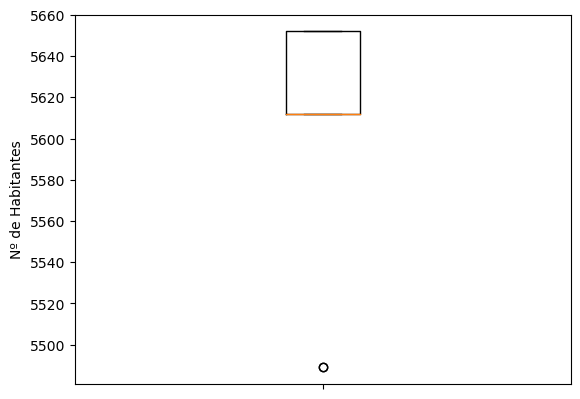

In [9]:
plt.boxplot(santa_maria['Habitantes']) #desenhar histograma
plt.xticks(ticks=[1],labels=['']) #definir nome dos eixos
plt.ylabel('Nº de Habitantes')

Para encontrar os outliers detetados iniciamente foi calculada a distância interquartil.

In [10]:
Q1 = santa_maria['Habitantes'].quantile(0.25) #encontrar os quartis
Q3 = santa_maria['Habitantes'].quantile(0.75)
IQR = Q3 - Q1 #calcular amplitude interquartil
inf = Q1 - 1.5 * IQR #calcular limite
outliers_inf = (santa_maria['Habitantes'] < inf)  #encontrar outliers
outliers = santa_maria[outliers_inf]

Text(0.5, 0, 'Timestamp')

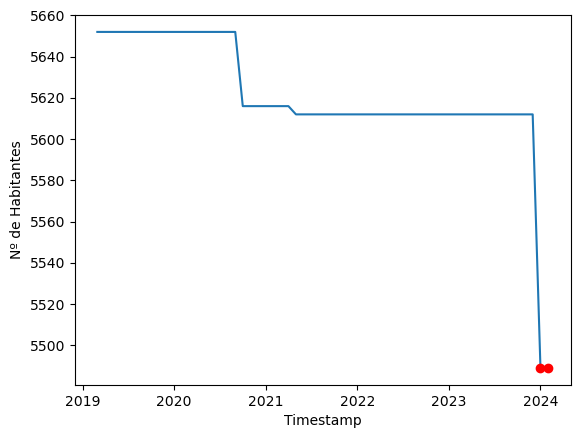

In [11]:
plt.plot(santa_maria['Habitantes']) #desenhar gráfico
plt.plot(outliers['Habitantes'], 'ro')
plt.ylabel('Nº de Habitantes') #definir nome dos eixos
plt.xlabel('Timestamp')

Dado que a diferença entre o número de habitantes ao longo do tempo é inferior a 5%, optou-se por considerar que os outliers não necessitam de correção.

Para verificar "visualmente" a existência de outliers foi realizado um histograma.

Text(0, 0.5, 'Nº de Consumidores')

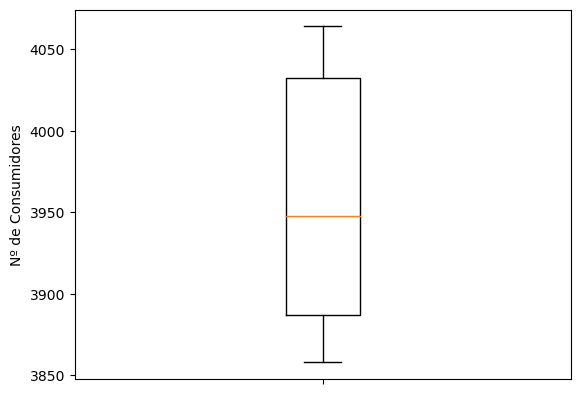

In [12]:
plt.boxplot(santa_maria['Consumidores']) #desenhar histograma
plt.xticks(ticks=[1],labels=['']) #definir nome dos eixos
plt.ylabel('Nº de Consumidores')

Não tendo sido detetatdos outliers, apenas se observou a variação dos dados ao longo do tempo.

Text(0.5, 0, 'Timestamp')

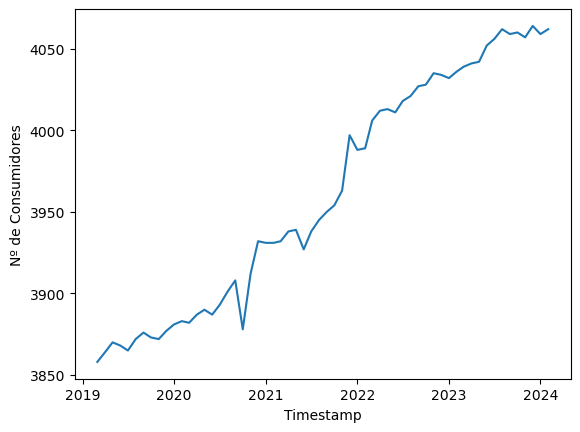

In [13]:
plt.plot(santa_maria['Consumidores']) #desenhar gráfico
plt.ylabel('Nº de Consumidores') #definir nome dos eixos
plt.xlabel('Timestamp')

É de salientar que, apesar de ter existido um decréscimo no número de habitantes, o número de consumidores tem aumentado ao longo do ano. Tal pode ser justificado pelo aumento de qualidade de vida e pelo envelhecimento da população: as pessoas mais idosas têm falecido e os jovens adultos têm saído de casa. Por outro lado, estando os Açores a surgir como um novo destino turístico, o número de casas para alugar tem aumentado.

#### 2.1.3. Emissão Energética

Para verificar a distribuição da origem da emissão elétrica em Santa Maria, foi criado um gráfico de setores.

(-1.0999999178861517,
 1.0999999960898168,
 -1.0999999748802818,
 1.0999998359603458)

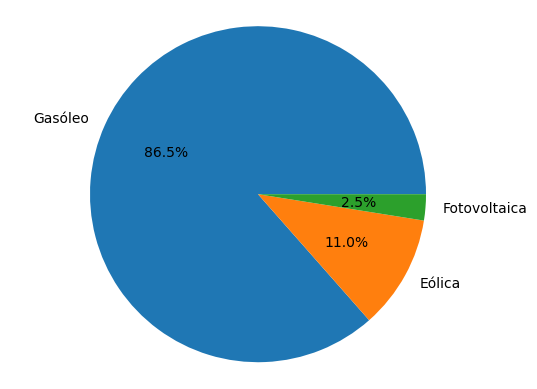

In [14]:
origem = santa_maria.drop(columns=['Mês', 'Ano', 'Ilha', 'Habitantes', 'Consumidores', 'Total']).sum() #somar ao longo dos anos
origem = origem[origem != 0] #eliminar resultados nulos
plt.pie(origem, labels=origem.index, autopct='%1.1f%%')
plt.axis('equal') 

#### 2.1.3.1. Gasóleo

Para verificar "visualmente" a existência de outliers foi realizado um histograma.

Text(0, 0.5, 'kW')

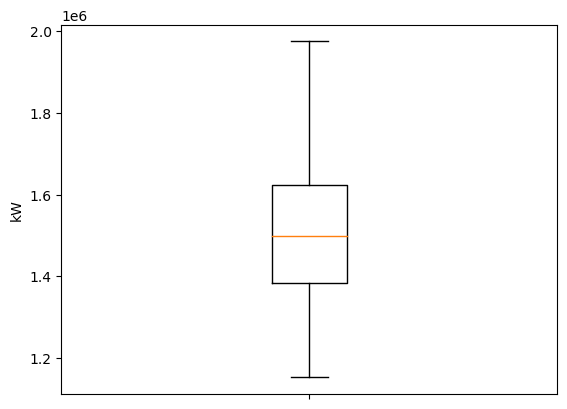

In [15]:
plt.boxplot(santa_maria['Gasóleo']) #desenhar histograma
plt.xticks(ticks=[1],labels=['']) #definir nome dos eixos
plt.ylabel('kW')

Não tendo sido detetatdos outliers, apenas se observou a variação dos dados ao longo do tempo.

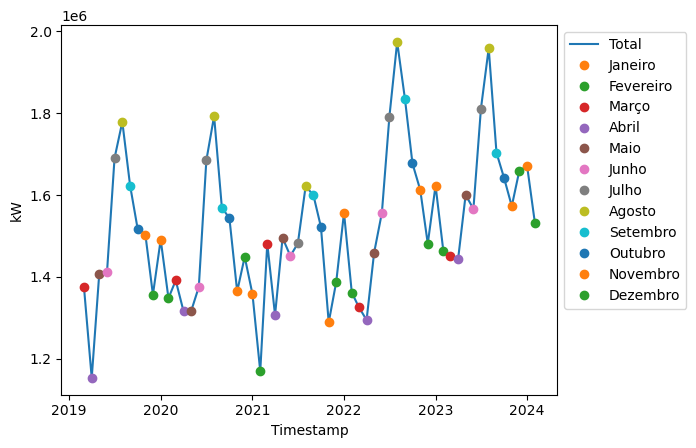

In [16]:
plt.plot(santa_maria['Gasóleo'], label='Total') #desenhar gráfico
plt.plot(janeiro['Gasóleo'], 'o', label='Janeiro')
plt.plot(fevereiro['Gasóleo'], 'o', label='Fevereiro')
plt.plot(marco['Gasóleo'], 'o', label='Março')
plt.plot(abril['Gasóleo'], 'o', label='Abril')
plt.plot(maio['Gasóleo'], 'o', label='Maio')
plt.plot(junho['Gasóleo'], 'o', label='Junho')
plt.plot(julho['Gasóleo'], 'o', label='Julho')
plt.plot(agosto['Gasóleo'], 'o', label='Agosto')
plt.plot(setembro['Gasóleo'], 'o', label='Setembro')
plt.plot(outubro['Gasóleo'], 'o', label='Outubro')
plt.plot(novembro['Gasóleo'], 'o', label='Novembro')
plt.plot(dezembro['Gasóleo'], 'o', label='Dezembro')
plt.ylabel('kW') #definir nome dos eixos
plt.xlabel('Timestamp')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')

É possível verificar uma perioricidade anual nos dados. O período de verão apresenta sempre um pico na emissão, sendo o mês de agosto o seu maximizante (muito provavelmente devido às elevadas temperaturas). Por outro lado, o período de primavera corresponde sempre a um vale, sendo o mês de abril o seu minimizante (muito provavelmente às temperaturas amenas).

#### 2.1.3.2. Eólica

Para verificar "visualmente" a existência de outliers foi realizado um histograma.

Text(0, 0.5, 'kW')

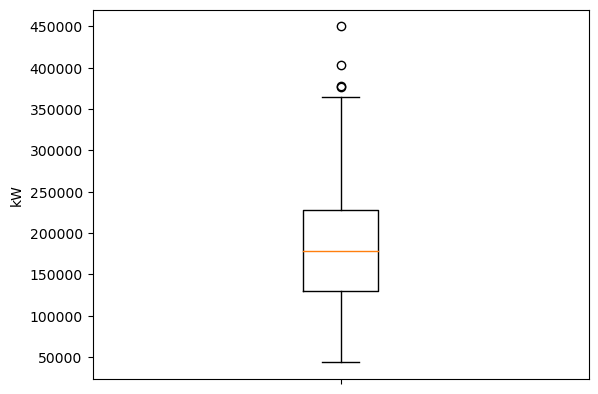

In [17]:
plt.boxplot(santa_maria['Eólica']) #desenhar histograma
plt.xticks(ticks=[1],labels=['']) #definir nome dos eixos
plt.ylabel('kW')

Para encontrar os outliers detetados iniciamente foi calculada a distância interquartil.

In [18]:
Q1 = santa_maria['Eólica'].quantile(0.25) #encontrar os quartis
Q3 = santa_maria['Eólica'].quantile(0.75)
IQR = Q3 - Q1 #calcular amplitude interquartil
sup = Q3 + 1.5 * IQR #calcular limite
outliers_sup = (santa_maria['Eólica'] > sup)  #encontrar outliers
outliers = santa_maria[outliers_sup]

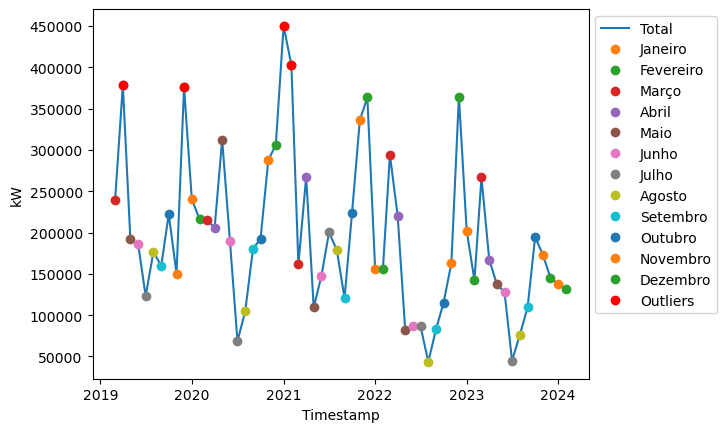

In [19]:
plt.plot(santa_maria['Eólica'], label='Total') #desenhar gráfico
plt.plot(janeiro['Eólica'], 'o', label='Janeiro')
plt.plot(fevereiro['Eólica'], 'o', label='Fevereiro')
plt.plot(marco['Eólica'], 'o', label='Março')
plt.plot(abril['Eólica'], 'o', label='Abril')
plt.plot(maio['Eólica'], 'o', label='Maio')
plt.plot(junho['Eólica'], 'o', label='Junho')
plt.plot(julho['Eólica'], 'o', label='Julho')
plt.plot(agosto['Eólica'], 'o', label='Agosto')
plt.plot(setembro['Eólica'], 'o', label='Setembro')
plt.plot(outubro['Eólica'], 'o', label='Outubro')
plt.plot(novembro['Eólica'], 'o', label='Novembro')
plt.plot(dezembro['Eólica'], 'o', label='Dezembro')
plt.plot(outliers['Eólica'], 'ro', label='Outliers')
plt.ylabel('kW') #definir nome dos eixos
plt.xlabel('Timestamp')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')

Dado que os outliers correspondem a meses (dezembro, janeiro e fevereiro) para os quais se verificam picos ao longos dos anos e nos quais se prevê ventos mais fortes e frequentes, optou-se por considerar que os outliers não necessitam de correção.

#### 2.1.3.3. Fotovoltaica

Para verificar "visualmente" a existência de outliers foi realizado um histograma.

Text(0, 0.5, 'kW')

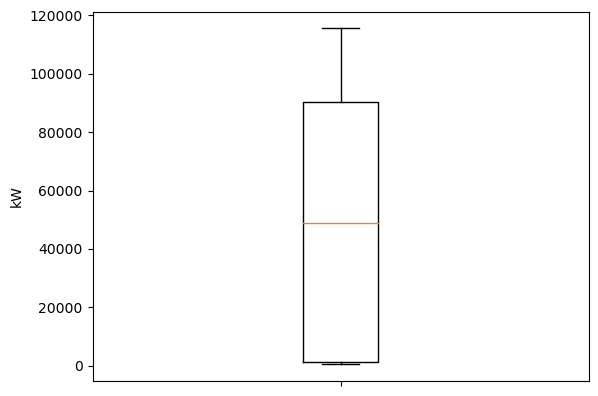

In [20]:
plt.boxplot(santa_maria['Fotovoltaica']) #desenhar histograma
plt.xticks(ticks=[1],labels=['']) #definir nome dos eixos
plt.ylabel('kW')

Não tendo sido detetatdos outliers, apenas se observou a variação dos dados ao longo do tempo.

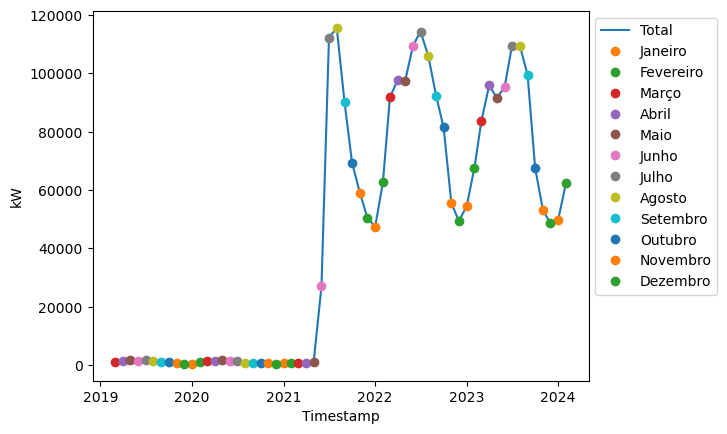

In [21]:
plt.plot(santa_maria['Fotovoltaica'], label='Total') #desenhar gráfico
plt.plot(janeiro['Fotovoltaica'], 'o', label='Janeiro')
plt.plot(fevereiro['Fotovoltaica'], 'o', label='Fevereiro')
plt.plot(marco['Fotovoltaica'], 'o', label='Março')
plt.plot(abril['Fotovoltaica'], 'o', label='Abril')
plt.plot(maio['Fotovoltaica'], 'o', label='Maio')
plt.plot(junho['Fotovoltaica'], 'o', label='Junho')
plt.plot(julho['Fotovoltaica'], 'o', label='Julho')
plt.plot(agosto['Fotovoltaica'], 'o', label='Agosto')
plt.plot(setembro['Fotovoltaica'], 'o', label='Setembro')
plt.plot(outubro['Fotovoltaica'], 'o', label='Outubro')
plt.plot(novembro['Fotovoltaica'], 'o', label='Novembro')
plt.plot(dezembro['Fotovoltaica'], 'o', label='Dezembro')
plt.ylabel('kW') #definir nome dos eixos
plt.xlabel('Timestamp')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')

Verificou-se que os primeiros paineis solares surgiram em junho de 2021, verificando-se, mais uma vez, uma perioricidade anual. O pico surge nos meses de verão (junho, julho e agosto), quando os dias são mais longos e solarengos. O vale surge nos meses de inverno (novembro, dezembro e janeiro), quando os dias são mais curtos e menos solarengos.

### 2.2. São Miguel

In [22]:
janeiro = sao_miguel[sao_miguel['Mês'] == 1] #separar os dados por mês
fevereiro = sao_miguel[sao_miguel['Mês'] == 2]
marco = sao_miguel[sao_miguel['Mês'] == 3]
abril = sao_miguel[sao_miguel['Mês'] == 4]
maio = sao_miguel[sao_miguel['Mês'] == 5]
junho = sao_miguel[sao_miguel['Mês'] == 6]
julho = sao_miguel[sao_miguel['Mês'] == 7]
agosto = sao_miguel[sao_miguel['Mês'] == 8]
setembro = sao_miguel[sao_miguel['Mês'] == 9]
outubro = sao_miguel[sao_miguel['Mês'] == 10]
novembro = sao_miguel[sao_miguel['Mês'] == 11]
dezembro = sao_miguel[sao_miguel['Mês'] == 12]

#### 2.2.1. Estatística

Inicialmente optou-se por estudar os dados no geral, calculando a média, desvio padrão, mínimo, máximo e quartis.

In [23]:
sao_miguel.describe() #calcular alguns valores estatísticos da dataframe

,Mês,Ano,Habitantes,Consumidores,Fuelóleo,Gasóleo,Hídrica,Geotérmica,Eólica,Fotovoltaica,Resíduos,Outras Renováveis,Total
count,60.000000,60.000000,60.000000,60.000000,6.000000e+01,60.000000,6.000000e+01,6.000000e+01,6.000000e+01,60.000000,60.0,60.000000,6.000000e+01
mean,6.500000,2021.166667,137449.033333,65716.183333,2.044195e+07,6509.900000,2.083861e+06,1.317398e+07,1.345161e+06,31846.100000,0.0,66850.266667,3.715016e+07
std,3.481184,1.474836,585.618548,1079.185215,3.999141e+06,3136.559195,3.202691e+05,3.056436e+06,4.571208e+05,13901.737889,0.0,31494.035039,2.290637e+06
min,1.000000,2019.000000,135745.000000,64003.000000,1.276227e+07,40.000000,1.214994e+06,3.731818e+06,1.931010e+05,10218.000000,0.0,39.000000,3.123311e+07
25%,3.750000,2020.000000,137133.000000,64623.000000,1.743634e+07,4332.500000,1.930306e+06,1.276455e+07,9.854092e+05,21471.750000,0.0,51162.000000,3.555822e+07
50%,6.500000,2021.000000,137133.000000,65791.000000,1.972130e+07,6027.000000,2.088368e+06,1.426749e+07,1.328240e+06,30580.000000,0.0,58260.500000,3.715238e+07
75%,9.250000,2022.000000,138213.000000,66662.500000,2.193707e+07,7953.500000,2.311776e+06,1.497988e+07,1.618628e+06,38031.500000,0.0,77686.000000,3.862568e+07
max,12.000000,2024.000000,138213.000000,67601.000000,3.185987e+07,14333.000000,2.675029e+06,1.599038e+07,2.328651e+06,75959.000000,0.0,150215.000000,4.254615e+07


#### 2.2.2. Habitantes e Consumidores

Para verificar "visualmente" a existência de outliers foi realizado um histograma.

Text(0, 0.5, 'Nº de Habitantes')

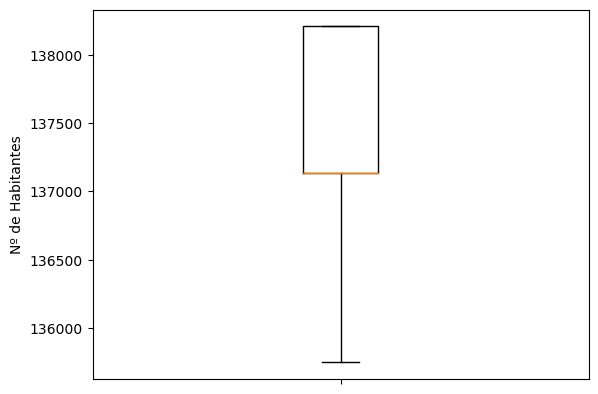

In [24]:
plt.boxplot(sao_miguel['Habitantes']) #desenhar histograma
plt.xticks(ticks=[1],labels=['']) #definir nome dos eixos
plt.ylabel('Nº de Habitantes')

Não tendo sido detetatdos outliers, apenas se observou a variação dos dados ao longo do tempo.

Text(0.5, 0, 'Timestamp')

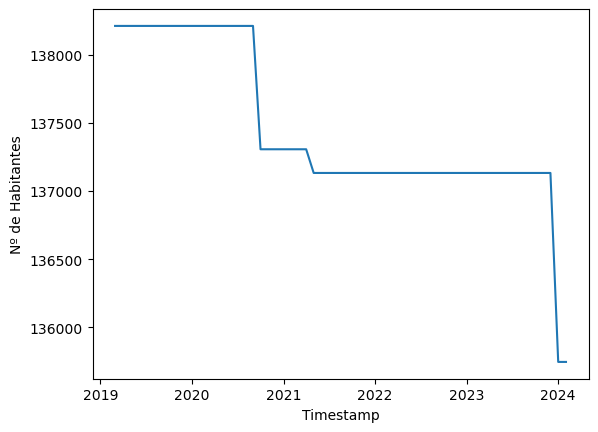

In [25]:
plt.plot(sao_miguel['Habitantes']) #desenhar gráfico
plt.ylabel('Nº de Habitantes') #definir nome dos eixos
plt.xlabel('Timestamp')

Para verificar "visualmente" a existência de outliers foi realizado um histograma.

Text(0, 0.5, 'Nº de Consumidores')

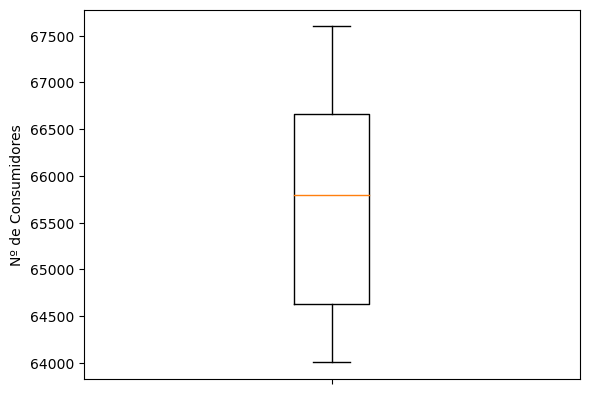

In [26]:
plt.boxplot(sao_miguel['Consumidores']) #desenhar histograma
plt.xticks(ticks=[1],labels=['']) #definir nome dos eixos
plt.ylabel('Nº de Consumidores')

Não tendo sido detetatdos outliers, apenas se observou a variação dos dados ao longo do tempo.

Text(0.5, 0, 'Timestamp')

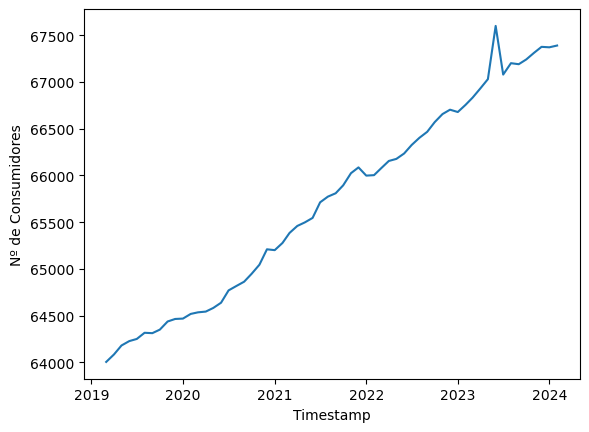

In [27]:
plt.plot(sao_miguel['Consumidores']) #desenhar gráfico
plt.ylabel('Nº de Consumidores') #definir nome dos eixos
plt.xlabel('Timestamp')

É de salientar que, apesar de ter existido um decréscimo no número de habitantes, o número de consumidores tem aumentado ao longo do ano. Tal pode ser justificado pelo aumento de qualidade de vida ou envelhecimento da população: as pessoas mais idosas têm falecido e os jovens adultos têm saído de casa. Por outro lado, estando os Açores a surgir como um novo destino turístico, o número de casas para alugar tem aumentado.

#### 2.2.3. Emissão Energética

Para verificar a distribuição da origem da emissão elétrica em São Miguel, foi criado um gráfico de setores.

(-1.0999995911736447,
 1.0999999805320784,
 -1.0999967209778576,
 1.0999991759712275)

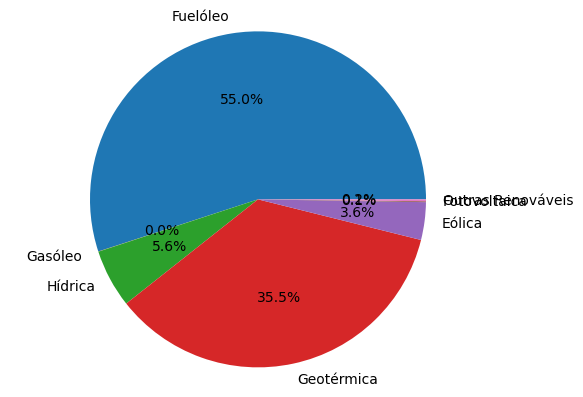

In [28]:
origem = sao_miguel.drop(columns=['Mês', 'Ano', 'Ilha', 'Habitantes', 'Consumidores', 'Total']).sum() #somar ao longo dos anos
origem = origem[origem != 0] #eliminar resultados nulos
plt.pie(origem, labels=origem.index, autopct='%1.1f%%')
plt.axis('equal')

#### 2.2.3.1. Fuelóleo

Para verificar "visualmente" a existência de outliers foi realizado um histograma.

Text(0, 0.5, 'kW')

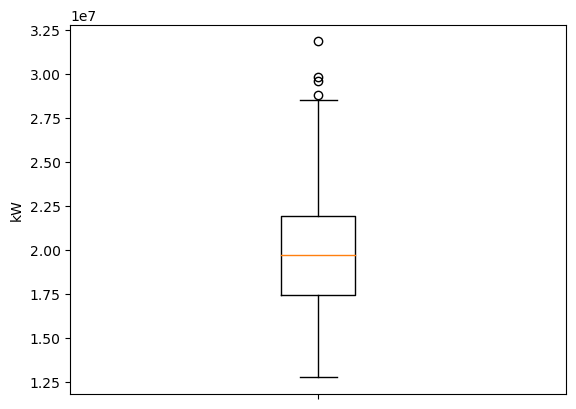

In [29]:
plt.boxplot(sao_miguel['Fuelóleo']) #desenhar histograma
plt.xticks(ticks=[1],labels=['']) #definir nome dos eixos
plt.ylabel('kW')

Para encontrar os outliers detetados iniciamente foi calculada a distância interquartil.

In [30]:
Q1 = sao_miguel['Fuelóleo'].quantile(0.25) #encontrar os quartis
Q3 = sao_miguel['Fuelóleo'].quantile(0.75)
IQR = Q3 - Q1 #calcular amplitude interquartil
sup = Q3 + 1.5 * IQR #calcular limite
outliers_sup = (sao_miguel['Fuelóleo'] > sup)  #encontrar outliers
outliers = sao_miguel[outliers_sup]

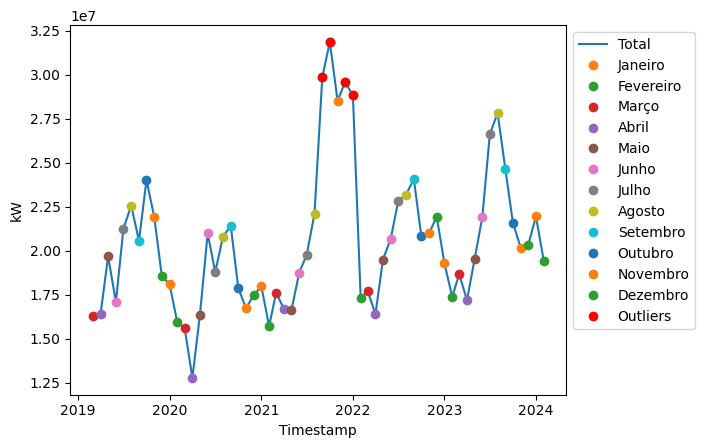

In [31]:
plt.plot(sao_miguel['Fuelóleo'], label='Total') #desenhar gráfico
plt.plot(janeiro['Fuelóleo'], 'o', label='Janeiro')
plt.plot(fevereiro['Fuelóleo'], 'o', label='Fevereiro')
plt.plot(marco['Fuelóleo'], 'o', label='Março')
plt.plot(abril['Fuelóleo'], 'o', label='Abril')
plt.plot(maio['Fuelóleo'], 'o', label='Maio')
plt.plot(junho['Fuelóleo'], 'o', label='Junho')
plt.plot(julho['Fuelóleo'], 'o', label='Julho')
plt.plot(agosto['Fuelóleo'], 'o', label='Agosto')
plt.plot(setembro['Fuelóleo'], 'o', label='Setembro')
plt.plot(outubro['Fuelóleo'], 'o', label='Outubro')
plt.plot(novembro['Fuelóleo'], 'o', label='Novembro')
plt.plot(dezembro['Fuelóleo'], 'o', label='Dezembro')
plt.plot(outliers['Fuelóleo'], 'ro', label='Outliers')
plt.ylabel('kW') #definir nome dos eixos
plt.xlabel('Timestamp')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')

Os outliers correspondem realmente a valores atípicos, justificados pelo facto de algumas centrais geotérmicas terem sofrido avarias ou não estarem disponíveis, tendo sido necessário usar mais fuseóleo para compensar. Assim, torna-se necessário corrígi-los por valores mais apropriados, tendo-se utilizado a médias dos cinco anos nesses meses. Optou-se também por corrigir o valor de novembro de 2021.

In [32]:
indice = sao_miguel[(sao_miguel['Mês']==9) & (sao_miguel['Ano']==2021)].index
valores = sao_miguel[(sao_miguel['Mês']==9) & (sao_miguel['Ano']!=2021)]['Fuelóleo']
setembro_novo = valores.mean()
sao_miguel.loc[indice, 'Fuelóleo'] = setembro_novo
indice = sao_miguel[(sao_miguel['Mês']==10) & (sao_miguel['Ano']==2021)].index
valores = sao_miguel[(sao_miguel['Mês']==10) & (sao_miguel['Ano']!=2021)]['Fuelóleo']
outubro_novo = valores.mean()
sao_miguel.loc[indice, 'Fuelóleo'] = outubro_novo
indice = sao_miguel[(sao_miguel['Mês']==11) & (sao_miguel['Ano']==2021)].index
valores = sao_miguel[(sao_miguel['Mês']==11) & (sao_miguel['Ano']!=2021)]['Fuelóleo']
novembro_novo = valores.mean()
sao_miguel.loc[indice, 'Fuelóleo'] = novembro_novo
indice = sao_miguel[(sao_miguel['Mês']==12) & (sao_miguel['Ano']==2021)].index
valores = sao_miguel[(sao_miguel['Mês']==12) & (sao_miguel['Ano']!=2021)]['Fuelóleo']
dezembro_novo = valores.mean()
sao_miguel.loc[indice, 'Fuelóleo'] = dezembro_novo
indice = sao_miguel[(sao_miguel['Mês']==1) & (sao_miguel['Ano']==2022)].index
valores = sao_miguel[(sao_miguel['Mês']==1) & (sao_miguel['Ano']!=2022)]['Fuelóleo']
janeiro_novo = valores.mean()
sao_miguel.loc[indice, 'Fuelóleo'] = janeiro_novo

#### 2.2.3.2. Gasóleo

Para verificar "visualmente" a existência de outliers foi realizado um histograma.

Text(0, 0.5, 'kW')

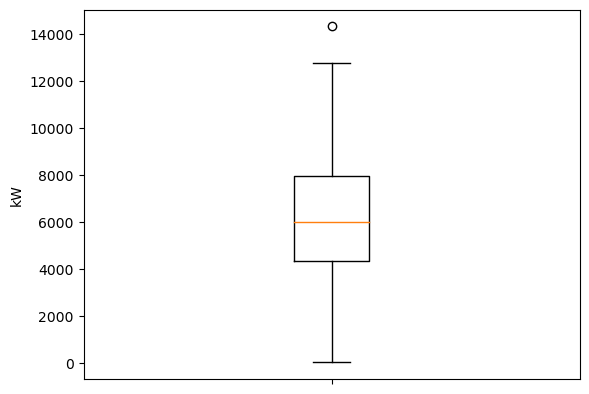

In [33]:
plt.boxplot(sao_miguel['Gasóleo']) #desenhar histograma
plt.xticks(ticks=[1],labels=['']) #definir nome dos eixos
plt.ylabel('kW')

Para encontrar os outliers detetados iniciamente foi calculada a distância interquartil.

In [34]:
Q1 = sao_miguel['Gasóleo'].quantile(0.25) #encontrar os quartis
Q3 = sao_miguel['Gasóleo'].quantile(0.75)
IQR = Q3 - Q1 #calcular amplitude interquartil
sup = Q3 + 1.5 * IQR #calcular limite
outliers_sup = (sao_miguel['Gasóleo'] > sup)  #encontrar outliers
outliers = sao_miguel[outliers_sup]

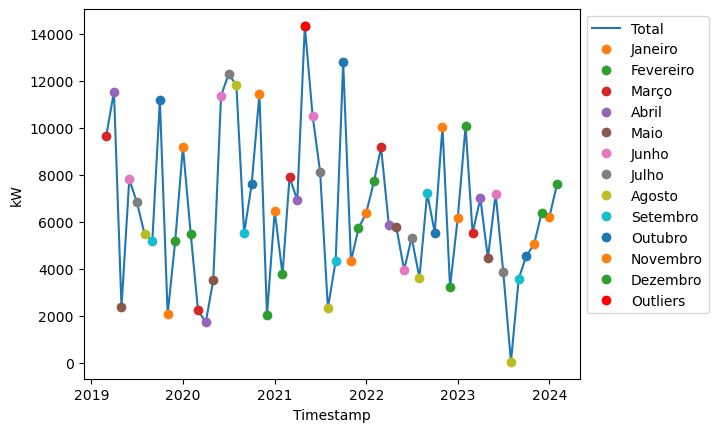

In [35]:
plt.plot(sao_miguel['Gasóleo'], label='Total') #desenhar gráfico
plt.plot(janeiro['Gasóleo'], 'o', label='Janeiro')
plt.plot(fevereiro['Gasóleo'], 'o', label='Fevereiro')
plt.plot(marco['Gasóleo'], 'o', label='Março')
plt.plot(abril['Gasóleo'], 'o', label='Abril')
plt.plot(maio['Gasóleo'], 'o', label='Maio')
plt.plot(junho['Gasóleo'], 'o', label='Junho')
plt.plot(julho['Gasóleo'], 'o', label='Julho')
plt.plot(agosto['Gasóleo'], 'o', label='Agosto')
plt.plot(setembro['Gasóleo'], 'o', label='Setembro')
plt.plot(outubro['Gasóleo'], 'o', label='Outubro')
plt.plot(novembro['Gasóleo'], 'o', label='Novembro')
plt.plot(dezembro['Gasóleo'], 'o', label='Dezembro')
plt.plot(outliers['Gasóleo'], 'ro', label='Outliers')
plt.ylabel('kW') #definir nome dos eixos
plt.xlabel('Timestamp')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')

Dado que a emissaõ de gasóleo ao longo dos anos parece ser aleatória e, uma vez que a diferença para os restantes valores não é significativa, optou-se por considerar que o outlier não necessita de correção.

#### 2.2.3.3. Hídrica

Para verificar "visualmente" a existência de outliers foi realizado um histograma.

Text(0, 0.5, 'kW')

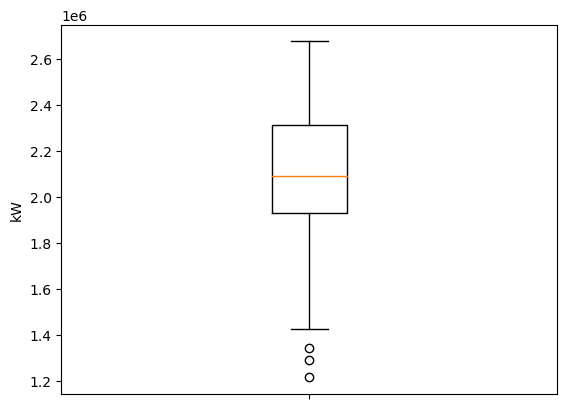

In [36]:
plt.boxplot(sao_miguel['Hídrica']) #desenhar histograma
plt.xticks(ticks=[1],labels=['']) #definir nome dos eixos
plt.ylabel('kW')

Para encontrar os outliers detetados iniciamente foi calculada a distância interquartil.

In [37]:
Q1 = sao_miguel['Hídrica'].quantile(0.25) #encontrar os quartis
Q3 = sao_miguel['Hídrica'].quantile(0.75)
IQR = Q3 - Q1 #calcular amplitude interquartil
inf = Q1 - 1.5 * IQR #calcular limite
outliers_inf = (sao_miguel['Hídrica'] < inf)  #encontrar outliers
outliers = sao_miguel[outliers_inf]

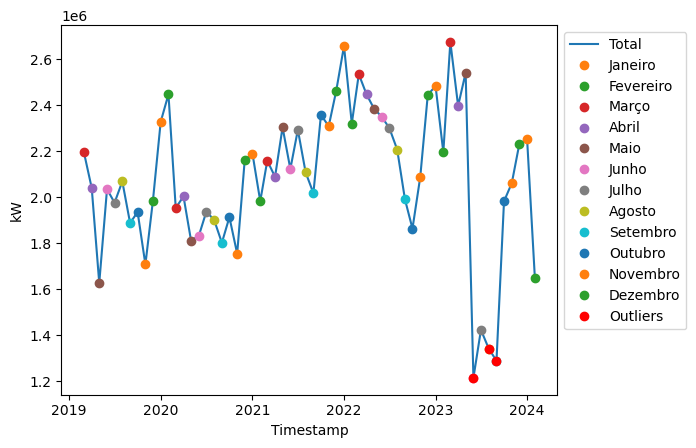

In [38]:
plt.plot(sao_miguel['Hídrica'], label='Total') #desenhar gráfico
plt.plot(janeiro['Hídrica'], 'o', label='Janeiro')
plt.plot(fevereiro['Hídrica'], 'o', label='Fevereiro')
plt.plot(marco['Hídrica'], 'o', label='Março')
plt.plot(abril['Hídrica'], 'o', label='Abril')
plt.plot(maio['Hídrica'], 'o', label='Maio')
plt.plot(junho['Hídrica'], 'o', label='Junho')
plt.plot(julho['Hídrica'], 'o', label='Julho')
plt.plot(agosto['Hídrica'], 'o', label='Agosto')
plt.plot(setembro['Hídrica'], 'o', label='Setembro')
plt.plot(outubro['Hídrica'], 'o', label='Outubro')
plt.plot(novembro['Hídrica'], 'o', label='Novembro')
plt.plot(dezembro['Hídrica'], 'o', label='Dezembro')
plt.plot(outliers['Hídrica'], 'ro', label='Outliers')
plt.ylabel('kW') #definir nome dos eixos
plt.xlabel('Timestamp')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')

Os outliers correspondem realmente a valores atípicos, justificados pelo facto de algumas centrais hídricas terem sofrido avarias ou não estarem disponíveis.. Assim, torna-se necessário corrígi-los por valores mais apropriados, tendo-se utilizado a médias dos cinco anos nesses meses. Optou-se também por corrigir o valor de julho de 2023.

In [39]:
indice = sao_miguel[(sao_miguel['Mês']==6) & (sao_miguel['Ano']==2023)].index
valores = sao_miguel[(sao_miguel['Mês']==6) & (sao_miguel['Ano']!=2023)]['Hídrica']
junho_novo = valores.mean()
sao_miguel.loc[indice, 'Hídrica'] = junho_novo
indice = sao_miguel[(sao_miguel['Mês']==7) & (sao_miguel['Ano']==2023)].index
valores = sao_miguel[(sao_miguel['Mês']==7) & (sao_miguel['Ano']!=2023)]['Hídrica']
julho_novo = valores.mean()
sao_miguel.loc[indice, 'Hídrica'] = julho_novo
indice = sao_miguel[(sao_miguel['Mês']==8) & (sao_miguel['Ano']==2023)].index
valores = sao_miguel[(sao_miguel['Mês']==8) & (sao_miguel['Ano']!=2023)]['Hídrica']
agosto_novo = valores.mean()
sao_miguel.loc[indice, 'Hídrica'] = agosto_novo
indice = sao_miguel[(sao_miguel['Mês']==9) & (sao_miguel['Ano']==2023)].index
valores = sao_miguel[(sao_miguel['Mês']==9) & (sao_miguel['Ano']!=2023)]['Hídrica']
setembro_novo = valores.mean()
sao_miguel.loc[indice, 'Hídrica'] = setembro_novo

#### 2.2.3.4. Geotérmica

Para verificar "visualmente" a existência de outliers foi realizado um histograma.

Text(0, 0.5, 'kW')

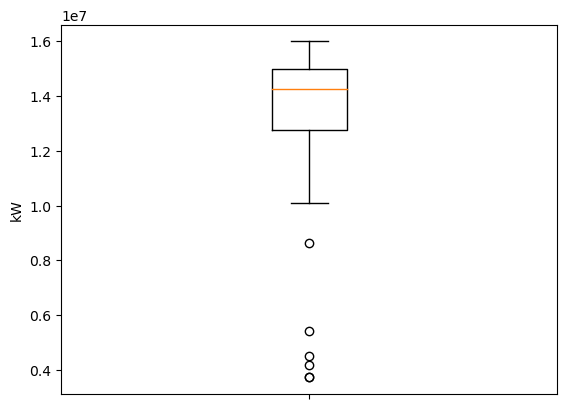

In [40]:
plt.boxplot(sao_miguel['Geotérmica']) #desenhar histograma
plt.xticks(ticks=[1],labels=['']) #definir nome dos eixos
plt.ylabel('kW')

Para encontrar os outliers detetados iniciamente foi calculada a distância interquartil.

In [41]:
Q1 = sao_miguel['Geotérmica'].quantile(0.25) #encontrar os quartis
Q3 = sao_miguel['Geotérmica'].quantile(0.75)
IQR = Q3 - Q1 #calcular amplitude interquartil
inf = Q1 - 1.5 * IQR #calcular limite
outliers_inf = (sao_miguel['Geotérmica'] < inf)  #encontrar outliers
outliers = sao_miguel[outliers_inf]

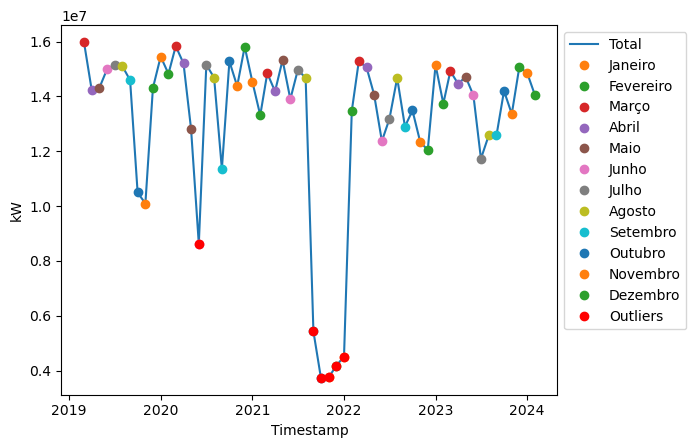

In [42]:
plt.plot(sao_miguel['Geotérmica'], label='Total') #desenhar gráfico
plt.plot(janeiro['Geotérmica'], 'o', label='Janeiro')
plt.plot(fevereiro['Geotérmica'], 'o', label='Fevereiro')
plt.plot(marco['Geotérmica'], 'o', label='Março')
plt.plot(abril['Geotérmica'], 'o', label='Abril')
plt.plot(maio['Geotérmica'], 'o', label='Maio')
plt.plot(junho['Geotérmica'], 'o', label='Junho')
plt.plot(julho['Geotérmica'], 'o', label='Julho')
plt.plot(agosto['Geotérmica'], 'o', label='Agosto')
plt.plot(setembro['Geotérmica'], 'o', label='Setembro')
plt.plot(outubro['Geotérmica'], 'o', label='Outubro')
plt.plot(novembro['Geotérmica'], 'o', label='Novembro')
plt.plot(dezembro['Geotérmica'], 'o', label='Dezembro')
plt.plot(outliers['Geotérmica'], 'ro', label='Outliers')
plt.ylabel('kW') #definir nome dos eixos
plt.xlabel('Timestamp')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')

Dado a proximidade entre o valor de junho de 2020 e os restantes valores, optou-se por considerar que o outlier não necessita de correção. Por outro lado, os outliers entre setembro de 2021 2 janeiro de 2022 correspondem realmente a valores atípicos, justificados pelo facto de algumas centrais terem sofrido avarias ou não estarem disponíveis. Assim, torna-se necessário corrígi-los por valores mais apropriados, tendo-se utilizado a médias dos cinco anos nesses meses.

In [43]:
indice = sao_miguel[(sao_miguel['Mês']==9) & (sao_miguel['Ano']==2021)].index
valores = sao_miguel[(sao_miguel['Mês']==9) & (sao_miguel['Ano']!=2021)]['Geotérmica']
setembro_novo = valores.mean()
sao_miguel.loc[indice, 'Geotérmica'] = setembro_novo
indice = sao_miguel[(sao_miguel['Mês']==10) & (sao_miguel['Ano']==2021)].index
valores = sao_miguel[(sao_miguel['Mês']==10) & (sao_miguel['Ano']!=2021)]['Geotérmica']
outubro_novo = valores.mean()
sao_miguel.loc[indice, 'Geotérmica'] = outubro_novo
indice = sao_miguel[(sao_miguel['Mês']==11) & (sao_miguel['Ano']==2021)].index
valores = sao_miguel[(sao_miguel['Mês']==11) & (sao_miguel['Ano']!=2021)]['Geotérmica']
novembro_novo = valores.mean()
sao_miguel.loc[indice, 'Geotérmica'] = novembro_novo
indice = sao_miguel[(sao_miguel['Mês']==12) & (sao_miguel['Ano']==2021)].index
valores = sao_miguel[(sao_miguel['Mês']==12) & (sao_miguel['Ano']!=2021)]['Geotérmica']
dezembro_novo = valores.mean()
sao_miguel.loc[indice, 'Geotérmica'] = dezembro_novo
indice = sao_miguel[(sao_miguel['Mês']==1) & (sao_miguel['Ano']==2022)].index
valores = sao_miguel[(sao_miguel['Mês']==1) & (sao_miguel['Ano']!=2022)]['Geotérmica']
janeiro_novo = valores.mean()
sao_miguel.loc[indice, 'Geotérmica'] = janeiro_novo

#### 2.2.3.5. Eólica

Para verificar "visualmente" a existência de outliers foi realizado um histograma.

Text(0, 0.5, 'kW')

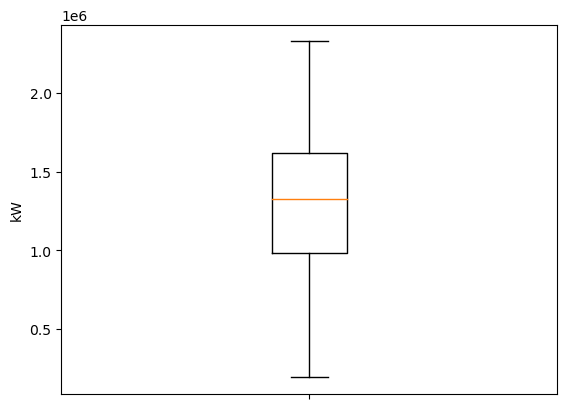

In [44]:
plt.boxplot(sao_miguel['Eólica']) #desenhar histograma
plt.xticks(ticks=[1],labels=['']) #definir nome dos eixos
plt.ylabel('kW')

Não tendo sido detetatdos outliers, apenas se observou a variação dos dados ao longo do tempo.

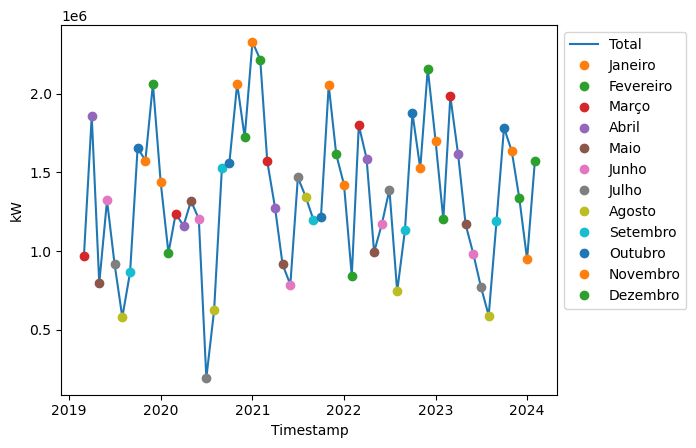

In [45]:
plt.plot(sao_miguel['Eólica'], label='Total') #desenhar gráfico
plt.plot(janeiro['Eólica'], 'o', label='Janeiro')
plt.plot(fevereiro['Eólica'], 'o', label='Fevereiro')
plt.plot(marco['Eólica'], 'o', label='Março')
plt.plot(abril['Eólica'], 'o', label='Abril')
plt.plot(maio['Eólica'], 'o', label='Maio')
plt.plot(junho['Eólica'], 'o', label='Junho')
plt.plot(julho['Eólica'], 'o', label='Julho')
plt.plot(agosto['Eólica'], 'o', label='Agosto')
plt.plot(setembro['Eólica'], 'o', label='Setembro')
plt.plot(outubro['Eólica'], 'o', label='Outubro')
plt.plot(novembro['Eólica'], 'o', label='Novembro')
plt.plot(dezembro['Eólica'], 'o', label='Dezembro')
plt.ylabel('kW') #definir nome dos eixos
plt.xlabel('Timestamp')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')

Apesar de ser mais dificíl encontrar uma perioricidade anual, é possível verificar que nos meses de inverno (novembro, dezembro e janeiro) os valores são superiores devido aos ventos serem mais frequentes e fortes. Enquanto que, nos meses de verão (junho, julho e agosto) os valores são inferiores devido aos vents serem menos frequentes e mais fracos.

#### 2.2.3.6. Fotovoltaica

Para verificar "visualmente" a existência de outliers foi realizado um histograma.

Text(0, 0.5, 'kW')

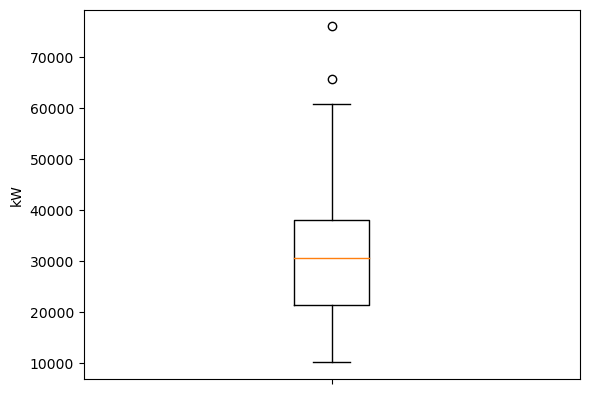

In [46]:
plt.boxplot(sao_miguel['Fotovoltaica']) #desenhar histograma
plt.xticks(ticks=[1],labels=['']) #definir nome dos eixos
plt.ylabel('kW')

Para encontrar os outliers detetados iniciamente foi calculada a distância interquartil.

In [47]:
Q1 = sao_miguel['Fotovoltaica'].quantile(0.25) #encontrar os quartis
Q3 = sao_miguel['Fotovoltaica'].quantile(0.75)
IQR = Q3 - Q1 #calcular amplitude interquartil
sup = Q3 + 1.5 * IQR #calcular limite
outliers_sup = (sao_miguel['Fotovoltaica'] > sup)  #encontrar outliers
outliers = sao_miguel[outliers_sup]

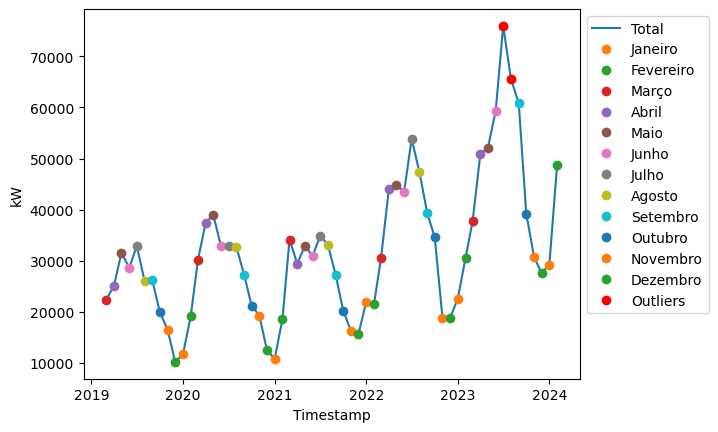

In [48]:
plt.plot(sao_miguel['Fotovoltaica'], label='Total') #desenhar gráfico
plt.plot(janeiro['Fotovoltaica'], 'o', label='Janeiro')
plt.plot(fevereiro['Fotovoltaica'], 'o', label='Fevereiro')
plt.plot(marco['Fotovoltaica'], 'o', label='Março')
plt.plot(abril['Fotovoltaica'], 'o', label='Abril')
plt.plot(maio['Fotovoltaica'], 'o', label='Maio')
plt.plot(junho['Fotovoltaica'], 'o', label='Junho')
plt.plot(julho['Fotovoltaica'], 'o', label='Julho')
plt.plot(agosto['Fotovoltaica'], 'o', label='Agosto')
plt.plot(setembro['Fotovoltaica'], 'o', label='Setembro')
plt.plot(outubro['Fotovoltaica'], 'o', label='Outubro')
plt.plot(novembro['Fotovoltaica'], 'o', label='Novembro')
plt.plot(dezembro['Fotovoltaica'], 'o', label='Dezembro')
plt.plot(outliers['Fotovoltaica'], 'ro', label='Outliers')
plt.ylabel('kW') #definir nome dos eixos
plt.xlabel('Timestamp')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')

Dado que a emissão de energia fotovoltaica tem aumentado ao longo dos anos devido ao investimento na instalação de novos painéis, considerou-se que esta evoluçãoestá de acordo com a realidade, tendo-se optado por considerar que os outliers não necessitam de correção. Mais uma vez, existe uma perioricidade anual. O pico surge nos meses de verão (maio, junho, julho e agosto), quando os dias são mais longos e solarengos. O vale surge nos meses de inverno (novembro, dezembro, janeiro e fevereiro), quando os dias são mais curtos e menos solarengos.

#### 2.2.3.7. Outras Renováveis

Para verificar "visualmente" a existência de outliers foi realizado um histograma.

Text(0, 0.5, 'kW')

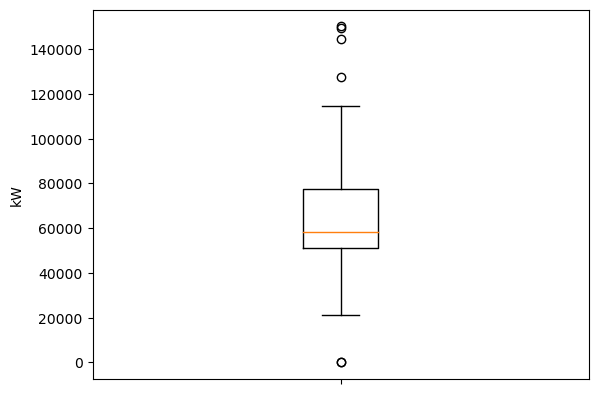

In [49]:
plt.boxplot(sao_miguel['Outras Renováveis']) #desenhar histograma
plt.xticks(ticks=[1],labels=['']) #definir nome dos eixos
plt.ylabel('kW')

Para encontrar os outliers detetados iniciamente foi calculada a distância interquartil.

In [50]:
Q1 = sao_miguel['Outras Renováveis'].quantile(0.25) #encontrar os quartis
Q3 = sao_miguel['Outras Renováveis'].quantile(0.75)
IQR = Q3 - Q1 #calcular amplitude interquartil
sup = Q3 + 1.5 * IQR #calcular limite
inf = Q1 - 1.5 * IQR
outliers_sup = (sao_miguel['Outras Renováveis'] > sup)  #encontrar outliers
outliers_s = sao_miguel[outliers_sup]
outliers_inf = (sao_miguel['Outras Renováveis'] < inf)
outliers_i = sao_miguel[outliers_inf]
outliers = pd.concat([outliers_s, outliers_i])

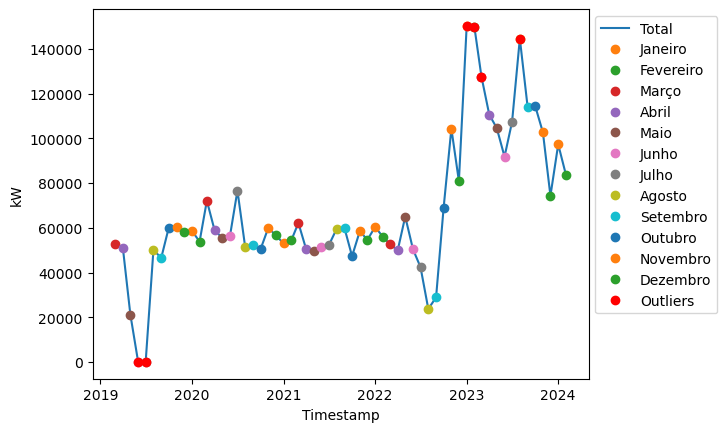

In [51]:
plt.plot(sao_miguel['Outras Renováveis'], label='Total') #desenhar gráfico
plt.plot(janeiro['Outras Renováveis'], 'o', label='Janeiro')
plt.plot(fevereiro['Outras Renováveis'], 'o', label='Fevereiro')
plt.plot(marco['Outras Renováveis'], 'o', label='Março')
plt.plot(abril['Outras Renováveis'], 'o', label='Abril')
plt.plot(maio['Outras Renováveis'], 'o', label='Maio')
plt.plot(junho['Outras Renováveis'], 'o', label='Junho')
plt.plot(julho['Outras Renováveis'], 'o', label='Julho')
plt.plot(agosto['Outras Renováveis'], 'o', label='Agosto')
plt.plot(setembro['Outras Renováveis'], 'o', label='Setembro')
plt.plot(outubro['Outras Renováveis'], 'o', label='Outubro')
plt.plot(novembro['Outras Renováveis'], 'o', label='Novembro')
plt.plot(dezembro['Outras Renováveis'], 'o', label='Dezembro')
plt.plot(outliers['Outras Renováveis'], 'ro', label='Outliers')
plt.ylabel('kW') #definir nome dos eixos
plt.xlabel('Timestamp')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')

Os valores referentes à emissão elétrica com origem noutras fontes renováveis que não as indicadas em cima têm uma elevada dependência nos testes e experimentos levados a cabo ao longo dos anos, tais como a utilização de biomassa ou correntes oceânicas. Nos últimos anos tem se verificado um aumento, dado que é uma área de grande interesse.
Assim, e dado a pequena percentagem que este tipo de origem representa, optou-se por não fazer correções.

### 2.3. Terceira

In [52]:
janeiro = terceira[terceira['Mês'] == 1] #separar os dados por mês
fevereiro = terceira[terceira['Mês'] == 2]
marco = terceira[terceira['Mês'] == 3]
abril = terceira[terceira['Mês'] == 4]
maio = terceira[terceira['Mês'] == 5]
junho = terceira[terceira['Mês'] == 6]
julho = terceira[terceira['Mês'] == 7]
agosto = terceira[terceira['Mês'] == 8]
setembro = terceira[terceira['Mês'] == 9]
outubro = terceira[terceira['Mês'] == 10]
novembro = terceira[terceira['Mês'] == 11]
dezembro = terceira[terceira['Mês'] == 12]

#### 2.3.1. Estatística

Inicialmente optou-se por estudar os dados no geral, calculando a média, desvio padrão, mínimo, máximo e quartis.

In [53]:
terceira.describe() #calcular alguns valores estatísticos da dataframe

,Mês,Ano,Habitantes,Consumidores,Fuelóleo,Gasóleo,Hídrica,Geotérmica,Eólica,Fotovoltaica,Resíduos,Outras Renováveis,Total
count,60.000000,60.000000,60.000000,60.000000,6.000000e+01,60.000000,60.000000,6.000000e+01,6.000000e+01,60.000000,6.000000e+01,60.0,6.000000e+01
mean,6.500000,2021.166667,55260.316667,28198.516667,1.035447e+07,39569.666667,140931.816667,1.792103e+06,2.611474e+06,8122.716667,1.037119e+06,0.0,1.598379e+07
std,3.481184,1.474836,657.150048,411.316180,1.295557e+06,78764.111657,154364.997390,4.263180e+05,7.738756e+05,5406.566867,3.709966e+05,0.0,8.419409e+05
min,1.000000,2019.000000,53552.000000,27546.000000,7.671010e+06,811.000000,0.000000,5.376850e+05,8.474760e+05,2033.000000,0.000000e+00,0.0,1.381940e+07
25%,3.750000,2020.000000,54874.000000,27785.750000,9.422604e+06,7173.250000,5703.000000,1.595553e+06,2.144496e+06,4288.250000,8.752015e+05,0.0,1.538123e+07
50%,6.500000,2021.000000,54874.000000,28233.500000,1.025585e+07,18362.000000,82228.000000,1.831102e+06,2.637095e+06,6864.000000,1.210266e+06,0.0,1.599019e+07
75%,9.250000,2022.000000,56141.000000,28528.500000,1.109674e+07,37496.500000,256965.250000,2.056646e+06,3.046617e+06,9896.750000,1.319428e+06,0.0,1.660746e+07
max,12.000000,2024.000000,56141.000000,28883.000000,1.367458e+07,513710.000000,519178.000000,2.573416e+06,4.602051e+06,26092.000000,1.462908e+06,0.0,1.794345e+07


#### 2.3.2. Habitantes e Consumidores

Para verificar "visualmente" a existência de outliers foi realizado um histograma.

Text(0, 0.5, 'Nº de Habitantes')

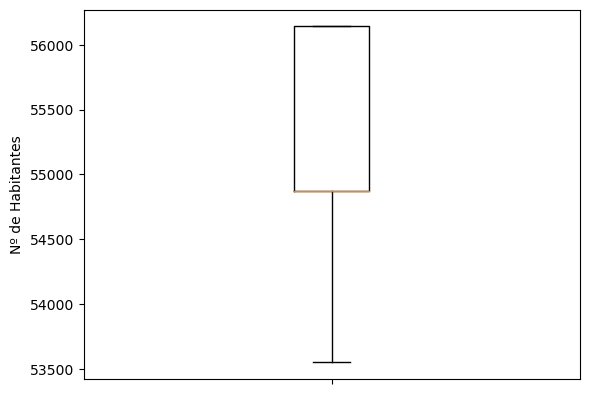

In [54]:
plt.boxplot(terceira['Habitantes']) #desenhar histograma
plt.xticks(ticks=[1],labels=['']) #definir nome dos eixos
plt.ylabel('Nº de Habitantes')

Não tendo sido detetatdos outliers, apenas se observou a variação dos dados ao longo do tempo.

Text(0.5, 0, 'Timestamp')

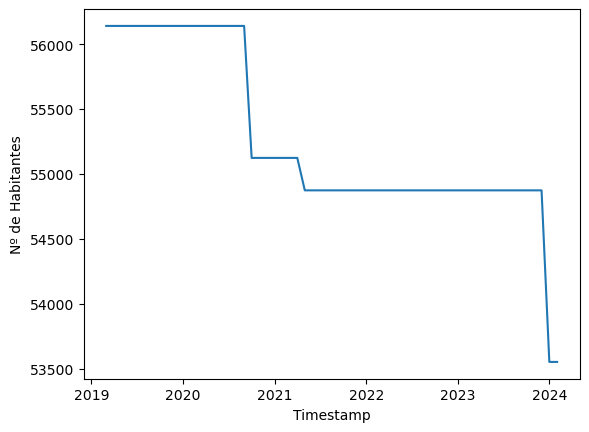

In [55]:
plt.plot(terceira['Habitantes']) #desenhar gráfico
plt.ylabel('Nº de Habitantes') #definir nome dos eixos
plt.xlabel('Timestamp')

Para verificar "visualmente" a existência de outliers foi realizado um histograma.

Text(0, 0.5, 'Nº de Consumidores')

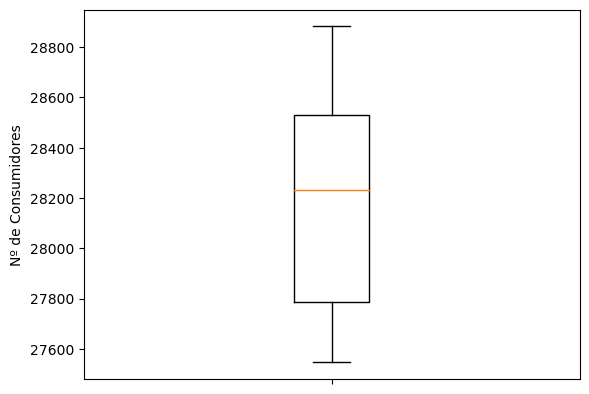

In [56]:
plt.boxplot(terceira['Consumidores']) #desenhar histograma
plt.xticks(ticks=[1],labels=['']) #definir nome dos eixos
plt.ylabel('Nº de Consumidores')

Não tendo sido detetatdos outliers, apenas se observou a variação dos dados ao longo do tempo.

Text(0.5, 0, 'Timestamp')

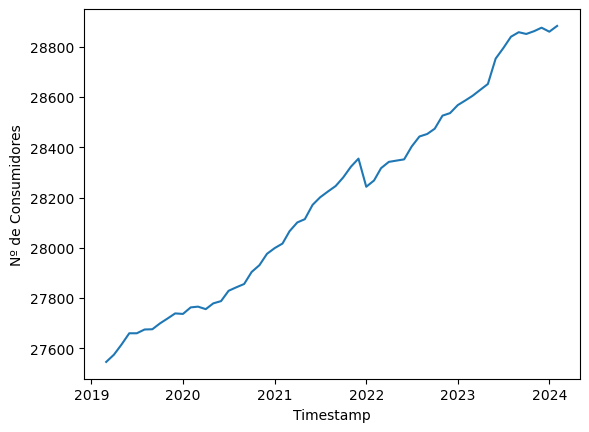

In [57]:
plt.plot(terceira['Consumidores']) #desenhar gráfico
plt.ylabel('Nº de Consumidores') #definir nome dos eixos
plt.xlabel('Timestamp')

É de salientar que, apesar de ter existido um decréscimo no número de habitantes, o número de consumidores tem aumentado ao longo do ano. Tal pode ser justificado pelo aumento de qualidade de vida ou envelhecimento da população: as pessoas mais idosas têm falecido e os jovens adultos têm saído de casa. Por outro lado, estando os Açores a surgir como um novo destino turístico, o número de casas para alugar tem aumentado.

#### 2.3.3. Emissão Energética

Para verificar a distribuição da origem da emissão elétrica na Terceira, foi criado um gráfico de setores.

(-1.0999995733506003,
 1.099999979683362,
 -1.0999997918947897,
 1.0999999184376046)

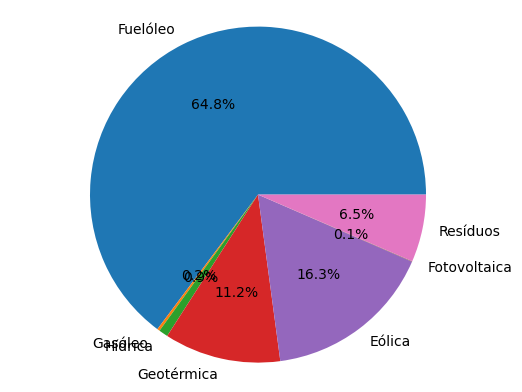

In [58]:
origem = terceira.drop(columns=['Mês', 'Ano', 'Ilha', 'Habitantes', 'Consumidores', 'Total']).sum() #somar ao longo dos anos
origem = origem[origem != 0] #eliminar resultados nulos
plt.pie(origem, labels=origem.index, autopct='%1.1f%%')
plt.axis('equal')

#### 2.3.3.1. Fuelóleo

Para verificar "visualmente" a existência de outliers foi realizado um histograma.

Text(0, 0.5, 'kW')

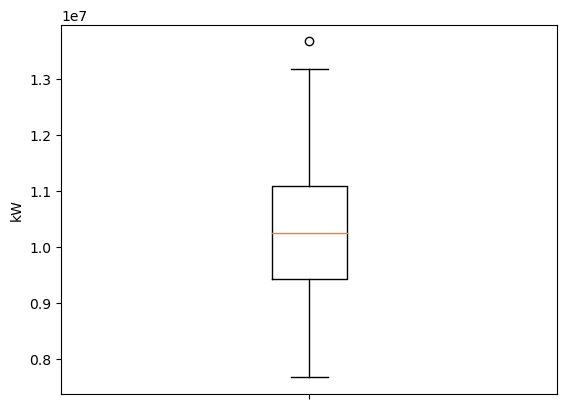

In [59]:
plt.boxplot(terceira['Fuelóleo']) #desenhar histograma
plt.xticks(ticks=[1],labels=['']) #definir nome dos eixos
plt.ylabel('kW')

Para encontrar os outliers detetados iniciamente foi calculada a distância interquartil.

In [60]:
Q1 = terceira['Fuelóleo'].quantile(0.25) #encontrar os quartis
Q3 = terceira['Fuelóleo'].quantile(0.75)
IQR = Q3 - Q1 #calcular amplitude interquartil
sup = Q3 + 1.5 * IQR #calcular limite
outliers_sup = (terceira['Fuelóleo'] > sup)  #encontrar outliers
outliers = terceira[outliers_sup]

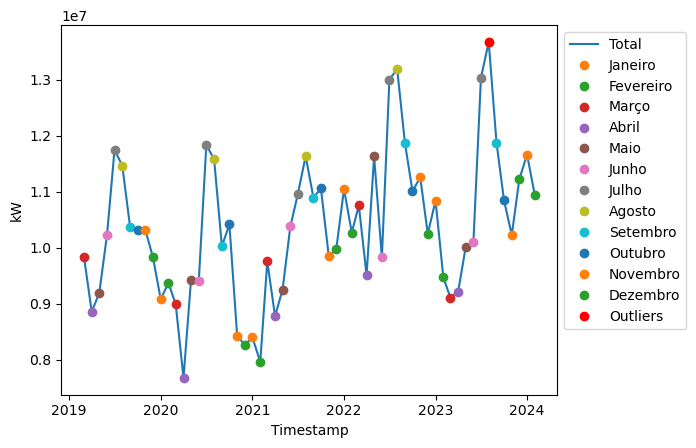

In [61]:
plt.plot(terceira['Fuelóleo'], label='Total') #desenhar gráfico
plt.plot(janeiro['Fuelóleo'], 'o', label='Janeiro')
plt.plot(fevereiro['Fuelóleo'], 'o', label='Fevereiro')
plt.plot(marco['Fuelóleo'], 'o', label='Março')
plt.plot(abril['Fuelóleo'], 'o', label='Abril')
plt.plot(maio['Fuelóleo'], 'o', label='Maio')
plt.plot(junho['Fuelóleo'], 'o', label='Junho')
plt.plot(julho['Fuelóleo'], 'o', label='Julho')
plt.plot(agosto['Fuelóleo'], 'o', label='Agosto')
plt.plot(setembro['Fuelóleo'], 'o', label='Setembro')
plt.plot(outubro['Fuelóleo'], 'o', label='Outubro')
plt.plot(novembro['Fuelóleo'], 'o', label='Novembro')
plt.plot(dezembro['Fuelóleo'], 'o', label='Dezembro')
plt.plot(outliers['Fuelóleo'], 'ro', label='Outliers')
plt.ylabel('kW') #definir nome dos eixos
plt.xlabel('Timestamp')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')

Dado que a emissão de fuelóleo tem aumentado ao longo dos anos, considerou-se que esta evoluçãoestá de acordo com a realidade, tendo-se optado por considerar que o outlier não necessita de correção. Para além disso, é possível verificar uma perioricidade anual nos dados. O período de verão apresenta sempre um pico na emissão (muito provavelmente devido às elevadas temperaturas). Por outro lado, o período de primavera corresponde sempre a um vale (muito provavelmente às temperaturas amenas).

#### 2.3.3.2. Gasóleo

Para verificar "visualmente" a existência de outliers foi realizado um histograma.

Text(0, 0.5, 'kW')

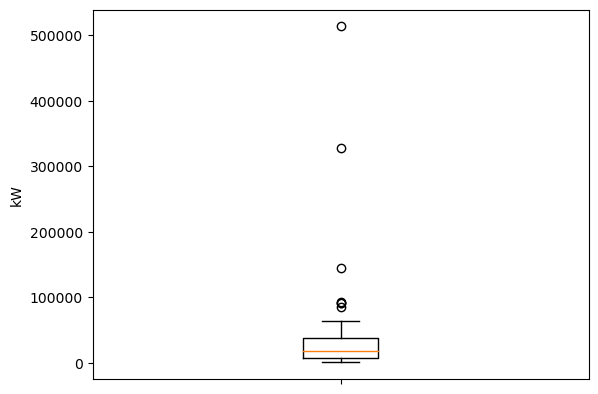

In [62]:
plt.boxplot(terceira['Gasóleo']) #desenhar histograma
plt.xticks(ticks=[1],labels=['']) #definir nome dos eixos
plt.ylabel('kW')

Para encontrar os outliers detetados iniciamente foi calculada a distância interquartil.

In [63]:
Q1 = terceira['Gasóleo'].quantile(0.25) #encontrar os quartis
Q3 = terceira['Gasóleo'].quantile(0.75)
IQR = Q3 - Q1 #calcular amplitude interquartil
sup = Q3 + 1.5 * IQR #calcular limite
outliers_sup = (terceira['Gasóleo'] > sup)  #encontrar outliers
outliers = terceira[outliers_sup]

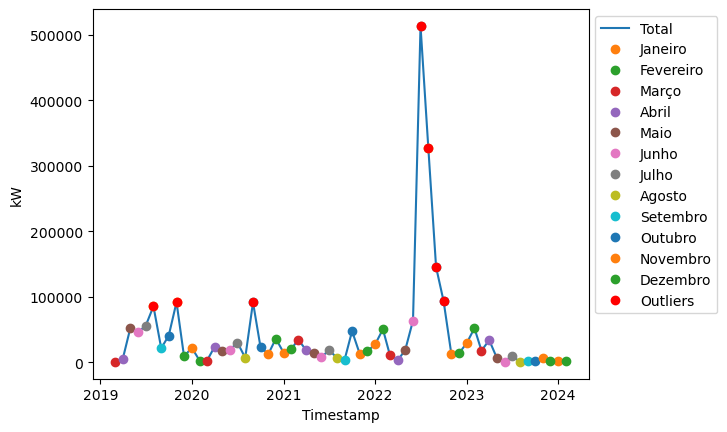

In [64]:
plt.plot(terceira['Gasóleo'], label='Total') #desenhar gráfico
plt.plot(janeiro['Gasóleo'], 'o', label='Janeiro')
plt.plot(fevereiro['Gasóleo'], 'o', label='Fevereiro')
plt.plot(marco['Gasóleo'], 'o', label='Março')
plt.plot(abril['Gasóleo'], 'o', label='Abril')
plt.plot(maio['Gasóleo'], 'o', label='Maio')
plt.plot(junho['Gasóleo'], 'o', label='Junho')
plt.plot(julho['Gasóleo'], 'o', label='Julho')
plt.plot(agosto['Gasóleo'], 'o', label='Agosto')
plt.plot(setembro['Gasóleo'], 'o', label='Setembro')
plt.plot(outubro['Gasóleo'], 'o', label='Outubro')
plt.plot(novembro['Gasóleo'], 'o', label='Novembro')
plt.plot(dezembro['Gasóleo'], 'o', label='Dezembro')
plt.plot(outliers['Gasóleo'], 'ro', label='Outliers')
plt.ylabel('kW') #definir nome dos eixos
plt.xlabel('Timestamp')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')

Os outliers de 2022 correspondem realmente a valores atípicos, justificados pelo facto de algumas centrais geotérmicas terem sofrido avarias ou não estarem disponíveis, tendo sido necessário usar mais gasóleo para compensar. Assim, torna-se necessário corrígi-los por valores mais apropriados, tendo-se utilizado a médias dos cinco anos nesses meses. Optou-se por não corrigir os restantes valores, devido à sua proximidade com os restantes.

In [65]:
indice = terceira[(terceira['Mês']==7) & (terceira['Ano']==2022)].index
valores = terceira[(terceira['Mês']==7) & (terceira['Ano']!=2022)]['Gasóleo']
julho_novo = valores.mean()
terceira.loc[indice, 'Gasóleo'] = julho_novo
indice = terceira[(terceira['Mês']==8) & (terceira['Ano']==2022)].index
valores = terceira[(terceira['Mês']==8) & (terceira['Ano']!=2022)]['Gasóleo']
agosto_novo = valores.mean()
terceira.loc[indice, 'Gasóleo'] = agosto_novo
indice = terceira[(terceira['Mês']==9) & (terceira['Ano']==2022)].index
valores = terceira[(terceira['Mês']==9) & (terceira['Ano']!=2022)]['Gasóleo']
setembro_novo = valores.mean()
terceira.loc[indice, 'Gasóleo'] = setembro_novo
indice = terceira[(terceira['Mês']==10) & (terceira['Ano']==2022)].index
valores = terceira[(terceira['Mês']==10) & (terceira['Ano']!=2022)]['Gasóleo']
outubro_novo = valores.mean()
terceira.loc[indice, 'Gasóleo'] = outubro_novo

#### 2.3.3.3. Hídrica

Para verificar "visualmente" a existência de outliers foi realizado um histograma.

Text(0, 0.5, 'kW')

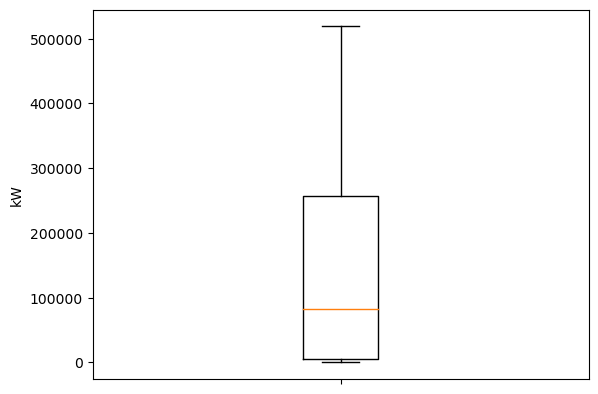

In [66]:
plt.boxplot(terceira['Hídrica']) #desenhar histograma
plt.xticks(ticks=[1],labels=['']) #definir nome dos eixos
plt.ylabel('kW')

Não tendo sido detetatdos outliers, apenas se observou a variação dos dados ao longo do tempo.

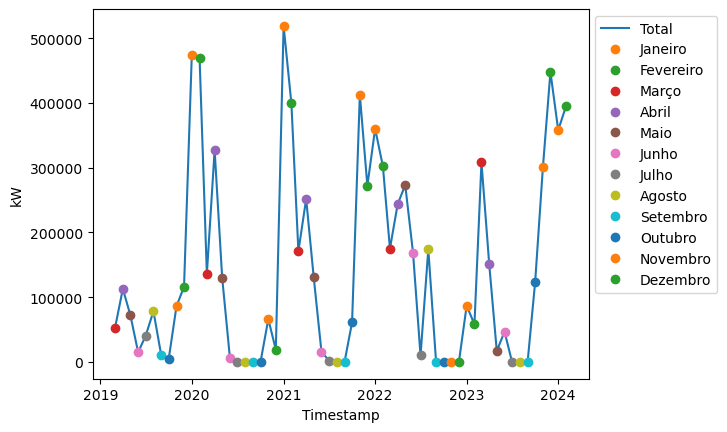

In [67]:
plt.plot(terceira['Hídrica'], label='Total') #desenhar gráfico
plt.plot(janeiro['Hídrica'], 'o', label='Janeiro')
plt.plot(fevereiro['Hídrica'], 'o', label='Fevereiro')
plt.plot(marco['Hídrica'], 'o', label='Março')
plt.plot(abril['Hídrica'], 'o', label='Abril')
plt.plot(maio['Hídrica'], 'o', label='Maio')
plt.plot(junho['Hídrica'], 'o', label='Junho')
plt.plot(julho['Hídrica'], 'o', label='Julho')
plt.plot(agosto['Hídrica'], 'o', label='Agosto')
plt.plot(setembro['Hídrica'], 'o', label='Setembro')
plt.plot(outubro['Hídrica'], 'o', label='Outubro')
plt.plot(novembro['Hídrica'], 'o', label='Novembro')
plt.plot(dezembro['Hídrica'], 'o', label='Dezembro')
plt.ylabel('kW') #definir nome dos eixos
plt.xlabel('Timestamp')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')

Apesar de ser mais dificíl encontrar uma perioricidade anual, é percetível os meses onde existe uma maior probabilidadde de precipitação (entre novembro a abril) correspondem a valores superiores, parecendo existir dois picos.

#### 2.3.3.4. Geotérmica

Para verificar "visualmente" a existência de outliers foi realizado um histograma.

Text(0, 0.5, 'kW')

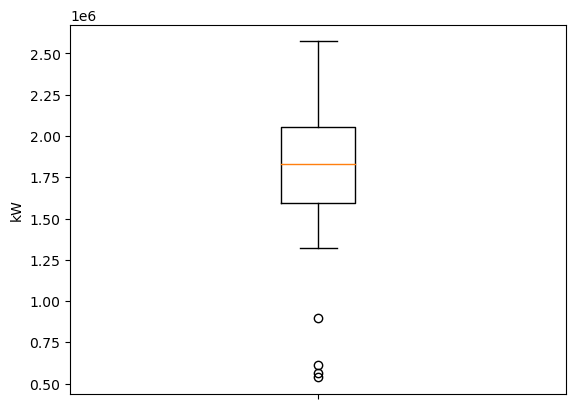

In [68]:
plt.boxplot(terceira['Geotérmica']) #desenhar histograma
plt.xticks(ticks=[1],labels=['']) #definir nome dos eixos
plt.ylabel('kW')

Para encontrar os outliers detetados iniciamente foi calculada a distância interquartil.

In [69]:
Q1 = terceira['Geotérmica'].quantile(0.25) #encontrar os quartis
Q3 = terceira['Geotérmica'].quantile(0.75)
IQR = Q3 - Q1 #calcular amplitude interquartil
inf = Q1 - 1.5 * IQR #calcular limite
outliers_inf = (terceira['Geotérmica'] < inf)  #encontrar outliers
outliers = terceira[outliers_inf]

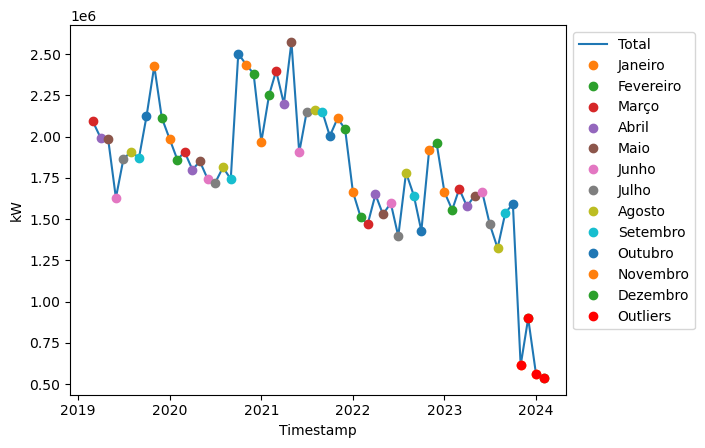

In [70]:
plt.plot(terceira['Geotérmica'], label='Total') #desenhar gráfico
plt.plot(janeiro['Geotérmica'], 'o', label='Janeiro')
plt.plot(fevereiro['Geotérmica'], 'o', label='Fevereiro')
plt.plot(marco['Geotérmica'], 'o', label='Março')
plt.plot(abril['Geotérmica'], 'o', label='Abril')
plt.plot(maio['Geotérmica'], 'o', label='Maio')
plt.plot(junho['Geotérmica'], 'o', label='Junho')
plt.plot(julho['Geotérmica'], 'o', label='Julho')
plt.plot(agosto['Geotérmica'], 'o', label='Agosto')
plt.plot(setembro['Geotérmica'], 'o', label='Setembro')
plt.plot(outubro['Geotérmica'], 'o', label='Outubro')
plt.plot(novembro['Geotérmica'], 'o', label='Novembro')
plt.plot(dezembro['Geotérmica'], 'o', label='Dezembro')
plt.plot(outliers['Geotérmica'], 'ro', label='Outliers')
plt.ylabel('kW') #definir nome dos eixos
plt.xlabel('Timestamp')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')

Os outliers entre novembro de 2023 e fevereiro de 2024 correspondem realmente a valores atípicos, justificados pelo facto de algumas centrais terem sofrido avarias ou não estarem disponíveis. Assim, torna-se necessário corrígi-los por valores mais apropriados, tendo-se utilizado a médias dos cinco anos nesses meses.

In [71]:
indice = terceira[(terceira['Mês']==11) & (terceira['Ano']==2023)].index
valores = terceira[(terceira['Mês']==11) & (terceira['Ano']!=2023)]['Geotérmica']
novembro_novo = valores.mean()
terceira.loc[indice, 'Geotérmica'] = novembro_novo
indice = terceira[(terceira['Mês']==12) & (terceira['Ano']==2023)].index
valores = terceira[(terceira['Mês']==12) & (terceira['Ano']!=2023)]['Geotérmica']
dezembro_novo = valores.mean()
terceira.loc[indice, 'Geotérmica'] = dezembro_novo
indice = terceira[(terceira['Mês']==1) & (terceira['Ano']==2024)].index
valores = terceira[(terceira['Mês']==1) & (terceira['Ano']!=2024)]['Geotérmica']
janeiro_novo = valores.mean()
terceira.loc[indice, 'Geotérmica'] = janeiro_novo
indice = terceira[(terceira['Mês']==2) & (terceira['Ano']==2024)].index
valores = terceira[(terceira['Mês']==2) & (terceira['Ano']!=2024)]['Geotérmica']
fevereiro_novo = valores.mean()
terceira.loc[indice, 'Geotérmica'] = fevereiro_novo

#### 2.3.3.5. Eólica

Para verificar "visualmente" a existência de outliers foi realizado um histograma.

Text(0, 0.5, 'kW')

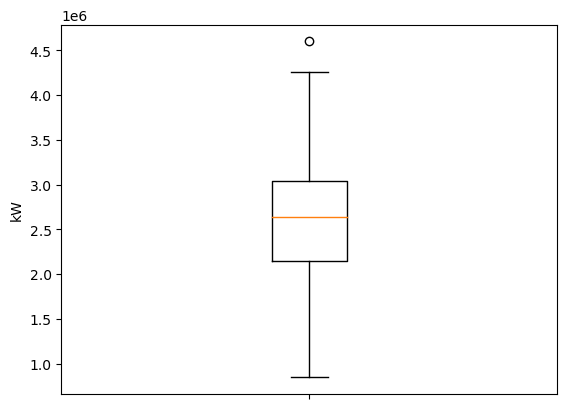

In [72]:
plt.boxplot(terceira['Eólica']) #desenhar histograma
plt.xticks(ticks=[1],labels=['']) #definir nome dos eixos
plt.ylabel('kW')

Para encontrar os outliers detetados iniciamente foi calculada a distância interquartil.

In [73]:
Q1 = terceira['Eólica'].quantile(0.25) #encontrar os quartis
Q3 = terceira['Eólica'].quantile(0.75)
IQR = Q3 - Q1 #calcular amplitude interquartil
sup = Q3 + 1.5 * IQR #calcular limite
outliers_sup = (terceira['Eólica'] > sup)  #encontrar outliers
outliers = terceira[outliers_sup]

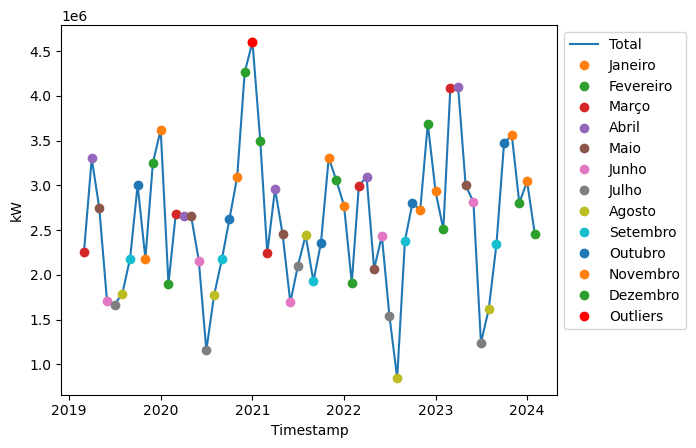

In [74]:
plt.plot(terceira['Eólica'], label='Total') #desenhar gráfico
plt.plot(janeiro['Eólica'], 'o', label='Janeiro')
plt.plot(fevereiro['Eólica'], 'o', label='Fevereiro')
plt.plot(marco['Eólica'], 'o', label='Março')
plt.plot(abril['Eólica'], 'o', label='Abril')
plt.plot(maio['Eólica'], 'o', label='Maio')
plt.plot(junho['Eólica'], 'o', label='Junho')
plt.plot(julho['Eólica'], 'o', label='Julho')
plt.plot(agosto['Eólica'], 'o', label='Agosto')
plt.plot(setembro['Eólica'], 'o', label='Setembro')
plt.plot(outubro['Eólica'], 'o', label='Outubro')
plt.plot(novembro['Eólica'], 'o', label='Novembro')
plt.plot(dezembro['Eólica'], 'o', label='Dezembro')
plt.plot(outliers['Eólica'], 'ro', label='Outliers')
plt.ylabel('kW') #definir nome dos eixos
plt.xlabel('Timestamp')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')

Dado que o outlier corresponde a um pico nos meses no inverno, nos quais se espera que o vento seja mais frequente e forte e, uma vez que a diferença para os restantes valores não é significativa, optou-se por considerar que o outlier não necessita de correção.

#### 2.3.3.6. Fotovoltaica

Para verificar "visualmente" a existência de outliers foi realizado um histograma.

Text(0, 0.5, 'kW')

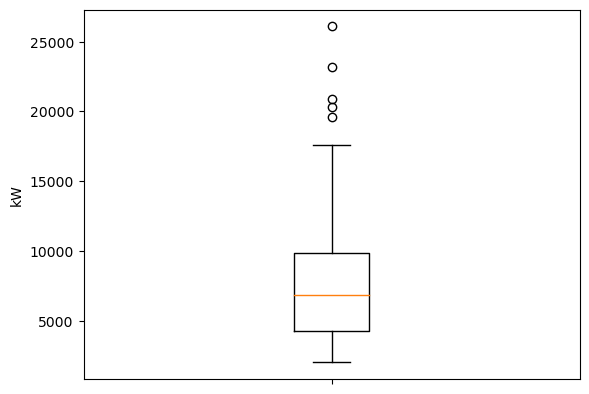

In [75]:
plt.boxplot(terceira['Fotovoltaica']) #desenhar histograma
plt.xticks(ticks=[1],labels=['']) #definir nome dos eixos
plt.ylabel('kW')

Para encontrar os outliers detetados iniciamente foi calculada a distância interquartil.

In [76]:
Q1 = terceira['Fotovoltaica'].quantile(0.25) #encontrar os quartis
Q3 = terceira['Fotovoltaica'].quantile(0.75)
IQR = Q3 - Q1 #calcular amplitude interquartil
sup = Q3 + 1.5 * IQR #calcular limite
outliers_sup = (terceira['Fotovoltaica'] > sup)  #encontrar outliers
outliers = terceira[outliers_sup]

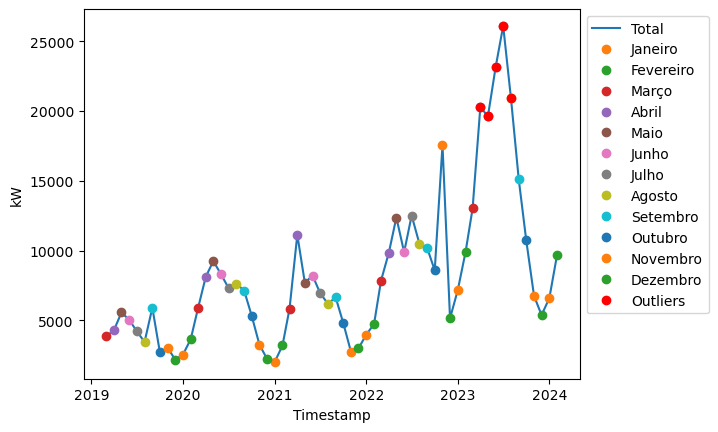

In [77]:
plt.plot(terceira['Fotovoltaica'], label='Total') #desenhar gráfico
plt.plot(janeiro['Fotovoltaica'], 'o', label='Janeiro')
plt.plot(fevereiro['Fotovoltaica'], 'o', label='Fevereiro')
plt.plot(marco['Fotovoltaica'], 'o', label='Março')
plt.plot(abril['Fotovoltaica'], 'o', label='Abril')
plt.plot(maio['Fotovoltaica'], 'o', label='Maio')
plt.plot(junho['Fotovoltaica'], 'o', label='Junho')
plt.plot(julho['Fotovoltaica'], 'o', label='Julho')
plt.plot(agosto['Fotovoltaica'], 'o', label='Agosto')
plt.plot(setembro['Fotovoltaica'], 'o', label='Setembro')
plt.plot(outubro['Fotovoltaica'], 'o', label='Outubro')
plt.plot(novembro['Fotovoltaica'], 'o', label='Novembro')
plt.plot(dezembro['Fotovoltaica'], 'o', label='Dezembro')
plt.plot(outliers['Fotovoltaica'], 'ro', label='Outliers')
plt.ylabel('kW') #definir nome dos eixos
plt.xlabel('Timestamp')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')

Dado que a emissão de energia fotovoltaica tem aumentado ao longo dos anos devido ao investimento na instalação de novos painéis, considerou-se que esta evolução está de acordo com a realidade, tendo-se optado por considerar que os outliers não necessitam de correção. Mais uma vez, existe uma perioricidade anual. O pico surge nos meses de verão (abril, maio, junho, julho e agosto), quando os dias são mais longos e solarengos. O vale surge nos meses de inverno (novembro, dezembro, janeiro e fevereiro), quando os dias são mais curtos e menos solarengos.

#### 2.3.3.7. Resíduos

Para verificar "visualmente" a existência de outliers foi realizado um histograma.

Text(0, 0.5, 'kW')

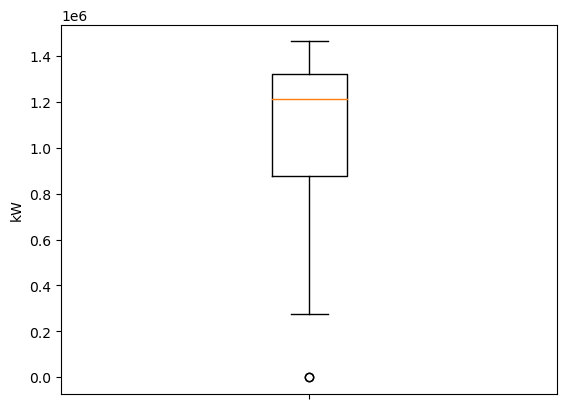

In [78]:
plt.boxplot(terceira['Resíduos']) #desenhar histograma
plt.xticks(ticks=[1],labels=['']) #definir nome dos eixos
plt.ylabel('kW')

Para encontrar os outliers detetados iniciamente foi calculada a distância interquartil.

In [79]:
Q1 = terceira['Resíduos'].quantile(0.25) #encontrar os quartis
Q3 = terceira['Resíduos'].quantile(0.75)
IQR = Q3 - Q1 #calcular amplitude interquartil
inf = Q1 - 1.5 * IQR #calcular limite
outliers_inf = (terceira['Resíduos'] < inf)  #encontrar outliers
outliers = terceira[outliers_inf]

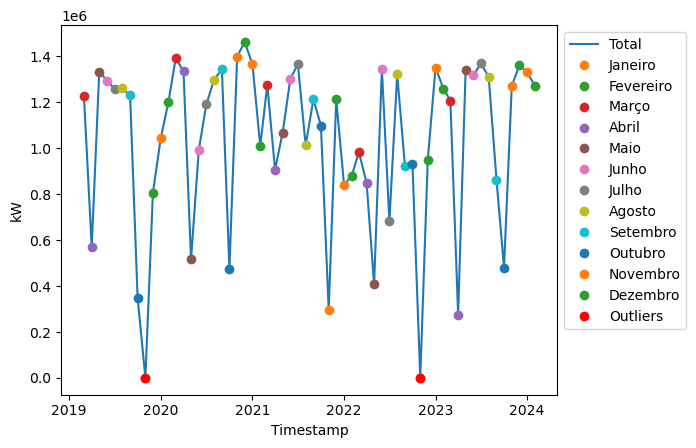

In [80]:
plt.plot(terceira['Resíduos'], label='Total') #desenhar gráfico
plt.plot(janeiro['Resíduos'], 'o', label='Janeiro')
plt.plot(fevereiro['Resíduos'], 'o', label='Fevereiro')
plt.plot(marco['Resíduos'], 'o', label='Março')
plt.plot(abril['Resíduos'], 'o', label='Abril')
plt.plot(maio['Resíduos'], 'o', label='Maio')
plt.plot(junho['Resíduos'], 'o', label='Junho')
plt.plot(julho['Resíduos'], 'o', label='Julho')
plt.plot(agosto['Resíduos'], 'o', label='Agosto')
plt.plot(setembro['Resíduos'], 'o', label='Setembro')
plt.plot(outubro['Resíduos'], 'o', label='Outubro')
plt.plot(novembro['Resíduos'], 'o', label='Novembro')
plt.plot(dezembro['Resíduos'], 'o', label='Dezembro')
plt.plot(outliers['Resíduos'], 'ro', label='Outliers')
plt.ylabel('kW') #definir nome dos eixos
plt.xlabel('Timestamp')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')

Os outliers, ambos correspondentes ao mês de novembro, parecem fazer parte da evolução natural, dado que se espera um valor menor (com base na estrutura). Assim, optou-se por considerar que os outliers não necessitam de correção.

### 2.4. Graciosa

In [81]:
janeiro = graciosa[graciosa['Mês'] == 1] #separar os dados por mês
fevereiro = graciosa[graciosa['Mês'] == 2]
marco = graciosa[graciosa['Mês'] == 3]
abril = graciosa[graciosa['Mês'] == 4]
maio = graciosa[graciosa['Mês'] == 5]
junho = graciosa[graciosa['Mês'] == 6]
julho = graciosa[graciosa['Mês'] == 7]
agosto = graciosa[graciosa['Mês'] == 8]
setembro = graciosa[graciosa['Mês'] == 9]
outubro = graciosa[graciosa['Mês'] == 10]
novembro = graciosa[graciosa['Mês'] == 11]
dezembro = graciosa[graciosa['Mês'] == 12]

#### 2.4.1. Estatística

Inicialmente optou-se por estudar os dados no geral, calculando a média, desvio padrão, mínimo, máximo e quartis.

In [82]:
graciosa.describe() #calcular alguns valores estatísticos da dataframe

,Mês,Ano,Habitantes,Consumidores,Fuelóleo,Gasóleo,Hídrica,Geotérmica,Eólica,Fotovoltaica,Resíduos,Outras Renováveis,Total
count,60.000000,60.000000,60.000000,60.000000,60.0,6.000000e+01,60.0,60.0,60.000000,60.000000,60.0,60.0,6.000000e+01
mean,6.500000,2021.166667,4230.816667,3321.833333,0.0,4.807375e+05,0.0,0.0,579311.966667,74152.200000,0.0,0.0,1.134202e+06
std,3.481184,1.474836,75.931167,39.596767,0.0,2.351328e+05,0.0,0.0,229524.390481,33247.538467,0.0,0.0,6.366986e+04
min,1.000000,2019.000000,4112.000000,3267.000000,0.0,1.283690e+05,0.0,0.0,0.000000,0.000000,0.0,0.0,1.027718e+06
25%,3.750000,2020.000000,4179.000000,3278.000000,0.0,3.205268e+05,0.0,0.0,511520.250000,47949.500000,0.0,0.0,1.088306e+06
50%,6.500000,2021.000000,4179.000000,3323.500000,0.0,4.179490e+05,0.0,0.0,605425.000000,73939.500000,0.0,0.0,1.132885e+06
75%,9.250000,2022.000000,4339.000000,3362.250000,0.0,5.785118e+05,0.0,0.0,734704.750000,98084.500000,0.0,0.0,1.170123e+06
max,12.000000,2024.000000,4339.000000,3383.000000,0.0,1.098976e+06,0.0,0.0,975936.000000,124776.000000,0.0,0.0,1.321297e+06


#### 2.4.2. Habitantes e Consumidores

Para verificar "visualmente" a existência de outliers foi realizado um histograma.

Text(0, 0.5, 'Nº de Habitantes')

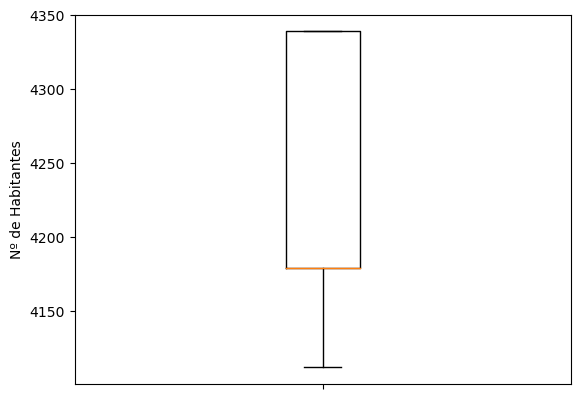

In [83]:
plt.boxplot(graciosa['Habitantes']) #desenhar histograma
plt.xticks(ticks=[1],labels=['']) #definir nome dos eixos
plt.ylabel('Nº de Habitantes')

Não tendo sido detetatdos outliers, apenas se observou a variação dos dados ao longo do tempo.

Text(0.5, 0, 'Timestamp')

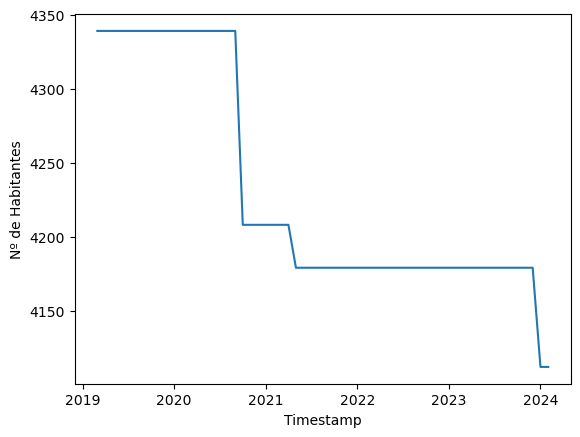

In [84]:
plt.plot(graciosa['Habitantes']) #desenhar gráfico
plt.ylabel('Nº de Habitantes') #definir nome dos eixos
plt.xlabel('Timestamp')

Para verificar "visualmente" a existência de outliers foi realizado um histograma.

Text(0, 0.5, 'Nº de Habitantes')

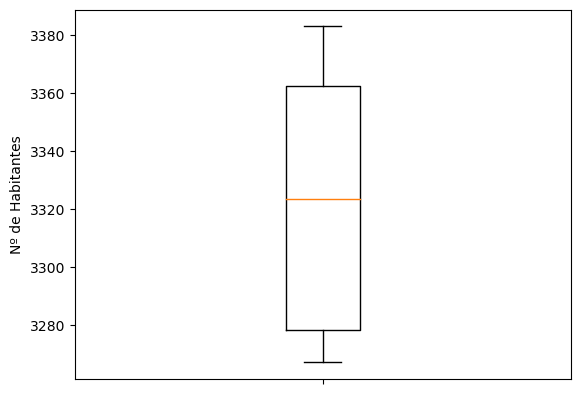

In [85]:
plt.boxplot(graciosa['Consumidores']) #desenhar histograma
plt.xticks(ticks=[1],labels=['']) #definir nome dos eixos
plt.ylabel('Nº de Habitantes')

Não tendo sido detetatdos outliers, apenas se observou a variação dos dados ao longo do tempo.

Text(0.5, 0, 'Timestamp')

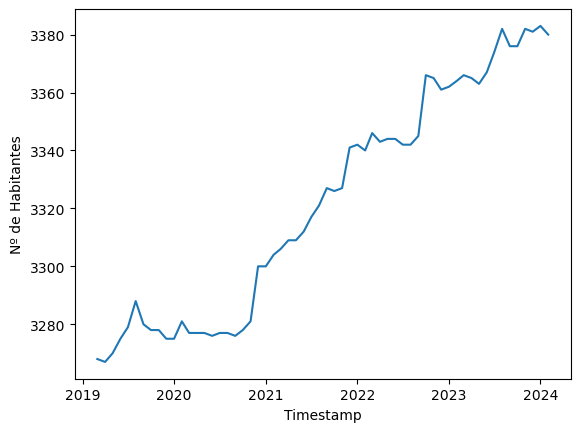

In [86]:
plt.plot(graciosa['Consumidores']) #desenhar gráfico
plt.ylabel('Nº de Habitantes') #definir nome dos eixos
plt.xlabel('Timestamp')

É de salientar que, apesar de ter existido um decréscimo no número de habitantes, o número de consumidores tem aumentado ao longo do ano. Tal pode ser justificado pelo aumento de qualidade de vida ou envelhecimento da população: as pessoas mais idosas têm falecido e os jovens adultos têm saído de casa. Por outro lado, estando os Açores a surgir como um novo destino turístico, o número de casas para alugar tem aumentado.

#### 2.4.3. Emissão Energética

Para verificar a distribuição da origem da emissão elétrica na Graciosa, foi criado um gráfico de setores.

(-1.0999998712434067,
 1.0999999938687337,
 -1.0999995494388113,
 1.0999911828368074)

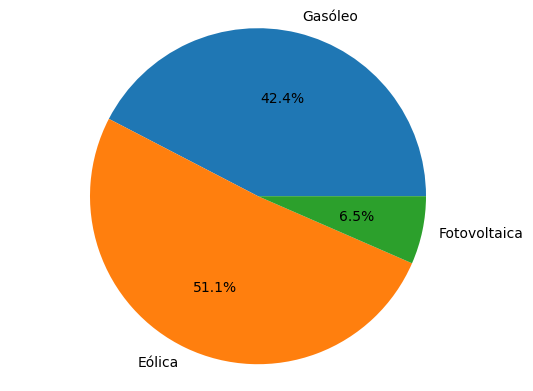

In [87]:
origem = graciosa.drop(columns=['Mês', 'Ano', 'Ilha', 'Habitantes', 'Consumidores', 'Total']).sum() #somar ao longo dos anos
origem = origem[origem != 0] #eliminar resultados nulos
plt.pie(origem, labels=origem.index, autopct='%1.1f%%')
plt.axis('equal')

#### 2.4.3.1. Gasóleo

Para verificar "visualmente" a existência de outliers foi realizado um histograma.

Text(0, 0.5, 'kW')

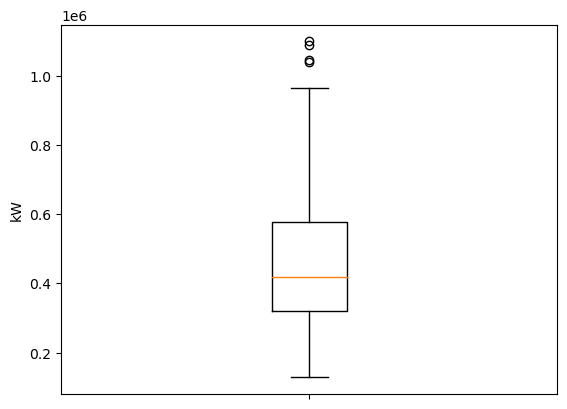

In [88]:
plt.boxplot(graciosa['Gasóleo']) #desenhar histograma
plt.xticks(ticks=[1],labels=['']) #definir nome dos eixos
plt.ylabel('kW')

Para encontrar os outliers detetados iniciamente foi calculada a distância interquartil.

In [89]:
Q1 = graciosa['Gasóleo'].quantile(0.25) #encontrar os quartis
Q3 = graciosa['Gasóleo'].quantile(0.75)
IQR = Q3 - Q1 #calcular amplitude interquartil
sup = Q3 + 1.5 * IQR #calcular limite
outliers_sup = (graciosa['Gasóleo'] > sup)  #encontrar outliers
outliers = graciosa[outliers_sup]

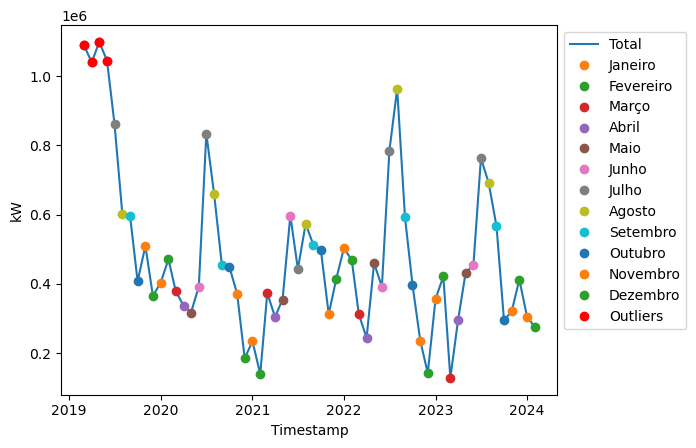

In [90]:
plt.plot(graciosa['Gasóleo'], label='Total') #desenhar gráfico
plt.plot(janeiro['Gasóleo'], 'o', label='Janeiro')
plt.plot(fevereiro['Gasóleo'], 'o', label='Fevereiro')
plt.plot(marco['Gasóleo'], 'o', label='Março')
plt.plot(abril['Gasóleo'], 'o', label='Abril')
plt.plot(maio['Gasóleo'], 'o', label='Maio')
plt.plot(junho['Gasóleo'], 'o', label='Junho')
plt.plot(julho['Gasóleo'], 'o', label='Julho')
plt.plot(agosto['Gasóleo'], 'o', label='Agosto')
plt.plot(setembro['Gasóleo'], 'o', label='Setembro')
plt.plot(outubro['Gasóleo'], 'o', label='Outubro')
plt.plot(novembro['Gasóleo'], 'o', label='Novembro')
plt.plot(dezembro['Gasóleo'], 'o', label='Dezembro')
plt.plot(outliers['Gasóleo'], 'ro', label='Outliers')
plt.ylabel('kW') #definir nome dos eixos
plt.xlabel('Timestamp')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')

Uma vez que as primeiras centrais eólicas e fotovoltaicas só surgiram em julho de 2019, existia uma maior uso de gasóleo no perído anterior.
Assim, considerou-se que os outliers fazem parte da evolução real, não necessitando de ser corrigidos.

#### 2.4.3.2. Eólica

Para verificar "visualmente" a existência de outliers foi realizado um histograma.

Text(0, 0.5, 'kW')

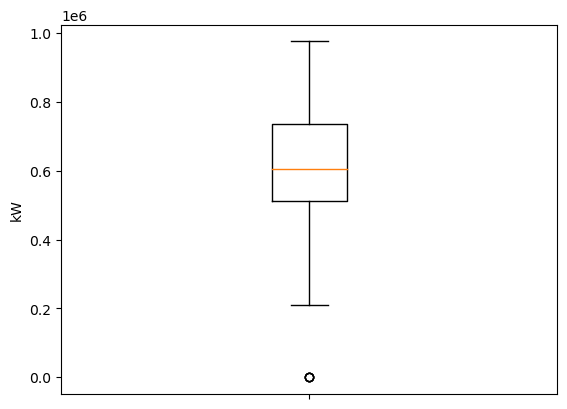

In [91]:
plt.boxplot(graciosa['Eólica']) #desenhar histograma
plt.xticks(ticks=[1],labels=['']) #definir nome dos eixos
plt.ylabel('kW')

Para encontrar os outliers detetados iniciamente foi calculada a distância interquartil.

In [92]:
Q1 = graciosa['Eólica'].quantile(0.25) #encontrar os quartis
Q3 = graciosa['Eólica'].quantile(0.75)
IQR = Q3 - Q1 #calcular amplitude interquartil
inf = Q1 - 1.5 * IQR #calcular limite
outliers_inf = (graciosa['Eólica'] < inf)  #encontrar outliers
outliers = graciosa[outliers_inf]

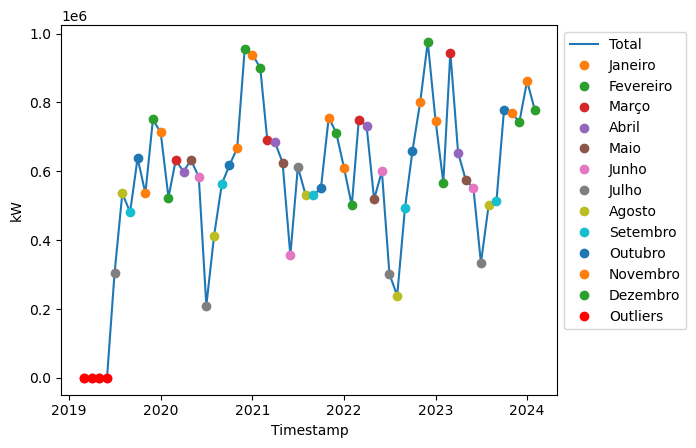

In [93]:
plt.plot(graciosa['Eólica'], label='Total') #desenhar gráfico
plt.plot(janeiro['Eólica'], 'o', label='Janeiro')
plt.plot(fevereiro['Eólica'], 'o', label='Fevereiro')
plt.plot(marco['Eólica'], 'o', label='Março')
plt.plot(abril['Eólica'], 'o', label='Abril')
plt.plot(maio['Eólica'], 'o', label='Maio')
plt.plot(junho['Eólica'], 'o', label='Junho')
plt.plot(julho['Eólica'], 'o', label='Julho')
plt.plot(agosto['Eólica'], 'o', label='Agosto')
plt.plot(setembro['Eólica'], 'o', label='Setembro')
plt.plot(outubro['Eólica'], 'o', label='Outubro')
plt.plot(novembro['Eólica'], 'o', label='Novembro')
plt.plot(dezembro['Eólica'], 'o', label='Dezembro')
plt.plot(outliers['Eólica'], 'ro', label='Outliers')
plt.ylabel('kW') #definir nome dos eixos
plt.xlabel('Timestamp')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')

Verificou-se que as primeiras centrais eólicas surgiram em julho de 2019 (não sendo necessário corrigir os outliers), verificando-se, mais uma vez, uma perioricidade anual. O pico surge nos meses de inverno (novembro, dezembro e janeiro), quando o vento é mais forte e frequente. O vale surge nos meses de verão (junho julho e agosto), quando o vento é menos forte e frequente.

#### 2.4.3.3. Fotovoltaica

Para verificar "visualmente" a existência de outliers foi realizado um histograma.

Text(0, 0.5, 'kW')

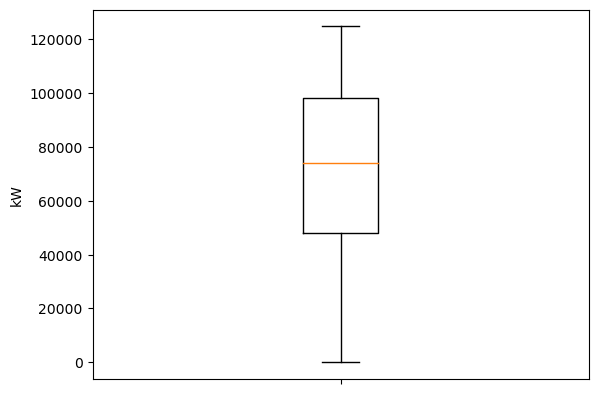

In [94]:
plt.boxplot(graciosa['Fotovoltaica']) #desenhar histograma
plt.xticks(ticks=[1],labels=['']) #definir nome dos eixos
plt.ylabel('kW')

Não tendo sido detetatdos outliers, apenas se observou a variação dos dados ao longo do tempo.

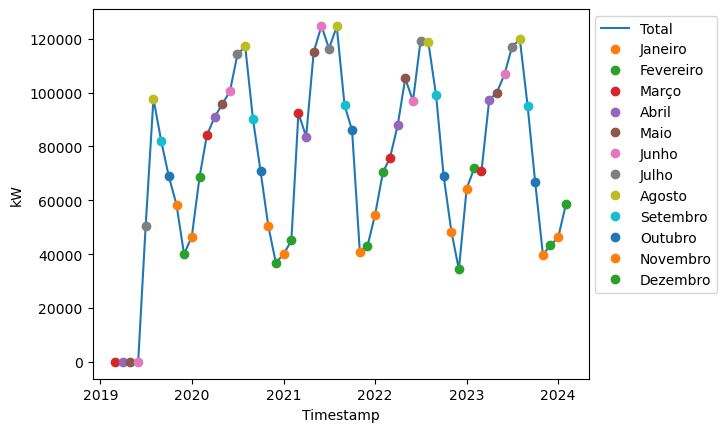

In [95]:
plt.plot(graciosa['Fotovoltaica'], label='Total') #desenhar gráfico
plt.plot(janeiro['Fotovoltaica'], 'o', label='Janeiro')
plt.plot(fevereiro['Fotovoltaica'], 'o', label='Fevereiro')
plt.plot(marco['Fotovoltaica'], 'o', label='Março')
plt.plot(abril['Fotovoltaica'], 'o', label='Abril')
plt.plot(maio['Fotovoltaica'], 'o', label='Maio')
plt.plot(junho['Fotovoltaica'], 'o', label='Junho')
plt.plot(julho['Fotovoltaica'], 'o', label='Julho')
plt.plot(agosto['Fotovoltaica'], 'o', label='Agosto')
plt.plot(setembro['Fotovoltaica'], 'o', label='Setembro')
plt.plot(outubro['Fotovoltaica'], 'o', label='Outubro')
plt.plot(novembro['Fotovoltaica'], 'o', label='Novembro')
plt.plot(dezembro['Fotovoltaica'], 'o', label='Dezembro')
plt.ylabel('kW') #definir nome dos eixos
plt.xlabel('Timestamp')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')

Verificou-se que as primeiras centrais fotovoltaicas surgiram em julho de 2019, verificando-se, mais uma vez, uma perioricidade anual. O pico surge nos meses de verão (junho julho e agosto), quando os dias são mais compridos e solarengos. O vale surge nos meses de inverno (novembro, dezembro e janeiro), quando os dias são mais curtos e menos solarengos.

### 2.5. São Jorge

In [96]:
janeiro = sao_jorge[sao_jorge['Mês'] == 1] #separar os dados por mês
fevereiro = sao_jorge[sao_jorge['Mês'] == 2]
marco = sao_jorge[sao_jorge['Mês'] == 3]
abril = sao_jorge[sao_jorge['Mês'] == 4]
maio = sao_jorge[sao_jorge['Mês'] == 5]
junho = sao_jorge[sao_jorge['Mês'] == 6]
julho = sao_jorge[sao_jorge['Mês'] == 7]
agosto = sao_jorge[sao_jorge['Mês'] == 8]
setembro = sao_jorge[sao_jorge['Mês'] == 9]
outubro = sao_jorge[sao_jorge['Mês'] == 10]
novembro = sao_jorge[sao_jorge['Mês'] == 11]
dezembro = sao_jorge[sao_jorge['Mês'] == 12]

#### 2.5.1. Estatística

Inicialmente optou-se por estudar os dados no geral, calculando a média, desvio padrão, mínimo, máximo e quartis.

In [97]:
sao_jorge.describe() #calcular alguns valores estatísticos da dataframe

,Mês,Ano,Habitantes,Consumidores,Fuelóleo,Gasóleo,Hídrica,Geotérmica,Eólica,Fotovoltaica,Resíduos,Outras Renováveis,Total
count,60.000000,60.000000,60.000000,60.00000,60.0,6.000000e+01,60.0,60.0,60.000000,60.000000,60.0,60.0,6.000000e+01
mean,6.500000,2021.166667,8345.483333,6016.25000,0.0,2.156118e+06,0.0,0.0,239605.400000,4243.450000,0.0,0.0,2.399967e+06
std,3.481184,1.474836,150.991131,96.41113,0.0,2.066709e+05,0.0,0.0,94877.569309,1643.277558,0.0,0.0,1.530447e+05
min,1.000000,2019.000000,8228.000000,5880.00000,0.0,1.815679e+06,0.0,0.0,80374.000000,1359.000000,0.0,0.0,2.083866e+06
25%,3.750000,2020.000000,8228.000000,5898.25000,0.0,1.979240e+06,0.0,0.0,176748.750000,3034.500000,0.0,0.0,2.279397e+06
50%,6.500000,2021.000000,8228.000000,6051.00000,0.0,2.133130e+06,0.0,0.0,221513.500000,4142.500000,0.0,0.0,2.388798e+06
75%,9.250000,2022.000000,8556.000000,6101.50000,0.0,2.285332e+06,0.0,0.0,290547.500000,5255.000000,0.0,0.0,2.477360e+06
max,12.000000,2024.000000,8556.000000,6145.00000,0.0,2.645394e+06,0.0,0.0,477661.000000,7537.000000,0.0,0.0,2.730615e+06


#### 2.5.2. Habitantes e Consumidores

Para verificar "visualmente" a existência de outliers foi realizado um histograma.

Text(0, 0.5, 'Nº de Habitantes')

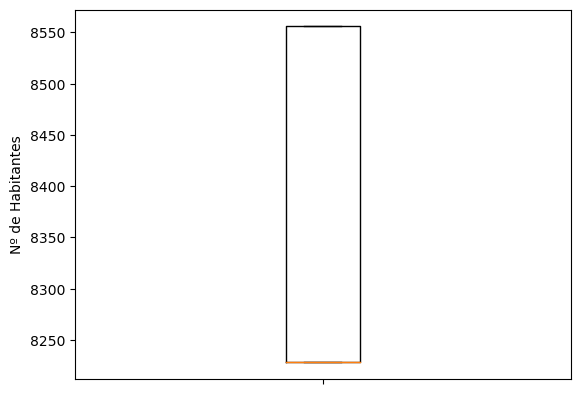

In [98]:
plt.boxplot(sao_jorge['Habitantes']) #desenhar histograma
plt.xticks(ticks=[1],labels=['']) #definir nome dos eixos
plt.ylabel('Nº de Habitantes')

Não tendo sido detetatdos outliers, apenas se observou a variação dos dados ao longo do tempo.

Text(0.5, 0, 'Timestamp')

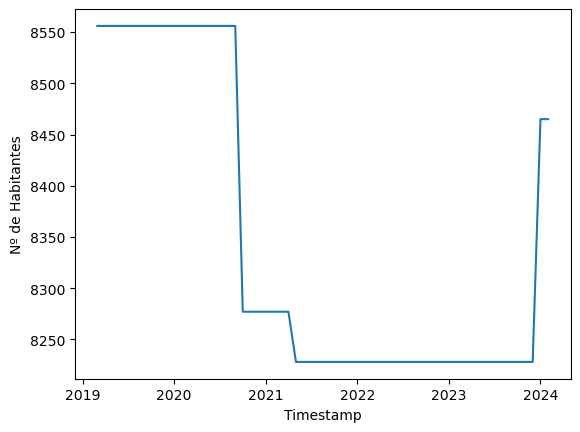

In [99]:
plt.plot(sao_jorge['Habitantes']) #desenhar gráfico
plt.ylabel('Nº de Habitantes') #definir nome dos eixos
plt.xlabel('Timestamp')

Para verificar "visualmente" a existência de outliers foi realizado um histograma.

Text(0, 0.5, 'Nº de Habitantes')

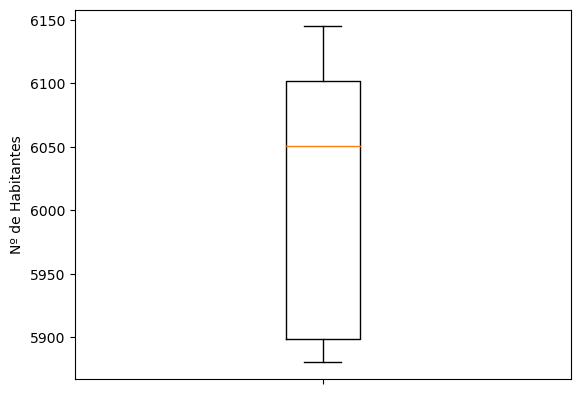

In [100]:
plt.boxplot(sao_jorge['Consumidores']) #desenhar histograma
plt.xticks(ticks=[1],labels=['']) #definir nome dos eixos
plt.ylabel('Nº de Habitantes')

Não tendo sido detetatdos outliers, apenas se observou a variação dos dados ao longo do tempo.

Text(0.5, 0, 'Timestamp')

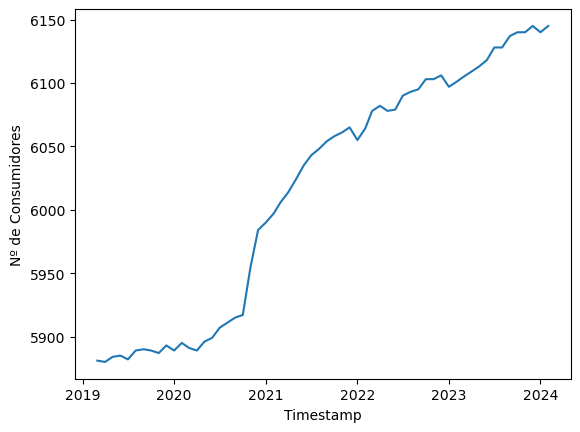

In [101]:
plt.plot(sao_jorge['Consumidores']) #desenhar gráfico
plt.ylabel('Nº de Consumidores') #definir nome dos eixos
plt.xlabel('Timestamp')

É de salientar que, apesar de ter existido um decréscimo no número de habitantes, o número de consumidores tem aumentado ao longo do ano. Tal pode ser justificado pelo aumento de qualidade de vida ou envelhecimento da população: as pessoas mais idosas têm falecido e os jovens adultos têm saído de casa. Por outro lado, estando os Açores a surgir como um novo destino turístico, o número de casas para alugar tem aumentado.

#### 2.5.3. Emissão Energética

Para verificar a distribuição da origem da emissão elétrica em São Jorge, foi criado um gráfico de setores.

(-1.0999999898947017,
 1.0999999995187952,
 -1.0999997964463164,
 1.0999997494516425)

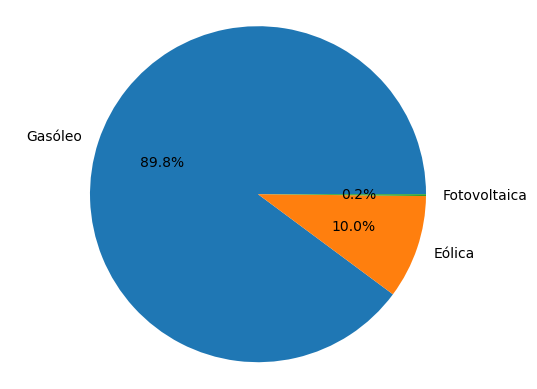

In [102]:
origem = sao_jorge.drop(columns=['Mês', 'Ano', 'Ilha', 'Habitantes', 'Consumidores', 'Total']).sum() #somar ao longo dos anos
origem = origem[origem != 0] #eliminar resultados nulos
plt.pie(origem, labels=origem.index, autopct='%1.1f%%')
plt.axis('equal')

#### 2.5.3.1. Gasóleo

Para verificar "visualmente" a existência de outliers foi realizado um histograma.

Text(0, 0.5, 'kW')

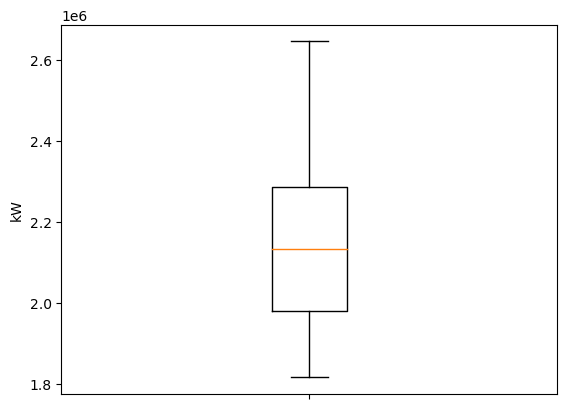

In [103]:
plt.boxplot(sao_jorge['Gasóleo']) #desenhar histograma
plt.xticks(ticks=[1],labels=['']) #definir nome dos eixos
plt.ylabel('kW')

Não tendo sido detetatdos outliers, apenas se observou a variação dos dados ao longo do tempo.

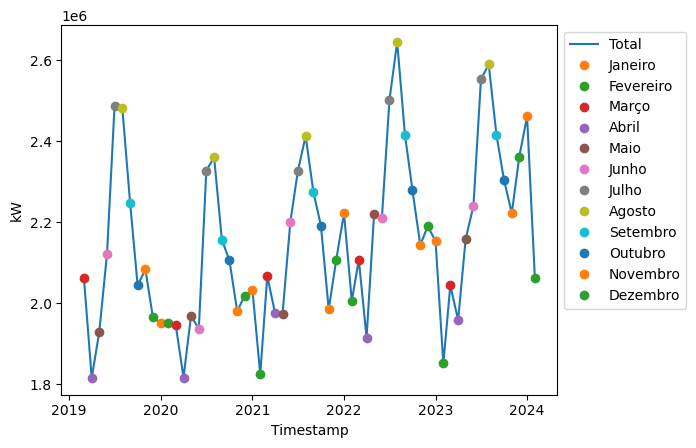

In [104]:
plt.plot(sao_jorge['Gasóleo'], label='Total') #desenhar gráfico
plt.plot(janeiro['Gasóleo'], 'o', label='Janeiro')
plt.plot(fevereiro['Gasóleo'], 'o', label='Fevereiro')
plt.plot(marco['Gasóleo'], 'o', label='Março')
plt.plot(abril['Gasóleo'], 'o', label='Abril')
plt.plot(maio['Gasóleo'], 'o', label='Maio')
plt.plot(junho['Gasóleo'], 'o', label='Junho')
plt.plot(julho['Gasóleo'], 'o', label='Julho')
plt.plot(agosto['Gasóleo'], 'o', label='Agosto')
plt.plot(setembro['Gasóleo'], 'o', label='Setembro')
plt.plot(outubro['Gasóleo'], 'o', label='Outubro')
plt.plot(novembro['Gasóleo'], 'o', label='Novembro')
plt.plot(dezembro['Gasóleo'], 'o', label='Dezembro')
plt.ylabel('kW') #definir nome dos eixos
plt.xlabel('Timestamp')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')

É possível verificar uma perioricidade anual nos dados. O período de verão apresenta sempre um pico na emissão (muito provavelmente devido às elevadas temperaturas). Por outro lado, o período de primavera corresponde sempre a um vale (muito provavelmente devido às temperaturas amenas).

#### 2.5.3.2. Eólica

Para verificar "visualmente" a existência de outliers foi realizado um histograma.

Text(0, 0.5, 'kW')

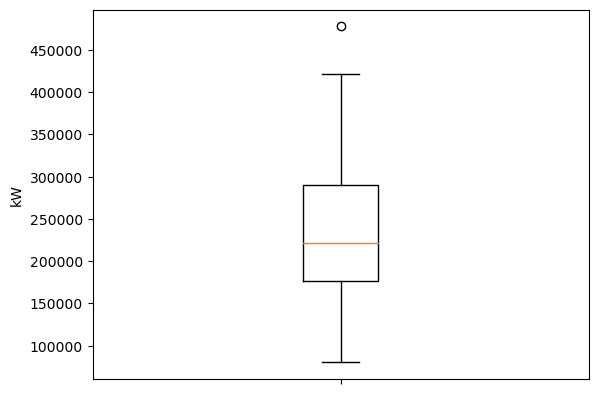

In [105]:
plt.boxplot(sao_jorge['Eólica']) #desenhar histograma
plt.xticks(ticks=[1],labels=['']) #definir nome dos eixos
plt.ylabel('kW')

Para encontrar os outliers detetados iniciamente foi calculada a distância interquartil.

In [106]:
Q1 = sao_jorge['Eólica'].quantile(0.25) #encontrar os quartis
Q3 = sao_jorge['Eólica'].quantile(0.75)
IQR = Q3 - Q1 #calcular amplitude interquartil
sup = Q3 + 1.5 * IQR #calcular limite
outliers_sup = (sao_jorge['Eólica'] > sup)  #encontrar outliers
outliers = sao_jorge[outliers_sup]

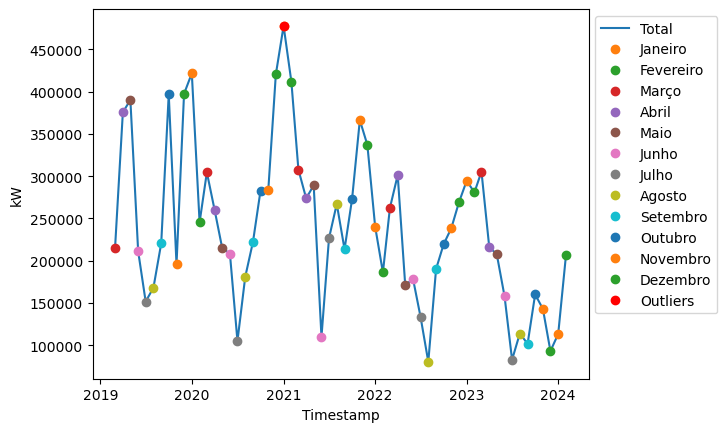

In [107]:
plt.plot(sao_jorge['Eólica'], label='Total') #desenhar gráfico
plt.plot(janeiro['Eólica'], 'o', label='Janeiro')
plt.plot(fevereiro['Eólica'], 'o', label='Fevereiro')
plt.plot(marco['Eólica'], 'o', label='Março')
plt.plot(abril['Eólica'], 'o', label='Abril')
plt.plot(maio['Eólica'], 'o', label='Maio')
plt.plot(junho['Eólica'], 'o', label='Junho')
plt.plot(julho['Eólica'], 'o', label='Julho')
plt.plot(agosto['Eólica'], 'o', label='Agosto')
plt.plot(setembro['Eólica'], 'o', label='Setembro')
plt.plot(outubro['Eólica'], 'o', label='Outubro')
plt.plot(novembro['Eólica'], 'o', label='Novembro')
plt.plot(dezembro['Eólica'], 'o', label='Dezembro')
plt.plot(outliers['Eólica'], 'ro', label='Outliers')
plt.ylabel('kW') #definir nome dos eixos
plt.xlabel('Timestamp')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')

Dado que o outlier corresponde a um pico nos meses no inverno, nos quais se espera que o vento seja mais frequente e forte e, uma vez que a diferença para os restantes valores não é significativa, optou-se por considerar que o outlier não necessita de correção.

#### 2.5.3.3. Fotovoltaica

Para verificar "visualmente" a existência de outliers foi realizado um histograma.

Text(0, 0.5, 'kW')

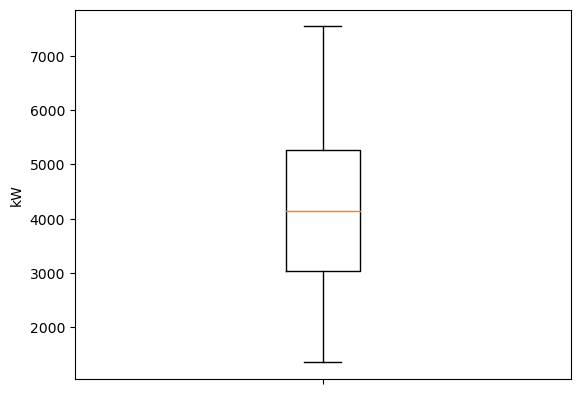

In [108]:
plt.boxplot(sao_jorge['Fotovoltaica']) #desenhar histograma
plt.xticks(ticks=[1],labels=['']) #definir nome dos eixos
plt.ylabel('kW')

Não tendo sido detetatdos outliers, apenas se observou a variação dos dados ao longo do tempo.

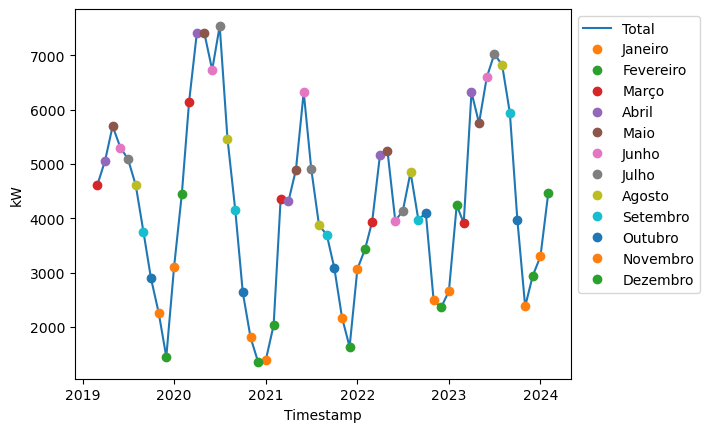

In [109]:
plt.plot(sao_jorge['Fotovoltaica'], label='Total') #desenhar gráfico
plt.plot(janeiro['Fotovoltaica'], 'o', label='Janeiro')
plt.plot(fevereiro['Fotovoltaica'], 'o', label='Fevereiro')
plt.plot(marco['Fotovoltaica'], 'o', label='Março')
plt.plot(abril['Fotovoltaica'], 'o', label='Abril')
plt.plot(maio['Fotovoltaica'], 'o', label='Maio')
plt.plot(junho['Fotovoltaica'], 'o', label='Junho')
plt.plot(julho['Fotovoltaica'], 'o', label='Julho')
plt.plot(agosto['Fotovoltaica'], 'o', label='Agosto')
plt.plot(setembro['Fotovoltaica'], 'o', label='Setembro')
plt.plot(outubro['Fotovoltaica'], 'o', label='Outubro')
plt.plot(novembro['Fotovoltaica'], 'o', label='Novembro')
plt.plot(dezembro['Fotovoltaica'], 'o', label='Dezembro')
plt.ylabel('kW') #definir nome dos eixos
plt.xlabel('Timestamp')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')

Verificou-se, mais uma vez, uma perioricidade anual. No entanto, desta vez o pico dos meses de verão (dias mais compridos e solarengos) parece surgir um mês antes, durante o mês e maio. O vale continua a surgir nos meses de inverno (novembro, dezembro e janeiro), quando os dias são mais curtos e menos solarengos.

### 2.6. Pico

In [110]:
janeiro = pico[pico['Mês'] == 1]
fevereiro = pico[pico['Mês'] == 2]
marco = pico[pico['Mês'] == 3]
abril = pico[pico['Mês'] == 4]
maio = pico[pico['Mês'] == 5]
junho = pico[pico['Mês'] == 6]
julho = pico[pico['Mês'] == 7]
agosto = pico[pico['Mês'] == 8]
setembro = pico[pico['Mês'] == 9]
outubro = pico[pico['Mês'] == 10]
novembro = pico[pico['Mês'] == 11]
dezembro = pico[pico['Mês'] == 12]

#### 2.6.1. Estatística

Inicialmente optou-se por estudar os dados no geral, calculando a média, desvio padrão, mínimo, máximo e quartis.

In [111]:
pico.describe() #calcular alguns valores estatísticos da dataframe

,Mês,Ano,Habitantes,Consumidores,Fuelóleo,Gasóleo,Hídrica,Geotérmica,Eólica,Fotovoltaica,Resíduos,Outras Renováveis,Total
count,60.000000,60.000000,60.000000,60.000000,6.000000e+01,60.000000,60.0,60.0,60.000000,60.000000,60.0,60.0,6.000000e+01
mean,6.500000,2021.166667,13734.933333,10088.783333,3.444780e+06,537.250000,0.0,0.0,459545.066667,534.516667,0.0,0.0,3.905397e+06
std,3.481184,1.474836,146.018326,167.847196,3.973985e+05,958.237181,0.0,0.0,168292.761392,282.269404,0.0,0.0,3.060832e+05
min,1.000000,2019.000000,13635.000000,9827.000000,2.655841e+06,0.000000,0.0,0.0,111404.000000,207.000000,0.0,0.0,3.185400e+06
25%,3.750000,2020.000000,13635.000000,9922.750000,3.177728e+06,0.000000,0.0,0.0,351828.500000,381.750000,0.0,0.0,3.726442e+06
50%,6.500000,2021.000000,13635.000000,10095.500000,3.435728e+06,188.000000,0.0,0.0,459412.000000,480.500000,0.0,0.0,3.900074e+06
75%,9.250000,2022.000000,13883.000000,10223.250000,3.641601e+06,523.000000,0.0,0.0,561838.500000,535.750000,0.0,0.0,4.078868e+06
max,12.000000,2024.000000,14221.000000,10387.000000,4.432076e+06,5024.000000,0.0,0.0,937098.000000,1438.000000,0.0,0.0,4.655851e+06


#### 2.6.2. Habitantes e Consumidores

Para verificar "visualmente" a existência de outliers foi realizado um histograma.

Text(0, 0.5, 'Nº de Habitantes')

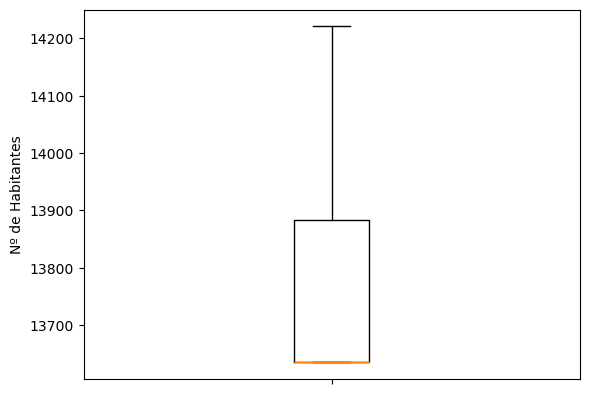

In [112]:
plt.boxplot(pico['Habitantes']) #desenhar histograma
plt.xticks(ticks=[1],labels=['']) #definir nome dos eixos
plt.ylabel('Nº de Habitantes')

Não tendo sido detetatdos outliers, apenas se observou a variação dos dados ao longo do tempo.

Text(0.5, 0, 'Timestamp')

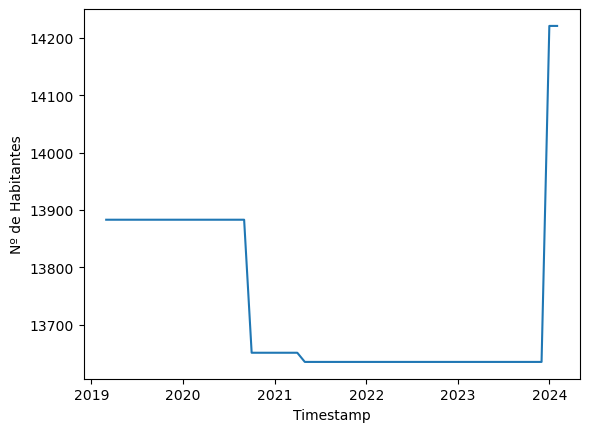

In [113]:
plt.plot(pico['Habitantes']) #desenhar gráfico
plt.ylabel('Nº de Habitantes') #definir nome dos eixos
plt.xlabel('Timestamp')

Para verificar "visualmente" a existência de outliers foi realizado um histograma.

Text(0, 0.5, 'Nº de Consumidores')

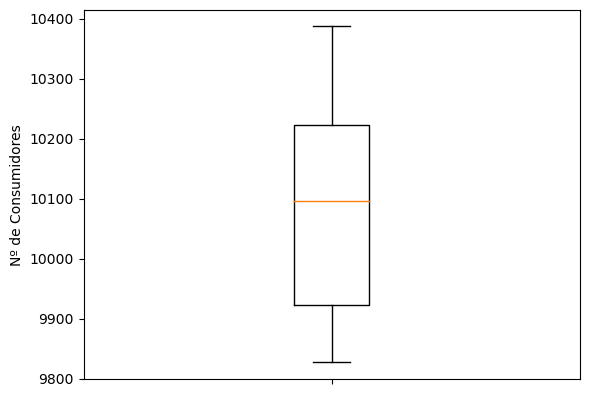

In [114]:
plt.boxplot(pico['Consumidores']) #desenhar histograma
plt.xticks(ticks=[1],labels=['']) #definir nome dos eixos
plt.ylabel('Nº de Consumidores')

ão tendo sido detetatdos outliers, apenas se observou a variação dos dados ao longo do tempo.

Text(0.5, 0, 'Timestamp')

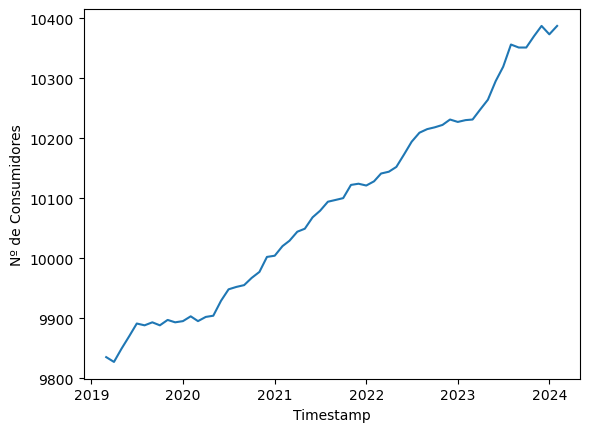

In [115]:
plt.plot(pico['Consumidores']) #desenhar gráfico
plt.ylabel('Nº de Consumidores') #definir nome dos eixos
plt.xlabel('Timestamp')

É de salientar que, apesar de ter existido um decréscimo no número de habitantes, o número de consumidores tem aumentado ao longo do ano. Tal pode ser justificado pelo aumento de qualidade de vida e pelo envelhecimento da população: as pessoas mais idosas têm falecido e os jovens adultos têm saído de casa. Por outro lado, estando os Açores a surgir como um novo destino turístico, o número de casas para alugar tem aumentado.

#### 2.6.3. Emissão Energética

Para verificar a distribuição da origem da emissão elétrica no Pico, foi criado um gráfico de setores.

(-1.0999999961420315,
 1.0999999998162873,
 -1.0999997953327785,
 1.0999997717763326)

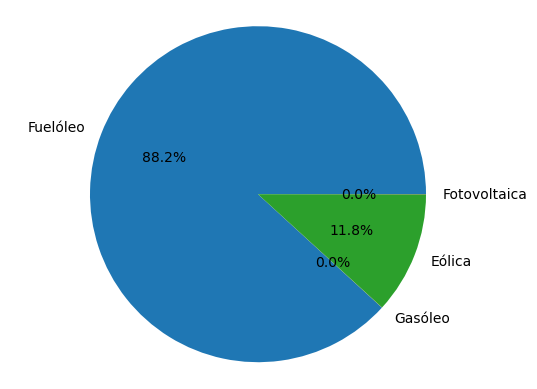

In [116]:
origem = pico.drop(columns=['Mês', 'Ano', 'Ilha', 'Habitantes', 'Consumidores', 'Total']).sum() #somar ao longo dos anos
origem = origem[origem != 0] #eliminar resultados nulos
plt.pie(origem, labels=origem.index, autopct='%1.1f%%')
plt.axis('equal')

#### 2.6.3.1. Fuelóleo

Para verificar "visualmente" a existência de outliers foi realizado um histograma.

Text(0, 0.5, 'kW')

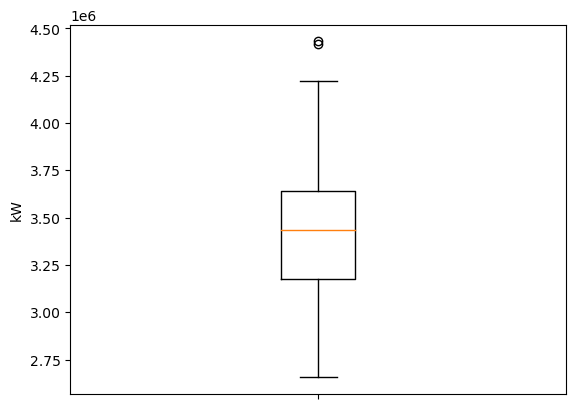

In [117]:
plt.boxplot(pico['Fuelóleo']) #desenhar histograma
plt.xticks(ticks=[1],labels=['']) #definir nome dos eixos
plt.ylabel('kW')

Para encontrar os outliers detetados iniciamente foi calculada a distância interquartil.

In [118]:
Q1 = pico['Fuelóleo'].quantile(0.25) #encontrar os quartis
Q3 = pico['Fuelóleo'].quantile(0.75)
IQR = Q3 - Q1 #calcular amplitude interquartil
sup = Q3 + 1.5 * IQR #calcular limite
outliers_sup = (pico['Fuelóleo'] > sup)  #encontrar outliers
outliers = pico[outliers_sup]

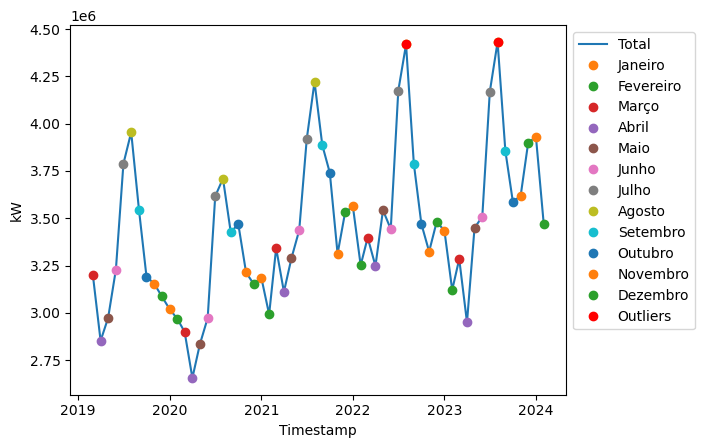

In [119]:
plt.plot(pico['Fuelóleo'], label='Total') #desenhar gráfico
plt.plot(janeiro['Fuelóleo'], 'o', label='Janeiro')
plt.plot(fevereiro['Fuelóleo'], 'o', label='Fevereiro')
plt.plot(marco['Fuelóleo'], 'o', label='Março')
plt.plot(abril['Fuelóleo'], 'o', label='Abril')
plt.plot(maio['Fuelóleo'], 'o', label='Maio')
plt.plot(junho['Fuelóleo'], 'o', label='Junho')
plt.plot(julho['Fuelóleo'], 'o', label='Julho')
plt.plot(agosto['Fuelóleo'], 'o', label='Agosto')
plt.plot(setembro['Fuelóleo'], 'o', label='Setembro')
plt.plot(outubro['Fuelóleo'], 'o', label='Outubro')
plt.plot(novembro['Fuelóleo'], 'o', label='Novembro')
plt.plot(dezembro['Fuelóleo'], 'o', label='Dezembro')
plt.plot(outliers['Fuelóleo'], 'ro', label='Outliers')
plt.ylabel('kW') #definir nome dos eixos
plt.xlabel('Timestamp')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')

Dado que a emissão de fuelóleo tem aumentado ao longo dos anos, considerou-se que esta evoluçãoestá de acordo com a realidade, tendo-se optado por considerar que os outliers não necessitam de correção. Para além disso, é possível verificar uma perioricidade anual nos dados. O período de verão apresenta sempre um pico na emissão (muito provavelmente devido às elevadas temperaturas). Por outro lado, o período de primavera corresponde sempre a um vale (muito provavelmente às temperaturas amenas).

#### 2.6.3.2. Gasóleo

Para verificar "visualmente" a existência de outliers foi realizado um histograma.

Text(0, 0.5, 'kW')

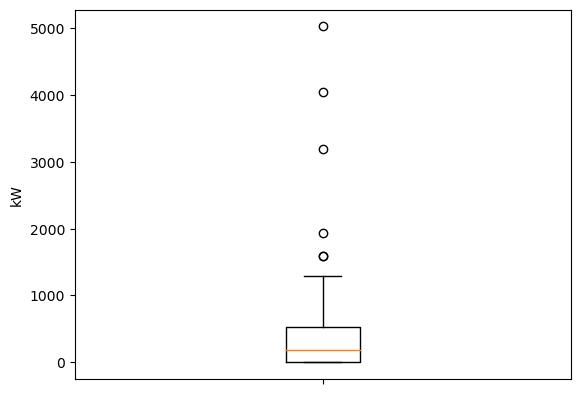

In [120]:
plt.boxplot(pico['Gasóleo']) #desenhar histograma
plt.xticks(ticks=[1],labels=['']) #definir nome dos eixos
plt.ylabel('kW')

Para encontrar os outliers detetados iniciamente foi calculada a distância interquartil.

In [121]:
Q1 = pico['Gasóleo'].quantile(0.25) #encontrar os quartis
Q3 = pico['Gasóleo'].quantile(0.75)
IQR = Q3 - Q1 #calcular amplitude interquartil
sup = Q3 + 1.5 * IQR #calcular limite
outliers_sup = (pico['Gasóleo'] > sup)  #encontrar outliers
outliers = pico[outliers_sup]

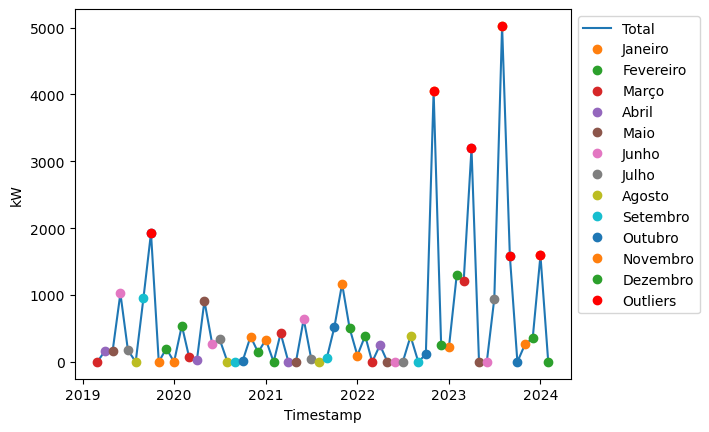

In [122]:
plt.plot(pico['Gasóleo'], label='Total') #desenhar gráfico
plt.plot(janeiro['Gasóleo'], 'o', label='Janeiro')
plt.plot(fevereiro['Gasóleo'], 'o', label='Fevereiro')
plt.plot(marco['Gasóleo'], 'o', label='Março')
plt.plot(abril['Gasóleo'], 'o', label='Abril')
plt.plot(maio['Gasóleo'], 'o', label='Maio')
plt.plot(junho['Gasóleo'], 'o', label='Junho')
plt.plot(julho['Gasóleo'], 'o', label='Julho')
plt.plot(agosto['Gasóleo'], 'o', label='Agosto')
plt.plot(setembro['Gasóleo'], 'o', label='Setembro')
plt.plot(outubro['Gasóleo'], 'o', label='Outubro')
plt.plot(novembro['Gasóleo'], 'o', label='Novembro')
plt.plot(dezembro['Gasóleo'], 'o', label='Dezembro')
plt.plot(outliers['Gasóleo'], 'ro', label='Outliers')
plt.ylabel('kW') #definir nome dos eixos
plt.xlabel('Timestamp')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')

Não foi encontrada qualquer explicação plausível para os valores atípicos identidicados como outliers. Assim, torna-se necessário corrígi-los por valores mais apropriados, tendo-se utilizado a médias dos cinco anos nesses meses.

In [465]:
indice = pico[(pico['Mês']==10) & (pico['Ano']==2019)].index
valores = pico[(pico['Mês']==10) & (pico['Ano']!=2019)]['Gasóleo']
outubro_novo = valores.mean()
pico.loc[indice, 'Gasóleo'] = outubro_novo
indice = pico[(pico['Mês']==11) & (pico['Ano']==2022)].index
valores = pico[(pico['Mês']==11) & (pico['Ano']!=2022)]['Gasóleo']
novembro_novo = valores.mean()
pico.loc[indice, 'Gasóleo'] = novembro_novo
indice = pico[(pico['Mês']==4) & (pico['Ano']==2023)].index
valores = pico[(pico['Mês']==4) & (pico['Ano']!=2023)]['Gasóleo']
abril_novo = valores.mean()
pico.loc[indice, 'Gasóleo'] = abril_novo
indice = pico[(pico['Mês']==8) & (pico['Ano']==2023)].index
valores = pico[(pico['Mês']==8) & (pico['Ano']!=2023)]['Gasóleo']
agosto_novo = valores.mean()
pico.loc[indice, 'Gasóleo'] = agosto_novo
indice = pico[(pico['Mês']==9) & (pico['Ano']==2023)].index
valores = pico[(pico['Mês']==9) & (pico['Ano']!=2023)]['Gasóleo']
setembro_novo = valores.mean()
pico.loc[indice, 'Gasóleo'] = setembro_novo
indice = pico[(pico['Mês']==1) & (pico['Ano']==2024)].index
valores = pico[(pico['Mês']==1) & (pico['Ano']!=2024)]['Gasóleo']
janeiro_novo = valores.mean()
pico.loc[indice, 'Gasóleo'] = janeiro_novo

#### 2.6.3.3. Eólica

Para verificar "visualmente" a existência de outliers foi realizado um histograma.

Text(0, 0.5, 'kW')

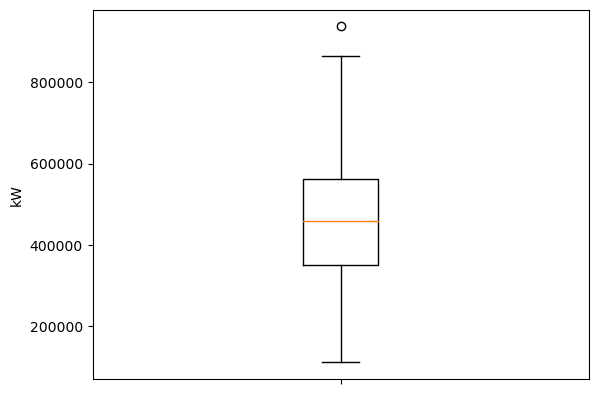

In [124]:
plt.boxplot(pico['Eólica']) #desenhar histograma
plt.xticks(ticks=[1],labels=['']) #definir nome dos eixos
plt.ylabel('kW')

Para encontrar os outliers detetados iniciamente foi calculada a distância interquartil.

In [125]:
Q1 = pico['Eólica'].quantile(0.25) #encontrar os quartis
Q3 = pico['Eólica'].quantile(0.75)
IQR = Q3 - Q1 #calcular amplitude interquartil
sup = Q3 + 1.5 * IQR #calcular limite
outliers_sup = (pico['Eólica'] > sup)  #encontrar outliers
outliers = pico[outliers_sup]

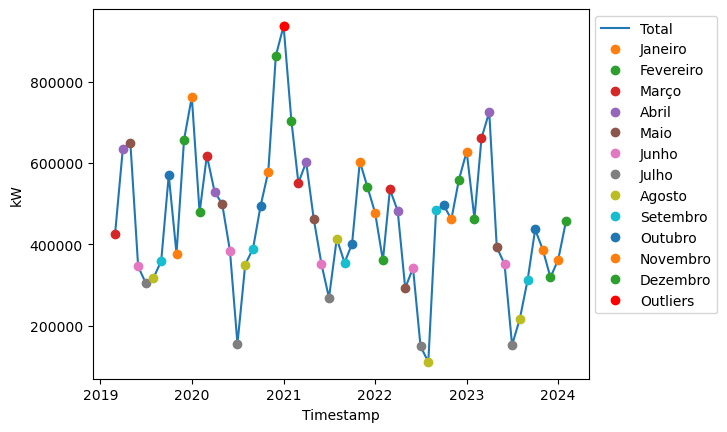

In [126]:
plt.plot(pico['Eólica'], label='Total') #desenhar gráfico
plt.plot(janeiro['Eólica'], 'o', label='Janeiro')
plt.plot(fevereiro['Eólica'], 'o', label='Fevereiro')
plt.plot(marco['Eólica'], 'o', label='Março')
plt.plot(abril['Eólica'], 'o', label='Abril')
plt.plot(maio['Eólica'], 'o', label='Maio')
plt.plot(junho['Eólica'], 'o', label='Junho')
plt.plot(julho['Eólica'], 'o', label='Julho')
plt.plot(agosto['Eólica'], 'o', label='Agosto')
plt.plot(setembro['Eólica'], 'o', label='Setembro')
plt.plot(outubro['Eólica'], 'o', label='Outubro')
plt.plot(novembro['Eólica'], 'o', label='Novembro')
plt.plot(dezembro['Eólica'], 'o', label='Dezembro')
plt.plot(outliers['Eólica'], 'ro', label='Outliers')
plt.ylabel('kW') #definir nome dos eixos
plt.xlabel('Timestamp')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')

Dado que o outlier corresponde a um pico nos meses no inverno, nos quais se espera que o vento seja mais frequente e forte e, uma vez que a diferença para os restantes valores não é significativa, optou-se por considerar que o outlier não necessita de correção.

#### 2.6.3.4. Fotovoltaica

Para verificar "visualmente" a existência de outliers foi realizado um histograma.

Text(0, 0.5, 'kW')

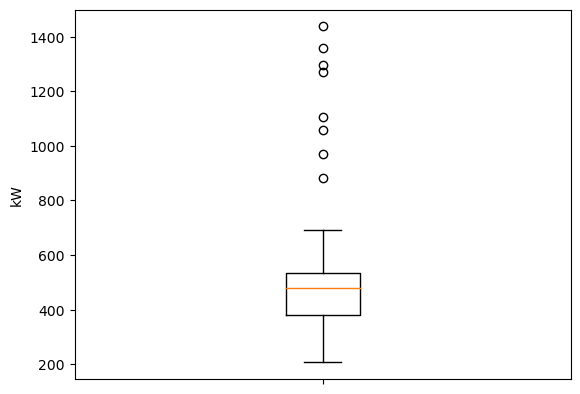

In [127]:
plt.boxplot(pico['Fotovoltaica']) #desenhar histograma
plt.xticks(ticks=[1],labels=['']) #definir nome dos eixos
plt.ylabel('kW')

Para encontrar os outliers detetados iniciamente foi calculada a distância interquartil.

In [128]:
Q1 = pico['Fotovoltaica'].quantile(0.25) #encontrar os quartis
Q3 = pico['Fotovoltaica'].quantile(0.75)
IQR = Q3 - Q1 #calcular amplitude interquartil
sup = Q3 + 1.5 * IQR #calcular limite
outliers_sup = (pico['Fotovoltaica'] > sup)  #encontrar outliers
outliers = pico[outliers_sup]

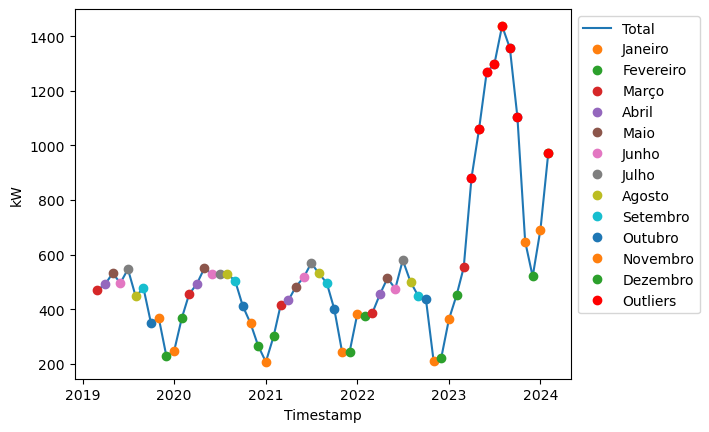

In [129]:
plt.plot(pico['Fotovoltaica'], label='Total') #desenhar gráfico
plt.plot(janeiro['Fotovoltaica'], 'o', label='Janeiro')
plt.plot(fevereiro['Fotovoltaica'], 'o', label='Fevereiro')
plt.plot(marco['Fotovoltaica'], 'o', label='Março')
plt.plot(abril['Fotovoltaica'], 'o', label='Abril')
plt.plot(maio['Fotovoltaica'], 'o', label='Maio')
plt.plot(junho['Fotovoltaica'], 'o', label='Junho')
plt.plot(julho['Fotovoltaica'], 'o', label='Julho')
plt.plot(agosto['Fotovoltaica'], 'o', label='Agosto')
plt.plot(setembro['Fotovoltaica'], 'o', label='Setembro')
plt.plot(outubro['Fotovoltaica'], 'o', label='Outubro')
plt.plot(novembro['Fotovoltaica'], 'o', label='Novembro')
plt.plot(dezembro['Fotovoltaica'], 'o', label='Dezembro')
plt.plot(outliers['Fotovoltaica'], 'ro', label='Outliers')
plt.ylabel('kW') #definir nome dos eixos
plt.xlabel('Timestamp')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')

Dado que a emissão de energia fotovoltaica tem aumentado ao longo dos anos devido ao investimento na instalação de novos painéis, considerou-se que esta evolução está de acordo com a realidade, tendo-se optado por considerar que os outliers não necessitam de correção. Mais uma vez, existe uma perioricidade anual. O pico surge nos meses de verão (abril, maio, junho, julho e agosto), quando os dias são mais longos e solarengos. O vale surge nos meses de inverno (novembro, dezembro, janeiro e fevereiro), quando os dias são mais curtos e menos solarengos.

### 2.7. Faial

In [130]:
janeiro = faial[faial['Mês'] == 1] #separar os dados por mês
fevereiro = faial[faial['Mês'] == 2]
marco = faial[faial['Mês'] == 3]
abril = faial[faial['Mês'] == 4]
maio = faial[faial['Mês'] == 5]
junho = faial[faial['Mês'] == 6]
julho = faial[faial['Mês'] == 7]
agosto = faial[faial['Mês'] == 8]
setembro = faial[faial['Mês'] == 9]
outubro = faial[faial['Mês'] == 10]
novembro = faial[faial['Mês'] == 11]
dezembro = faial[faial['Mês'] == 12]

#### 2.7.1. Estatística

Inicialmente optou-se por estudar os dados no geral, calculando a média, desvio padrão, mínimo, máximo e quartis.

In [131]:
faial.describe() #calcular alguns valores estatísticos da dataframe

,Mês,Ano,Habitantes,Consumidores,Fuelóleo,Gasóleo,Hídrica,Geotérmica,Eólica,Fotovoltaica,Resíduos,Outras Renováveis,Total
count,60.000000,60.000000,60.000000,60.000000,6.000000e+01,60.000000,60.000000,60.0,60.000000,60.000000,60.0,60.0,6.000000e+01
mean,6.500000,2021.166667,14572.083333,8329.600000,3.410608e+06,2168.233333,7499.100000,0.0,501778.016667,1732.433333,0.0,0.0,3.923785e+06
std,3.481184,1.474836,174.749049,95.752541,3.486792e+05,2800.449373,14853.884612,0.0,148417.705201,2705.815585,0.0,0.0,2.757914e+05
min,1.000000,2019.000000,14423.000000,8137.000000,2.799925e+06,0.000000,0.000000,0.0,169967.000000,0.000000,0.0,0.0,3.263890e+06
25%,3.750000,2020.000000,14443.000000,8231.000000,3.147404e+06,0.000000,0.000000,0.0,426982.500000,0.000000,0.0,0.0,3.713724e+06
50%,6.500000,2021.000000,14443.000000,8348.500000,3.338668e+06,1275.000000,0.000000,0.0,485408.000000,22.500000,0.0,0.0,3.899895e+06
75%,9.250000,2022.000000,14824.000000,8403.500000,3.640962e+06,3518.750000,8322.750000,0.0,610890.250000,2736.250000,0.0,0.0,4.121830e+06
max,12.000000,2024.000000,14824.000000,8487.000000,4.379083e+06,12213.000000,74278.000000,0.0,869726.000000,10842.000000,0.0,0.0,4.565798e+06


#### 2.7.2. Habitantes e Consumidores

Para verificar "visualmente" a existência de outliers foi realizado um histograma.

Text(0, 0.5, 'Nº de Habitantes')

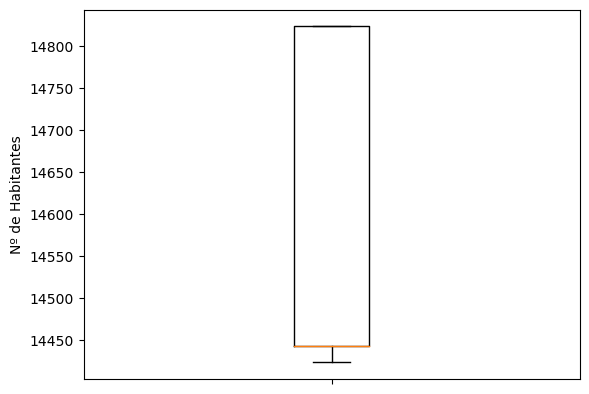

In [132]:
plt.boxplot(faial['Habitantes']) #desenhar histograma
plt.xticks(ticks=[1],labels=['']) #definir nome dos eixos
plt.ylabel('Nº de Habitantes')

Não tendo sido detetatdos outliers, apenas se observou a variação dos dados ao longo do tempo.

Text(0.5, 0, 'Timestamp')

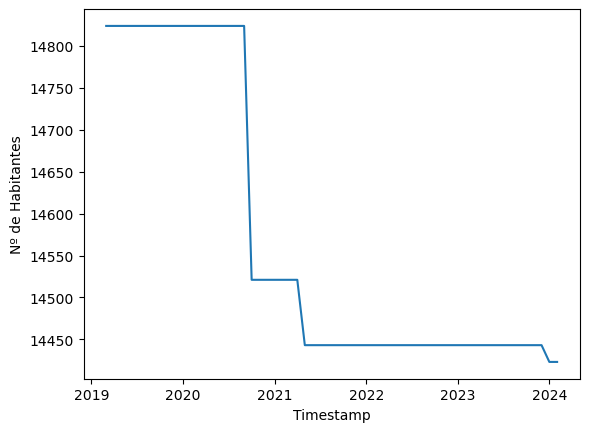

In [133]:
plt.plot(faial['Habitantes']) #desenhar gráfico
plt.ylabel('Nº de Habitantes') #definir nome dos eixos
plt.xlabel('Timestamp')

Para verificar "visualmente" a existência de outliers foi realizado um histograma.

Text(0, 0.5, 'Nº de Consumidores')

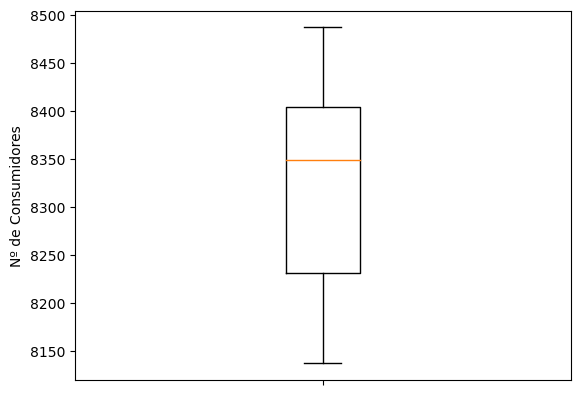

In [134]:
plt.boxplot(faial['Consumidores']) #desenhar histograma
plt.xticks(ticks=[1],labels=['']) #definir nome dos eixos
plt.ylabel('Nº de Consumidores')

Não tendo sido detetatdos outliers, apenas se observou a variação dos dados ao longo do tempo.

Text(0.5, 0, 'Timestamp')

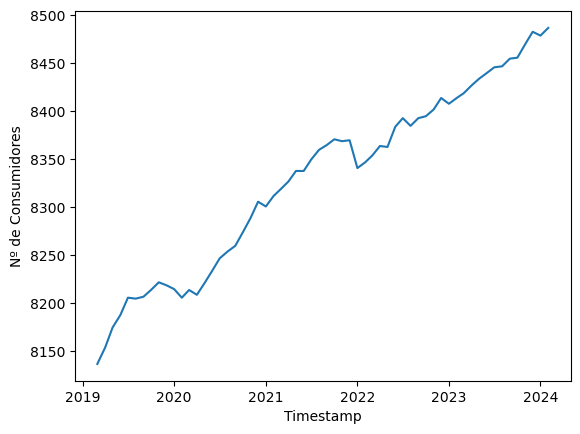

In [135]:
plt.plot(faial['Consumidores']) #desenhar gráfico
plt.ylabel('Nº de Consumidores') #definir nome dos eixos
plt.xlabel('Timestamp')

É de salientar que, apesar de ter existido um decréscimo no número de habitantes, o número de consumidores tem aumentado ao longo do ano. Tal pode ser justificado pelo aumento de qualidade de vida ou envelhecimento da população: as pessoas mais idosas têm falecido e os jovens adultos têm saído de casa. Por outro lado, estando os Açores a surgir como um novo destino turístico, o número de casas para alugar tem aumentado.

#### 2.7.3. Emissão Energética

Para verificar a distribuição da origem da emissão elétrica em São Miguel, foi criado um gráfico de setores.

(-1.0999999445547848,
 1.0999999973597516,
 -1.0999999415798347,
 1.0999998185093498)

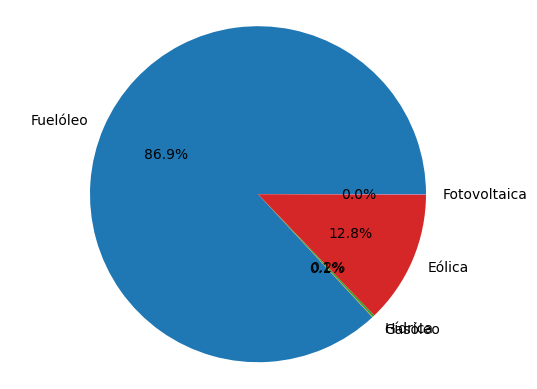

In [136]:
origem = faial.drop(columns=['Mês', 'Ano', 'Ilha', 'Habitantes', 'Consumidores', 'Total']).sum() #somar ao longo dos anos
origem = origem[origem != 0] #eliminar resultados nulos
plt.pie(origem, labels=origem.index, autopct='%1.1f%%')
plt.axis('equal')

#### 2.7.3.1. Fuelóleo

Para verificar "visualmente" a existência de outliers foi realizado um histograma.

Text(0, 0.5, 'kW')

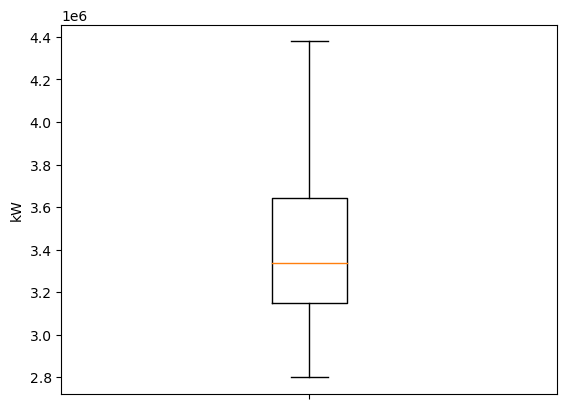

In [137]:
plt.boxplot(faial['Fuelóleo']) #desenhar histograma
plt.xticks(ticks=[1],labels=['']) #definir nome dos eixos
plt.ylabel('kW')

Não tendo sido detetatdos outliers, apenas se observou a variação dos dados ao longo do tempo.

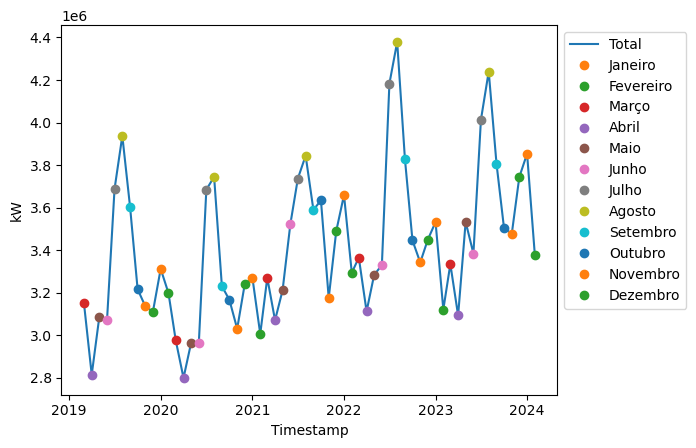

In [138]:
plt.plot(faial['Fuelóleo'], label='Total') #desenhar gráfico
plt.plot(janeiro['Fuelóleo'], 'o', label='Janeiro')
plt.plot(fevereiro['Fuelóleo'], 'o', label='Fevereiro')
plt.plot(marco['Fuelóleo'], 'o', label='Março')
plt.plot(abril['Fuelóleo'], 'o', label='Abril')
plt.plot(maio['Fuelóleo'], 'o', label='Maio')
plt.plot(junho['Fuelóleo'], 'o', label='Junho')
plt.plot(julho['Fuelóleo'], 'o', label='Julho')
plt.plot(agosto['Fuelóleo'], 'o', label='Agosto')
plt.plot(setembro['Fuelóleo'], 'o', label='Setembro')
plt.plot(outubro['Fuelóleo'], 'o', label='Outubro')
plt.plot(novembro['Fuelóleo'], 'o', label='Novembro')
plt.plot(dezembro['Fuelóleo'], 'o', label='Dezembro')
plt.ylabel('kW') #definir nome dos eixos
plt.xlabel('Timestamp')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')

É possível verificar uma perioricidade anual nos dados. O período de verão apresenta sempre um pico na emissão (muito provavelmente devido às elevadas temperaturas). Por outro lado, o período de primavera corresponde sempre a um vale (muito provavelmente às temperaturas amenas).

#### 2.7.3.2. Gasóleo

Para verificar "visualmente" a existência de outliers foi realizado um histograma.

Text(0, 0.5, 'kW')

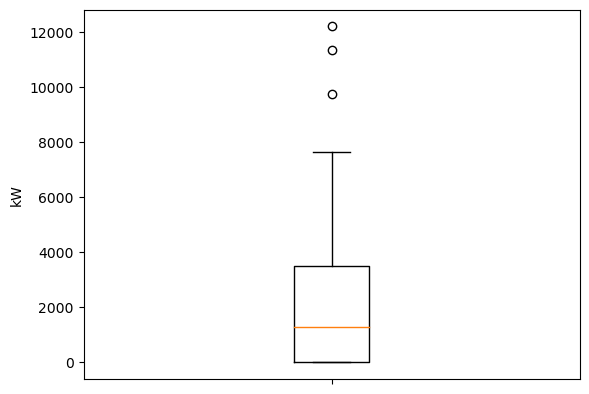

In [139]:
plt.boxplot(faial['Gasóleo']) #desenhar histograma
plt.xticks(ticks=[1],labels=['']) #definir nome dos eixos
plt.ylabel('kW')

Para encontrar os outliers detetados iniciamente foi calculada a distância interquartil.

In [140]:
Q1 = faial['Gasóleo'].quantile(0.25) #encontrar os quartis
Q3 = faial['Gasóleo'].quantile(0.75)
IQR = Q3 - Q1 #calcular amplitude interquartil
sup = Q3 + 1.5 * IQR #calcular limite
outliers_sup = (faial['Gasóleo'] > sup)  #encontrar outliers
outliers = faial[outliers_sup]

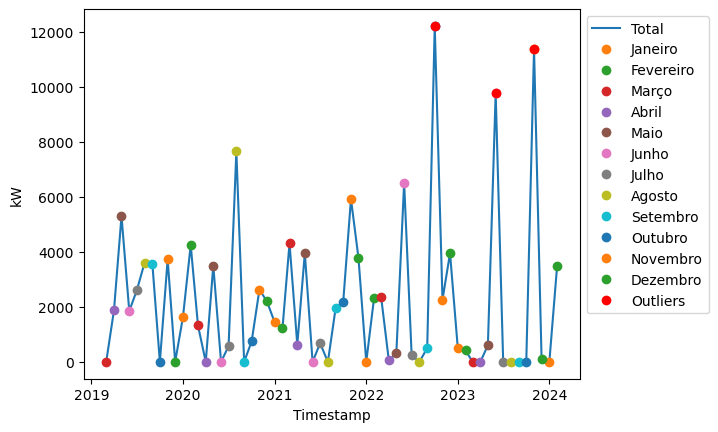

In [141]:
plt.plot(faial['Gasóleo'], label='Total') #desenhar gráfico
plt.plot(janeiro['Gasóleo'], 'o', label='Janeiro')
plt.plot(fevereiro['Gasóleo'], 'o', label='Fevereiro')
plt.plot(marco['Gasóleo'], 'o', label='Março')
plt.plot(abril['Gasóleo'], 'o', label='Abril')
plt.plot(maio['Gasóleo'], 'o', label='Maio')
plt.plot(junho['Gasóleo'], 'o', label='Junho')
plt.plot(julho['Gasóleo'], 'o', label='Julho')
plt.plot(agosto['Gasóleo'], 'o', label='Agosto')
plt.plot(setembro['Gasóleo'], 'o', label='Setembro')
plt.plot(outubro['Gasóleo'], 'o', label='Outubro')
plt.plot(novembro['Gasóleo'], 'o', label='Novembro')
plt.plot(dezembro['Gasóleo'], 'o', label='Dezembro')
plt.plot(outliers['Gasóleo'], 'ro', label='Outliers')
plt.ylabel('kW') #definir nome dos eixos
plt.xlabel('Timestamp')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')

Não foi encontrada qualquer explicação plausível para os valores atípicos identidicados como outliers. Assim, torna-se necessário corrígi-los por valores mais apropriados, tendo-se utilizado a médias dos cinco anos nesses meses.

In [142]:
indice = faial[(faial['Mês']==10) & (pico['Ano']==2022)].index
valores = faial[(faial['Mês']==10) & (pico['Ano']!=2022)]['Gasóleo']
outubro_novo = valores.mean()
pico.loc[indice, 'Gasóleo'] = outubro_novo
indice = faial[(faial['Mês']==6) & (pico['Ano']==2023)].index
valores = faial[(faial['Mês']==6) & (pico['Ano']!=2023)]['Gasóleo']
junho_novo = valores.mean()
pico.loc[indice, 'Gasóleo'] = junho_novo
indice = faial[(faial['Mês']==11) & (pico['Ano']==2023)].index
valores = faial[(faial['Mês']==11) & (pico['Ano']!=2023)]['Gasóleo']
novembro_novo = valores.mean()
pico.loc[indice, 'Gasóleo'] = novembro_novo

#### 2.7.3.3. Hídrica

Para verificar "visualmente" a existência de outliers foi realizado um histograma.

Text(0, 0.5, 'kW')

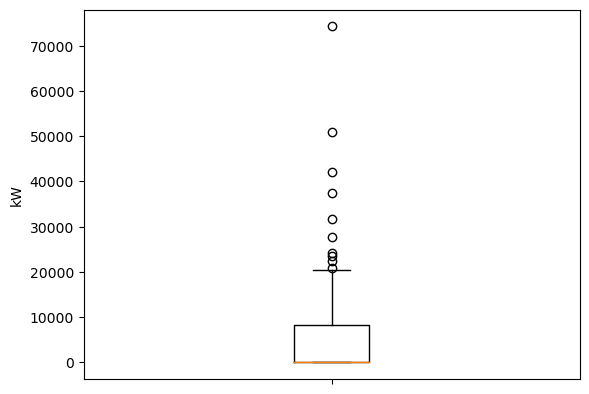

In [143]:
plt.boxplot(faial['Hídrica']) #desenhar histograma
plt.xticks(ticks=[1],labels=['']) #definir nome dos eixos
plt.ylabel('kW')

Para encontrar os outliers detetados iniciamente foi calculada a distância interquartil.

In [144]:
Q1 = faial['Hídrica'].quantile(0.25) #encontrar os quartis
Q3 = faial['Hídrica'].quantile(0.75)
IQR = Q3 - Q1 #calcular amplitude interquartil
sup = Q3 + 1.5 * IQR #calcular limite
outliers_sup = (faial['Hídrica'] > sup)  #encontrar outliers
outliers = faial[outliers_sup]

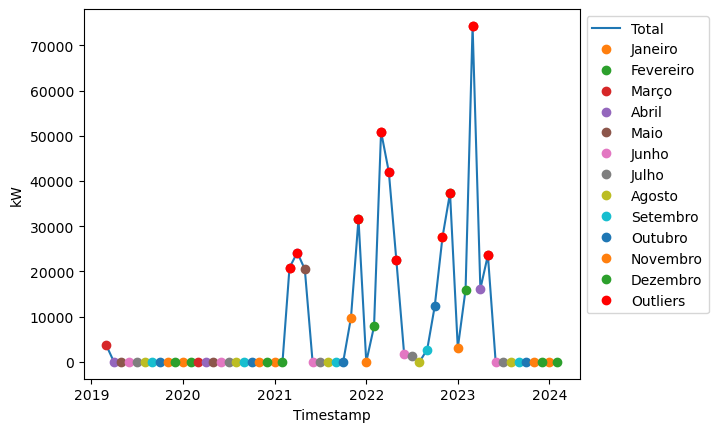

In [145]:
plt.plot(faial['Hídrica'], label='Total') #desenhar gráfico
plt.plot(janeiro['Hídrica'], 'o', label='Janeiro')
plt.plot(fevereiro['Hídrica'], 'o', label='Fevereiro')
plt.plot(marco['Hídrica'], 'o', label='Março')
plt.plot(abril['Hídrica'], 'o', label='Abril')
plt.plot(maio['Hídrica'], 'o', label='Maio')
plt.plot(junho['Hídrica'], 'o', label='Junho')
plt.plot(julho['Hídrica'], 'o', label='Julho')
plt.plot(agosto['Hídrica'], 'o', label='Agosto')
plt.plot(setembro['Hídrica'], 'o', label='Setembro')
plt.plot(outubro['Hídrica'], 'o', label='Outubro')
plt.plot(novembro['Hídrica'], 'o', label='Novembro')
plt.plot(dezembro['Hídrica'], 'o', label='Dezembro')
plt.plot(outliers['Hídrica'], 'ro', label='Outliers')
plt.ylabel('kW') #definir nome dos eixos
plt.xlabel('Timestamp')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')

A central hidroelétrica do Faial funciona numa caldeira que nem sempre apresenta as condições ideias para a sau utilização, por isso, nem sempre produz energia. Para além disso, dado que apenas uma pequena componente da eletricidade produzida tem esta origem, optou-se por não corrigir os outliers.

#### 2.7.3.4. Eólica

Para verificar "visualmente" a existência de outliers foi realizado um histograma.

Text(0, 0.5, 'kW')

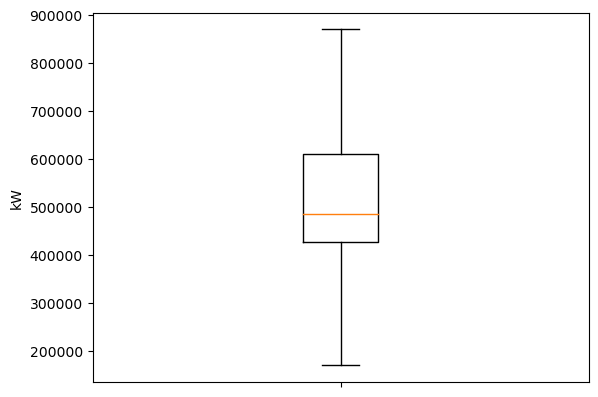

In [146]:
plt.boxplot(faial['Eólica']) #desenhar histograma
plt.xticks(ticks=[1],labels=['']) #definir nome dos eixos
plt.ylabel('kW')

Não tendo sido detetatdos outliers, apenas se observou a variação dos dados ao longo do tempo.

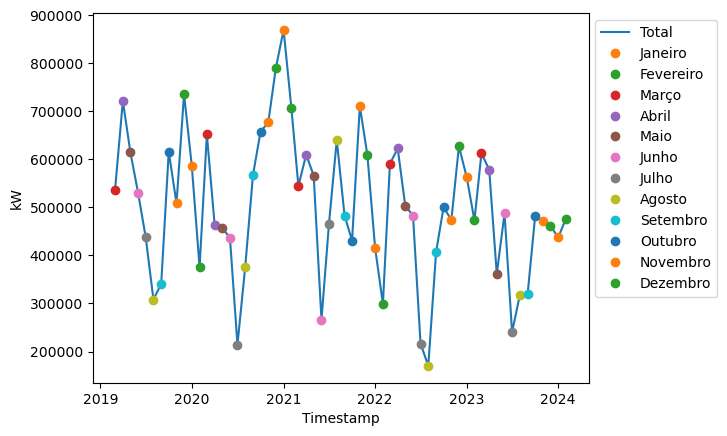

In [147]:
plt.plot(faial['Eólica'], label='Total') #desenhar gráfico
plt.plot(janeiro['Eólica'], 'o', label='Janeiro')
plt.plot(fevereiro['Eólica'], 'o', label='Fevereiro')
plt.plot(marco['Eólica'], 'o', label='Março')
plt.plot(abril['Eólica'], 'o', label='Abril')
plt.plot(maio['Eólica'], 'o', label='Maio')
plt.plot(junho['Eólica'], 'o', label='Junho')
plt.plot(julho['Eólica'], 'o', label='Julho')
plt.plot(agosto['Eólica'], 'o', label='Agosto')
plt.plot(setembro['Eólica'], 'o', label='Setembro')
plt.plot(outubro['Eólica'], 'o', label='Outubro')
plt.plot(novembro['Eólica'], 'o', label='Novembro')
plt.plot(dezembro['Eólica'], 'o', label='Dezembro')
plt.ylabel('kW') #definir nome dos eixos
plt.xlabel('Timestamp')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')

Apesar de ser mais dificíl encontrar uma perioricidade anual, é possível verificar que nos meses de inverno (novembro, dezembro e janeiro) os valores são superiores devido aos ventos serem mais frequentes e fortes. Enquanto que, nos meses de verão (junho, julho e agosto) os valores são inferiores devido aos vents serem menos frequentes e mais fracos.

#### 2.7.3.5. Fotovoltaica

Para verificar "visualmente" a existência de outliers foi realizado um histograma.

Text(0, 0.5, 'kW')

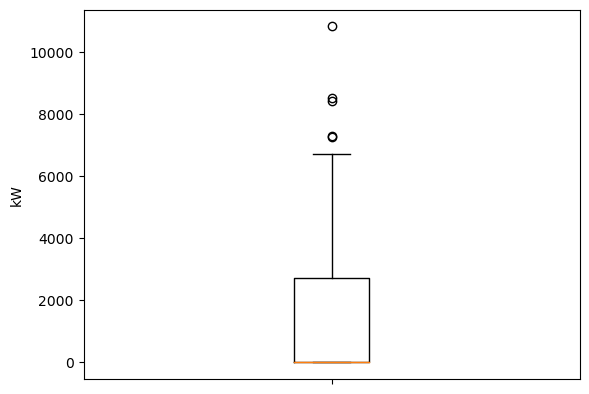

In [148]:
plt.boxplot(faial['Fotovoltaica']) #desenhar histograma
plt.xticks(ticks=[1],labels=['']) #definir nome dos eixos
plt.ylabel('kW')

Para encontrar os outliers detetados iniciamente foi calculada a distância interquartil.

In [149]:
Q1 = faial['Fotovoltaica'].quantile(0.25) #encontrar os quartis
Q3 = faial['Fotovoltaica'].quantile(0.75)
IQR = Q3 - Q1 #calcular amplitude interquartil
sup = Q3 + 1.5 * IQR #calcular limite
outliers_sup = (faial['Fotovoltaica'] > sup)  #encontrar outliers
outliers = faial[outliers_sup]

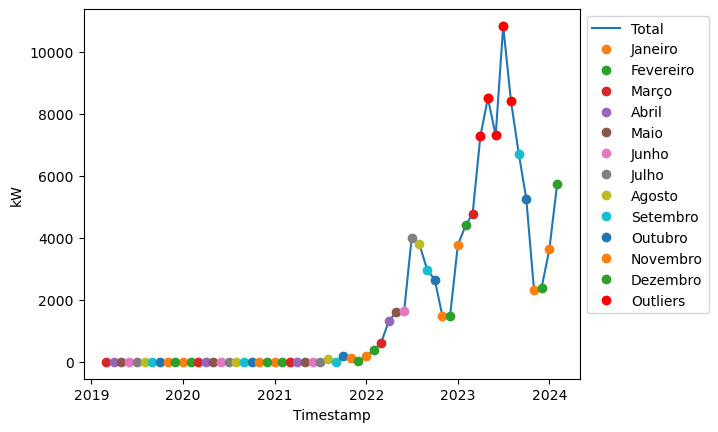

In [150]:
plt.plot(faial['Fotovoltaica'], label='Total') #desenhar gráfico
plt.plot(janeiro['Fotovoltaica'], 'o', label='Janeiro')
plt.plot(fevereiro['Fotovoltaica'], 'o', label='Fevereiro')
plt.plot(marco['Fotovoltaica'], 'o', label='Março')
plt.plot(abril['Fotovoltaica'], 'o', label='Abril')
plt.plot(maio['Fotovoltaica'], 'o', label='Maio')
plt.plot(junho['Fotovoltaica'], 'o', label='Junho')
plt.plot(julho['Fotovoltaica'], 'o', label='Julho')
plt.plot(agosto['Fotovoltaica'], 'o', label='Agosto')
plt.plot(setembro['Fotovoltaica'], 'o', label='Setembro')
plt.plot(outubro['Fotovoltaica'], 'o', label='Outubro')
plt.plot(novembro['Fotovoltaica'], 'o', label='Novembro')
plt.plot(dezembro['Fotovoltaica'], 'o', label='Dezembro')
plt.plot(outliers['Fotovoltaica'], 'ro', label='Outliers')
plt.ylabel('kW') #definir nome dos eixos
plt.xlabel('Timestamp')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')

Verificou-se que os primeiros painéis fotovoltaicos apenas surgiram em agosto de 2021, parecendo existir um maior investmento ao longo de 2023. Para além disso, uma vez que os outliers correspondem ao meses de verão, no qual se espera dias compridos e solarengos, considerou-se que estes não necessitam de correção.

### 2.8. Flores

In [151]:
janeiro = flores[flores['Mês'] == 1]
fevereiro = flores[flores['Mês'] == 2]
marco = flores[flores['Mês'] == 3]
abril = flores[flores['Mês'] == 4]
maio = flores[flores['Mês'] == 5]
junho = flores[flores['Mês'] == 6]
julho = flores[flores['Mês'] == 7]
agosto = flores[flores['Mês'] == 8]
setembro = flores[flores['Mês'] == 9]
outubro = flores[flores['Mês'] == 10]
novembro = flores[flores['Mês'] == 11]
dezembro = flores[flores['Mês'] == 12]

#### 2.8.1. Estatística

Inicialmente optou-se por estudar os dados no geral, calculando a média, desvio padrão, mínimo, máximo e quartis.

In [152]:
flores.describe() #calcular alguns valores estatísticos da dataframe

,Mês,Ano,Habitantes,Consumidores,Fuelóleo,Gasóleo,Hídrica,Geotérmica,Eólica,Fotovoltaica,Resíduos,Outras Renováveis,Total
count,60.000000,60.000000,60.000000,60.000000,60.0,60.000000,60.000000,60.0,60.000000,60.000000,60.0,60.0,6.000000e+01
mean,6.500000,2021.166667,3645.783333,2517.133333,0.0,441701.783333,442818.016667,0.0,55619.833333,251.683333,0.0,0.0,9.403913e+05
std,3.481184,1.474836,42.801509,35.805722,0.0,167109.000658,143231.545760,0.0,27882.341882,194.297212,0.0,0.0,5.423397e+04
min,1.000000,2019.000000,3503.000000,2464.000000,0.0,181516.000000,155377.000000,0.0,0.000000,0.000000,0.0,0.0,8.101590e+05
25%,3.750000,2020.000000,3627.000000,2481.750000,0.0,317692.750000,327891.000000,0.0,39883.250000,145.500000,0.0,0.0,9.075928e+05
50%,6.500000,2021.000000,3627.000000,2520.000000,0.0,405873.000000,443689.000000,0.0,58691.500000,231.000000,0.0,0.0,9.430015e+05
75%,9.250000,2022.000000,3699.000000,2553.750000,0.0,527317.250000,545009.000000,0.0,77214.250000,318.500000,0.0,0.0,9.735380e+05
max,12.000000,2024.000000,3699.000000,2570.000000,0.0,840521.000000,725949.000000,0.0,131094.000000,896.000000,0.0,0.0,1.058814e+06


#### 2.8.2. Habitantes e Consumidores

Para verificar "visualmente" a existência de outliers foi realizado um histograma.

Text(0, 0.5, 'Nº de Habitantes')

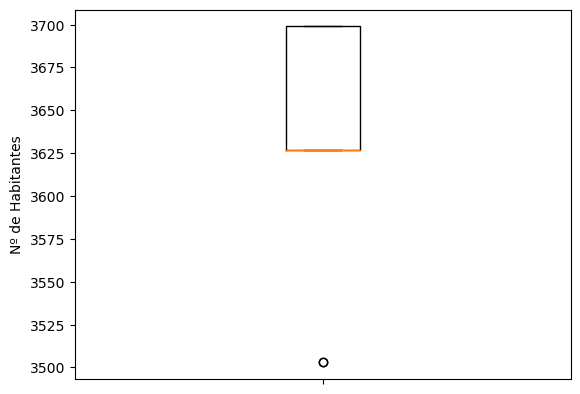

In [153]:
plt.boxplot(flores['Habitantes']) #desenhar histograma
plt.xticks(ticks=[1],labels=['']) #definir nome dos eixos
plt.ylabel('Nº de Habitantes')

Para encontrar os outliers detetados iniciamente foi calculada a distância interquartil.

In [154]:
Q1 = flores['Habitantes'].quantile(0.25) #encontrar os quartis
Q3 = flores['Habitantes'].quantile(0.75)
IQR = Q3 - Q1 #calcular amplitude interquartil
inf = Q1 - 1.5 * IQR #calcular limite
outliers_inf = (flores['Habitantes'] < inf)  #encontrar outliers
outliers = flores[outliers_inf]

Text(0.5, 0, 'Timestamp')

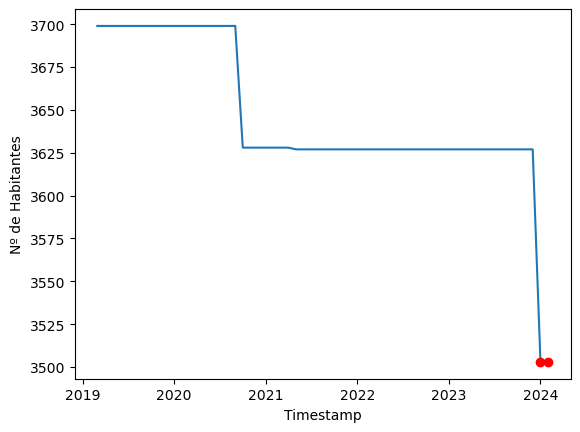

In [155]:
plt.plot(flores['Habitantes']) #desenhar gráfico
plt.plot(outliers['Habitantes'], 'ro')
plt.ylabel('Nº de Habitantes') #definir nome dos eixos
plt.xlabel('Timestamp')

Dado que a diferença entre o número de habitantes ao longo do tempo é inferior a 6%, optou-se por considerar que os outliers não necessitam de correção.

Para verificar "visualmente" a existência de outliers foi realizado um histograma.

Text(0, 0.5, 'Nº de Consumidores')

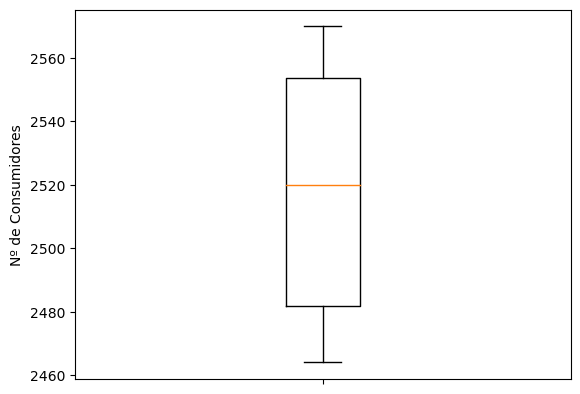

In [156]:
plt.boxplot(flores['Consumidores']) #desenhar histograma
plt.xticks(ticks=[1],labels=['']) #definir nome dos eixos
plt.ylabel('Nº de Consumidores')

Não tendo sido detetatdos outliers, apenas se observou a variação dos dados ao longo do tempo.

Text(0.5, 0, 'Timestamp')

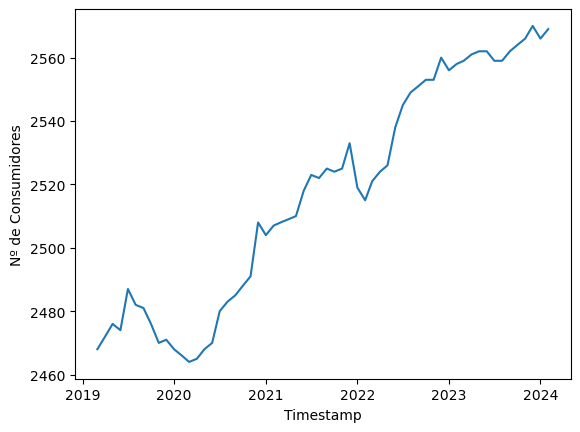

In [157]:
plt.plot(flores['Consumidores']) #desenhar gráfico
plt.ylabel('Nº de Consumidores') #definir nome dos eixos
plt.xlabel('Timestamp')

É de salientar que, apesar de ter existido um decréscimo no número de habitantes, o número de consumidores tem aumentado ao longo do ano. Tal pode ser justificado pelo aumento de qualidade de vida ou envelhecimento da população: as pessoas mais idosas têm falecido e os jovens adultos têm saído de casa. Por outro lado, estando os Açores a surgir como um novo destino turístico, o número de casas para alugar tem aumentado.

#### 2.8.3. Emissão Energética

Para verificar a distribuição da origem da emissão elétrica no Corvo, foi criado um gráfico de setores.

(-1.0999905393172988, 1.0999995494913, -1.0999820263318654, 1.0999972748904563)

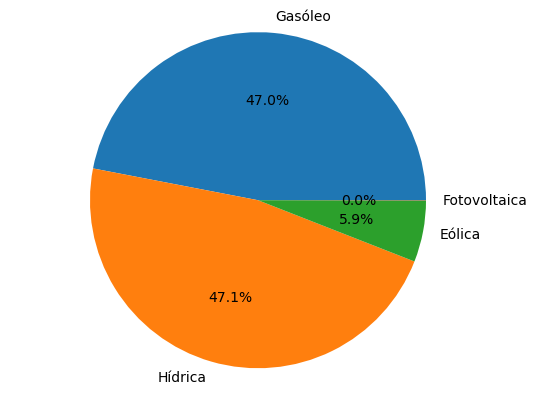

In [158]:
origem = flores.drop(columns=['Mês', 'Ano', 'Ilha', 'Habitantes', 'Consumidores', 'Total']).sum() #somar ao longo dos anos
origem = origem[origem != 0] #eliminar resultados nulos
plt.pie(origem, labels=origem.index, autopct='%1.1f%%')
plt.axis('equal')

#### 2.8.3.1. Gasóleo

Para verificar "visualmente" a existência de outliers foi realizado um histograma.

Text(0, 0.5, 'kW')

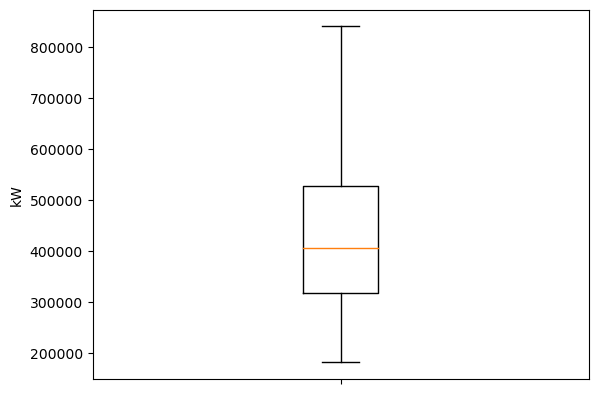

In [159]:
plt.boxplot(flores['Gasóleo']) #desenhar histograma
plt.xticks(ticks=[1],labels=['']) #definir nome dos eixos
plt.ylabel('kW')

Não tendo sido detetatdos outliers, apenas se observou a variação dos dados ao longo do tempo.

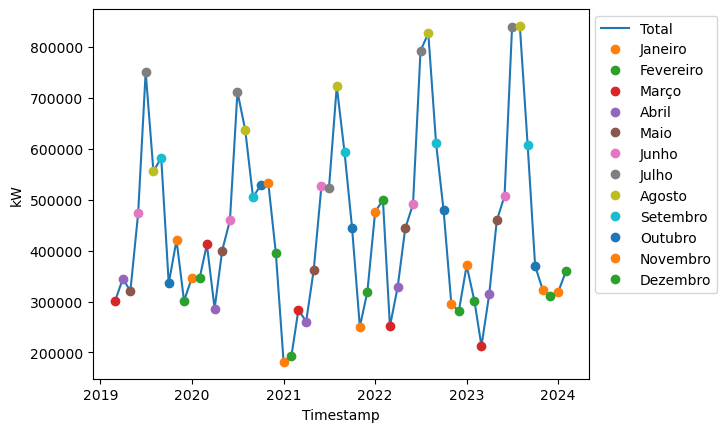

In [160]:
plt.plot(flores['Gasóleo'], label='Total') #desenhar gráfico
plt.plot(janeiro['Gasóleo'], 'o', label='Janeiro')
plt.plot(fevereiro['Gasóleo'], 'o', label='Fevereiro')
plt.plot(marco['Gasóleo'], 'o', label='Março')
plt.plot(abril['Gasóleo'], 'o', label='Abril')
plt.plot(maio['Gasóleo'], 'o', label='Maio')
plt.plot(junho['Gasóleo'], 'o', label='Junho')
plt.plot(julho['Gasóleo'], 'o', label='Julho')
plt.plot(agosto['Gasóleo'], 'o', label='Agosto')
plt.plot(setembro['Gasóleo'], 'o', label='Setembro')
plt.plot(outubro['Gasóleo'], 'o', label='Outubro')
plt.plot(novembro['Gasóleo'], 'o', label='Novembro')
plt.plot(dezembro['Gasóleo'], 'o', label='Dezembro')
plt.ylabel('kW') #definir nome dos eixos
plt.xlabel('Timestamp')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')

É possível verificar uma perioricidade anual nos dados. O período de verão apresenta sempre um pico na emissão (muito provavelmente devido às elevadas temperaturas). Por outro lado, o período de primavera corresponde sempre a um vale (muito provavelmente devido às temperaturas amenas).

#### 2.8.3.2. Hídrica

Para verificar "visualmente" a existência de outliers foi realizado um histograma.

Text(0, 0.5, 'kW')

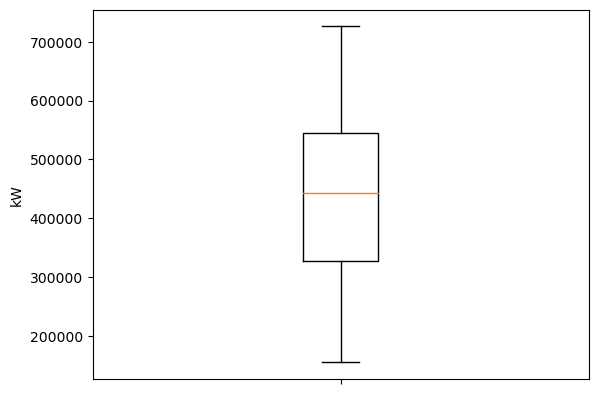

In [161]:
plt.boxplot(flores['Hídrica']) #desenhar histograma
plt.xticks(ticks=[1],labels=['']) #definir nome dos eixos
plt.ylabel('kW')

Não tendo sido detetatdos outliers, apenas se observou a variação dos dados ao longo do tempo.

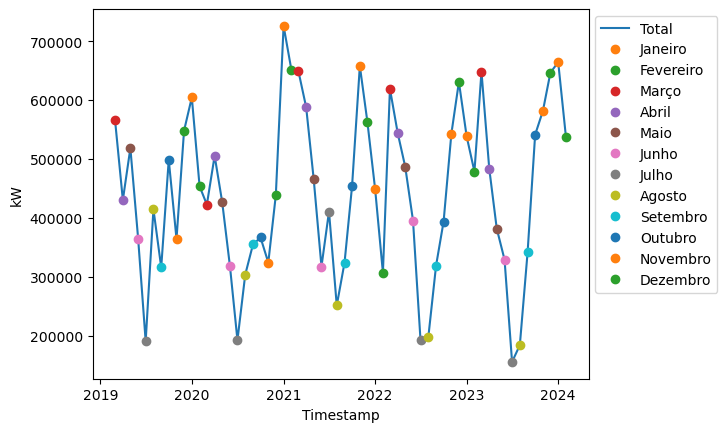

In [162]:
plt.plot(flores['Hídrica'], label='Total') #desenhar gráfico
plt.plot(janeiro['Hídrica'], 'o', label='Janeiro')
plt.plot(fevereiro['Hídrica'], 'o', label='Fevereiro')
plt.plot(marco['Hídrica'], 'o', label='Março')
plt.plot(abril['Hídrica'], 'o', label='Abril')
plt.plot(maio['Hídrica'], 'o', label='Maio')
plt.plot(junho['Hídrica'], 'o', label='Junho')
plt.plot(julho['Hídrica'], 'o', label='Julho')
plt.plot(agosto['Hídrica'], 'o', label='Agosto')
plt.plot(setembro['Hídrica'], 'o', label='Setembro')
plt.plot(outubro['Hídrica'], 'o', label='Outubro')
plt.plot(novembro['Hídrica'], 'o', label='Novembro')
plt.plot(dezembro['Hídrica'], 'o', label='Dezembro')
plt.ylabel('kW') #definir nome dos eixos
plt.xlabel('Timestamp')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')

Apesar de ser mais dificíl encontrar uma perioricidade anual, é percetível os meses onde existe uma maior probabilidadde de precipitação (entre novembro a abril) correspondem a valores superiores.

#### 2.8.3.3. Eólica

Para verificar "visualmente" a existência de outliers foi realizado um histograma.

Text(0, 0.5, 'kW')

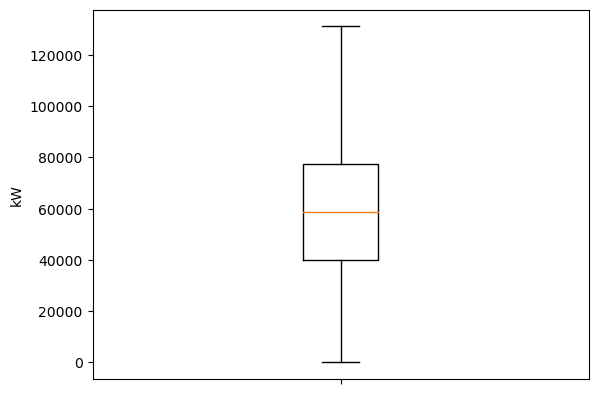

In [163]:
plt.boxplot(flores['Eólica']) #desenhar histograma
plt.xticks(ticks=[1],labels=['']) #definir nome dos eixos
plt.ylabel('kW')

Não tendo sido detetatdos outliers, apenas se observou a variação dos dados ao longo do tempo.

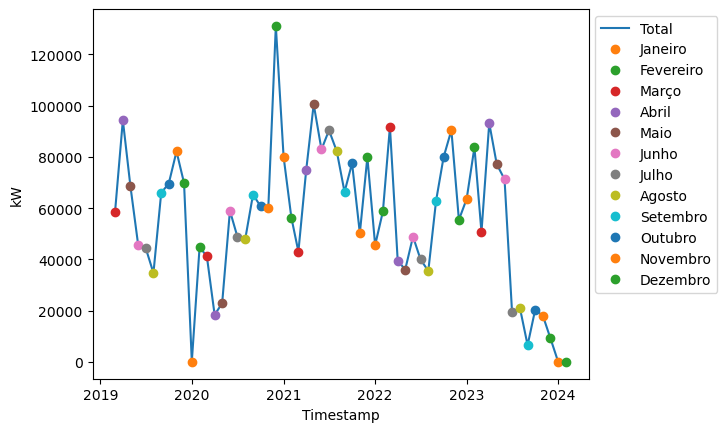

In [164]:
plt.plot(flores['Eólica'], label='Total') #desenhar gráfico
plt.plot(janeiro['Eólica'], 'o', label='Janeiro')
plt.plot(fevereiro['Eólica'], 'o', label='Fevereiro')
plt.plot(marco['Eólica'], 'o', label='Março')
plt.plot(abril['Eólica'], 'o', label='Abril')
plt.plot(maio['Eólica'], 'o', label='Maio')
plt.plot(junho['Eólica'], 'o', label='Junho')
plt.plot(julho['Eólica'], 'o', label='Julho')
plt.plot(agosto['Eólica'], 'o', label='Agosto')
plt.plot(setembro['Eólica'], 'o', label='Setembro')
plt.plot(outubro['Eólica'], 'o', label='Outubro')
plt.plot(novembro['Eólica'], 'o', label='Novembro')
plt.plot(dezembro['Eólica'], 'o', label='Dezembro')
plt.ylabel('kW') #definir nome dos eixos
plt.xlabel('Timestamp')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')

Apesar de a evolução da emissão de enrgia de origem eólica parecer ser aleatória, verifica-se um grande decréscimo neste ano, dado que o parque eólico da ilha se encontra em manutenção. Assim, decidiu substituir-se estes dois últimos valores nulos pela média dos cinco anos nesses meses.

In [165]:
indice = flores[(flores['Mês']==1) & (sao_miguel['Ano']==2024)].index
valores = flores[(flores['Mês']==1) & (sao_miguel['Ano']!=2024)]['Eólica']
janeiro_novo = valores.mean()
flores.loc[indice, 'Eólica'] = janeiro_novo
indice = flores[(flores['Mês']==2) & (sao_miguel['Ano']==2024)].index
valores = flores[(flores['Mês']==2) & (sao_miguel['Ano']!=2024)]['Eólica']
fevereiro_novo = valores.mean()
flores.loc[indice, 'Eólica'] = fevereiro_novo

#### 2.8.3.4. Fotovoltaica

Para verificar "visualmente" a existência de outliers foi realizado um histograma.

Text(0, 0.5, 'kW')

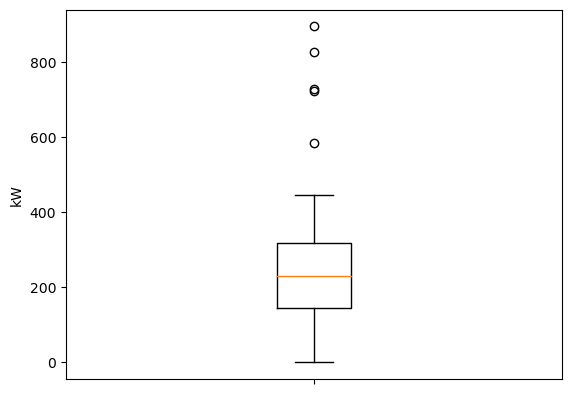

In [166]:
plt.boxplot(flores['Fotovoltaica']) #desenhar histograma
plt.xticks(ticks=[1],labels=['']) #definir nome dos eixos
plt.ylabel('kW')

Para encontrar os outliers detetados iniciamente foi calculada a distância interquartil.

In [167]:
Q1 = flores['Fotovoltaica'].quantile(0.25) #encontrar os quartis
Q3 = flores['Fotovoltaica'].quantile(0.75)
IQR = Q3 - Q1 #calcular amplitude interquartil
sup = Q3 + 1.5 * IQR #calcular limite
outliers_sup = (flores['Fotovoltaica'] > sup)  #encontrar outliers
outliers = flores[outliers_sup]

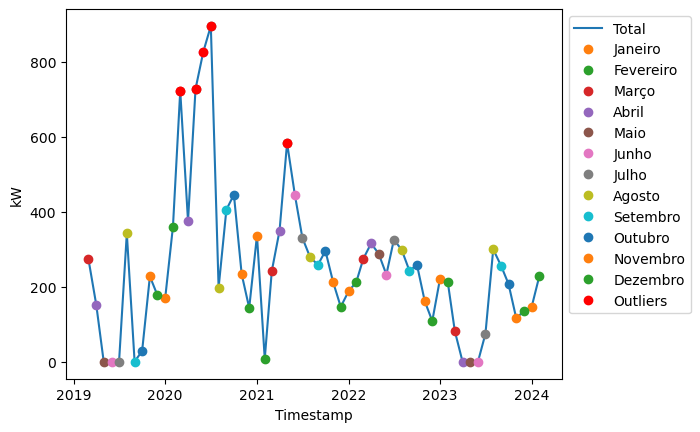

In [168]:
plt.plot(flores['Fotovoltaica'], label='Total') #desenhar gráfico
plt.plot(janeiro['Fotovoltaica'], 'o', label='Janeiro')
plt.plot(fevereiro['Fotovoltaica'], 'o', label='Fevereiro')
plt.plot(marco['Fotovoltaica'], 'o', label='Março')
plt.plot(abril['Fotovoltaica'], 'o', label='Abril')
plt.plot(maio['Fotovoltaica'], 'o', label='Maio')
plt.plot(junho['Fotovoltaica'], 'o', label='Junho')
plt.plot(julho['Fotovoltaica'], 'o', label='Julho')
plt.plot(agosto['Fotovoltaica'], 'o', label='Agosto')
plt.plot(setembro['Fotovoltaica'], 'o', label='Setembro')
plt.plot(outubro['Fotovoltaica'], 'o', label='Outubro')
plt.plot(novembro['Fotovoltaica'], 'o', label='Novembro')
plt.plot(dezembro['Fotovoltaica'], 'o', label='Dezembro')
plt.plot(outliers['Fotovoltaica'], 'ro', label='Outliers')
plt.ylabel('kW') #definir nome dos eixos
plt.xlabel('Timestamp')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')

A eletricidade produzida através de painéis fotovoltaicos na ilha das Flores vem de uma microgeração, isto é, através da compra de eletricidade a terceiros que a poduzem com os seus próprios painéis, pelo que é "normal" existir uma certa decrespância entre os mesmos meses mas períodos anuais diferentes, não se tendo considerado qualquer correçao.

### 2.9. Corvo

In [169]:
janeiro = corvo[corvo['Mês'] == 1] #separar os dados por mês
fevereiro = corvo[corvo['Mês'] == 2]
marco = corvo[corvo['Mês'] == 3]
abril = corvo[corvo['Mês'] == 4]
maio = corvo[corvo['Mês'] == 5]
junho = corvo[corvo['Mês'] == 6]
julho = corvo[corvo['Mês'] == 7]
agosto = corvo[corvo['Mês'] == 8]
setembro = corvo[corvo['Mês'] == 9]
outubro = corvo[corvo['Mês'] == 10]
novembro = corvo[corvo['Mês'] == 11]
dezembro = corvo[corvo['Mês'] == 12]

#### 2.9.1. Estatística

Inicialmente optou-se por estudar os dados no geral, calculando a média, desvio padrão, mínimo, máximo e quartis.

In [170]:
corvo.describe() #calcular alguns valores estatísticos da dataframe

,Mês,Ano,Habitantes,Consumidores,Fuelóleo,Gasóleo,Hídrica,Geotérmica,Eólica,Fotovoltaica,Resíduos,Outras Renováveis,Total
count,60.000000,60.000000,60.00000,60.000000,60.0,60.000000,60.0,60.0,60.0,60.000000,60.0,60.0,60.000000
mean,6.500000,2021.166667,464.55000,284.916667,0.0,136849.733333,0.0,0.0,0.0,2209.933333,0.0,0.0,139059.666667
std,3.481184,1.474836,7.87277,3.142339,0.0,6590.921547,0.0,0.0,0.0,3072.265740,0.0,0.0,6675.223439
min,1.000000,2019.000000,432.00000,280.000000,0.0,120694.000000,0.0,0.0,0.0,0.000000,0.0,0.0,122007.000000
25%,3.750000,2020.000000,459.00000,283.000000,0.0,132572.250000,0.0,0.0,0.0,0.000000,0.0,0.0,135794.250000
50%,6.500000,2021.000000,470.00000,284.000000,0.0,138209.000000,0.0,0.0,0.0,0.000000,0.0,0.0,139696.000000
75%,9.250000,2022.000000,470.00000,286.250000,0.0,142033.500000,0.0,0.0,0.0,4145.750000,0.0,0.0,143317.500000
max,12.000000,2024.000000,470.00000,294.000000,0.0,148881.000000,0.0,0.0,0.0,10539.000000,0.0,0.0,153856.000000


#### 2.9.2. Habitantes e Consumidores

Para verificar "visualmente" a existência de outliers foi realizado um histograma.

Text(0, 0.5, 'Nº de Habitantes')

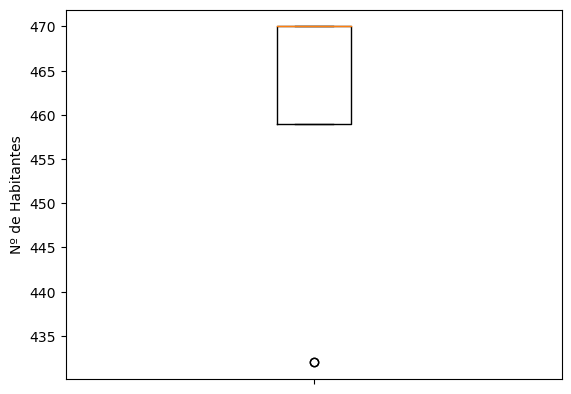

In [171]:
plt.boxplot(corvo['Habitantes']) #desenhar histograma
plt.xticks(ticks=[1],labels=['']) #definir nome dos eixos
plt.ylabel('Nº de Habitantes')

Para encontrar os outliers detetados iniciamente foi calculada a distância interquartil.

In [172]:
Q1 = corvo['Habitantes'].quantile(0.25) #encontrar os quartis
Q3 = corvo['Habitantes'].quantile(0.75)
IQR = Q3 - Q1 #calcular amplitude interquartil
inf = Q1 - 1.5 * IQR #calcular limite
outliers_inf = (corvo['Habitantes'] < inf)  #encontrar outliers
outliers = corvo[outliers_inf]

Text(0.5, 0, 'Timestamp')

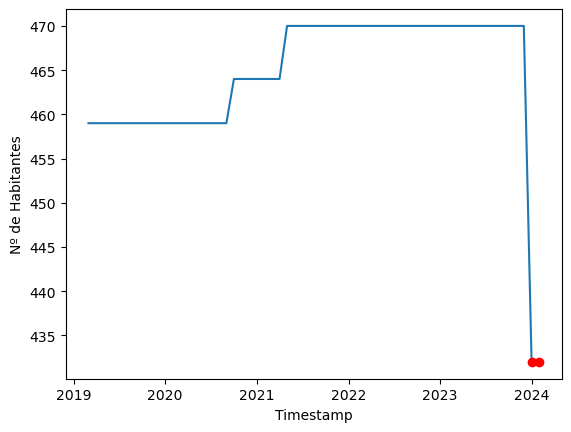

In [173]:
plt.plot(corvo['Habitantes']) #desenhar gráfico
plt.plot(outliers['Habitantes'], 'ro')
plt.ylabel('Nº de Habitantes') #definir nome dos eixos
plt.xlabel('Timestamp')

Dado que a diferença entre o número de habitantes ao longo do tempo é inferior a 10%, optou-se por considerar que os outliers não necessitam de correção.

Para verificar "visualmente" a existência de outliers foi realizado um histograma.

Text(0, 0.5, 'Nº de Consumidores')

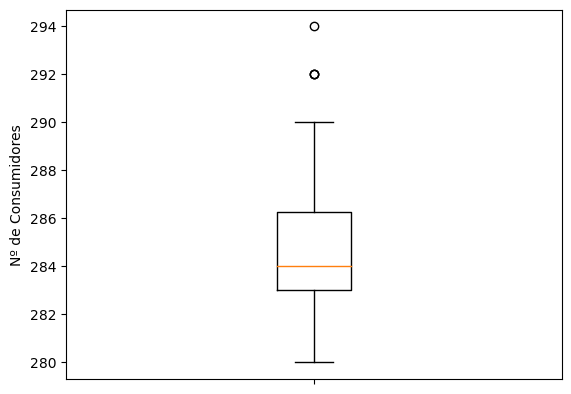

In [174]:
plt.boxplot(corvo['Consumidores']) #desenhar histograma
plt.xticks(ticks=[1],labels=['']) #definir nome dos eixos
plt.ylabel('Nº de Consumidores')

Para encontrar os outliers detetados iniciamente foi calculada a distância interquartil.

In [175]:
Q1 = corvo['Consumidores'].quantile(0.25) #encontrar os quartis
Q3 = corvo['Consumidores'].quantile(0.75)
IQR = Q3 - Q1 #calcular amplitude interquartil
sup = Q3 + 1.5 * IQR #calcular limite
outliers_sup = (corvo['Consumidores'] > sup)  #encontrar outliers
outliers = corvo[outliers_sup]

Text(0.5, 0, 'Timestamp')

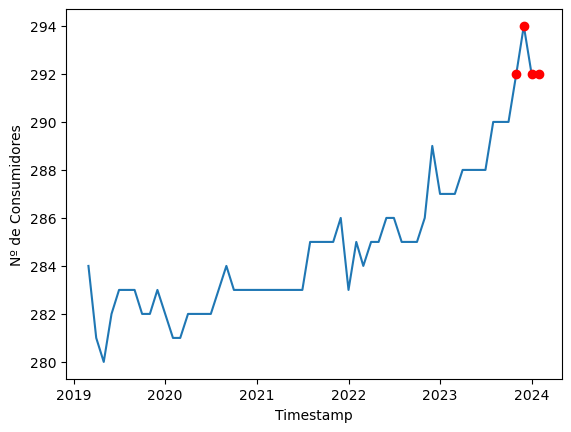

In [176]:
plt.plot(corvo['Consumidores']) #desenhar gráfico
plt.plot(outliers['Consumidores'], 'ro')
plt.ylabel('Nº de Consumidores') #definir nome dos eixos
plt.xlabel('Timestamp')

Ao estudar a evolução do número de consumidores, é percetível que este tem vindo a aumentar. Assim, considerou-se que os outliers correspondem a valores reais, não sendo necessário corrigí-los.

É de salientar que, apesar de ter existido um decréscimo no número de habitantes, o número de consumidores tem aumentado ao longo do ano. Tal pode ser justificado pelo aumento de qualidade de vida ou envelhecimento da população: as pessoas mais idosas têm falecido e os jovens adultos têm saído de casa. Por outro lado, estando os Açores a surgir como um novo destino turístico, o número de casas para alugar tem aumentado.

#### 2.9.3. Emissão Energética

Para verificar a distribuição da origem da emissão elétrica no Corvo, foi criado um gráfico de setores.

(-1.0999999611113098,
 1.0999999981481576,
 -1.0999998953889827,
 1.0999999890186987)

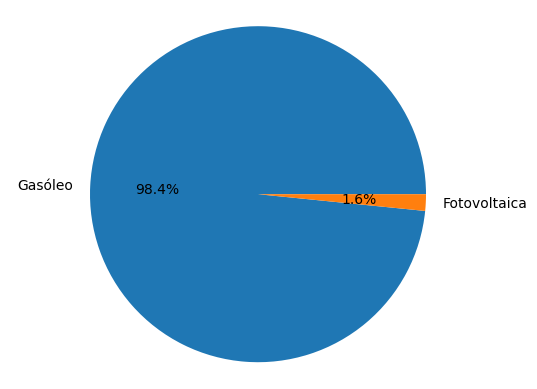

In [177]:
origem = corvo.drop(columns=['Mês', 'Ano', 'Ilha', 'Habitantes', 'Consumidores', 'Total']).sum() #somar ao longo dos anos
origem = origem[origem != 0] #eliminar resultados nulos
plt.pie(origem, labels=origem.index, autopct='%1.1f%%')
plt.axis('equal')

#### 2.9.3.1. Gasóleo

Para verificar "visualmente" a existência de outliers foi realizado um histograma.

Text(0, 0.5, 'kW')

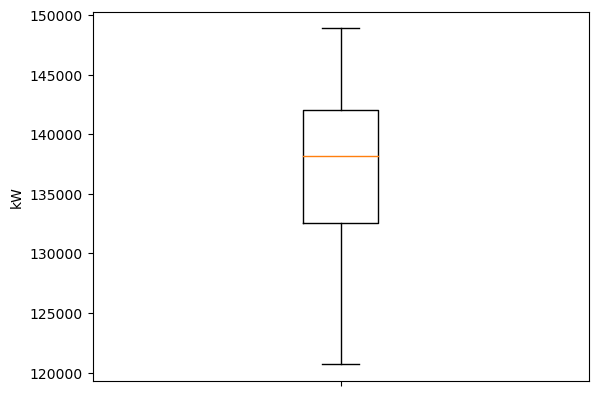

In [178]:
plt.boxplot(corvo['Gasóleo']) #desenhar histograma
plt.xticks(ticks=[1],labels=['']) #definir nome dos eixos
plt.ylabel('kW')

Não tendo sido detetatdos outliers, apenas se observou a variação dos dados ao longo do tempo.

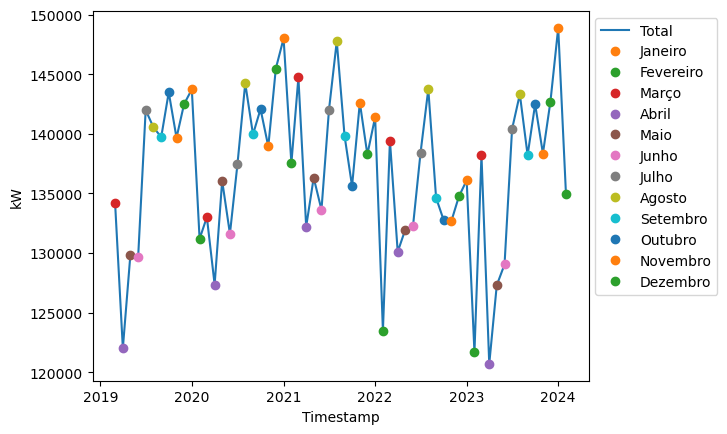

In [179]:
plt.plot(corvo['Gasóleo'], label='Total') #desenhar gráfico
plt.plot(janeiro['Gasóleo'], 'o', label='Janeiro')
plt.plot(fevereiro['Gasóleo'], 'o', label='Fevereiro')
plt.plot(marco['Gasóleo'], 'o', label='Março')
plt.plot(abril['Gasóleo'], 'o', label='Abril')
plt.plot(maio['Gasóleo'], 'o', label='Maio')
plt.plot(junho['Gasóleo'], 'o', label='Junho')
plt.plot(julho['Gasóleo'], 'o', label='Julho')
plt.plot(agosto['Gasóleo'], 'o', label='Agosto')
plt.plot(setembro['Gasóleo'], 'o', label='Setembro')
plt.plot(outubro['Gasóleo'], 'o', label='Outubro')
plt.plot(novembro['Gasóleo'], 'o', label='Novembro')
plt.plot(dezembro['Gasóleo'], 'o', label='Dezembro')
plt.ylabel('kW') #definir nome dos eixos
plt.xlabel('Timestamp')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')

É possível verificar uma perioricidade anual nos dados. O período de verão e de inverno apresentam sempre um pico na emissão (muito provavelmente devido às elevadas e baixas temperaturas respetivamente). Por outro lado, o período de primavera corresponde sempre a um vale (muito provavelmente devido às temperaturas amenas).

#### 2.9.3.2. Fotovoltaica

Para verificar "visualmente" a existência de outliers foi realizado um histograma.

Text(0, 0.5, 'kW')

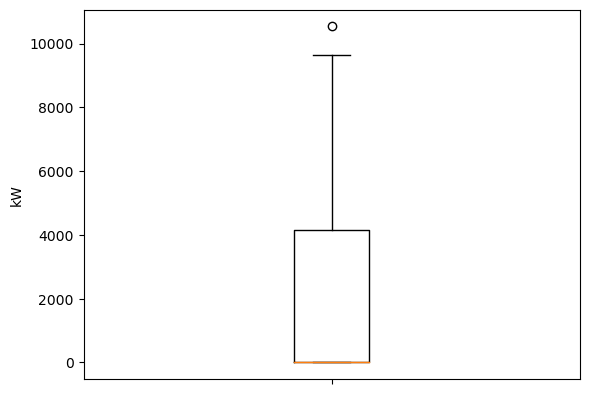

In [180]:
plt.boxplot(corvo['Fotovoltaica']) #desenhar histograma
plt.xticks(ticks=[1],labels=['']) #definir nome dos eixos
plt.ylabel('kW')

Para encontrar os outliers detetados iniciamente foi calculada a distância interquartil.

In [181]:
Q1 = corvo['Fotovoltaica'].quantile(0.25) #encontrar os quartis
Q3 = corvo['Fotovoltaica'].quantile(0.75)
IQR = Q3 - Q1 #calcular amplitude interquartil
sup = Q3 + 1.5 * IQR #calcular limite
outliers_sup = (corvo['Fotovoltaica'] > sup)  #encontrar outliers
outliers = corvo[outliers_sup]

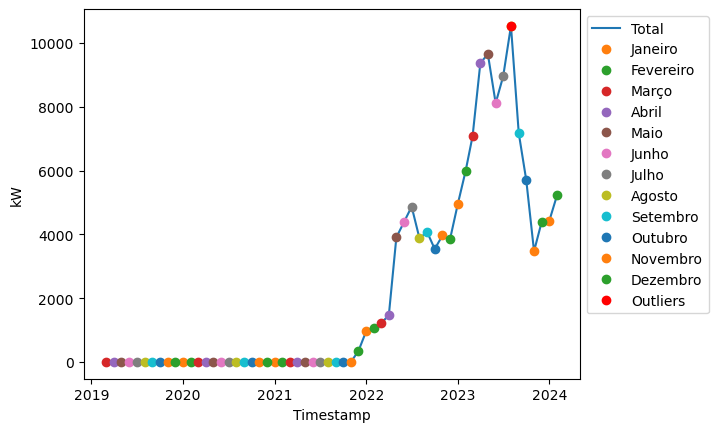

In [182]:
plt.plot(corvo['Fotovoltaica'], label='Total') #desenhar gráfico
plt.plot(janeiro['Fotovoltaica'], 'o', label='Janeiro')
plt.plot(fevereiro['Fotovoltaica'], 'o', label='Fevereiro')
plt.plot(marco['Fotovoltaica'], 'o', label='Março')
plt.plot(abril['Fotovoltaica'], 'o', label='Abril')
plt.plot(maio['Fotovoltaica'], 'o', label='Maio')
plt.plot(junho['Fotovoltaica'], 'o', label='Junho')
plt.plot(julho['Fotovoltaica'], 'o', label='Julho')
plt.plot(agosto['Fotovoltaica'], 'o', label='Agosto')
plt.plot(setembro['Fotovoltaica'], 'o', label='Setembro')
plt.plot(outubro['Fotovoltaica'], 'o', label='Outubro')
plt.plot(novembro['Fotovoltaica'], 'o', label='Novembro')
plt.plot(dezembro['Fotovoltaica'], 'o', label='Dezembro')
plt.plot(outliers['Fotovoltaica'], 'ro', label='Outliers')
plt.ylabel('kW') #definir nome dos eixos
plt.xlabel('Timestamp')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')

Verificou-se que os primeiros painéis fotovoltaicos apenas surgiram em dezembro de 2022, parecendo existir um investmento ao longo desse ano. Para além disso, uma vez que o outlier corresponde ao mês de agosto, no qaul se espera dias compridos e solarengos, considerou-se que este não necessita de correção.

## 3. Análise Seletiva dos Dados

Selecionar dados com base nas suas características e tendo em conta que as variáveis de entrada são numéricas (à exceção do mês e ano que se considerou categóricas) e as variavéis de saída são numéricas.

In [183]:
from sklearn.feature_selection import SelectKBest #classe que seleciona as k variavéis com base numa função que pontua
from sklearn.feature_selection import f_regression #função que pontua a relação entre as variavéis
from scipy.stats import kendalltau #coeficiente tau de Kendall
from scipy.stats import pearsonr #coeficiente de Pearson
from scipy.stats import spearmanr #coeficiente rô de Spearman

### 3.1. Santa Maria

#### 3.1.1. Preparação dos Dados

Antes de fazer a seleção dos dados é necessário criar novas colunas ou eliminar outras com os dados organizados.

In [184]:
colunas = ['Ilha', 'Fuelóleo', 'Hídrica', 'Geotérmica', 'Resíduos', 'Outras Renováveis']
santa_maria.drop(columns=colunas, inplace=True) #eliminar colunas sem informação
santa_maria['Gasóleo-1'] = santa_maria['Gasóleo'].shift(-1) #criar colunas com informação do mês anterior
santa_maria['Eólica-1'] = santa_maria['Eólica'].shift(-1)
santa_maria['Fotovoltaica-1'] = santa_maria['Fotovoltaica'].shift(-1)
santa_maria['Total-1'] = santa_maria['Total'].shift(-1)
santa_maria.dropna(inplace=True) #eliminar o primeiro mês (dado que não existe info anterior)
santa_maria

,Mês,Ano,Habitantes,Consumidores,Gasóleo,Eólica,Fotovoltaica,Total,Gasóleo-1,Eólica-1,Fotovoltaica-1,Total-1
Data,,,,,,,,,,,,
2024-02-01,2,2024,5489,4062,1532851,131144,62407,1726402,1671692.0,137679.0,49845.0,1859216.0
2024-01-01,1,2024,5489,4059,1671692,137679,49845,1859216,1659404.0,145412.0,48569.0,1853385.0
2023-12-01,12,2023,5612,4064,1659404,145412,48569,1853385,1572964.0,173028.0,53262.0,1799254.0
2023-11-01,11,2023,5612,4057,1572964,173028,53262,1799254,1642530.0,194615.0,67578.0,1904723.0
2023-10-01,10,2023,5612,4060,1642530,194615,67578,1904723,1703550.0,109506.0,99396.0,1912452.0
2023-09-01,9,2023,5612,4059,1703550,109506,99396,1912452,1959055.0,76332.0,109524.0,2144911.0
2023-08-01,8,2023,5612,4062,1959055,76332,109524,2144911,1811483.0,44804.0,109544.0,1965831.0
2023-07-01,7,2023,5612,4056,1811483,44804,109544,1965831,1566116.0,127636.0,95201.0,1788953.0
2023-06-01,6,2023,5612,4052,1566116,127636,95201,1788953,1600710.0,137717.0,91595.0,1830022.0


In [185]:
santa_maria_valores = santa_maria.values #guardar apenas os valores
santa_maria_saidas = santa_maria_valores[:,[4,5,6,7]]
santa_maria_entradas = santa_maria_valores[:,[0,1,2,3,8,9,10,11]]

#### 3.1.2. Análise das Séries Temporais

Uma vez que os dados usados são sequenciais, o tempo passa também a ser uma variável. Assim, fez-se uma análise temporal das diferentes variavéis de forma a reconhecer padrões e prever futuros valores.

In [186]:
from statsmodels.graphics.tsaplots import plot_acf

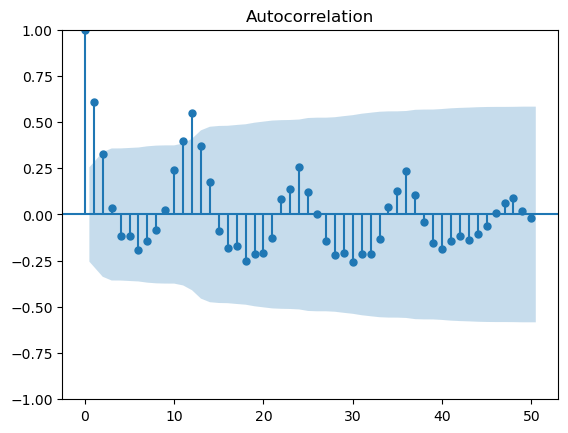

In [187]:
plot_acf(santa_maria['Gasóleo'], lags=50) #calcular a autocorrelação num períoo menor
plt.show() #desenhar gráfico

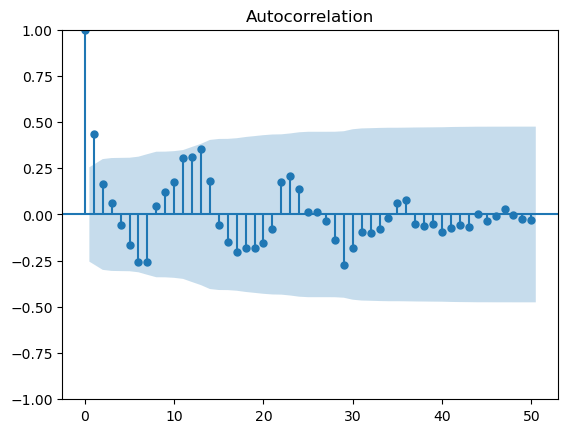

In [188]:
plot_acf(santa_maria['Eólica'], lags=50) #calcular a autocorrelação num períoo menor
plt.show() #desenhar gráfico

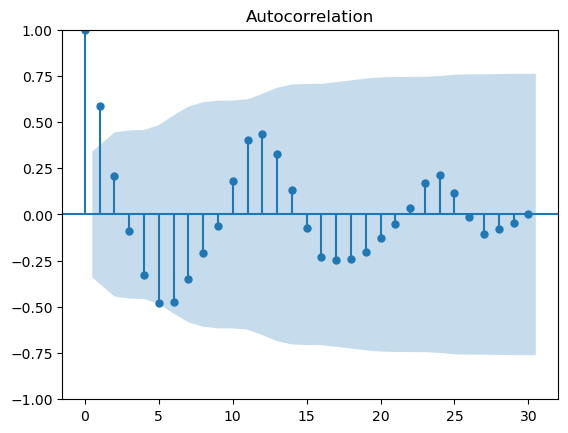

In [189]:
santa_maria_right = santa_maria.iloc[:33] #eliminar intervalo no qual não existia energia fotovoltaica
plot_acf(santa_maria_right['Fotovoltaica'], lags=30) #calcular a autocorrelação num períoo menor
plt.show() #desenhar gráfico

Nas três correlações é percetível a perioricidade anual, dado que os máximos são atingidos de 12 em 12 meses.

#### 3.1.3. Métodos de Filtro

#### 3.1.3.1. Coeficiente Rô de Spearman

Estatística usada para medir com que intensidade a relação entre duas variáveis pode ser descrita por uma função monótona.

In [233]:
for i in [2,3,8,9,10,11]:
    for j in [4,5,6,7]:
        entrada_especifica = santa_maria_valores[:,i]
        saida_especifica = santa_maria_valores[:,j]
        spearman, _ = spearmanr(entrada_especifica, saida_especifica) #calcular o coeficiente
        print(i, j, spearman) #indicar o coeficiente

2 4 -0.27521180630454467
2 5 0.33370121247989437
2 6 -0.7390048833520313
2 7 -0.4267584419497763
3 4 0.37087370322473273
3 5 -0.3684187472695808
3 6 0.6815425342159784
3 7 0.5069191790727335
8 4 0.6276446522501462
8 5 -0.37516072472238465
8 6 0.2245470485096435
8 7 0.615604909409702
9 4 -0.594447691408533
9 5 0.48211572180011697
9 6 -0.42063120981881946
9 7 -0.5805961426066628
10 4 0.4890707188778493
10 5 -0.5104032729398014
10 6 0.9128579777907658
10 7 0.5860900058445354
11 4 0.5358270017533606
11 5 -0.26277030976037413
11 6 0.3050847457627119
11 7 0.6132086499123321


Como esperado, a relação entre a emissão de eletricidade do mês atual e anterior com a mesma origem apresenta uma maior relação entre si.
Para além disso, é de salientar os valores elvados obtidos para a relação entre o número de habitantes/consumidores e a eletricidade emitida.

#### 3.1.3.2. Coeficiente de Pearson

Estatística usada para medir a correlação linear entre duas variavéis. 

In [234]:
for i in [2,3,8,9,10,11]:
    for j in [4,5,6,7]:
        entrada_especifica = santa_maria_valores[:,i]
        saida_especifica = santa_maria_valores[:,j]
        pearson, _ = pearsonr(entrada_especifica, saida_especifica) #calcular o coeficiente
        print(i, j, pearson) #indicar o coeficiente

2 4 -0.1620931430108432
2 5 0.15856808595155067
2 6 -0.45822911191317195
2 7 -0.2364452767069701
3 4 0.38237355638117876
3 5 -0.31565286654812486
3 6 0.7931966435956561
3 7 0.5085476424455292
8 4 0.6371975565375902
8 5 -0.3661572758867611
8 6 0.3288472576901282
8 7 0.6501171609181083
9 4 -0.5662750164796244
9 5 0.45360556336924873
9 6 -0.41521781910469047
9 7 -0.5306950150185539
10 4 0.4707033176975237
10 5 -0.4130667689251617
10 6 0.9367522083035451
10 7 0.5977685885920939
11 4 0.563006335003542
11 5 -0.28323240265156424
11 6 0.4215450334569765
11 7 0.6409378558989607


Como esperado, a relação entre a emissão de eletricidade do mês atual e anterior com a mesma origem apresenta uma maior relação entre si.

#### 3.1.3.3. Coeficiente Tau de Kendall

Estatística usada para medir a correlação de postos (posições relativas das observações) entre duas variáveis.

In [235]:
for i in [0,1]:
    for j in [4,5,6,7]:
        entrada_especifica = santa_maria_valores[:,i]
        saida_especifica = santa_maria_valores[:,j]
        tau, _ = kendalltau(entrada_especifica, saida_especifica) #calcular o coeficiente
        print(i, j, tau) #indicar o coeficiente

0 4 0.18583735989238473
0 5 -0.018765336015191942
0 6 -0.011501334977053128
0 7 0.24394936819749527
1 4 0.22404986308135172
1 5 -0.2510903637980666
1 6 0.47385258398814617
1 7 0.3103219367965849


Como esperado, devido à perioricidade dos dados, o ano atual tem uma melhor correlação com a eletricidade emitida no mesmo.

#### 3.1.3.4. ANOVA: Valor-F

A função f_regression determina a razão entre a variância explicada e a variância não explicada. 

In [238]:
for j in [4,5,6,7]:
    entrada_especifica = santa_maria_valores[:,[0,1]]
    saida_especifica = santa_maria_valores[:,j]
    variaveis = SelectKBest(k = 2, score_func = f_regression) #fazer o top5 das variavéis
    fit = variaveis.fit(entrada_especifica, saida_especifica) 
    print(j, fit.scores_) #indicar a pontuação

4 [5.4246309  6.33161688]
5 [0.01158042 6.43225186]
6 [ 0.08514226 69.90128925]
7 [ 8.95509627 11.44763978]


Como esperado, devido à perioricidade dos dados, o ano atual tem uma melhor correlação com a eletricidade emitida no mesmo.

### 3.2. São Miguel

#### 3.2.1. Preparação dos Dados

Antes de fazer a seleção dos dados é necessário criar novas colunas ou eliminar outras com os dados organizados.

In [190]:
colunas = ['Ilha', 'Resíduos']
sao_miguel.drop(columns=colunas, inplace=True) #eliminar colunas sem informação
sao_miguel['Fuelóleo-1'] = sao_miguel['Fuelóleo'].shift(-1) #criar colunas com informação do mês anterior
sao_miguel['Gasóleo-1'] = sao_miguel['Gasóleo'].shift(-1)
sao_miguel['Hídrica-1'] = sao_miguel['Hídrica'].shift(-1)
sao_miguel['Geotérmica-1'] = sao_miguel['Geotérmica'].shift(-1)
sao_miguel['Eólica-1'] = sao_miguel['Eólica'].shift(-1)
sao_miguel['Fotovoltaica-1'] = sao_miguel['Fotovoltaica'].shift(-1)
sao_miguel['Outras Renováveis-1'] = sao_miguel['Outras Renováveis'].shift(-1)
sao_miguel['Total-1'] = sao_miguel['Total'].shift(-1)
sao_miguel.dropna(inplace=True) #eliminar o primeiro mês (dado que não existe info anterior)
sao_miguel

,Mês,Ano,Habitantes,Consumidores,Fuelóleo,Gasóleo,Hídrica,Geotérmica,Eólica,Fotovoltaica,Outras Renováveis,Total,Fuelóleo-1,Gasóleo-1,Hídrica-1,Geotérmica-1,Eólica-1,Fotovoltaica-1,Outras Renováveis-1,Total-1
Data,,,,,,,,,,,,,,,,,,,,
2024-02-01,2,2024,135745,67391,19425951.00,7620,1650342.00,14059018.0,1571332,48727,83588,36846578,21938318.00,6193.0,2253383.00,14867106.0,947175.0,29254.0,97265.0,40138694.0
2024-01-01,1,2024,135745,67372,21938318.00,6193,2253383.00,14867106.0,947175,29254,97265,40138694,20311939.00,6373.0,2231057.00,15069892.0,1335443.0,27619.0,74287.0,39056610.0
2023-12-01,12,2023,137133,67377,20311939.00,6373,2231057.00,15069892.0,1335443,27619,74287,39056610,20165019.00,5039.0,2061414.00,13363207.0,1633452.0,30772.0,102618.0,37361521.0
2023-11-01,11,2023,137133,67313,20165019.00,5039,2061414.00,13363207.0,1633452,30772,102618,37361521,21591678.00,4547.0,1982457.00,14202798.0,1783999.0,39254.0,114511.0,39719244.0
2023-10-01,10,2023,137133,67242,21591678.00,4547,1982457.00,14202798.0,1783999,39254,114511,39719244,24626662.00,3583.0,1924814.25,12580241.0,1188135.0,60841.0,114030.0,39862841.0
2023-09-01,9,2023,137133,67191,24626662.00,3583,1924814.25,12580241.0,1188135,60841,114030,39862841,27826337.00,40.0,2071484.00,12577477.0,589471.0,65568.0,144541.0,42546154.0
2023-08-01,8,2023,137133,67202,27826337.00,40,2071484.00,12577477.0,589471,65568,144541,42546154,26604531.00,3886.0,2126747.25,11730160.0,771243.0,75959.0,107317.0,40716873.0
2023-07-01,7,2023,137133,67080,26604531.00,3886,2126747.25,11730160.0,771243,75959,107317,40716873,21884697.00,7194.0,2084912.50,14041825.0,979110.0,59274.0,91788.0,38278882.0
2023-06-01,6,2023,137133,67601,21884697.00,7194,2084912.50,14041825.0,979110,59274,91788,38278882,19495248.00,4460.0,2541153.00,14718813.0,1168426.0,52074.0,104553.0,38084727.0


In [191]:
sao_miguel_valores = sao_miguel.values #guardar apenas os valores
sao_miguel_saidas = sao_miguel_valores[:,[4,5,6,7,8,9,10,11]]
sao_miguel_entradas = sao_miguel_valores[:,[0,1,2,3,12,13,14,15,16,17,18,19]]

#### 3.2.2. Análise das Séries Temporais

Uma vez que os dados usados são sequenciais, o tempo passa também a ser uma variável. Assim, fez-se uma análise temporal das diferentes variavéis de forma a reconhecer padrões e prever futuros valores.

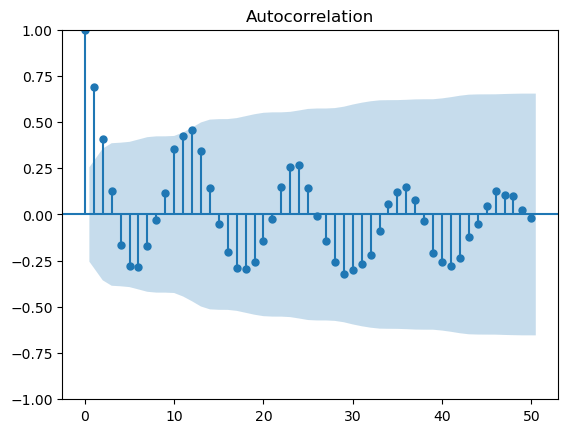

In [195]:
plot_acf(sao_miguel['Fuelóleo'], lags=50) #calcular a autocorrelação num períoo menor
plt.show() #desenhar gráfico

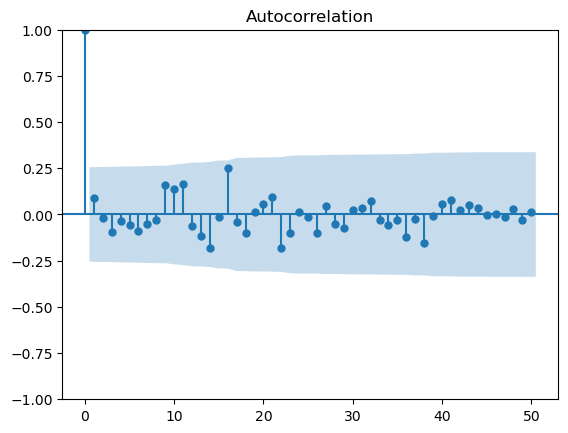

In [196]:
plot_acf(sao_miguel['Gasóleo'], lags=50) #calcular a autocorrelação num períoo menor
plt.show() #desenhar gráfico

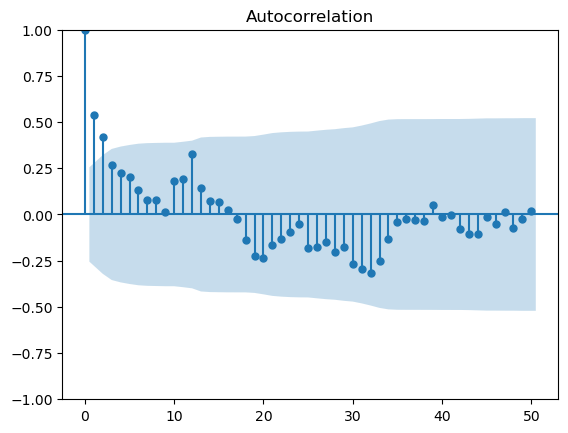

In [197]:
plot_acf(sao_miguel['Hídrica'], lags=50) #calcular a autocorrelação num períoo menor
plt.show() #desenhar gráfico

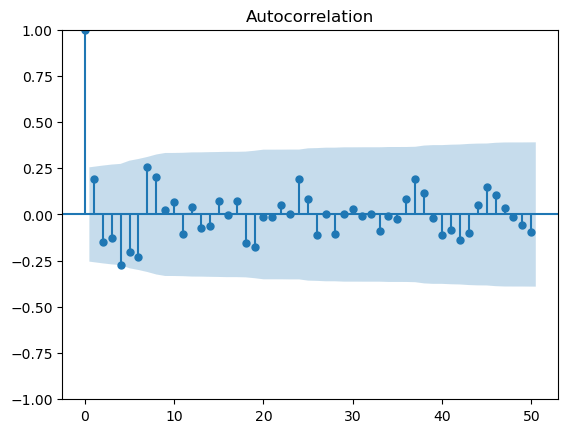

In [198]:
plot_acf(sao_miguel['Geotérmica'], lags=50) #calcular a autocorrelação num períoo menor
plt.show() #desenhar gráfico

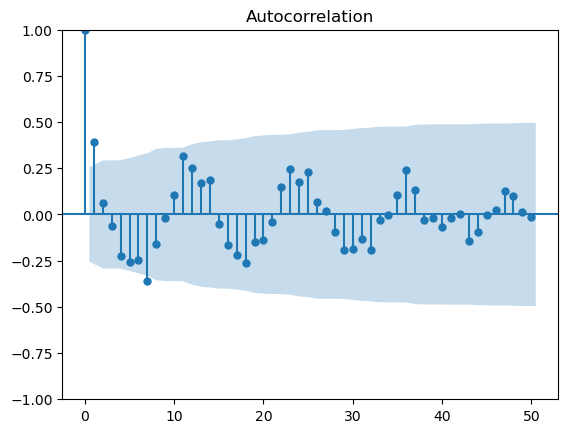

In [199]:
plot_acf(sao_miguel['Eólica'], lags=50) #calcular a autocorrelação num períoo menor
plt.show() #desenhar gráfico

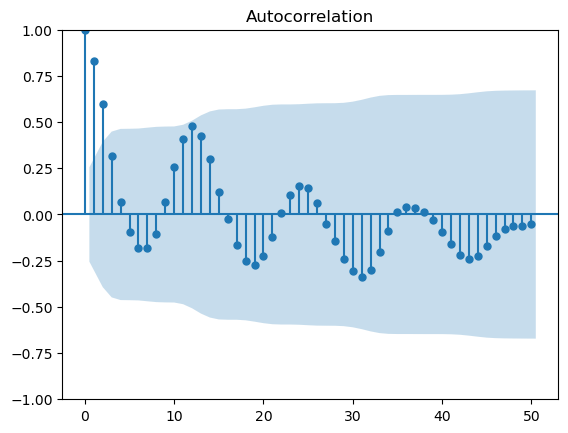

In [200]:
plot_acf(sao_miguel['Fotovoltaica'], lags=50) #calcular a autocorrelação num períoo menor
plt.show() #desenhar gráfico

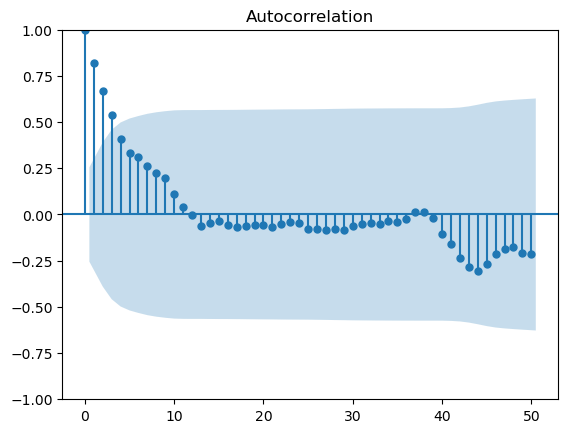

In [201]:
plot_acf(sao_miguel['Outras Renováveis'], lags=50) #calcular a autocorrelação num períoo menor
plt.show() #desenhar gráfico

Há exceção das fontes de energia com um menor impacto (gasóleo, hídrica e outras renováveis) é percetível a perioricidade anual, dado que os máximos são atingidos de 12 em 12 meses.

#### 3.2.3. Métodos de Filtro

#### 3.2.3.1. Coeficiente Rô de Spearman

Estatística usada para medir com que intensidade a relação entre duas variáveis pode ser descrita por uma função monótona.

In [240]:
for i in [2,3,12,13,14,15,16,17,18,19]:
    for j in [4,5,6,7,8,9,10,11]:
        entrada_especifica = sao_miguel_valores[:,i]
        saida_especifica = sao_miguel_valores[:,j]
        spearman, _ = spearmanr(entrada_especifica, saida_especifica) #calcular o coeficiente
        print(i, j, spearman) #indicar o coeficiente

2 4 -0.29212245037633006
2 5 0.008146970560495424
2 6 -0.5090071407557342
2 7 0.15764874905309276
2 8 -0.0523548347174467
2 9 -0.36917786117559753
2 10 -0.3772599156360093
2 11 -0.43490541251027176
3 4 0.33588544710695506
3 5 -0.10444184687317361
3 6 0.3915254237288136
3 7 -0.22068965517241382
3 8 0.05248392752776155
3 9 0.46943308007013446
3 10 0.5980713033313851
3 11 0.44617182933956756
12 4 0.6672121566335477
12 5 -0.17744009351256576
12 6 -0.16136762127410875
12 7 -0.35832846288720055
12 8 -0.005727644652250147
12 9 -0.0024547048509643487
12 10 0.19725306838106374
12 11 0.5864406779661018
13 4 -0.10087668030391585
13 5 0.07697253068381066
13 6 0.059614260666277036
13 7 0.08889538281706606
13 8 -0.03050847457627119
13 9 -0.10783167738164817
13 10 -0.141437755698422
13 11 -0.14552893045002924
14 4 -0.1223261250730567
14 5 -0.07744009351256577
14 6 0.6103448275862069
14 7 0.033547632963179426
14 8 -0.09859731151373466
14 9 0.2930450029222677
14 10 0.11876095850379896
14 11 0.027001753

Como esperado, a relação entre a emissão de eletricidade do mês atual e anterior com a mesma origem apresenta uma maior relação entre si.

#### 3.2.3.2. Coeficiente de Pearson

Estatística usada para medir a correlação linear entre duas variavéis.

In [241]:
for i in [2,3,12,13,14,15,16,17,18,19]:
    for j in [4,5,6,7,8,9,10,11]:
        entrada_especifica = sao_miguel_valores[:,i]
        saida_especifica = sao_miguel_valores[:,j]
        pearson, _ = pearsonr(entrada_especifica, saida_especifica) #calcular o coeficiente #calcular o coeficiente
        print(i, j, pearson) #indicar o coeficiente

2 4 -0.20173248680319428
2 5 0.036485933725365974
2 6 -0.3532510413709529
2 7 -0.08406644057549277
2 8 -0.157306935617847
2 9 -0.28907929858642045
2 10 -0.4018467323191376
2 11 -0.3652484667184525
3 4 0.3881104740772867
3 5 -0.15697291906815405
3 6 0.38150883697937765
3 7 -0.051549051233717655
3 8 0.05965593134556544
3 9 0.518652379542103
3 10 0.6515731683907368
3 11 0.4774224281919194
12 4 0.7051656795768725
12 5 -0.20243225752942753
12 6 -0.15265830217060739
12 7 -0.29588139708153455
12 8 -0.05970645480180876
12 9 0.186783245788846
12 10 0.313007088521701
12 11 0.6357879125838626
13 4 -0.09254065921247137
13 5 0.1171002738842567
13 6 0.02326832898738726
13 7 0.04829679959299174
13 8 -0.0742427441379106
13 9 -0.1760310268541996
13 10 -0.15525636272944876
13 11 -0.08609787939272845
14 4 -0.09254824812942589
14 5 -0.11883788131984785
14 6 0.5568739524047492
14 7 0.16700315877335964
14 8 -0.06976509432258071
14 9 0.29818027955865883
14 10 0.24483938449456585
14 11 0.018251179269517817
15

Como esperado, a relação entre a emissão de eletricidade do mês atual e anterior com a mesma origem apresenta uma maior relação entre si.

#### 3.2.3.3. Coeficiente Tau de Kendall

In [242]:
for i in [0,1]:
    for j in [4,5,6,7,8,9,10,11]:
        entrada_especifica = sao_miguel_valores[:,i]
        saida_especifica = sao_miguel_valores[:,j]
        tau, _ = kendalltau(entrada_especifica, saida_especifica) #calcular o coeficiente #calcular o coeficiente
        print(i, j, tau) #indicar o coeficiente

0 4 0.32022137909795284
0 5 -0.11682935003006596
0 6 -0.22942136612121763
0 7 -0.24394936819749527
0 8 0.09261601323626992
0 9 -0.1216720173888252
0 10 -0.039346672289918595
0 11 0.21005069668618082
1 4 0.17254414743046628
1 5 -0.05021807275961332
1 6 0.33865008040457184
1 7 -0.10172378841049877
1 8 0.014164071803993499
1 9 0.37727936714273597
1 10 0.43522329724998204
1 11 0.2807061502973257


Como esperado, devido à perioricidade dos dados, o ano atual tem uma melhor correlação com a eletricidade emitida no mesmo, há exceção da de origem no fuelóleo, gasóleo, geotérmica, eólica.

#### 3.2.3.4. ANOVA: Valor-F

A função f_regression determina a razão entre a variância explicada e a variância não explicada.

In [243]:
for j in [4,5,6,7,8,9,10,11]:
    entrada_especifica = sao_miguel_valores[:,[0,1]]
    saida_especifica = sao_miguel_valores[:,j]
    variaveis = SelectKBest(k = 2, score_func = f_regression) #fazer o top5 das variavéis
    fit = variaveis.fit(entrada_especifica, saida_especifica) 
    print(j, fit.scores_) #indicar a pontuação

4 [13.8452519   4.55421201]
5 [0.66628414 0.9457284 ]
6 [ 5.74690842 12.4905132 ]
7 [6.73836008e+00 2.36914202e-03]
8 [0.56900289 0.09545093]
9 [ 0.76287431 22.10297145]
10 [ 0.69340001 47.22962336]
11 [7.19639806 9.25415868]


Como esperado, devido à perioricidade dos dados, o ano atual tem uma melhor correlação com a eletricidade emitida no mesmo, há exceção da de origem no fuelóleo, geotérmica e eólica.

### 3.3. Terceira

#### 3.3.1. Preparação dos Dados

Antes de fazer a seleção dos dados é necessário criar novas colunas ou eliminar outras com os dados organizados.

In [192]:
colunas = ['Ilha', 'Outras Renováveis']
terceira.drop(columns=colunas, inplace=True) #eliminar colunas sem informação
terceira['Fuelóleo-1'] = terceira['Fuelóleo'].shift(-1) #criar colunas com informação do mês anterior
terceira['Gasóleo-1'] = terceira['Gasóleo'].shift(-1)
terceira['Hídrica-1'] = terceira['Hídrica'].shift(-1)
terceira['Geotérmica-1'] = terceira['Geotérmica'].shift(-1)
terceira['Eólica-1'] = terceira['Eólica'].shift(-1)
terceira['Fotovoltaica-1'] = terceira['Fotovoltaica'].shift(-1)
terceira['Resíduos-1'] = terceira['Resíduos'].shift(-1)
terceira['Total-1'] = terceira['Total'].shift(-1)
terceira.dropna(inplace=True) #eliminar o primeiro mês (dado que não existe info anterior)
terceira

,Mês,Ano,Habitantes,Consumidores,Fuelóleo,Gasóleo,Hídrica,Geotérmica,Eólica,Fotovoltaica,Resíduos,Total,Fuelóleo-1,Gasóleo-1,Hídrica-1,Geotérmica-1,Eólica-1,Fotovoltaica-1,Resíduos-1,Total-1
Data,,,,,,,,,,,,,,,,,,,,
2024-02-01,2,2024,53552,28883,10933236,1622.00,394996,1795221.5,2452541,9711,1271577,15601368,11661452.0,2001.00,358112.0,1821149.0,3042542.0,6597.0,1331615.0,16965408.0
2024-01-01,1,2024,53552,28860,11661452,2001.00,358112,1821149.0,3042542,6597,1331615,16965408,11220109.0,2978.00,448087.0,2124708.5,2802660.0,5389.0,1360537.0,16738891.0
2023-12-01,12,2023,54874,28876,11220109,2978.00,448087,2124708.5,2802660,5389,1360537,16738891,10224722.0,6407.00,300775.0,2222647.5,3561360.0,6760.0,1271450.0,15985455.0
2023-11-01,11,2023,54874,28862,10224722,6407.00,300775,2222647.5,3561360,6760,1271450,15985455,10843095.0,2778.00,123208.0,1591148.0,3468508.0,10730.0,479512.0,16518979.0
2023-10-01,10,2023,54874,28851,10843095,2778.00,123208,1591148.0,3468508,10730,479512,16518979,11876932.0,1682.00,0.0,1538859.0,2344089.0,15112.0,863239.0,16639913.0
2023-09-01,9,2023,54874,28858,11876932,1682.00,0,1538859.0,2344089,15112,863239,16639913,13674578.0,811.00,0.0,1324122.0,1613175.0,20915.0,1309852.0,17943453.0
2023-08-01,8,2023,54874,28840,13674578,811.00,0,1324122.0,1613175,20915,1309852,17943453,13030593.0,10569.00,0.0,1467623.0,1239774.0,26092.0,1369750.0,17144401.0
2023-07-01,7,2023,54874,28794,13030593,10569.00,0,1467623.0,1239774,26092,1369750,17144401,10098754.0,1107.00,46666.0,1661926.0,2814451.0,23151.0,1318253.0,15964308.0
2023-06-01,6,2023,54874,28753,10098754,1107.00,46666,1661926.0,2814451,23151,1318253,15964308,10003047.0,7189.00,16984.0,1641440.0,2998966.0,19608.0,1342642.0,16029876.0


In [193]:
terceira_valores = terceira.values #guardar apenas os valores
terceira_saidas = terceira_valores[:,[4,5,6,7,8,9,10,11]]
terceira_entradas = terceira_valores[:,[0,1,2,3,12,13,14,15,16,17,18,19]]

#### 3.3.2. Análise das Séries Temporais

Uma vez que os dados usados são sequenciais, o tempo passa também a ser uma variável. Assim, fez-se uma análise temporal das diferentes variavéis de forma a reconhecer padrões e prever futuros valores.

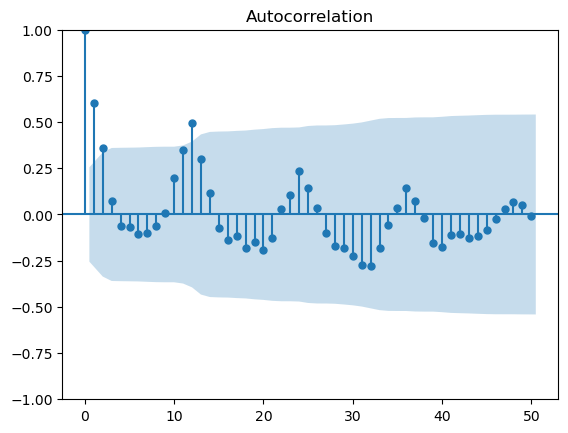

In [204]:
plot_acf(terceira['Fuelóleo'], lags=50) #calcular a autocorrelação num períoo menor
plt.show() #desenhar gráfico

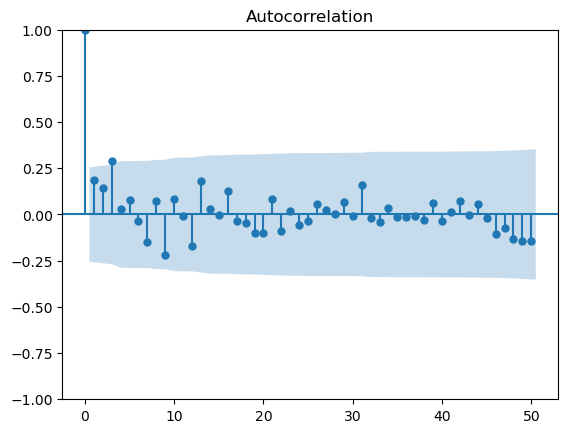

In [205]:
plot_acf(terceira['Gasóleo'], lags=50) #calcular a autocorrelação num períoo menor
plt.show() #desenhar gráfico

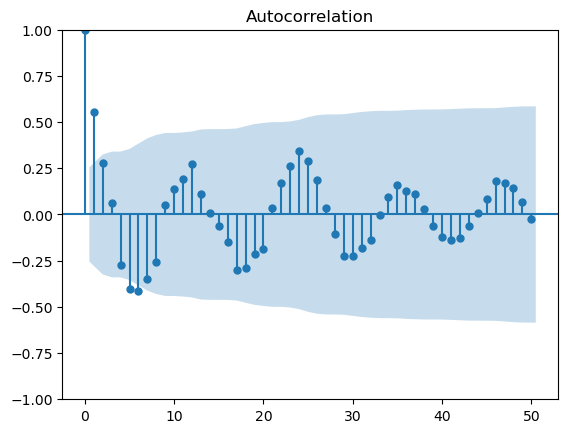

In [206]:
plot_acf(terceira['Hídrica'], lags=50) #calcular a autocorrelação num períoo menor
plt.show() #desenhar gráfico

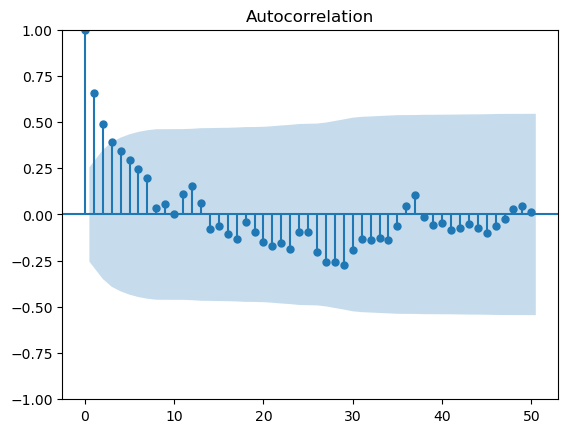

In [207]:
plot_acf(terceira['Geotérmica'], lags=50) #calcular a autocorrelação num períoo menor
plt.show() #desenhar gráfico

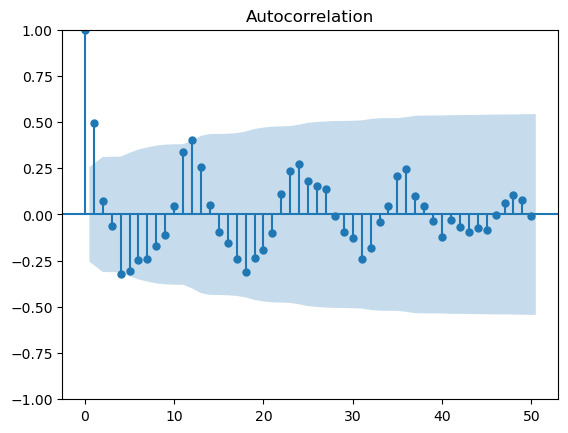

In [208]:
plot_acf(terceira['Eólica'], lags=50) #calcular a autocorrelação num períoo menor
plt.show() #desenhar gráfico

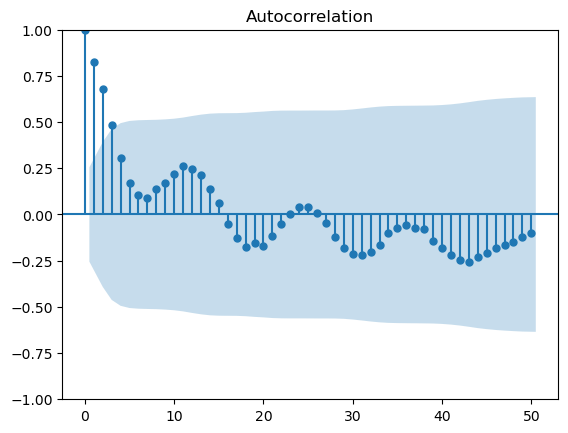

In [209]:
plot_acf(terceira['Fotovoltaica'], lags=50) #calcular a autocorrelação num períoo menor
plt.show() #desenhar gráfico

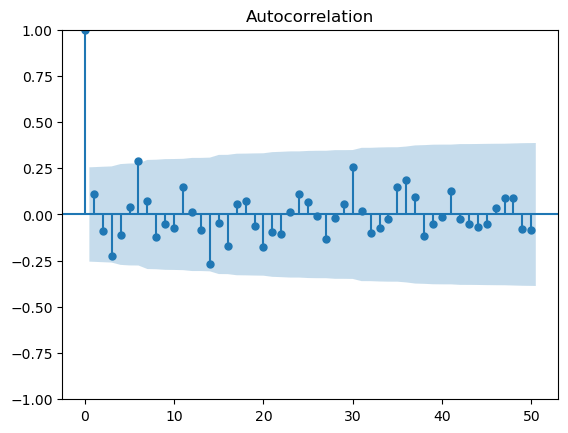

In [210]:
plot_acf(terceira['Resíduos'], lags=50) #calcular a autocorrelação num períoo menor
plt.show() #desenhar gráfico

Há exceção das fontes de energia com um menor impacto (gasóleo, geotérmica e resíduos) é percetível a perioricidade anual, dado que os máximos são atingidos de 12 em 12 meses.

#### 3.3.3. Métodos de Filtro

#### 3.3.3.1. Coeficiente Rô de Spearman

Estatística usada para medir com que intensidade a relação entre duas variáveis pode ser descrita por uma função monótona.

In [244]:
for i in [2,3,12,13,14,15,16,17,18,19]:
    for j in [4,5,6,7,8,9,10,11]:
        entrada_especifica = terceira_valores[:,i]
        saida_especifica = terceira_valores[:,j]
        spearman, _ = spearmanr(entrada_especifica, saida_especifica) #calcular o coeficiente
        print(i, j, spearman) #indicar o coeficiente

2 4 -0.3912493352040313
2 5 0.33850500388608284
2 6 -0.07554323877146722
2 7 0.30906555249815715
2 8 -0.10600799143656599
2 9 -0.4729462471592783
2 10 0.007043499774784327
2 11 -0.45379599763460776
3 4 0.37084118708206265
3 5 -0.4187963003997667
3 6 0.04336455335259858
3 7 -0.4026359240044648
3 8 0.15897368461201106
3 9 0.5988398428436271
3 10 0.053654402524913054
3 11 0.4473764959053819
12 4 0.6027469316189364
12 5 -0.12998246639392172
12 6 -0.3405654183972082
12 7 -0.23600233781414381
12 8 -0.19684395090590304
12 9 0.17749853886616018
12 10 -0.08728941101766123
12 11 0.41624780829924024
13 4 -0.008825248392752777
13 5 0.3791934541203975
13 6 -0.07615127367887885
13 7 0.03687901811805962
13 8 -0.09853886616014028
13 9 -0.17218001168907077
13 10 -0.25050044567907337
13 11 -0.015488018702513153
14 4 -0.34632377088218513
14 5 -0.05394048552253918
14 6 0.6576086956521738
14 7 -0.04583178508451042
14 8 0.12380457842700442
14 9 -0.037488049851176465
14 10 0.003995649902407457
14 11 -0.35631

Como esperado, a relação entre a emissão de eletricidade do mês atual e anterior com a mesma origem apresenta uma maior relação entre si. 

#### 3.3.3.2. Coeficiente de Pearson

Estatística usada para medir a correlação linear entre duas variavéis.

In [245]:
for i in [2,3,12,13,14,15,16,17,18,19]:
    for j in [4,5,6,7,8,9,10,11]:
        entrada_especifica = terceira_valores[:,i]
        saida_especifica = terceira_valores[:,j]
        pearson, _ = pearsonr(entrada_especifica, saida_especifica) #calcular o coeficiente
        print(i, j, pearson) #indicar o coeficiente

2 4 -0.2793762426325359
2 5 0.3698980979765676
2 6 -0.19122458151575883
2 7 0.14172584451039244
2 8 -0.16368449207286156
2 9 -0.3446958268858926
2 10 -0.05591253583952187
2 11 -0.42877718098356477
3 4 0.4199820536508374
3 5 -0.3981212371666062
3 6 0.09628481038806287
3 7 -0.38981510784602635
3 8 0.11330465446887353
3 9 0.6036720537126558
3 10 0.04332705386397964
3 11 0.47700443534446235
12 4 0.6138806286503219
12 5 0.007760574606481784
12 6 -0.2609436665913866
12 7 -0.3294088669929771
12 8 -0.29691948532572526
12 9 0.1782908863432828
12 10 -0.0183990471592594
12 11 0.4636635945673657
13 4 0.03266943904227859
13 5 0.20276099047298862
13 6 -0.14287872403336724
13 7 0.09609869347337702
13 8 -0.05411793961566534
13 9 -0.19154818959828973
13 10 -0.21166689094734645
13 11 0.039318261669004956
14 4 -0.26624661925690124
14 5 -0.16273545657934424
14 6 0.5700004969394514
14 7 -0.000472972810153266
14 8 0.0976026139994725
14 9 -0.11107294745011871
14 10 0.06774377616052171
14 11 -0.30886952375109

Como esperado, a relação entre a emissão de eletricidade do mês atual e anterior com a mesma origem apresenta uma maior relação entre si.

#### 3.3.3.3. Coeficiente Tau de Kendall

Estatística usada para medir a correlação de postos (posições relativas das observações) entre duas variáveis.

In [247]:
for i in [0,1]:
    for j in [4,5,6,7,8,9,10,11]:
        entrada_especifica = terceira_valores[:,i]
        saida_especifica = terceira_valores[:,j]
        tau, _ = kendalltau(entrada_especifica, saida_especifica) #calcular o coeficiente
        print(i, j, tau) #indicar o coeficiente

0 4 0.18825869357176436
0 5 0.011501334977053128
0 6 -0.40275405398914566
0 7 0.19189069409083376
0 8 -0.017554669175502143
0 9 -0.09382668007595972
0 10 -0.09869819390439961
0 11 0.18704802673207455
1 4 0.22662514886389598
1 5 -0.2948702221013192
1 6 0.09621664450607553
1 7 -0.3360747946220276
1 8 0.11717550310576441
1 9 0.48029079844450684
1 10 0.028980435150296833
1 11 0.28585672186241423


Como esperado, devido à perioricidade dos dados, o ano atual tem uma melhor correlação com a eletricidade emitida no mesmo, há exceção da de origem hídrica e fotovoltaica.

#### 3.3.3.4. ANOVA: Valor-F

A função f_regression determina a razão entre a variância explicada e a variância não explicada.

In [248]:
for j in [4,5,6,7,8,9,10,11]:
    entrada_especifica = terceira_valores[:,[0,1]]
    saida_especifica = terceira_valores[:,j]
    variaveis = SelectKBest(k = 2, score_func = f_regression) #fazer o top5 das variavéis
    fit = variaveis.fit(entrada_especifica, saida_especifica) 
    print(j, fit.scores_) #indicar a pontuação

4 [4.1239269 7.2565718]
5 [ 0.28628451 10.455559  ]
6 [15.68224876  2.3870933 ]
7 [ 5.20385902 15.00457875]
8 [0.23596714 1.05158967]
9 [ 0.25644361 32.38634927]
10 [2.51089686 0.35257225]
11 [ 4.48155954 10.01084961]


Como esperado, devido à perioricidade dos dados, o ano atual tem uma melhor correlação com a eletricidade emitida no mesmo, há exceção da de origem hídrica e fotovoltaica.

### 3.4. Graciosa

#### 3.4.1. Preparação dos Dados

Antes de fazer a seleção dos dados é necessário criar novas colunas ou eliminar outras com os dados organizados.

In [194]:
colunas = ['Ilha', 'Fuelóleo', 'Hídrica', 'Geotérmica', 'Resíduos', 'Outras Renováveis']
graciosa.drop(columns=colunas, inplace=True) #eliminar colunas sem informação
graciosa['Gasóleo-1'] = graciosa['Gasóleo'].shift(-1) #criar colunas com informação do mês anterior
graciosa['Eólica-1'] = graciosa['Eólica'].shift(-1)
graciosa['Fotovoltaica-1'] = graciosa['Fotovoltaica'].shift(-1)
graciosa['Total-1'] = graciosa['Total'].shift(-1)
graciosa.dropna(inplace=True) #eliminar o primeiro mês (dado que não existe info anterior)
graciosa

,Mês,Ano,Habitantes,Consumidores,Gasóleo,Eólica,Fotovoltaica,Total,Gasóleo-1,Eólica-1,Fotovoltaica-1,Total-1
Data,,,,,,,,,,,,
2024-02-01,2,2024,4112,3380,275281,778265,58695,1112241,305330.0,862181.0,46236.0,1213747.0
2024-01-01,1,2024,4112,3383,305330,862181,46236,1213747,412398.0,742366.0,43273.0,1198037.0
2023-12-01,12,2023,4179,3381,412398,742366,43273,1198037,321601.0,770773.0,39888.0,1132262.0
2023-11-01,11,2023,4179,3382,321601,770773,39888,1132262,294368.0,778825.0,66885.0,1140078.0
2023-10-01,10,2023,4179,3376,294368,778825,66885,1140078,566924.0,514370.0,95078.0,1176372.0
2023-09-01,9,2023,4179,3376,566924,514370,95078,1176372,691146.0,502971.0,119839.0,1313956.0
2023-08-01,8,2023,4179,3382,691146,502971,119839,1313956,763355.0,334007.0,117025.0,1214387.0
2023-07-01,7,2023,4179,3374,763355,334007,117025,1214387,454296.0,551160.0,106863.0,1112319.0
2023-06-01,6,2023,4179,3367,454296,551160,106863,1112319,432403.0,576229.0,99937.0,1108569.0


In [195]:
graciosa_valores = graciosa.values #guardar apenas os valores
graciosa_saidas = graciosa_valores[:,[4,5,6,7]]
graciosa_entradas = graciosa_valores[:,[0,1,2,3,8,9,10,11]]

#### 3.4.2. Análise das Séries Temporais

Uma vez que os dados usados são sequenciais, o tempo passa também a ser uma variável. Assim, fez-se uma análise temporal das diferentes variavéis de forma a reconhecer padrões e prever futuros valores.

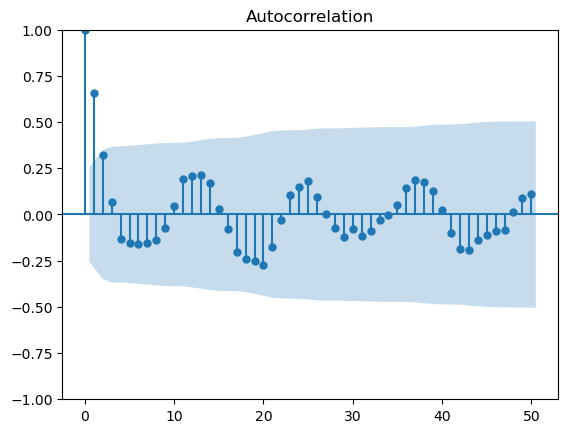

In [213]:
plot_acf(graciosa['Gasóleo'], lags=50) #calcular a autocorrelação num períoo menor
plt.show() #desenhar gráfico

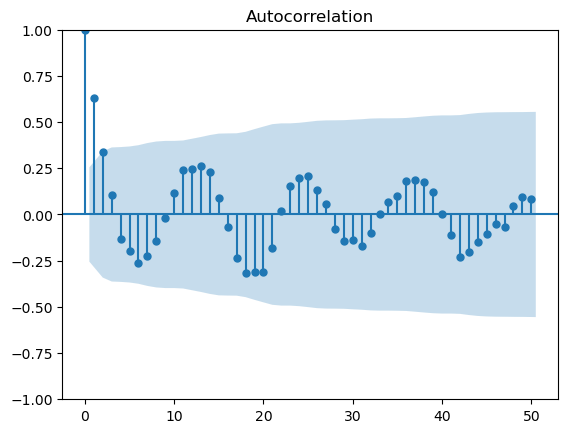

In [214]:
plot_acf(graciosa['Eólica'], lags=50) #calcular a autocorrelação num períoo menor
plt.show() #desenhar gráfico

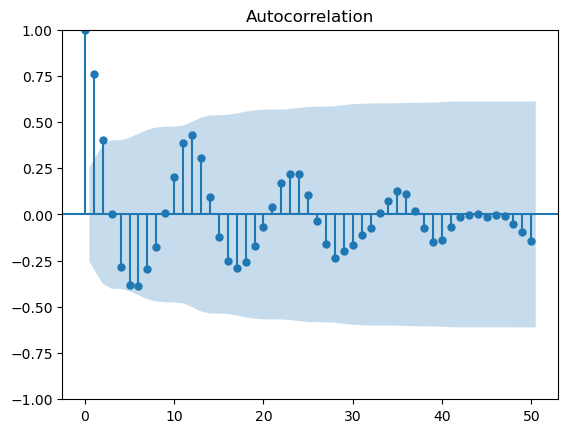

In [215]:
plot_acf(graciosa['Fotovoltaica'], lags=50) #calcular a autocorrelação num períoo menor
plt.show() #desenhar gráfico

Nas três correlações é percetível a perioricidade anual, dado que os máximos são atingidos de 12 em 12 meses.

#### 3.4.3. Métodos de Filtro

#### 3.4.3.1. Coeficiente Rô de Spearman

Estatística usada para medir com que intensidade a relação entre duas variáveis pode ser descrita por uma função monótona.

In [249]:
for i in [2,3,8,9,10,11]:
    for j in [4,5,6,7]:
        entrada_especifica = graciosa_valores[:,i]
        saida_especifica = graciosa_valores[:,j]
        spearman, _ = spearmanr(entrada_especifica, saida_especifica) #calcular o coeficiente
        print(i, j, spearman) #indicar o coeficiente

2 4 0.23807979705670895
2 5 -0.2602313969457202
2 6 -0.17768575113893878
2 7 -0.18984713469457268
3 4 -0.2688675614356876
3 5 0.30213181257784544
3 6 0.1303038479333023
3 7 0.25527067007433957
8 4 0.6073056691992988
8 5 -0.5421707882310252
8 6 0.05301303416618583
8 7 0.22010520163646993
9 4 -0.6000584603017234
9 5 0.581562566173452
9 6 -0.21409990436852472
9 7 -0.15852696355153414
10 4 0.2549466635435163
10 5 -0.34428433768694233
10 6 0.7883260779144683
10 7 0.13789273857598416
11 4 0.0702513150204559
11 5 0.004734350350012186
11 6 -0.0022795020203762377
11 7 0.27498538866160144


Como esperado, a relação entre a emissão de eletricidade do mês atual e anterior com a mesma origem apresenta uma maior relação entre si.

#### 3.4.3.2. Coeficiente de Pearson

Estatística usada para medir a correlação linear entre duas variavéis.

In [250]:
for i in [2,3,8,9,10,11]:
    for j in [4,5,6,7]:
        entrada_especifica = graciosa_valores[:,i]
        saida_especifica = graciosa_valores[:,j]
        pearson, _ = pearsonr(entrada_especifica, saida_especifica) #calcular o coeficiente
        print(i, j, pearson) #indicar o coeficiente

2 4 0.36729520107695685
2 5 -0.40924326495444246
2 6 -0.17399327016510996
2 7 -0.20395747371859374
3 4 -0.2854609810639155
3 5 0.34226740030976466
3 6 0.15059146478398447
3 7 0.24890148510521187
8 4 0.7389827635252064
8 5 -0.6733765312623594
8 6 -0.1630886908543842
8 7 0.1958164693853498
9 4 -0.7506222978745499
9 5 0.715947191983793
9 6 0.0725960567439688
9 7 -0.1363777867949307
10 4 -0.07364670001957732
10 5 0.008016320346647537
10 6 0.8209215221221554
10 7 0.18213726304723094
11 4 -0.015705560352080875
11 5 0.09807821895046827
11 6 0.089658927745928
11 7 0.32520553672887376


Como esperado, a relação entre a emissão de eletricidade do mês atual e anterior com a mesma origem apresenta uma maior relação entre si.

#### 3.4.3.3. Coeficiente Tau de Kendall

Estatística usada para medir a correlação de postos (posições relativas das observações) entre duas variáveis.

In [251]:
for i in [0,1]:
    for j in [4,5,6,7]:
        entrada_especifica = graciosa_valores[:,i]
        saida_especifica = graciosa_valores[:,j]
        tau, _ = kendalltau(entrada_especifica, saida_especifica) #calcular o coeficiente
        print(i, j, tau) #indicar o coeficiente

0 4 0.04661067332805741
0 5 0.008482107236578945
0 6 -0.031504969735864655
0 7 0.16888802413672752
1 4 -0.22920043464644024
1 5 0.22295776862877986
1 6 0.13403241582308154
1 7 0.11460021732322012


Como esperado, devido à perioricidade dos dados, o ano atual tem uma melhor correlação com a eletricidade emitida no mesmo.

#### 3.4.3.4. ANOVA: Valor-F

A função f_regression determina a razão entre a variância explicada e a variância não explicada.

In [252]:
for j in [4,5,6,7]:
    entrada_especifica = graciosa_valores[:,[0,1]]
    saida_especifica = graciosa_valores[:,j]
    variaveis = SelectKBest(k = 2, score_func = f_regression) #fazer o top5 das variavéis
    fit = variaveis.fit(entrada_especifica, saida_especifica) 
    print(j, fit.scores_) #indicar a pontuação

4 [0.1836822  7.48186226]
5 [0.01772814 8.91820575]
6 [0.07398926 3.08632516]
7 [3.48028014 1.94980615]


Como esperado, devido à perioricidade dos dados, o ano atual tem uma melhor correlação com a eletricidade emitida no mesmo.

### 3.5. São Jorge

#### 3.5.1. Preparação dos Dados

Antes de fazer a seleção dos dados é necessário criar novas colunas ou eliminar outras com os dados organizados.

In [196]:
colunas = ['Ilha', 'Fuelóleo', 'Hídrica', 'Geotérmica', 'Resíduos', 'Outras Renováveis']
sao_jorge.drop(columns=colunas, inplace=True) #eliminar colunas sem informação
sao_jorge['Gasóleo-1'] = sao_jorge['Gasóleo'].shift(-1) #criar colunas com informação do mês anterior
sao_jorge['Eólica-1'] = sao_jorge['Eólica'].shift(-1)
sao_jorge['Fotovoltaica-1'] = sao_jorge['Fotovoltaica'].shift(-1)
sao_jorge['Total-1'] = sao_jorge['Total'].shift(-1)
sao_jorge.dropna(inplace=True) #eliminar o primeiro mês (dado que não existe info anterior)
sao_jorge

,Mês,Ano,Habitantes,Consumidores,Gasóleo,Eólica,Fotovoltaica,Total,Gasóleo-1,Eólica-1,Fotovoltaica-1,Total-1
Data,,,,,,,,,,,,
2024-02-01,2,2024,8465,6145,2062412,206653,4459,2273524,2461305.0,113475.0,3300.0,2578080.0
2024-01-01,1,2024,8465,6140,2461305,113475,3300,2578080,2362448.0,93170.0,2940.0,2458558.0
2023-12-01,12,2023,8228,6145,2362448,93170,2940,2458558,2222226.0,142977.0,2380.0,2367583.0
2023-11-01,11,2023,8228,6140,2222226,142977,2380,2367583,2304581.0,160265.0,3965.0,2468811.0
2023-10-01,10,2023,8228,6140,2304581,160265,3965,2468811,2415350.0,101833.0,5938.0,2523121.0
2023-09-01,9,2023,8228,6137,2415350,101833,5938,2523121,2589834.0,113971.0,6822.0,2710627.0
2023-08-01,8,2023,8228,6128,2589834,113971,6822,2710627,2552772.0,82919.0,7020.0,2642711.0
2023-07-01,7,2023,8228,6128,2552772,82919,7020,2642711,2239886.0,158070.0,6593.0,2404549.0
2023-06-01,6,2023,8228,6118,2239886,158070,6593,2404549,2158621.0,207717.0,5750.0,2372088.0


In [197]:
sao_jorge_valores = sao_jorge.values #guardar apenas os valores
sao_jorge_saidas = sao_jorge_valores[:,[4,5,6,7]]
sao_jorge_entradas = sao_jorge_valores[:,[0,1,2,3,8,9,10,11]]

#### 3.5.2. Análise das Séries Temporais

Uma vez que os dados usados são sequenciais, o tempo passa também a ser uma variável. Assim, fez-se uma análise temporal das diferentes variavéis de forma a reconhecer padrões e prever futuros valores.

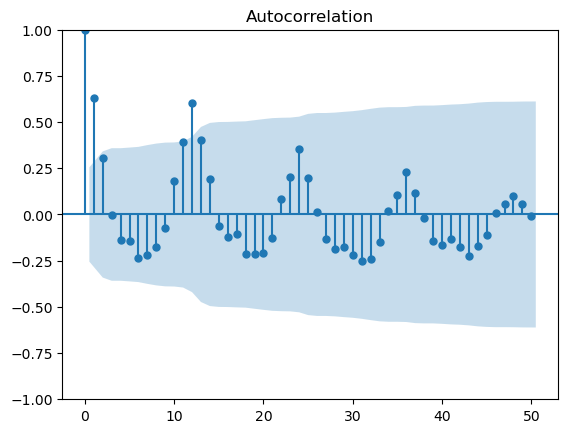

In [221]:
plot_acf(sao_jorge['Gasóleo'], lags=50) #calcular a autocorrelação num períoo menor
plt.show() #desenhar gráfico

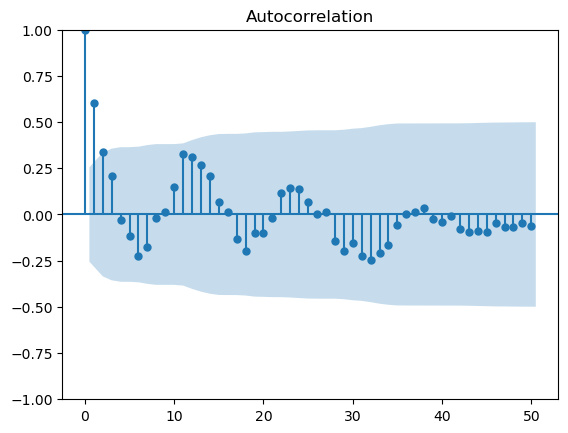

In [222]:
plot_acf(sao_jorge['Eólica'], lags=50) #calcular a autocorrelação num períoo menor
plt.show() #desenhar gráfico

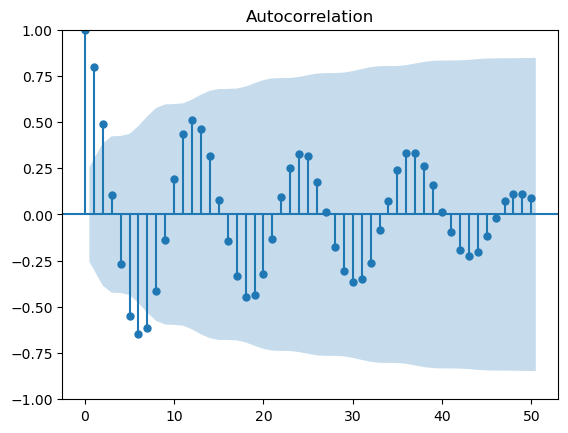

In [223]:
plot_acf(sao_jorge['Fotovoltaica'], lags=50) #calcular a autocorrelação num períoo menor
plt.show() #desenhar gráfico

Nas três correlações é percetível a perioricidade anual, dado que os máximos são atingidos de 12 em 12 meses.

#### 3.5.3. Métodos de Filtro

#### 3.5.3.1. Coeficiente Rô de Spearman

Estatística usada para medir com que intensidade a relação entre duas variáveis pode ser descrita por uma função monótona.

In [253]:
for i in [2,3,8,9,10,11]:
    for j in [4,5,6,7]:
        entrada_especifica = sao_jorge_valores[:,i]
        saida_especifica = sao_jorge_valores[:,j]
        spearman, _ = spearmanr(entrada_especifica, saida_especifica) #calcular o coeficiente
        print(i, j, spearman) #indicar o coeficiente

2 4 -0.345645774895282
2 5 0.2260378604911958
2 6 0.12441170581027478
2 7 -0.25946965203426464
3 4 0.407997441846176
3 5 -0.41711731588658335
3 6 -0.04390400900221782
3 7 0.25947795466889984
8 4 0.6308007013442433
8 5 -0.4303331385154881
8 6 -0.17860900058445356
8 7 0.6130333138515489
9 4 -0.6758620689655174
9 5 0.6130917592051434
9 6 -0.1870251315020456
9 7 -0.5579193454120398
10 4 0.33050847457627125
10 5 -0.5320280537697254
10 6 0.7845704266510813
10 7 0.13512565751022795
11 4 0.4443600233781415
11 5 -0.23571011104617182
11 6 -0.320864991233197
11 7 0.4819988310929282


Como esperado, a relação entre a emissão de eletricidade do mês atual e anterior com a mesma origem apresenta uma maior relação entre si. Para além disso, é de salientar os valores elvados obtidos para a relação entre o número de habitantes/consumidores e a eletricidade emitida.

#### 3.5.3.2. Coeficiente de Pearson

Estatística usada para medir a correlação linear entre duas variavéis.

In [254]:
for i in [2,3,8,9,10,11]:
    for j in [4,5,6,7]:
        entrada_especifica = sao_jorge_valores[:,i]
        saida_especifica = sao_jorge_valores[:,j]
        pearson, _ = pearsonr(entrada_especifica, saida_especifica) #calcular o coeficiente
        print(i, j, pearson) #indicar o coeficiente

2 4 -0.22862006391405187
2 5 0.13862523647799274
2 6 0.22713304804141973
2 7 -0.22097997920334833
3 4 0.37724140388114413
3 5 -0.37936785433446385
3 6 -0.08435147137874112
3 7 0.27395732828273667
8 4 0.6414830955858282
8 5 -0.4425234951594503
8 6 -0.10849267156050643
8 7 0.5923956667380023
9 4 -0.6442773283477392
9 5 0.5952917189503275
9 6 -0.21952955110575287
9 7 -0.504575114755914
10 4 0.34070272862705653
10 5 -0.5463800950166362
10 6 0.7995764729747492
10 7 0.12996886333605198
11 4 0.4721694493258629
11 5 -0.23511744121487993
11 6 -0.27524039401257966
11 7 0.4903605488940883


Como esperado, a relação entre a emissão de eletricidade do mês atual e anterior com a mesma origem apresenta uma maior relação entre si. Para além disso, é de salientar os valores elvados obtidos para a relação entre o número de habitantes/consumidores e a eletricidade emitida.

#### 3.5.3.3. Coeficiente Tau de Kendall

Estatística usada para medir a correlação de postos (posições relativas das observações) entre duas variáveis.

In [255]:
for i in [0,1]:
    for j in [4,5,6,7]:
        entrada_especifica = sao_jorge_valores[:,i]
        saida_especifica = sao_jorge_valores[:,j]
        tau, _ = kendalltau(entrada_especifica, saida_especifica) #calcular o coeficiente
        print(i, j, tau) #indicar o coeficiente

0 4 0.21973603140369924
0 5 -0.11319734951099657
0 6 -0.22821069928152785
0 7 0.2124720303655604
1 4 0.2536656495806109
1 5 -0.28199379318859785
1 6 0.028328143607986998
1 7 0.12618900334466934


Como esperado, devido à perioricidade dos dados, o ano atual tem uma melhor correlação com a eletricidade emitida no mesmo.

#### 3.5.3.4. ANOVA: Valor-F

A função f_regression determina a razão entre a variância explicada e a variância não explicada.

In [256]:
for j in [4,5,6,7]:
    entrada_especifica = sao_jorge_valores[:,[0,1]]
    saida_especifica = sao_jorge_valores[:,j]
    variaveis = SelectKBest(k = 2, score_func = f_regression) #fazer o top5 das variavéis
    fit = variaveis.fit(entrada_especifica, saida_especifica) 
    print(j, fit.scores_) #indicar a pontuação

4 [6.6244437  5.83180779]
5 [ 1.33120588 11.33170254]
6 [5.27540221 0.09750686]
7 [7.44936273 1.49015313]


Como esperado, devido à perioricidade dos dados, o ano atual tem uma melhor correlação com a eletricidade emitida no mesmo, há exceção da de origem no gasóleo e fotovoltaica.

### 3.6. Pico

#### 3.6.1. Preparação dos Dados

Antes de fazer a seleção dos dados é necessário criar novas colunas ou eliminar outras com os dados organizados.

In [466]:
colunas = ['Ilha', 'Hídrica', 'Geotérmica', 'Resíduos', 'Outras Renováveis']
pico.drop(columns=colunas, inplace=True) #eliminar colunas sem informação
pico['Fuelóleo-1'] = pico['Fuelóleo'].shift(-1) #criar colunas com informação do mês anterior
pico['Gasóleo-1'] = pico['Gasóleo'].shift(-1)
pico['Eólica-1'] = pico['Eólica'].shift(-1)
pico['Fotovoltaica-1'] = pico['Fotovoltaica'].shift(-1)
pico['Total-1'] = pico['Total'].shift(-1)
pico.dropna(inplace=True) #eliminar o primeiro mês (dado que não existe info anterior)
pico

,Mês,Ano,Habitantes,Consumidores,Fuelóleo,Gasóleo,Eólica,Fotovoltaica,Total,Fuelóleo-1,Gasóleo-1,Eólica-1,Fotovoltaica-1,Total-1
Data,,,,,,,,,,,,,,
2024-02-01,2,2024,14221,10387,3469852,0,456945,971,3927768,3928842.0,161.0,362845.0,692.0,4293971.0
2024-01-01,1,2024,14221,10373,3928842,161,362845,692,4293971,3899608.0,352.0,318972.0,520.0,4219452.0
2023-12-01,12,2023,13635,10387,3899608,352,318972,520,4219452,3618896.0,268.0,386534.0,648.0,4006346.0
2023-11-01,11,2023,13635,10370,3618896,268,386534,648,4006346,3586214.0,0.0,436858.0,1105.0,4024177.0
2023-10-01,10,2023,13635,10351,3586214,0,436858,1105,4024177,3855745.0,253.0,312712.0,1357.0,4171398.0
2023-09-01,9,2023,13635,10351,3855745,253,312712,1357,4171398,4432076.0,96.0,217313.0,1438.0,4655851.0
2023-08-01,8,2023,13635,10356,4432076,96,217313,1438,4655851,4168926.0,948.0,152946.0,1297.0,4324117.0
2023-07-01,7,2023,13635,10319,4168926,948,152946,1297,4324117,3508736.0,0.0,351821.0,1271.0,3861828.0
2023-06-01,6,2023,13635,10295,3508736,0,351821,1271,3861828,3448501.0,0.0,393300.0,1059.0,3842860.0


In [467]:
pico_valores = pico.values #guardar apenas os valores
pico_saidas = pico_valores[:,[4,5,6,7,8]]
pico_entradas = pico_valores[:,[0,1,2,3,9,10,11,12,13]]

#### 3.6.2. Análise das Séries Temporais

Uma vez que os dados usados são sequenciais, o tempo passa também a ser uma variável. Assim, fez-se uma análise temporal das diferentes variavéis de forma a reconhecer padrões e prever futuros valores.

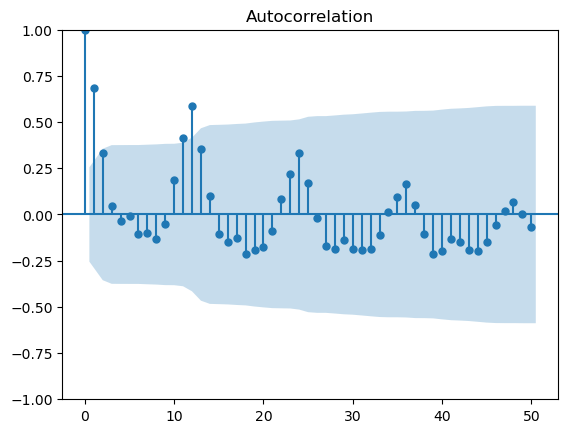

In [226]:
plot_acf(pico['Fuelóleo'], lags=50) #calcular a autocorrelação num períoo menor
plt.show() #desenhar gráfico

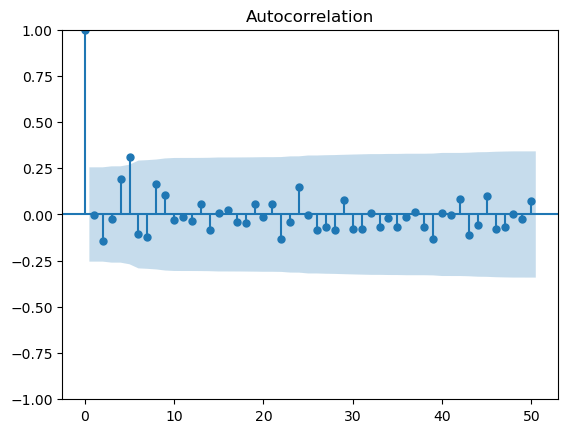

In [227]:
plot_acf(pico['Gasóleo'], lags=50) #calcular a autocorrelação num períoo menor
plt.show() #desenhar gráfico

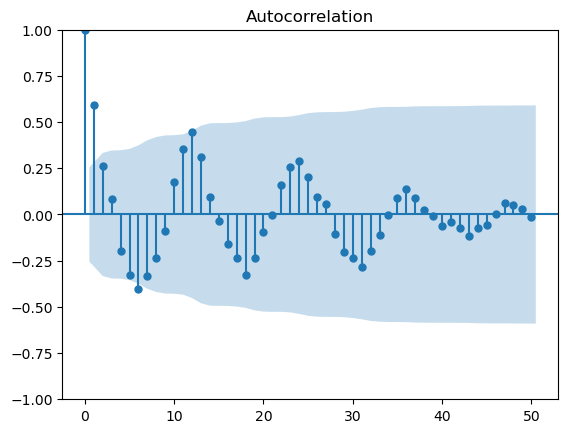

In [228]:
plot_acf(pico['Eólica'], lags=50) #calcular a autocorrelação num períoo menor
plt.show() #desenhar gráfico

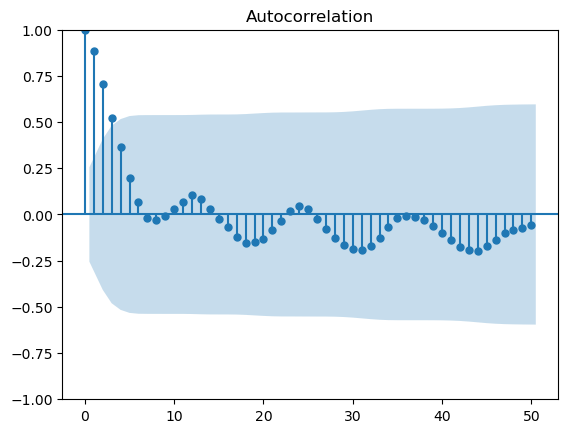

In [229]:
plot_acf(pico['Fotovoltaica'], lags=50) #calcular a autocorrelação num períoo menor
plt.show() #desenhar gráfico

Há exceção das fontes de energia com origem no gasóleo é percetível a perioricidade anual, dado que os máximos são atingidos de 12 em 12 meses.

#### 3.6.3. Métodos de Filtro

#### 3.6.3.1. Coeficiente Rô de Spearman

Estatística usada para medir com que intensidade a relação entre duas variáveis pode ser descrita por uma função monótona.

In [257]:
for i in [2,3,9,10,11,12,13]:
    for j in [4,5,6,7,8]:
        entrada_especifica = pico_valores[:,i]
        saida_especifica = pico_valores[:,j]
        spearman, _ = spearmanr(entrada_especifica, saida_especifica) #calcular o coeficiente
        print(i, j, spearman) #indicar o coeficiente

2 4 -0.40410272302058986
2 5 -0.14451856922989575
2 6 0.16998280806898225
2 7 -0.08017606965896579
2 8 -0.4125093579814198
3 4 0.48157348871419037
3 5 0.10394583561500494
3 6 -0.2368705623272553
3 7 0.3768376444690021
3 8 0.4803168034359581
9 4 0.7056107539450615
9 5 -0.03865830856372302
9 6 -0.39497369959088263
9 7 0.16088023874578444
9 8 0.6737580362361193
10 4 0.04986833071035732
10 5 -0.0439182109391372
10 6 0.08897030769677035
10 7 0.013044614046447377
10 8 0.15658537531472813
11 4 -0.7220923436586794
11 5 0.16288546691692632
11 6 0.5790765634132088
11 7 -0.3910222696491546
11 8 -0.6030391583869084
12 4 0.5244315866109177
12 5 -0.045271614054620664
12 6 -0.6261616703664264
12 7 0.8241758241758244
12 8 0.33765854286444935
13 4 0.5150789012273524
13 5 0.008193076872342216
13 6 -0.16855639976621864
13 7 -0.003185457951551409
13 8 0.5652250146113386


Como esperado, a relação entre a emissão de eletricidade do mês atual e anterior com a mesma origem apresenta uma maior relação entre si. Para além disso, é de salientar os valores elvados obtidos para a relação entre o número de habitantes/consumidores e a eletricidade emitida.

#### 3.6.3.2. Coeficiente de Pearson

Estatística usada para medir a correlação linear entre duas variavéis.

In [258]:
for i in [2,3,9,10,11,12,13]:
    for j in [4,5,6,7,8]:
        entrada_especifica = pico_valores[:,i]
        saida_especifica = pico_valores[:,j]
        pearson, _ = pearsonr(entrada_especifica, saida_especifica) #calcular o coeficiente
        print(i, j, pearson) #indicar o coeficiente

2 4 -0.22946721175616624
2 5 -0.15771958356878896
2 6 -0.005572012856949301
2 7 -0.01954023405905699
2 8 -0.30237892198491895
3 4 0.5144817135609667
3 5 0.2505350729037732
3 6 -0.281889060083595
3 7 0.5457371075487387
3 8 0.51591897271423
9 4 0.700308962406972
9 5 -0.015635629509921024
9 6 -0.37147207298104423
9 7 0.31292856803095964
9 8 0.70803911112099
10 4 0.19490700004257536
10 5 -0.001581835588416701
10 6 -0.08185453695057204
10 7 0.1534655639476984
10 8 0.20976097886306289
11 4 -0.6824492436278553
11 5 0.0369151897102384
11 6 0.5896931012381369
11 7 -0.34190584786560746
11 8 -0.5637161404326757
12 4 0.4670455105661274
12 5 0.2787293161011568
12 6 -0.4807301088658755
12 7 0.9009602943583203
12 8 0.3443397050350381
13 4 0.5346433019827144
13 5 -0.00022589229692808466
13 6 -0.15853324946955918
13 7 0.22024451053119465
13 8 0.6099006959968958


Como esperado, a relação entre a emissão de eletricidade do mês atual e anterior com a mesma origem apresenta uma maior relação entre si. Para além disso, é de salientar os valores elvados obtidos para a relação entre o número de habitantes/consumidores e a eletricidade emitida.

#### 3.6.3.3. Coeficiente Tau de Kendall

Estatística usada para medir a correlação de postos (posições relativas das observações) entre duas variáveis.

In [259]:
for i in [0,1]:
    for j in [4,5,6,7,8]:
        entrada_especifica = pico_valores[:,i]
        saida_especifica = pico_valores[:,j]
        tau, _ = kendalltau(entrada_especifica, saida_especifica) #calcular o coeficiente
        print(i, j, tau) #indicar o coeficiente

0 4 0.20762936300680118
0 5 0.07825984392676671
0 6 -0.1265146847475844
0 7 -0.04787733707237333
0 8 0.19431202777021336
1 4 0.30002079366640777
1 5 0.05638549088805333
1 6 -0.13777778936611856
1 7 0.2713662161086518
1 8 0.2948702221013192


Como esperado, devido à perioricidade dos dados, o ano atual tem uma melhor correlação com a eletricidade emitida no mesmo, há exceção do gasóleo.

#### 3.6.3.4. ANOVA: Valor-F

A função f_regression determina a razão entre a variância explicada e a variância não explicada.

In [260]:
for j in [4,5,6,7,8]:
    entrada_especifica = pico_valores[:,[0,1]]
    saida_especifica = pico_valores[:,j]
    variaveis = SelectKBest(k = 2, score_func = f_regression) #fazer o top5 das variavéis
    fit = variaveis.fit(entrada_especifica, saida_especifica) 
    print(j, fit.scores_) #indicar a pontuação

4 [6.23276922 9.95775826]
5 [1.03114277 2.56100391]
6 [2.7794394  2.17699538]
7 [ 0.07058501 20.23632279]
8 [ 5.23697815 10.70945961]


Como esperado, devido à perioricidade dos dados, o ano atual tem uma melhor correlação com a eletricidade emitida no mesmo, há exceção do gasóleo.

### 3.7. Faial

#### 3.7.1. Preparação dos Dados

Antes de fazer a seleção dos dados é necessário criar novas colunas ou eliminar outras com os dados organizados.

In [200]:
colunas = ['Ilha', 'Geotérmica', 'Resíduos', 'Outras Renováveis']
faial.drop(columns=colunas, inplace=True) #eliminar colunas sem informação
faial['Fuelóleo-1'] = faial['Fuelóleo'].shift(-1) #criar colunas com informação do mês anterior
faial['Gasóleo-1'] = faial['Gasóleo'].shift(-1)
faial['Hídrica-1'] = faial['Hídrica'].shift(-1)
faial['Eólica-1'] = faial['Eólica'].shift(-1)
faial['Fotovoltaica-1'] = faial['Fotovoltaica'].shift(-1)
faial['Total-1'] = faial['Total'].shift(-1)
faial.dropna(inplace=True) #eliminar o primeiro mês (dado que não existe info anterior)
faial

,Mês,Ano,Habitantes,Consumidores,Fuelóleo,Gasóleo,Hídrica,Eólica,Fotovoltaica,Total,Fuelóleo-1,Gasóleo-1,Hídrica-1,Eólica-1,Fotovoltaica-1,Total-1
Data,,,,,,,,,,,,,,,,
2024-02-01,2,2024,14423,8487,3376638,3485,0,476852,5731,3862706,3853723.0,0.0,0.0,437577.0,3629.0,4294929.0
2024-01-01,1,2024,14423,8479,3853723,0,0,437577,3629,4294929,3743993.0,124.0,0.0,461716.0,2391.0,4208224.0
2023-12-01,12,2023,14443,8483,3743993,124,0,461716,2391,4208224,3477531.0,11366.0,0.0,471812.0,2315.0,3963024.0
2023-11-01,11,2023,14443,8470,3477531,11366,0,471812,2315,3963024,3504156.0,0.0,0.0,481697.0,5272.0,3991125.0
2023-10-01,10,2023,14443,8456,3504156,0,0,481697,5272,3991125,3807546.0,0.0,0.0,319437.0,6722.0,4133705.0
2023-09-01,9,2023,14443,8455,3807546,0,0,319437,6722,4133705,4239936.0,0.0,0.0,317440.0,8422.0,4565798.0
2023-08-01,8,2023,14443,8447,4239936,0,0,317440,8422,4565798,4013643.0,0.0,0.0,240156.0,10842.0,4264641.0
2023-07-01,7,2023,14443,8446,4013643,0,0,240156,10842,4264641,3384409.0,9759.0,0.0,487646.0,7307.0,3889121.0
2023-06-01,6,2023,14443,8440,3384409,9759,0,487646,7307,3889121,3533464.0,610.0,23601.0,361510.0,8514.0,3927699.0


In [201]:
faial_valores = faial.values #guardar apenas os valores
faial_saidas = faial_valores[:,[4,5,6,7,8,9]]
faial_entradas = faial_valores[:,[0,1,2,3,10,11,12,13,14,15]]

#### 3.7.2. Análise das Séries Temporais

Uma vez que os dados usados são sequenciais, o tempo passa também a ser uma variável. Assim, fez-se uma análise temporal das diferentes variavéis de forma a reconhecer padrões e prever futuros valores.

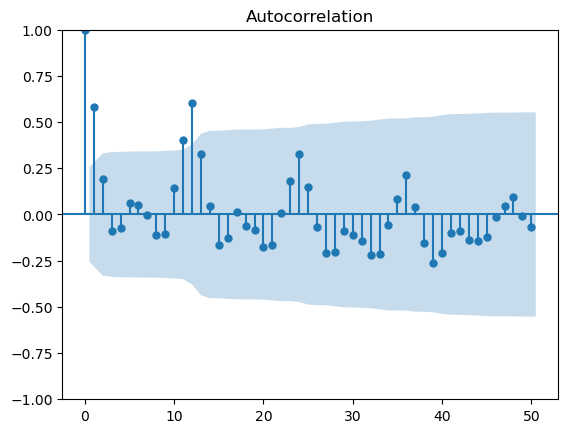

In [265]:
plot_acf(faial['Fuelóleo'], lags=50) #calcular a autocorrelação num períoo menor
plt.show() #desenhar gráfico

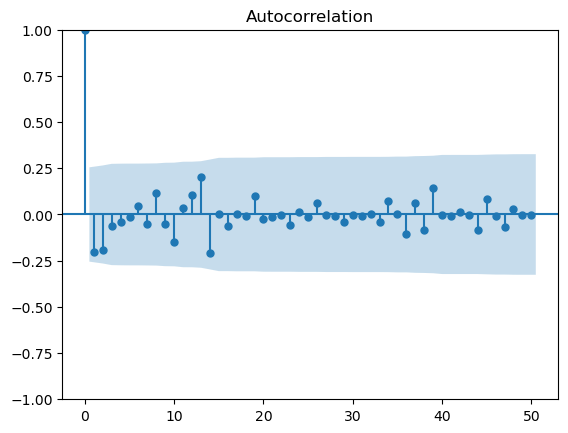

In [266]:
plot_acf(faial['Gasóleo'], lags=50) #calcular a autocorrelação num períoo menor
plt.show() #desenhar gráfico

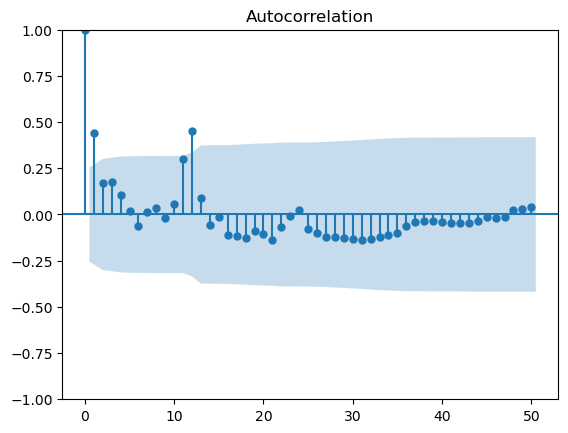

In [267]:
plot_acf(faial['Hídrica'], lags=50) #calcular a autocorrelação num períoo menor
plt.show() #desenhar gráfico

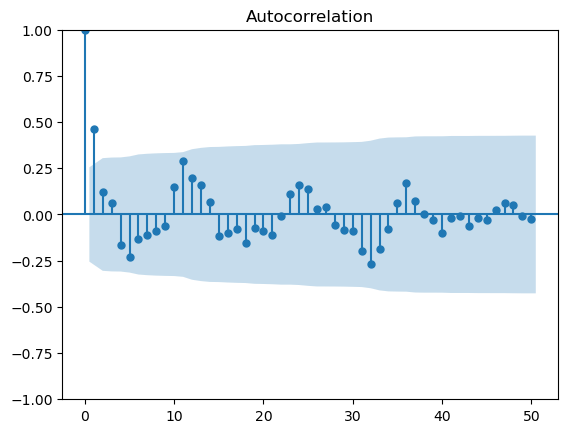

In [268]:
plot_acf(faial['Eólica'], lags=50) #calcular a autocorrelação num períoo menor
plt.show() #desenhar gráfico

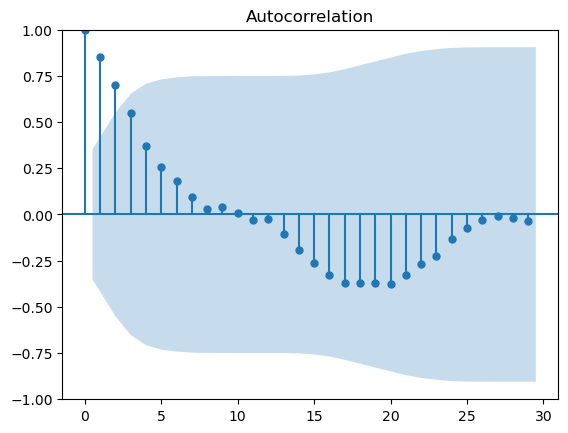

In [269]:
faial_right = faial.iloc[:31] #eliminar intervalo no qual não existia energia fotovoltaica
plot_acf(faial_right['Fotovoltaica'], lags=29) #calcular a autocorrelação num períoo menor
plt.show() #desenhar gráfico

Para fontes de energia como o fuelóleo e eólica é percetível a perioricidade anual, dado que os máximos são atingidos de 12 em 12 meses.

#### 3.7.3. Métodos de Filtro

#### 3.7.3.1. Coeficiente Rô de Spearman

Estatística usada para medir com que intensidade a relação entre duas variáveis pode ser descrita por uma função monótona.

In [270]:
for i in [2,3,10,11,12,13,14,15]:
    for j in [4,5,6,7,8,9]:
        entrada_especifica = faial_valores[:,i]
        saida_especifica = faial_valores[:,j]
        spearman, _ = spearmanr(entrada_especifica, saida_especifica) #calcular o coeficiente
        print(i, j, spearman) #indicar o coeficiente

2 4 -0.4760946780133343
2 5 0.13501241809115797
2 6 -0.4276942932609327
2 7 0.1764419600273033
2 8 -0.7848722025265026
2 9 -0.4536986234844823
3 4 0.4852487775061468
3 5 -0.18429349575890422
3 6 0.34291866751143424
3 7 -0.21939066325816933
3 8 0.8911358718433982
3 9 0.47507854294988694
10 4 0.5713617767387494
10 5 -0.11361426250762749
10 6 -0.09487092920230433
10 7 -0.30543541788427825
10 8 0.4656440854113666
10 9 0.5085330216247809
11 4 -0.05888958863838755
11 5 -0.08913704870255323
11 6 0.08806304313285282
11 7 0.13339630575546352
11 8 -0.1902986613254468
11 9 0.039042821196721034
12 4 -0.04000508384711872
12 5 -0.03397888704606276
12 6 0.6884082559673405
12 7 0.09219601661353895
12 8 0.3884477959610946
12 9 -0.06949688627366359
13 4 -0.4511396843950906
13 5 0.1054968496238661
13 6 0.11004750589719452
13 7 0.4187025131502047
13 8 -0.30748260416428097
13 9 -0.3355347749853887
14 4 0.433451086812026
14 5 -0.17280077286761097
14 6 0.3591023546335862
14 7 -0.3029203522635259
14 8 0.95740

Como esperado, a relação entre a emissão de eletricidade do mês atual e anterior com a mesma origem apresenta uma maior relação entre si. Para além disso, é de salientar os valores elvados obtidos para a relação entre o número de habitantes/consumidores e a eletricidade emitida.

#### 3.7.3.2. Coeficiente de Pearson

Estatística usada para medir a correlação linear entre duas variavéis.

In [271]:
for i in [2,3,10,11,12,13,14,15]:
    for j in [4,5,6,7,8,9]:
        entrada_especifica = faial_valores[:,i]
        saida_especifica = faial_valores[:,j]
        pearson, _ = pearsonr(entrada_especifica, saida_especifica) #calcular o coeficiente
        print(i, j, pearson) #indicar o coeficiente

2 4 -0.3616003690945825
2 5 0.018168628661262717
2 6 -0.3472026084030101
2 7 0.05203147891597807
2 8 -0.48215536384127994
2 9 -0.4529761002379272
3 4 0.46274379961532847
3 5 0.010185951309587896
3 6 0.27492904811159724
3 7 -0.21364540016219224
3 8 0.7038990481413004
3 9 0.4921114172880749
10 4 0.602480374218994
10 5 0.00805824423907349
10 6 -0.19347858297879633
10 7 -0.3576649614704504
10 8 0.3498061207808384
10 9 0.5621978176998842
11 4 0.07773266690042492
11 5 -0.19869631445207145
11 6 0.04089088024521527
11 7 -0.03302032637321185
11 8 -0.02169481758354308
11 9 0.08051821362417258
12 4 -0.1471623144791448
12 5 -0.09331613903722151
12 6 0.444129318366278
12 7 0.1091282054544298
12 8 0.23275437817215028
12 9 -0.10184838994550882
13 4 -0.4986094345437162
13 5 -0.04500984044459193
13 6 0.06475069428311515
13 7 0.4686025598806999
13 8 -0.2735536975419652
13 9 -0.37726022743163234
14 4 0.4249266086714995
14 5 0.024542879870047468
14 6 0.06940119949841567
14 7 -0.35614436845414066
14 8 0.92

Como esperado, a relação entre a emissão de eletricidade do mês atual e anterior com a mesma origem apresenta uma maior relação entre si. Para além disso, é de salientar os valores elvados obtidos para a relação entre o número de habitantes/consumidores e a eletricidade emitida.

#### 3.7.3.3. Coeficiente Tau de Kendall

Estatística usada para medir a correlação de postos (posições relativas das observações) entre duas variáveis.

In [272]:
for i in [0,1]:
    for j in [4,5,6,7,8,9]:
        entrada_especifica = faial_valores[:,i]
        saida_especifica = faial_valores[:,j]
        tau, _ = kendalltau(entrada_especifica, saida_especifica) #calcular o coeficiente
        print(i, j, tau) #indicar o coeficiente

0 4 0.12288268422851499
0 5 0.09544752734633025
0 6 -0.0940631787083961
0 7 0.018765336015191942
0 8 -0.01802827643125635
0 9 0.18341602621300512
1 4 0.31804779414421763
1 5 -0.18032487743269376
1 6 0.3240736992121093
1 7 -0.18670821923445977
1 8 0.7942685221732214
1 9 0.27684322162350933


Como esperado, devido à perioricidade dos dados, o ano atual tem uma melhor correlação com a eletricidade emitida no mesmo.

#### 3.7.3.4. ANOVA: Valor-F

A função f_regression determina a razão entre a variância explicada e a variância não explicada.

In [273]:
for j in [4,5,6,7,8,9]:
    entrada_especifica = faial_valores[:,[0,1]]
    saida_especifica = faial_valores[:,j]
    variaveis = SelectKBest(k = 2, score_func = f_regression) #fazer o top5 das variavéis
    fit = variaveis.fit(entrada_especifica, saida_especifica) 
    print(j, fit.scores_) #indicar a pontuação

4 [2.74397847 9.74878936]
5 [2.43893739 0.08626645]
6 [0.86876338 5.68312045]
7 [2.56154948e-04 3.65051495e+00]
8 [ 0.26800537 74.09644239]
9 [4.30207221 9.28939994]


Como esperado, devido à perioricidade dos dados, o ano atual tem uma melhor correlação com a eletricidade emitida no mesmo, há exceção da de origem no gasóleo.

### 3.8. Flores

#### 3.8.1. Preparação dos Dados

Antes de fazer a seleção dos dados é necessário criar novas colunas ou eliminar outras com os dados organizados.

In [202]:
colunas = ['Ilha', 'Fuelóleo', 'Geotérmica', 'Resíduos', 'Outras Renováveis']
flores.drop(columns=colunas, inplace=True) #eliminar colunas sem informação
flores['Gasóleo-1'] = flores['Gasóleo'].shift(-1) #criar colunas com informação do mês anterior
flores['Hídrica-1'] = flores['Hídrica'].shift(-1)
flores['Eólica-1'] = flores['Eólica'].shift(-1)
flores['Fotovoltaica-1'] = flores['Fotovoltaica'].shift(-1)
flores['Total-1'] = flores['Total'].shift(-1)
flores.dropna(inplace=True) #eliminar o primeiro mês (dado que não existe info anterior)
flores

,Mês,Ano,Habitantes,Consumidores,Gasóleo,Hídrica,Eólica,Fotovoltaica,Total,Gasóleo-1,Hídrica-1,Eólica-1,Fotovoltaica-1,Total-1
Data,,,,,,,,,,,,,,
2024-02-01,2,2024,3503,2569,359575,536705,60905.00,229,896623,318789.0,664251.0,47337.75,146.0,983186.0
2024-01-01,1,2024,3503,2566,318789,664251,47337.75,146,983186,310289.0,646781.0,9211.00,136.0,966417.0
2023-12-01,12,2023,3627,2570,310289,646781,9211.00,136,966417,321710.0,581630.0,17990.00,116.0,921446.0
2023-11-01,11,2023,3627,2566,321710,581630,17990.00,116,921446,369748.0,541209.0,20297.00,208.0,931462.0
2023-10-01,10,2023,3627,2564,369748,541209,20297.00,208,931462,607926.0,341875.0,6541.00,257.0,956599.0
2023-09-01,9,2023,3627,2562,607926,341875,6541.00,257,956599,840521.0,183904.0,21207.00,300.0,1045932.0
2023-08-01,8,2023,3627,2559,840521,183904,21207.00,300,1045932,838479.0,155377.0,19339.00,75.0,1013270.0
2023-07-01,7,2023,3627,2559,838479,155377,19339.00,75,1013270,506802.0,329160.0,71267.00,0.0,907229.0
2023-06-01,6,2023,3627,2562,506802,329160,71267.00,0,907229,458937.0,381668.0,77117.00,0.0,917722.0


In [203]:
flores_valores = flores.values #guardar apenas os valores
flores_saidas = flores_valores[:,[4,5,6,7,8]]
flores_entradas = flores_valores[:,[0,1,2,3,9,10,11,12,13]]

#### 3.8.2. Análise das Séries Temporais

Uma vez que os dados usados são sequenciais, o tempo passa também a ser uma variável. Assim, fez-se uma análise temporal das diferentes variavéis de forma a reconhecer padrões e prever futuros valores.

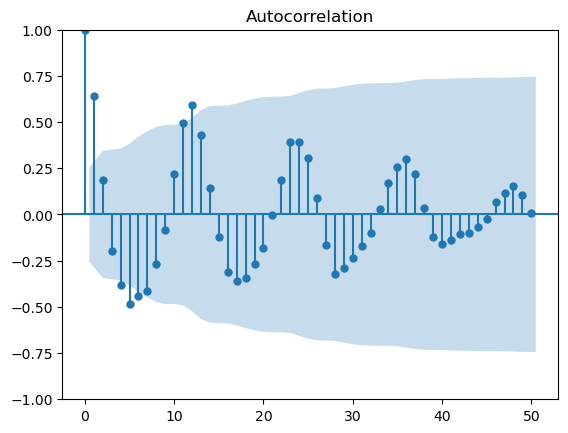

In [276]:
plot_acf(flores['Gasóleo'], lags=50) #calcular a autocorrelação num períoo menor
plt.show() #desenhar gráfico

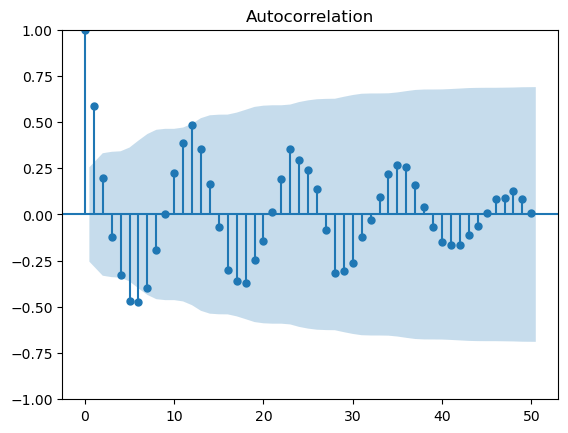

In [277]:
plot_acf(flores['Hídrica'], lags=50) #calcular a autocorrelação num períoo menor
plt.show() #desenhar gráfico

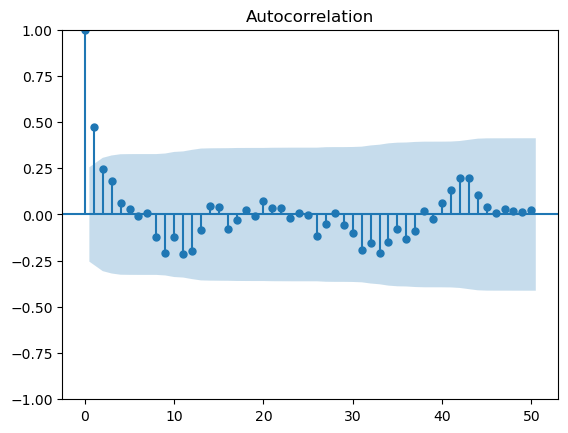

In [278]:
plot_acf(flores['Eólica'], lags=50) #calcular a autocorrelação num períoo menor
plt.show() #desenhar gráfico

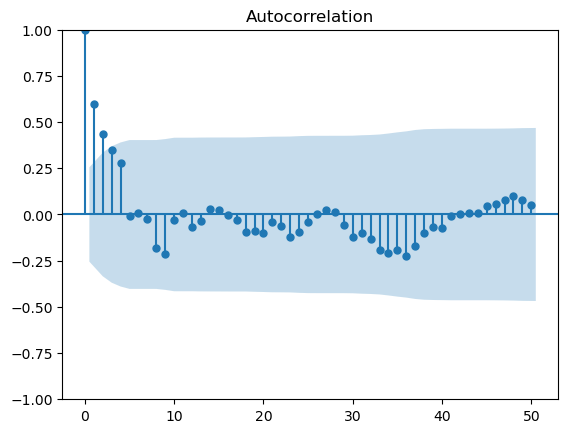

In [279]:
plot_acf(flores['Fotovoltaica'], lags=50) #calcular a autocorrelação num períoo menor
plt.show() #desenhar gráfico

Há exceção das fontes de energia com origem eólica e fotovoltaica é percetível a perioricidade anual, dado que os máximos são atingidos de 12 em 12 meses.

#### 3.8.3. Métodos de Filtro

#### 3.8.3.1. Coeficiente Rô de Spearman

Estatística usada para medir com que intensidade a relação entre duas variáveis pode ser descrita por uma função monótona.

In [280]:
for i in [2,3,9,10,11,12,13]:
    for j in [4,5,6,7,8]:
        entrada_especifica = flores_valores[:,i]
        saida_especifica = flores_valores[:,j]
        spearman, _ = spearmanr(entrada_especifica, saida_especifica) #calcular o coeficiente
        print(i, j, spearman) #indicar o coeficiente

2 4 0.01467103861890013
2 5 -0.13505794622398992
2 6 -0.08137233145482882
2 7 0.10952560265220643
2 8 -0.33379858663001977
3 4 -0.01031801735212496
3 5 0.13287735660838548
3 6 -0.03712147885891983
3 7 -0.3159126300402338
3 8 0.3295627355388355
9 4 0.6360607831677383
9 5 -0.583459964932788
9 6 -0.05593220338983052
9 7 0.186865909950235
9 8 0.4164231443600234
10 4 -0.5977206312098189
10 5 0.5698421975452952
10 6 0.02513150204558738
10 7 -0.20253796874124202
10 8 -0.39240210403272946
11 4 -0.18211572180011693
11 5 0.13752191700759792
11 6 0.48994739918176516
11 7 -0.19619312404413655
11 8 0.020105201636469904
12 4 0.16107718634264506
12 5 -0.19174880886459728
12 6 0.05514459492507325
12 7 0.5438827453045463
12 8 -0.04844888324010943
13 4 0.24038573933372298
13 5 -0.11408533021624784
13 6 0.040561075394506145
13 7 0.07613813636526551
13 8 0.37603740502630045


Como esperado, a relação entre a emissão de eletricidade do mês atual e anterior com a mesma origem apresenta uma maior relação entre si.

#### 3.8.3.2. Coeficiente de Pearson

Estatística usada para medir a correlação linear entre duas variavéis.

In [281]:
for i in [2,3,9,10,11,12,13]:
    for j in [4,5,6,7,8]:
        entrada_especifica = flores_valores[:,i]
        saida_especifica = flores_valores[:,j]
        pearson, _ = pearsonr(entrada_especifica, saida_especifica) #calcular o coeficiente
        print(i, j, pearson) #indicar o coeficiente

2 4 0.09412559441120262
2 5 -0.2532860336553484
2 6 -0.10785593059715701
2 7 0.19535975642421236
2 8 -0.31393478084536963
3 4 0.05394064603322256
3 5 0.10645253660195603
3 6 -0.04643343031217033
3 7 -0.3462941647681448
3 8 0.3736705187567386
9 4 0.6454485519392029
9 5 -0.5571168980130178
9 6 -0.121533905113431
9 7 0.05760728275983908
9 8 0.4829822519259656
10 4 -0.6306077435201287
10 5 0.5834734640656978
10 6 0.0652990883528899
10 7 -0.13383758819739613
10 8 -0.4205195421754035
11 4 -0.17344035844109879
11 5 0.14510513098963335
11 6 0.47210908467245055
11 7 -0.18719318847581237
11 8 0.10942717838159688
12 4 0.1311504185980871
12 5 -0.20486519019136412
12 6 -0.007632299953436512
12 7 0.5977873848453433
12 8 -0.11836645680343548
13 4 0.2519816750453393
13 5 -0.1198956563369424
13 6 0.0216863484687232
13 7 -0.2620567212986886
13 8 0.44498388521521093


Como esperado, a relação entre a emissão de eletricidade do mês atual e anterior com a mesma origem apresenta uma maior relação entre si.

#### 3.8.3.3. Coeficiente Tau de Kendall

Estatística usada para medir a correlação de postos (posições relativas das observações) entre duas variáveis.

In [282]:
for i in [0,1]:
    for j in [4,5,6,7,8]:
        entrada_especifica = flores_valores[:,i]
        saida_especifica = flores_valores[:,j]
        tau, _ = kendalltau(entrada_especifica, saida_especifica) #calcular o coeficiente
        print(i, j, tau) #indicar o coeficiente

0 4 0.17736269201455612
0 5 -0.15193868838107025
0 6 0.03087200441208997
0 7 -0.0833703729741787
0 8 0.1616240230985887
1 4 -0.055368644324701864
1 5 0.11975078888830867
1 6 -0.10043614551922664
1 7 -0.1540419194973488
1 8 0.12876428912721363


Como esperado, devido à perioricidade dos dados, o ano atual tem uma melhor correlação com a eletricidade emitida no mesmo, há exceção da do gasóleo e hídrica.

#### 3.8.3.4. ANOVA: Valor-F

A função f_regression determina a razão entre a variância explicada e a variância não explicada.

In [283]:
for j in [4,5,6,7,8]:
    entrada_especifica = flores_valores[:,[0,1]]
    saida_especifica = flores_valores[:,j]
    variaveis = SelectKBest(k = 2, score_func = f_regression) #fazer o top5 das variavéis
    fit = variaveis.fit(entrada_especifica, saida_especifica) 
    print(j, fit.scores_) #indicar a pontuação

4 [3.74700078 0.03237917]
5 [2.94115703 1.60398218]
6 [0.28935646 1.57248883]
7 [0.50239097 2.11239368]
8 [4.20031   2.8191028]


Como esperado, devido à perioricidade dos dados, o ano atual tem uma melhor correlação com a eletricidade emitida no mesmo, há exceção da do gasóleo e hídrica.

### 3.9. Corvo

#### 3.9.1. Preparação dos Dados

Antes de fazer a seleção dos dados é necessário criar novas colunas ou eliminar outras com os dados organizados.

In [204]:
colunas = ['Ilha', 'Fuelóleo', 'Hídrica', 'Geotérmica', 'Eólica', 'Resíduos', 'Outras Renováveis']
corvo.drop(columns=colunas, inplace=True) #eliminar colunas sem informação
corvo['Gasóleo-1'] = corvo['Gasóleo'].shift(-1) #criar colunas com informação do mês anterior
corvo['Fotovoltaica-1'] = corvo['Fotovoltaica'].shift(-1)
corvo['Total-1'] = corvo['Total'].shift(-1)
corvo.dropna(inplace=True) #eliminar o primeiro mês (dado que não existe info anterior)
corvo

,Mês,Ano,Habitantes,Consumidores,Gasóleo,Fotovoltaica,Total,Gasóleo-1,Fotovoltaica-1,Total-1
Data,,,,,,,,,,
2024-02-01,2,2024,432,292,134912,5233,140145,148881.0,4430.0,153311.0
2024-01-01,1,2024,432,292,148881,4430,153311,142703.0,4379.0,147082.0
2023-12-01,12,2023,470,294,142703,4379,147082,138345.0,3472.0,141817.0
2023-11-01,11,2023,470,292,138345,3472,141817,142484.0,5701.0,148185.0
2023-10-01,10,2023,470,290,142484,5701,148185,138208.0,7180.0,145388.0
2023-09-01,9,2023,470,290,138208,7180,145388,143317.0,10539.0,153856.0
2023-08-01,8,2023,470,290,143317,10539,153856,140396.0,8959.0,149355.0
2023-07-01,7,2023,470,288,140396,8959,149355,129039.0,8116.0,137155.0
2023-06-01,6,2023,470,288,129039,8116,137155,127294.0,9653.0,136947.0


In [205]:
corvo_valores = corvo.values #guardar apenas os valores
corvo_saidas = corvo_valores[:,[4,5,6]]
corvo_entradas = corvo_valores[:,[0,1,2,3,7,8,9]]

#### 3.9.2. Análise das Séries Temporais

Uma vez que os dados usados são sequenciais, o tempo passa também a ser uma variável. Assim, fez-se uma análise temporal das diferentes variavéis de forma a reconhecer padrões e prever futuros valores.

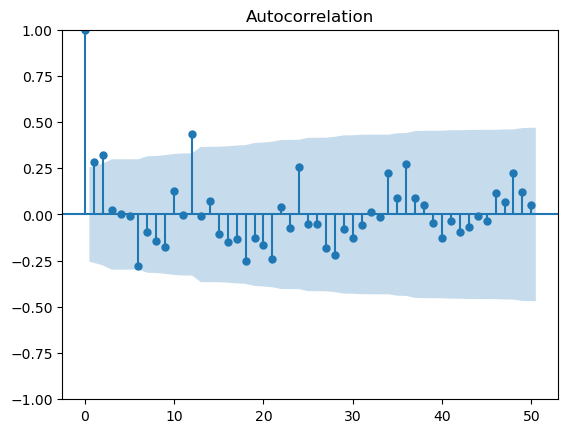

In [288]:
plot_acf(corvo['Gasóleo'], lags=50) #calcular a autocorrelação num períoo menor
plt.show() #desenhar gráfico

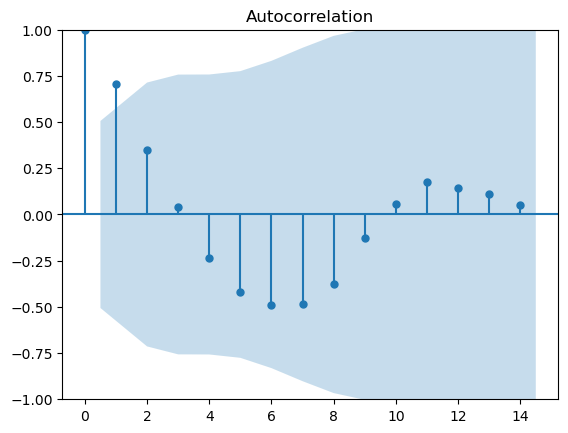

In [289]:
corvo_right = corvo.iloc[:15] #eliminar intervalo no qual não existia energia fotovoltaica
plot_acf(corvo_right['Fotovoltaica'], lags=14) #calcular a autocorrelação num períoo menor
plt.show() #desenhar gráfico

Apesar de as relações não serem tão periódicas, é percetível a perioricidade anual, dado que os máximos são atingidos de 12 em 12 meses.

#### 3.9.3. Métodos de Filtro

#### 3.9.3.1. Coeficiente Rô de Spearman

Estatística usada para medir com que intensidade a relação entre duas variáveis pode ser descrita por uma função monótona.

In [290]:
for i in [2,3,7,8,9]:
    for j in [4,5,6]:
        entrada_especifica = corvo_valores[:,i]
        saida_especifica = corvo_valores[:,j]
        spearman, _ = spearmanr(entrada_especifica, saida_especifica) #calcular o coeficiente
        print(i, j, spearman) #indicar o coeficiente

2 4 -0.11074686674267088
2 5 0.5710296945453296
2 6 0.09072024986687138
3 4 0.04402146635691857
3 5 0.845878048250224
3 6 0.3515195609833942
7 4 0.321157218001169
7 5 -0.18754609306310205
7 6 0.2181765049678551
8 4 -0.18491628944734856
8 5 0.9730943811886199
8 6 0.20338218195653057
9 4 0.2741087083576856
9 5 0.17537025901311817
9 6 0.3095265926358855


Como esperado, a relação entre a emissão de eletricidade do mês atual e anterior com a mesma origem apresenta uma maior relação entre si.

#### 3.9.3.2. Coeficiente de Pearson

Estatística usada para medir a correlação linear entre duas variavéis.

In [291]:
for i in [2,3,7,8,9]:
    for j in [4,5,6]:
        entrada_especifica = corvo_valores[:,i]
        saida_especifica = corvo_valores[:,j]
        pearson, _ = pearsonr(entrada_especifica, saida_especifica) #calcular o coeficiente
        print(i, j, pearson) #indicar o coeficiente

2 4 -0.148713421408678
2 5 0.24246292237305947
2 6 -0.03570041932949221
3 4 0.07281679355290446
3 5 0.754650042716045
3 6 0.4194843210436935
7 4 0.3020334388768195
7 5 -0.2452854999055712
7 6 0.1862678014892169
8 4 -0.16103177914811728
8 5 0.9614875122648775
8 6 0.28305777112249536
9 4 0.22455427827802968
9 5 0.19685321573820092
9 6 0.3130351175375663


Como esperado, a relação entre a emissão de eletricidade do mês atual e anterior com a mesma origem apresenta uma maior relação entre si.

#### 3.9.3.3. Coeficiente Tau de Kendall

Estatística usada para medir a correlação de postos (posições relativas das observações) entre duas variáveis.

In [292]:
for i in [0,1]:
    for j in [4,5,6]:
        entrada_especifica = corvo_valores[:,i]
        saida_especifica = corvo_valores[:,j]
        tau, _ = kendalltau(entrada_especifica, saida_especifica) #calcular o coeficiente
        print(i, j, tau) #indicar o coeficiente

0 4 0.2124720303655604
0 5 -0.056749051692204046
0 6 0.18462669305269494
1 4 -0.07210800191123964
1 5 0.7724199110871409
1 6 0.17898236188682695


Como esperado, devido à perioricidade dos dados, o ano atual tem uma melhor correlação com a eletricidade emitida no mesmo, há exceção do de origem no gasóleo.

#### 3.9.3.4. ANOVA: Valor-F

A função f_regression determina a razão entre a variância explicada e a variância não explicada.

In [293]:
for j in [4,5,6]:
    entrada_especifica = corvo_valores[:,[0,1]]
    saida_especifica = corvo_valores[:,j]
    variaveis = SelectKBest(k = 2, score_func = f_regression) #fazer o top5 das variavéis
    fit = variaveis.fit(entrada_especifica, saida_especifica) 
    print(j, fit.scores_) #indicar a pontuação

4 [5.2754796  0.43133544]
5 [  0.16203106 104.32412579]
6 [4.26292222 5.0124465 ]


Como esperado, devido à perioricidade dos dados, o ano atual tem uma melhor correlação com a eletricidade emitida no mesmo, há exceção do de origem no gasóleo.

## 4. Desenvolvimento e Avaliação de um Modelo de Regressão

In [207]:
from sklearn.model_selection import train_test_split
from statsmodels.tsa.ar_model import AutoReg
from sklearn.ensemble import RandomForestRegressor
from sklearn.neural_network import MLPRegressor
from sklearn import  metrics
from sklearn.metrics import mean_squared_error
import pickle 

### 4.1. Santa Maria

### 4.1.1. Gasóleo

In [399]:
colunas_nomes = ['MAE', 'MBE', 'MSE', 'RMSE', 'cvRMSE', 'NMBE'] #definir nome das colunas
performance = pd.DataFrame(columns=colunas_nomes) #criar dataframe no qual vamos guardar os parâmetros que avaliam a performance para posteriormente comparar

#### 4.1.1.1. Preparação dos Dados

In [400]:
gasoleo = santa_maria.drop(['Eólica', 'Fotovoltaica', 'Total', 'Eólica-1', 'Fotovoltaica-1', 'Total-1'], axis=1)  #eliminar as colunas que não se vão usar
gasoleo_saida = gasoleo.values[:,4]
gasoleo_entradas = gasoleo.values[:,[0,1,2,3,5]]
gasoleo_e_treino, gasoleo_e_teste, gasoleo_s_treino, gasoleo_s_teste = train_test_split(gasoleo_entradas,gasoleo_saida) #definir dados para treino (75%) e para teste (25%)

#### 4.1.1.2. Autoregressão

É usada na análise de séries temporais e pressupõe que o valor atual de uma série temporal é uma função de seus valores passados.

In [401]:
AR = AutoReg(gasoleo_s_treino, lags=1)
AR_fit = AR.fit()

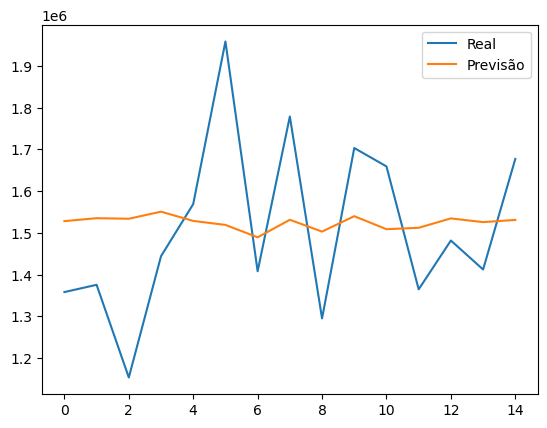

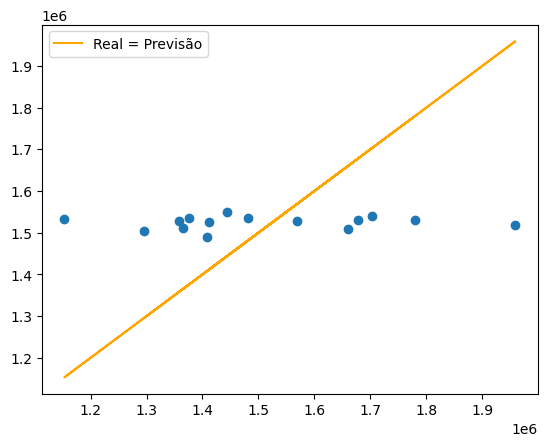

In [402]:
coeficiente = AR_fit.params #encontrar os parâmetros do modelo
passado = gasoleo_s_treino[len(gasoleo_s_treino)-1:]
passado = [passado[i] for i in range(len(passado))]
gasoleo_s_previsao = list() #definir lista no qual se vai guardar os valores previstos
for j in range(len(gasoleo_s_teste)):
    comprimento = len(passado)
    passo = [passado[i] for i in range(comprimento-1,comprimento)]
    valor = coeficiente[0]
    for k in range(1):
        valor += coeficiente[k+1] * passo[k]
    observado = gasoleo_s_teste[j]
    gasoleo_s_previsao.append(valor)
    passado.append(observado)
plt.plot(gasoleo_s_teste, label='Real') #desenhar os resultados
plt.plot(gasoleo_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(gasoleo_s_teste, gasoleo_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(gasoleo_s_teste, gasoleo_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [403]:
MAE = metrics.mean_absolute_error(gasoleo_s_teste, gasoleo_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(gasoleo_s_teste - gasoleo_s_previsao)
MSE = metrics.mean_squared_error(gasoleo_s_teste, gasoleo_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(gasoleo_s_teste, gasoleo_s_previsao))
cvRMSE = RMSE / np.mean(gasoleo_s_teste)
NMBE = MBE / np.mean(gasoleo_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
for coluna, valor in zip(colunas_nomes, valores):
    performance[coluna] = [valor]
performance.index = ['A'] #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,173982.464493,-15549.405094,4.170835e+10,204226.211424,0.135311,-0.010302


#### 4.1.1.3. Floresta Aleatória

Utiliza o conceito de árvores de decisão, treinando-as de forma independente com uma amostra aleatória e a previsão final corresponde à média das previsões.

In [404]:
FA = RandomForestRegressor(min_samples_leaf=5) #criar modelo
FA.fit(gasoleo_e_treino, gasoleo_s_treino) #treinar o modelo

RandomForestRegressor(min_samples_leaf=5)

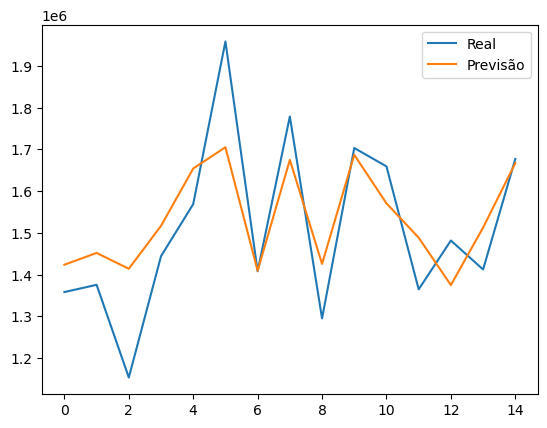

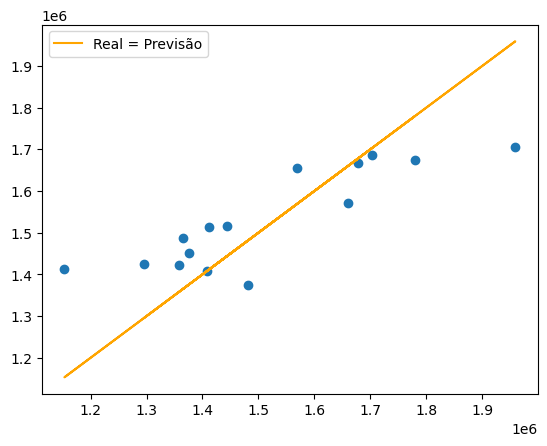

In [405]:
gasoleo_s_previsao = FA.predict(gasoleo_e_teste) #testar o modelo
plt.plot(gasoleo_s_teste, label='Real')
plt.plot(gasoleo_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(gasoleo_s_teste, gasoleo_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(gasoleo_s_teste, gasoleo_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [406]:
MAE = metrics.mean_absolute_error(gasoleo_s_teste, gasoleo_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(gasoleo_s_teste - gasoleo_s_previsao)
MSE = metrics.mean_squared_error(gasoleo_s_teste, gasoleo_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(gasoleo_s_teste, gasoleo_s_previsao))
cvRMSE = RMSE / np.mean(gasoleo_s_teste)
NMBE = MBE / np.mean(gasoleo_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['FA'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,173982.464493,-15549.405094,4.170835e+10,204226.211424,0.135311,-0.010302
FA,99804.953282,-22536.696918,1.520668e+10,123315.348877,0.081703,-0.014932


#### 4.1.1.4. Perceptron Multicamadas

Utiliza o conceito de neural networks, isto é, entre a camada de entrada e saída existem camadas ocultas que aplicam transformações às variáveis.

In [407]:
PM = MLPRegressor(hidden_layer_sizes=(5,5,5)) #criar modelo
PM.fit(gasoleo_e_treino, gasoleo_s_treino) #treinar o modelo

C:\Users\mafal\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


MLPRegressor(hidden_layer_sizes=(5, 5, 5))

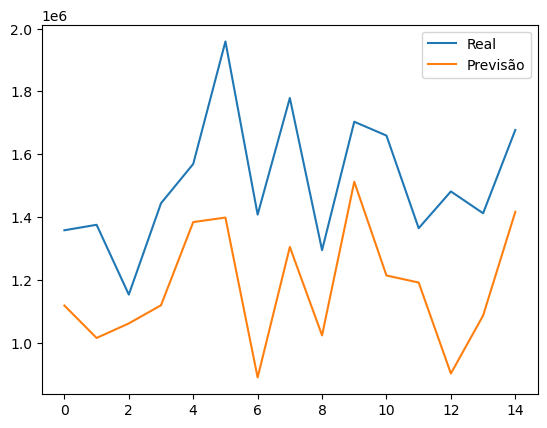

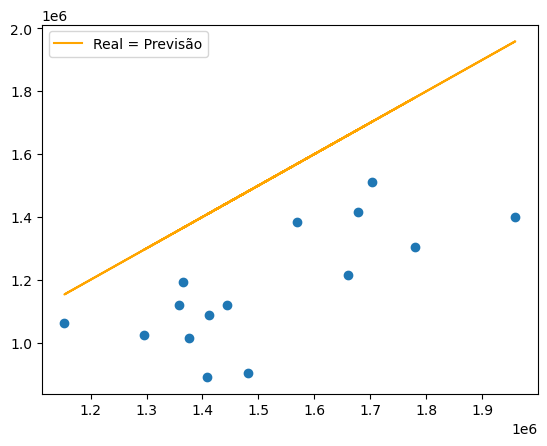

In [408]:
gasoleo_s_previsao = PM.predict(gasoleo_e_teste) #testar o modelo
plt.plot(gasoleo_s_teste, label='Real')
plt.plot(gasoleo_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(gasoleo_s_teste, gasoleo_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(gasoleo_s_teste, gasoleo_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [409]:
MAE = metrics.mean_absolute_error(gasoleo_s_teste, gasoleo_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(gasoleo_s_teste - gasoleo_s_previsao)
MSE = metrics.mean_squared_error(gasoleo_s_teste, gasoleo_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(gasoleo_s_teste, gasoleo_s_previsao))
cvRMSE = RMSE / np.mean(gasoleo_s_teste)
NMBE = MBE / np.mean(gasoleo_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['PM'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,173982.464493,-15549.405094,4.170835e+10,204226.211424,0.135311,-0.010302
FA,99804.953282,-22536.696918,1.520668e+10,123315.348877,0.081703,-0.014932
PM,333446.043061,333446.043061,1.327993e+11,364416.397324,0.241447,0.220927


#### 4.1.1.5. Guardar Modelo

Com base nos valores obtidos para a performance do modelo, foi selecionado o que apresentou valores mais baixos (menores erros), correspondendo ao Regressor da Floresta Aleatória.

In [411]:
with open('santa_maria_gasoleo.pkl','wb') as file: #guardar o modelo
    pickle.dump(FA, file)

### 4.1.2. Eólica

In [428]:
colunas_nomes = ['MAE', 'MBE', 'MSE', 'RMSE', 'cvRMSE', 'NMBE'] #definir nome das colunas
performance = pd.DataFrame(columns=colunas_nomes) #criar dataframe no qual vamos guardar os parâmetros que avaliam a performance para posteriormente comparar

#### 4.1.2.1. Preparação dos Dados

In [453]:
eolica = santa_maria.drop(['Gasóleo', 'Fotovoltaica', 'Total', 'Gasóleo-1', 'Fotovoltaica-1', 'Total-1'], axis=1)  #eliminar as colunas que não se vão usar
eolica_saida = eolica.values[:,4]
eolica_entradas = eolica.values[:,[0,1,2,3,5]]
eolica_e_treino, eolica_e_teste, eolica_s_treino, eolica_s_teste = train_test_split(eolica_entradas,eolica_saida) #definir dados para treino (75%) e para teste (25%)

#### 4.1.2.2. Autoregressão

In [454]:
AR = AutoReg(eolica_s_treino, lags=1)
AR_fit = AR.fit()

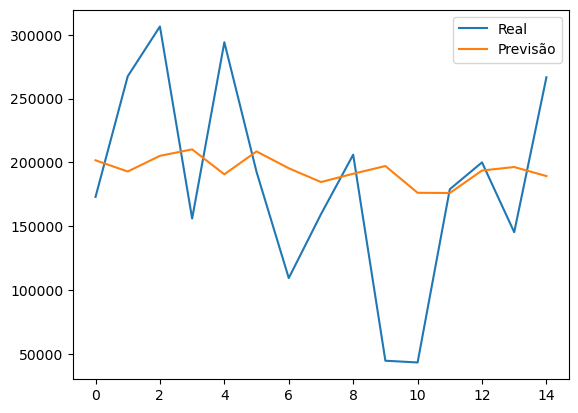

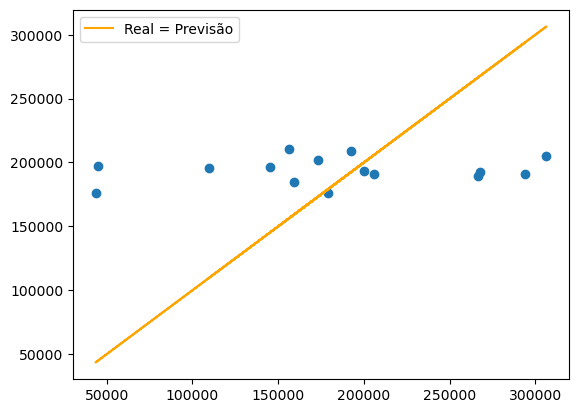

In [455]:
coeficiente = AR_fit.params #encontrar os parâmetros do modelo
passado = eolica_s_treino[len(eolica_s_treino)-1:]
passado = [passado[i] for i in range(len(passado))]
eolica_s_previsao = list() #definir lista no qual se vai guardar os valores previstos
for j in range(len(eolica_s_teste)):
    comprimento = len(passado)
    passo = [passado[i] for i in range(comprimento-1,comprimento)]
    valor = coeficiente[0]
    for k in range(1):
        valor += coeficiente[k+1] * passo[k]
    observado = eolica_s_teste[j]
    eolica_s_previsao.append(valor)
    passado.append(observado)
plt.plot(eolica_s_teste, label='Real') #desenhar os resultados
plt.plot(eolica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(eolica_s_teste, eolica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(eolica_s_teste, eolica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [456]:
MAE = metrics.mean_absolute_error(eolica_s_teste, eolica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(eolica_s_teste - eolica_s_previsao)
MSE = metrics.mean_squared_error(eolica_s_teste, eolica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(eolica_s_teste, eolica_s_previsao))
cvRMSE = RMSE / np.mean(eolica_s_teste)
NMBE = MBE / np.mean(eolica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
for coluna, valor in zip(colunas_nomes, valores):
    performance[coluna] = [valor]
performance.index = ['A'] #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,61819.101881,-11033.909529,5.886811e+09,76725.555987,0.419351,-0.060307


#### 4.1.2.3. Floresta Aleatória

In [457]:
FA = RandomForestRegressor(min_samples_leaf=5) #criar modelo
FA.fit(eolica_e_treino, eolica_s_treino) #treinar o modelo

RandomForestRegressor(min_samples_leaf=5)

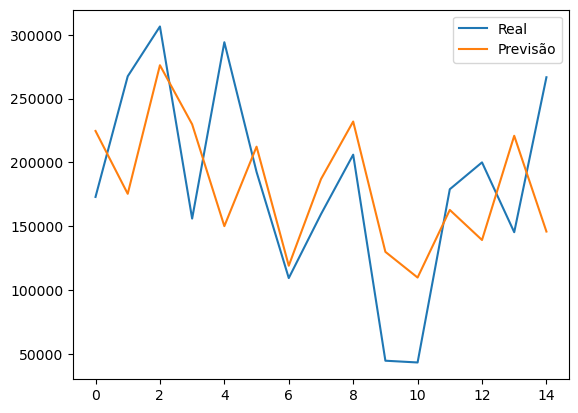

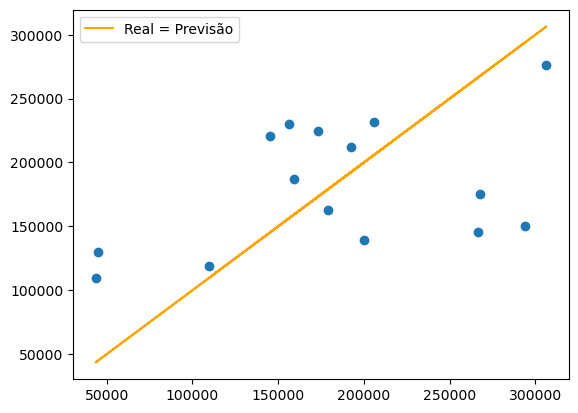

In [458]:
eolica_s_previsao = FA.predict(eolica_e_teste) #testar o modelo
plt.plot(eolica_s_teste, label='Real')
plt.plot(eolica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(eolica_s_teste, eolica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(eolica_s_teste, eolica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [459]:
MAE = metrics.mean_absolute_error(eolica_s_teste, eolica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(eolica_s_teste - eolica_s_previsao)
MSE = metrics.mean_squared_error(eolica_s_teste, eolica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(eolica_s_teste, eolica_s_previsao))
cvRMSE = RMSE / np.mean(eolica_s_teste)
NMBE = MBE / np.mean(eolica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['FA'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,61819.101881,-11033.909529,5.886811e+09,76725.555987,0.419351,-0.060307
FA,59978.832404,1902.547072,5.072228e+09,71219.573397,0.389258,0.010399


#### 4.1.2.3. Perceptron Multicamadas

In [460]:
PM = MLPRegressor(hidden_layer_sizes=(5,5,5)) #criar modelo
PM.fit(eolica_e_treino, eolica_s_treino) #treinar o modelo

C:\Users\mafal\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


MLPRegressor(hidden_layer_sizes=(5, 5, 5))

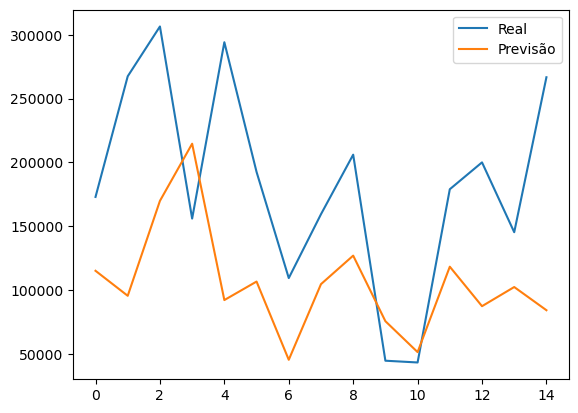

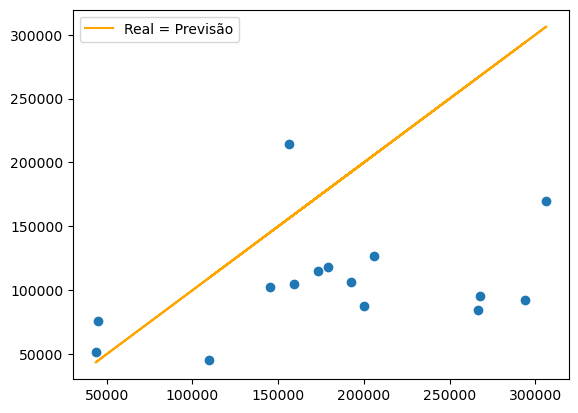

In [461]:
eolica_s_previsao = PM.predict(eolica_e_teste) #testar o modelo
plt.plot(eolica_s_teste, label='Real')
plt.plot(eolica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(eolica_s_teste, eolica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(eolica_s_teste, eolica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [462]:
MAE = metrics.mean_absolute_error(eolica_s_teste, eolica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(eolica_s_teste - eolica_s_previsao)
MSE = metrics.mean_squared_error(eolica_s_teste, eolica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(eolica_s_teste, eolica_s_previsao))
cvRMSE = RMSE / np.mean(eolica_s_teste)
NMBE = MBE / np.mean(eolica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['PM'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,61819.101881,-11033.909529,5.886811e+09,76725.555987,0.419351,-0.060307
FA,59978.832404,1902.547072,5.072228e+09,71219.573397,0.389258,0.010399
PM,89859.398132,76834.594009,1.125947e+10,106110.669223,0.579959,0.419947


#### 4.1.2.5. Guardar Modelo

Com base nos valores obtidos para a performance do modelo, foi selecionado o que apresentou valores mais baixos (menores erros), correspondendo ao Regressor da Floresta Aleatória.

In [463]:
with open('santa_maria_eolica.pkl','wb') as file: #guardar o modelo
    pickle.dump(FA, file)

### 4.1.3. Fotovoltaica

In [1007]:
colunas_nomes = ['MAE', 'MBE', 'MSE', 'RMSE', 'cvRMSE', 'NMBE'] #definir nome das colunas
performance = pd.DataFrame(columns=colunas_nomes) #criar dataframe no qual vamos guardar os parâmetros que avaliam a performance para posteriormente comparar

#### 4.1.3.1. Preparação dos Dados

In [1008]:
fotovoltaica = santa_maria.drop(['Gasóleo', 'Eólica', 'Total', 'Gasóleo-1', 'Eólica-1', 'Total-1'], axis=1)  #eliminar as colunas que não se vão usar
fotovoltaica_saida = fotovoltaica.values[:,4]
fotovoltaica_entradas = fotovoltaica.values[:,[0,1,2,3,5]]
fotovoltaica_e_treino, fotovoltaica_e_teste, fotovoltaica_s_treino, fotovoltaica_s_teste = train_test_split(fotovoltaica_entradas,fotovoltaica_saida) #definir dados para treino (75%) e para teste (25%)

#### 4.1.3.2. Autoregressão

In [1009]:
AR = AutoReg(fotovoltaica_s_treino, lags=1)
AR_fit = AR.fit()

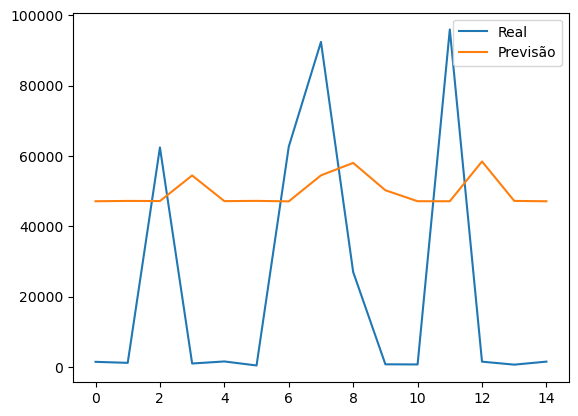

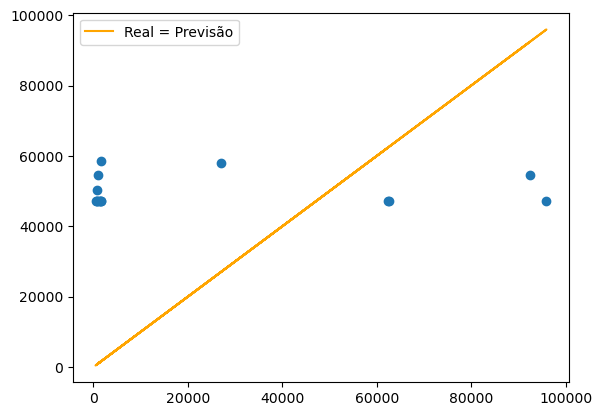

In [1010]:
coeficiente = AR_fit.params #encontrar os parâmetros do modelo
passado = fotovoltaica_s_treino[len(fotovoltaica_s_treino)-1:]
passado = [passado[i] for i in range(len(passado))]
fotovoltaica_s_previsao = list() #definir lista no qual se vai guardar os valores previstos
for j in range(len(fotovoltaica_s_teste)):
    comprimento = len(passado)
    passo = [passado[i] for i in range(comprimento-1,comprimento)]
    valor = coeficiente[0]
    for k in range(1):
        valor += coeficiente[k+1] * passo[k]
    observado = fotovoltaica_s_teste[j]
    fotovoltaica_s_previsao.append(valor)
    passado.append(observado)
plt.plot(fotovoltaica_s_teste, label='Real') #desenhar os resultados
plt.plot(fotovoltaica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(fotovoltaica_s_teste, fotovoltaica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(fotovoltaica_s_teste, fotovoltaica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [1011]:
MAE = metrics.mean_absolute_error(fotovoltaica_s_teste, fotovoltaica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(fotovoltaica_s_teste - fotovoltaica_s_previsao)
MSE = metrics.mean_squared_error(fotovoltaica_s_teste, fotovoltaica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(fotovoltaica_s_teste, fotovoltaica_s_previsao))
cvRMSE = RMSE / np.mean(fotovoltaica_s_teste)
NMBE = MBE / np.mean(fotovoltaica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
for coluna, valor in zip(colunas_nomes, valores):
    performance[coluna] = [valor]
performance.index = ['A'] #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,42058.462614,-26387.502664,1.910672e+09,43711.237758,1.866513,-1.126772


#### 4.1.3.3. Floresta Aleatória

In [1012]:
FA = RandomForestRegressor(min_samples_leaf=5) #criar modelo
FA.fit(fotovoltaica_e_treino, fotovoltaica_s_treino) #treinar o modelo

RandomForestRegressor(min_samples_leaf=5)

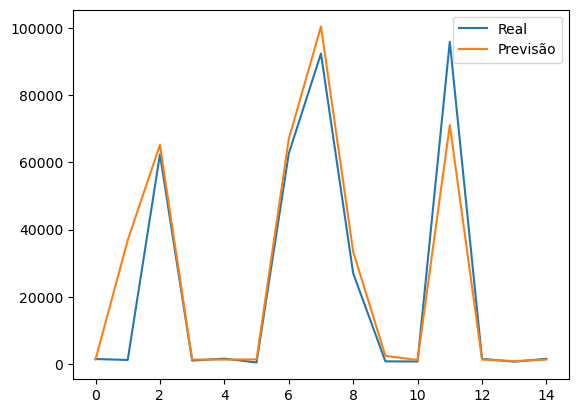

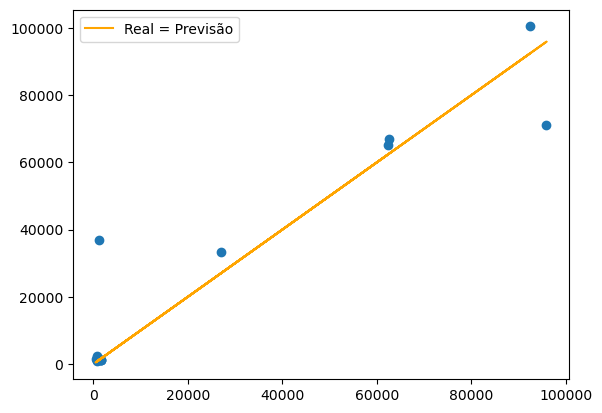

In [1013]:
fotovoltaica_s_previsao = FA.predict(fotovoltaica_e_teste) #testar o modelo
plt.plot(fotovoltaica_s_teste, label='Real') #desenhar os resultados
plt.plot(fotovoltaica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(fotovoltaica_s_teste, fotovoltaica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(fotovoltaica_s_teste, fotovoltaica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [1014]:
MAE = metrics.mean_absolute_error(fotovoltaica_s_teste, fotovoltaica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(fotovoltaica_s_teste - fotovoltaica_s_previsao)
MSE = metrics.mean_squared_error(fotovoltaica_s_teste, fotovoltaica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(fotovoltaica_s_teste, fotovoltaica_s_previsao))
cvRMSE = RMSE / np.mean(fotovoltaica_s_teste)
NMBE = MBE / np.mean(fotovoltaica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['FA'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,42058.462614,-26387.502664,1.910672e+09,43711.237758,1.866513,-1.126772
FA,5766.453812,-2338.893829,1.350643e+08,11621.716015,0.496259,-0.099873


#### 4.1.3.3. Perceptron Multicamadas

In [1015]:
PM = MLPRegressor(hidden_layer_sizes=(5,5,5)) #criar modelo
PM.fit(fotovoltaica_e_treino, fotovoltaica_s_treino) #treinar o modelo

C:\Users\mafal\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


MLPRegressor(hidden_layer_sizes=(5, 5, 5))

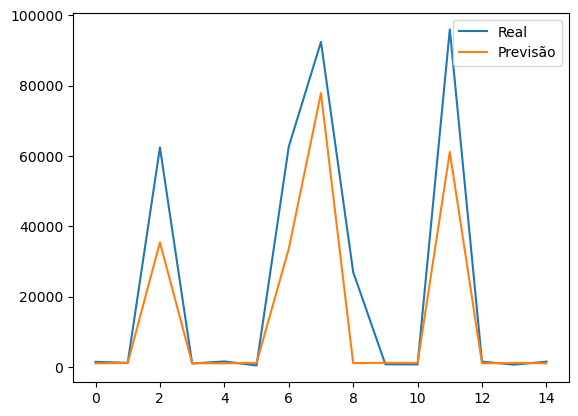

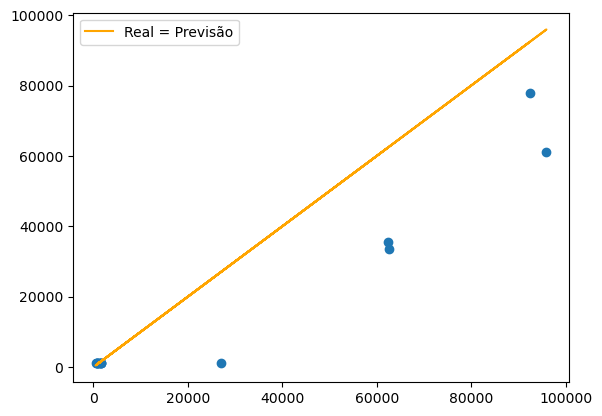

In [1016]:
fotovoltaica_s_previsao = PM.predict(fotovoltaica_e_teste) #testar o modelo
plt.plot(fotovoltaica_s_teste, label='Real') #desenhar os resultados
plt.plot(fotovoltaica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(fotovoltaica_s_teste, fotovoltaica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(fotovoltaica_s_teste, fotovoltaica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [1017]:
MAE = metrics.mean_absolute_error(fotovoltaica_s_teste, fotovoltaica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(fotovoltaica_s_teste - fotovoltaica_s_previsao)
MSE = metrics.mean_squared_error(fotovoltaica_s_teste, fotovoltaica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(fotovoltaica_s_teste, fotovoltaica_s_previsao))
cvRMSE = RMSE / np.mean(fotovoltaica_s_teste)
NMBE = MBE / np.mean(fotovoltaica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['PM'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,42058.462614,-26387.502664,1.910672e+09,43711.237758,1.866513,-1.126772
FA,5766.453812,-2338.893829,1.350643e+08,11621.716015,0.496259,-0.099873
PM,9026.698394,8735.268398,2.445496e+08,15638.080837,0.667761,0.373005


#### 4.1.3.5. Guardar Modelo

Com base nos valores obtidos para a performance do modelo, foi selecionado o que apresentou valores mais baixos (menores erros), correspondendo ao Regressor da Floresta Aleatória.

In [1018]:
with open('santa_maria_fotovoltaica.pkl','wb') as file: #guardar o modelo
    pickle.dump(FA, file)

### 4.2. São Miguel

### 4.2.1. Fuelóleo

In [514]:
colunas_nomes = ['MAE', 'MBE', 'MSE', 'RMSE', 'cvRMSE', 'NMBE'] #definir nome das colunas
performance = pd.DataFrame(columns=colunas_nomes) #criar dataframe no qual vamos guardar os parâmetros que avaliam a performance para posteriormente comparar

#### 4.2.1.1. Preparação dos Dados

In [515]:
fueloleo = sao_miguel.drop(['Gasóleo', 'Hídrica', 'Geotérmica', 'Eólica', 'Fotovoltaica', 'Outras Renováveis', 'Total', 'Gasóleo-1', 'Hídrica-1', 'Geotérmica-1', 'Eólica-1', 'Fotovoltaica-1', 'Outras Renováveis-1', 'Total-1'], axis=1)  #eliminar as colunas que não se vão usar
fueloleo_saida = fueloleo.values[:,4]
fueloleo_entradas = fueloleo.values[:,[0,1,2,3,5]]
fueloleo_e_treino, fueloleo_e_teste, fueloleo_s_treino, fueloleo_s_teste = train_test_split(fueloleo_entradas,fueloleo_saida) #definir dados para treino (75%) e para teste (25%)

#### 4.2.1.2. Autoregressão

In [516]:
AR = AutoReg(fueloleo_s_treino, lags=1)
AR_fit = AR.fit()

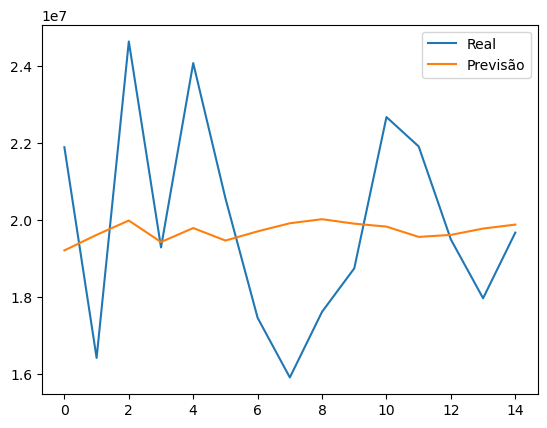

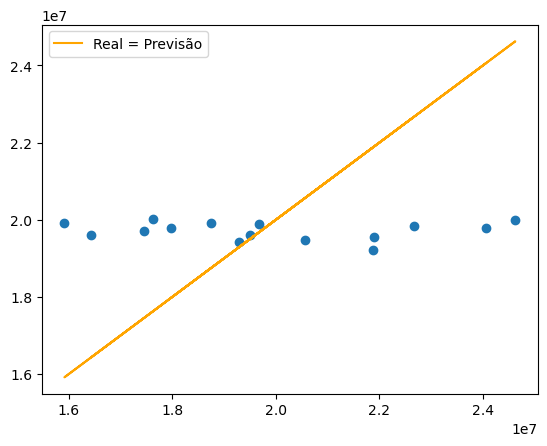

In [517]:
coeficiente = AR_fit.params #encontrar os parâmetros do modelo
passado = fueloleo_s_treino[len(fueloleo_s_treino)-1:]
passado = [passado[i] for i in range(len(passado))]
fueloleo_s_previsao = list() #definir lista no qual se vai guardar os valores previstos
for j in range(len(fueloleo_s_teste)):
    comprimento = len(passado)
    passo = [passado[i] for i in range(comprimento-1,comprimento)]
    valor = coeficiente[0]
    for k in range(1):
        valor += coeficiente[k+1] * passo[k]
    observado = fueloleo_s_teste[j]
    fueloleo_s_previsao.append(valor)
    passado.append(observado)
plt.plot(fueloleo_s_teste, label='Real') #desenhar os resultados
plt.plot(fueloleo_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(fueloleo_s_teste, fueloleo_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(fueloleo_s_teste, fueloleo_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [518]:
MAE = metrics.mean_absolute_error(fueloleo_s_teste, fueloleo_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(fueloleo_s_teste - fueloleo_s_previsao)
MSE = metrics.mean_squared_error(fueloleo_s_teste, fueloleo_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(fueloleo_s_teste, fueloleo_s_previsao))
cvRMSE = RMSE / np.mean(fueloleo_s_teste)
NMBE = MBE / np.mean(fueloleo_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
for coluna, valor in zip(colunas_nomes, valores):
    performance[coluna] = [valor]
performance.index = ['A'] #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,2.210048e+06,174210.589026,6.898646e+12,2.626527e+06,0.132086,0.008761


#### 4.2.1.3. Floresta Aleatória

In [519]:
FA = RandomForestRegressor(min_samples_leaf=5) #criar modelo
FA.fit(fueloleo_e_treino, fueloleo_s_treino) #treinar o modelo

RandomForestRegressor(min_samples_leaf=5)

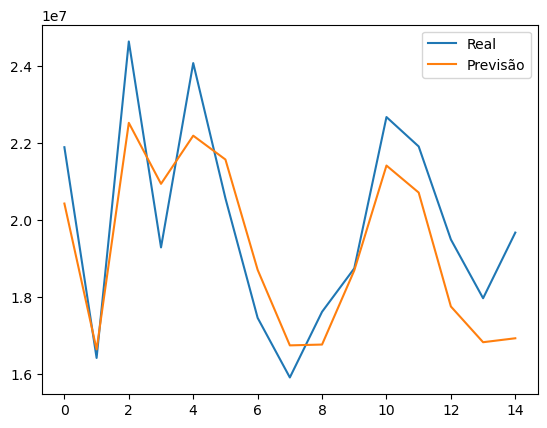

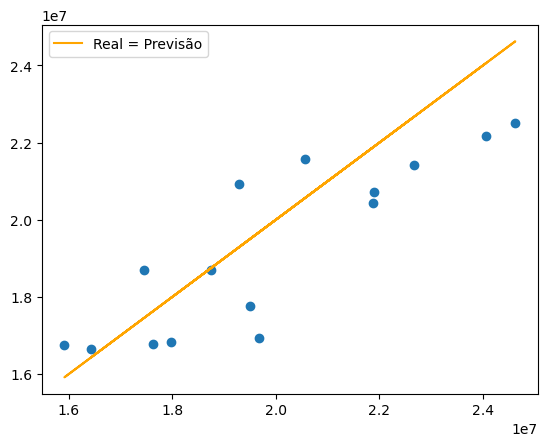

In [520]:
fueloleo_s_previsao = FA.predict(fueloleo_e_teste) #testar o modelo
plt.plot(fueloleo_s_teste, label='Real') #desenhar os resultados
plt.plot(fueloleo_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(fueloleo_s_teste, fueloleo_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(fueloleo_s_teste, fueloleo_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [521]:
MAE = metrics.mean_absolute_error(fueloleo_s_teste, fueloleo_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(fueloleo_s_teste - fueloleo_s_previsao)
MSE = metrics.mean_squared_error(fueloleo_s_teste, fueloleo_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(fueloleo_s_teste, fueloleo_s_previsao))
cvRMSE = RMSE / np.mean(fueloleo_s_teste)
NMBE = MBE / np.mean(fueloleo_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['FA'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,2.210048e+06,174210.589026,6.898646e+12,2.626527e+06,0.132086,0.008761
FA,1.292177e+06,631768.531788,2.114808e+12,1.454238e+06,0.073133,0.031771


#### 4.2.1.4. Perceptron Multicamadas

In [522]:
PM = MLPRegressor(hidden_layer_sizes=(5,5,5)) #criar modelo
PM.fit(fueloleo_e_treino, fueloleo_s_treino) #treinar o modelo

C:\Users\mafal\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


MLPRegressor(hidden_layer_sizes=(5, 5, 5))

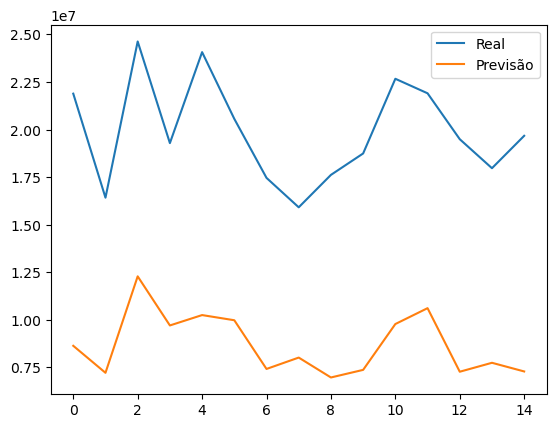

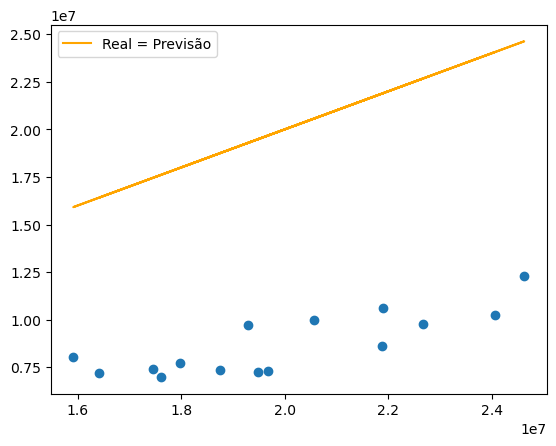

In [523]:
fueloleo_s_previsao = PM.predict(fueloleo_e_teste) #testar o modelo
plt.plot(fueloleo_s_teste, label='Real') #desenhar os resultados
plt.plot(fueloleo_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(fueloleo_s_teste, fueloleo_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(fueloleo_s_teste, fueloleo_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [524]:
MAE = metrics.mean_absolute_error(fueloleo_s_teste, fueloleo_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(fueloleo_s_teste - fueloleo_s_previsao)
MSE = metrics.mean_squared_error(fueloleo_s_teste, fueloleo_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(fueloleo_s_teste, fueloleo_s_previsao))
cvRMSE = RMSE / np.mean(fueloleo_s_teste)
NMBE = MBE / np.mean(fueloleo_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['PM'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,2.210048e+06,1.742106e+05,6.898646e+12,2.626527e+06,0.132086,0.008761
FA,1.292177e+06,6.317685e+05,2.114808e+12,1.454238e+06,0.073133,0.031771
PM,1.118230e+07,1.118230e+07,1.275888e+14,1.129552e+07,0.568043,0.562349


#### 4.2.1.5. Guardar Modelo

Com base nos valores obtidos para a performance do modelo, foi selecionado o que apresentou valores mais baixos (menores erros), correspondendo ao Regressor da Floresta Aleatória.

In [525]:
with open('sao_miguel_fueloleo.pkl','wb') as file: #guardar o modelo
    pickle.dump(FA, file)

### 4.2.2. Gasóleo

In [560]:
colunas_nomes = ['MAE', 'MBE', 'MSE', 'RMSE', 'cvRMSE', 'NMBE'] #definir nome das colunas
performance = pd.DataFrame(columns=colunas_nomes) #criar dataframe no qual vamos guardar os parâmetros que avaliam a performance para posteriormente comparar

#### 4.2.2.1. Preparação dos Dados

In [561]:
gasoleo = sao_miguel.drop(['Fuelóleo', 'Hídrica', 'Geotérmica', 'Eólica', 'Fotovoltaica', 'Outras Renováveis', 'Total', 'Fuelóleo-1', 'Hídrica-1', 'Geotérmica-1', 'Eólica-1', 'Fotovoltaica-1', 'Outras Renováveis-1', 'Total-1'], axis=1)  #eliminar as colunas que não se vão usar
gasoleo_saida = gasoleo.values[:,4]
gasoleo_entradas = gasoleo.values[:,[0,1,2,3,5]]
gasoleo_e_treino, gasoleo_e_teste, gasoleo_s_treino, gasoleo_s_teste = train_test_split(gasoleo_entradas,gasoleo_saida) #definir dados para treino (75%) e para teste (25%)

#### 4.2.2.2. Autoregressão

In [562]:
AR = AutoReg(gasoleo_s_treino, lags=1)
AR_fit = AR.fit()

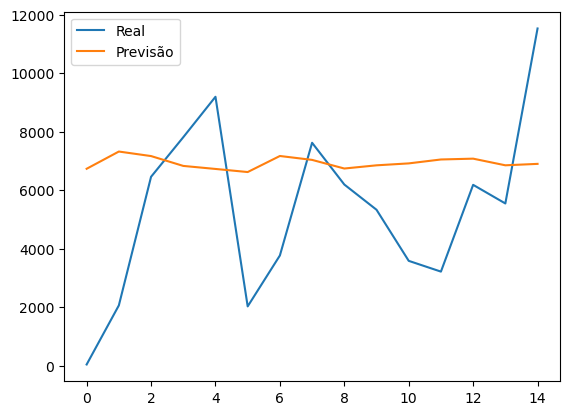

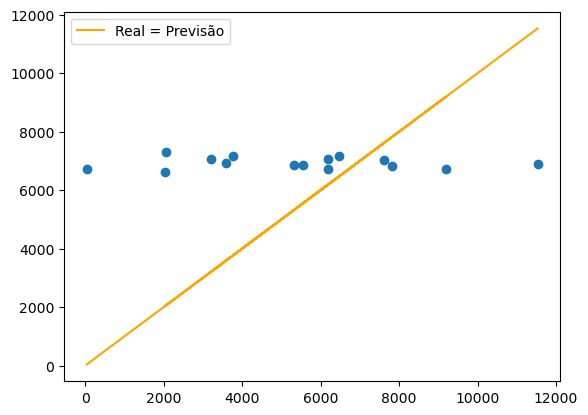

In [563]:
coeficiente = AR_fit.params #encontrar os parâmetros do modelo
passado = gasoleo_s_treino[len(gasoleo_s_treino)-1:]
passado = [passado[i] for i in range(len(passado))]
gasoleo_s_previsao = list() #definir lista no qual se vai guardar os valores previstos
for j in range(len(gasoleo_s_teste)):
    comprimento = len(passado)
    passo = [passado[i] for i in range(comprimento-1,comprimento)]
    valor = coeficiente[0]
    for k in range(1):
        valor += coeficiente[k+1] * passo[k]
    observado = gasoleo_s_teste[j]
    gasoleo_s_previsao.append(valor)
    passado.append(observado)
plt.plot(gasoleo_s_teste, label='Real') #desenhar os resultados
plt.plot(gasoleo_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(gasoleo_s_teste, gasoleo_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(gasoleo_s_teste, gasoleo_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [564]:
MAE = metrics.mean_absolute_error(gasoleo_s_teste, gasoleo_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(gasoleo_s_teste - gasoleo_s_previsao)
MSE = metrics.mean_squared_error(gasoleo_s_teste, gasoleo_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(gasoleo_s_teste, gasoleo_s_previsao))
cvRMSE = RMSE / np.mean(gasoleo_s_teste)
NMBE = MBE / np.mean(gasoleo_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
for coluna, valor in zip(colunas_nomes, valores):
    performance[coluna] = [valor]
performance.index = ['A'] #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,2716.697717,-1561.617332,1.102360e+07,3320.180763,0.618291,-0.290808


#### 4.2.2.3. Floresta Aleatória

In [565]:
FA = RandomForestRegressor(min_samples_leaf=5) #criar modelo
FA.fit(gasoleo_e_treino, gasoleo_s_treino) #treinar o modelo

RandomForestRegressor(min_samples_leaf=5)

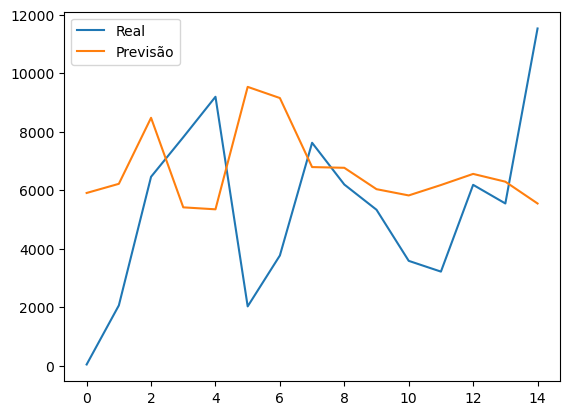

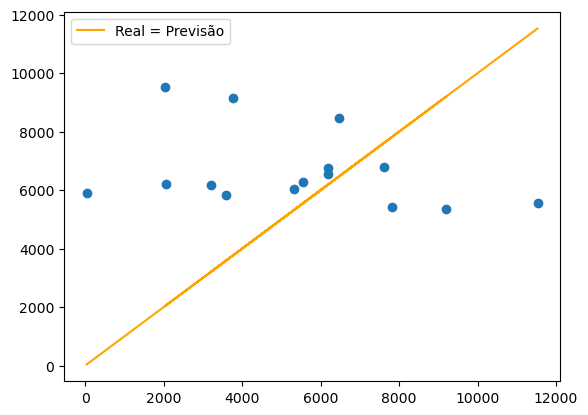

In [566]:
gasoleo_s_previsao = FA.predict(gasoleo_e_teste) #testar o modelo
plt.plot(gasoleo_s_teste, label='Real')
plt.plot(gasoleo_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(gasoleo_s_teste, gasoleo_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(gasoleo_s_teste, gasoleo_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [567]:
MAE = metrics.mean_absolute_error(gasoleo_s_teste, gasoleo_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(gasoleo_s_teste - gasoleo_s_previsao)
MSE = metrics.mean_squared_error(gasoleo_s_teste, gasoleo_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(gasoleo_s_teste, gasoleo_s_previsao))
cvRMSE = RMSE / np.mean(gasoleo_s_teste)
NMBE = MBE / np.mean(gasoleo_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['FA'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,2716.697717,-1561.617332,1.102360e+07,3320.180763,0.618291,-0.290808
FA,3038.525087,-1297.129641,1.422522e+07,3771.633318,0.702361,-0.241554


#### 4.2.2.4. Perceptron Multicamadas

In [568]:
PM = MLPRegressor(hidden_layer_sizes=(5,5,5)) #criar modelo
PM.fit(gasoleo_e_treino, gasoleo_s_treino) #treinar o modelo

MLPRegressor(hidden_layer_sizes=(5, 5, 5))

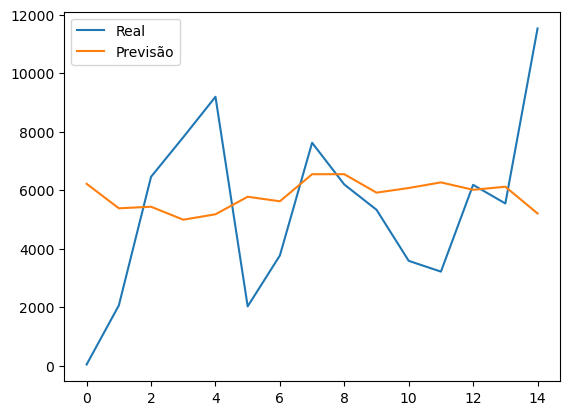

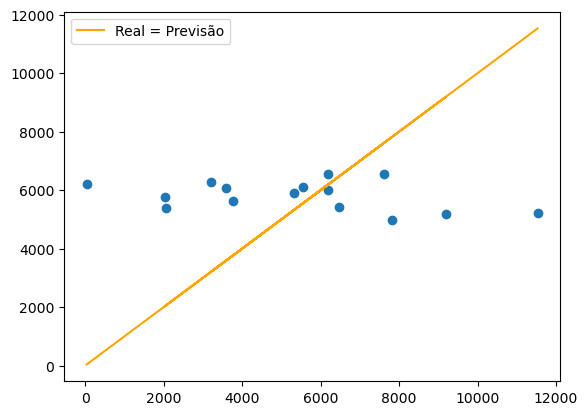

In [569]:
gasoleo_s_previsao = PM.predict(gasoleo_e_teste) #testar o modelo
plt.plot(gasoleo_s_teste, label='Real')
plt.plot(gasoleo_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(gasoleo_s_teste, gasoleo_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(gasoleo_s_teste, gasoleo_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [570]:
MAE = metrics.mean_absolute_error(gasoleo_s_teste, gasoleo_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(gasoleo_s_teste - gasoleo_s_previsao)
MSE = metrics.mean_squared_error(gasoleo_s_teste, gasoleo_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(gasoleo_s_teste, gasoleo_s_previsao))
cvRMSE = RMSE / np.mean(gasoleo_s_teste)
NMBE = MBE / np.mean(gasoleo_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['PM'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,2716.697717,-1561.617332,1.102360e+07,3320.180763,0.618291,-0.290808
FA,3038.525087,-1297.129641,1.422522e+07,3771.633318,0.702361,-0.241554
PM,2505.409835,-447.917964,9.952956e+06,3154.830594,0.587499,-0.083412


#### 4.2.2.5. Guardar Modelo

Com base nos valores obtidos para a performance do modelo, foi selecionado o que apresentou valores mais baixos (menores erros), correspondendo ao Regressor de Perceptron Multicamadas.

In [571]:
with open('sao_miguel_gasoleo.pkl','wb') as file: #guardar o modelo
    pickle.dump(PM, file)

### 4.2.3. Hídrica

In [604]:
colunas_nomes = ['MAE', 'MBE', 'MSE', 'RMSE', 'cvRMSE', 'NMBE'] #definir nome das colunas
performance = pd.DataFrame(columns=colunas_nomes) #criar dataframe no qual vamos guardar os parâmetros que avaliam a performance para posteriormente comparar

#### 4.2.3.1. Preparação dos Dados

In [605]:
hidrica = sao_miguel.drop(['Gasóleo', 'Fuelóleo', 'Geotérmica', 'Eólica', 'Fotovoltaica', 'Outras Renováveis', 'Total', 'Gasóleo-1', 'Fuelóleo-1', 'Geotérmica-1', 'Eólica-1', 'Fotovoltaica-1', 'Outras Renováveis-1', 'Total-1'], axis=1)  #eliminar as colunas que não se vão usar
hidrica_saida = hidrica.values[:,4]
hidrica_entradas = hidrica.values[:,[0,1,2,3,5]]
hidrica_e_treino, hidrica_e_teste, hidrica_s_treino, hidrica_s_teste = train_test_split(hidrica_entradas,hidrica_saida) #definir dados para treino (75%) e para teste (25%)

#### 4.2.3.2. Autoregressão

In [606]:
AR = AutoReg(hidrica_s_treino, lags=1)
AR_fit = AR.fit()

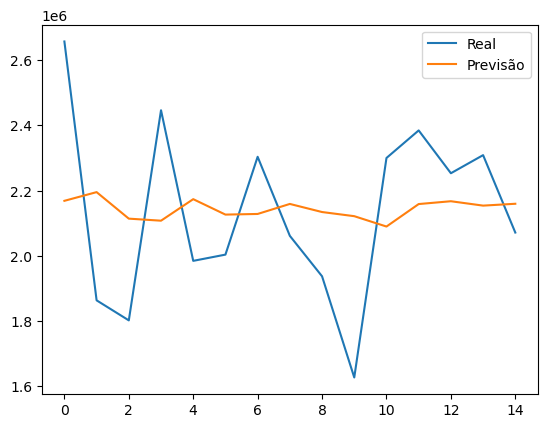

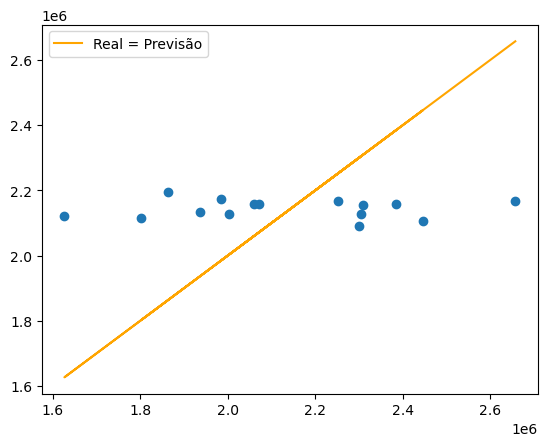

In [607]:
coeficiente = AR_fit.params #encontrar os parâmetros do modelo
passado = hidrica_s_treino[len(hidrica_s_treino)-1:]
passado = [passado[i] for i in range(len(passado))]
hidrica_s_previsao = list() #definir lista no qual se vai guardar os valores previstos
for j in range(len(hidrica_s_teste)):
    comprimento = len(passado)
    passo = [passado[i] for i in range(comprimento-1,comprimento)]
    valor = coeficiente[0]
    for k in range(1):
        valor += coeficiente[k+1] * passo[k]
    observado = hidrica_s_teste[j]
    hidrica_s_previsao.append(valor)
    passado.append(observado)
plt.plot(hidrica_s_teste, label='Real') #desenhar os resultados
plt.plot(hidrica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(hidrica_s_teste, hidrica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(hidrica_s_teste, hidrica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [608]:
MAE = metrics.mean_absolute_error(hidrica_s_teste, hidrica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(hidrica_s_teste - hidrica_s_previsao)
MSE = metrics.mean_squared_error(hidrica_s_teste, hidrica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(hidrica_s_teste, hidrica_s_previsao))
cvRMSE = RMSE / np.mean(hidrica_s_teste)
NMBE = MBE / np.mean(hidrica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
for coluna, valor in zip(colunas_nomes, valores):
    performance[coluna] = [valor]
performance.index = ['A'] #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,234172.895924,-10274.309249,7.131283e+10,267044.614239,0.125151,-0.004815


#### 4.2.3.3. Floresta Aleatória

In [609]:
FA = RandomForestRegressor(min_samples_leaf=5) #criar modelo
FA.fit(hidrica_e_treino, hidrica_s_treino) #treinar o modelo

RandomForestRegressor(min_samples_leaf=5)

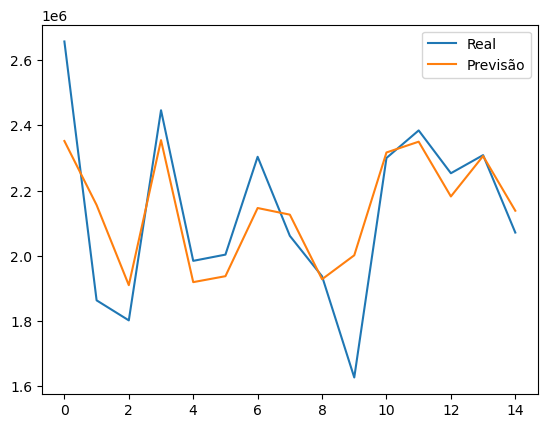

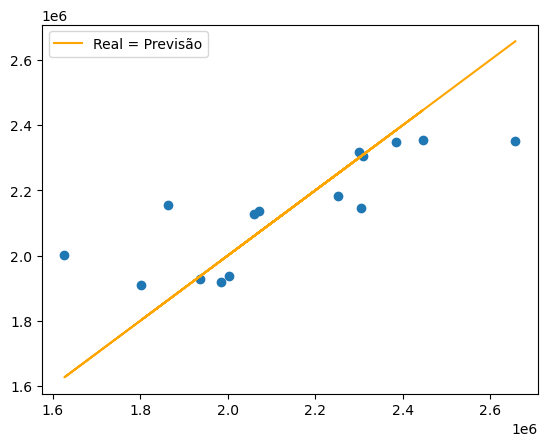

In [610]:
hidrica_s_previsao = FA.predict(hidrica_e_teste) #testar o modelo
plt.plot(hidrica_s_teste, label='Real') #desenhar os resultados
plt.plot(hidrica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(hidrica_s_teste, hidrica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(hidrica_s_teste, hidrica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [611]:
MAE = metrics.mean_absolute_error(hidrica_s_teste, hidrica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(hidrica_s_teste - hidrica_s_previsao)
MSE = metrics.mean_squared_error(hidrica_s_teste, hidrica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(hidrica_s_teste, hidrica_s_previsao))
cvRMSE = RMSE / np.mean(hidrica_s_teste)
NMBE = MBE / np.mean(hidrica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['FA'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,234172.895924,-10274.309249,7.131283e+10,267044.614239,0.125151,-0.004815
FA,115106.435314,-8057.755857,2.584438e+10,160761.860961,0.075341,-0.003776


#### 4.2.3.4. Perceptron Multicamadas

In [612]:
PM = MLPRegressor(hidden_layer_sizes=(5,5,5)) #criar modelo
PM.fit(hidrica_e_treino, hidrica_s_treino) #treinar o modelo

C:\Users\mafal\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


MLPRegressor(hidden_layer_sizes=(5, 5, 5))

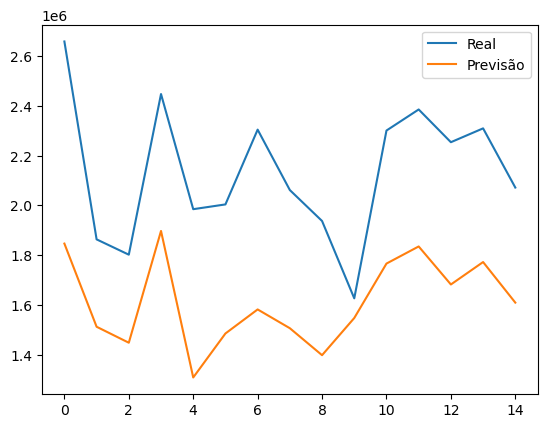

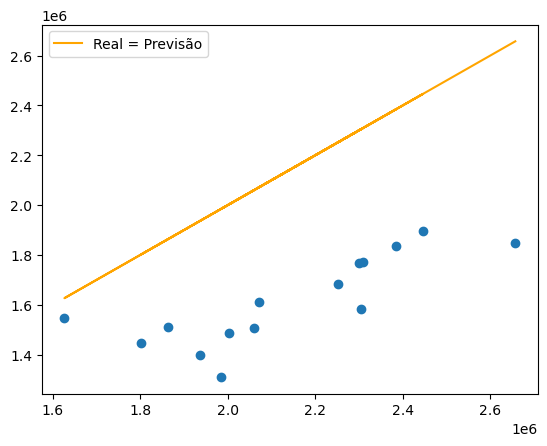

In [613]:
hidrica_s_previsao = PM.predict(hidrica_e_teste) #testar o modelo
plt.plot(hidrica_s_teste, label='Real') #desenhar os resultados
plt.plot(hidrica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(hidrica_s_teste, hidrica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(hidrica_s_teste, hidrica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [614]:
MAE = metrics.mean_absolute_error(hidrica_s_teste, hidrica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(hidrica_s_teste - hidrica_s_previsao)
MSE = metrics.mean_squared_error(hidrica_s_teste, hidrica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(hidrica_s_teste, hidrica_s_previsao))
cvRMSE = RMSE / np.mean(hidrica_s_teste)
NMBE = MBE / np.mean(hidrica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['PM'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,234172.895924,-10274.309249,7.131283e+10,267044.614239,0.125151,-0.004815
FA,115106.435314,-8057.755857,2.584438e+10,160761.860961,0.075341,-0.003776
PM,519996.100631,519996.100631,2.977159e+11,545633.507297,0.255712,0.243697


#### 4.2.3.5. Guardar Modelo

Com base nos valores obtidos para a performance do modelo, foi selecionado o que apresentou valores mais baixos (menores erros), correspondendo ao Regressor da Floresta Aleatória.

In [615]:
with open('sao_miguel_hidrica.pkl','wb') as file: #guardar o modelo
    pickle.dump(FA, file)

### 4.2.4. Geotérmica

In [630]:
colunas_nomes = ['MAE', 'MBE', 'MSE', 'RMSE', 'cvRMSE', 'NMBE'] #definir nome das colunas
performance = pd.DataFrame(columns=colunas_nomes) #criar dataframe no qual vamos guardar os parâmetros que avaliam a performance para posteriormente comparar

#### 4.2.4.1. Preparação dos Dados

In [631]:
geotermica = sao_miguel.drop(['Gasóleo', 'Fuelóleo', 'Hídrica', 'Eólica', 'Fotovoltaica', 'Outras Renováveis', 'Total', 'Gasóleo-1', 'Fuelóleo-1', 'Hídrica-1', 'Eólica-1', 'Fotovoltaica-1', 'Outras Renováveis-1', 'Total-1'], axis=1)  #eliminar as colunas que não se vão usar
geotermica_saida = geotermica.values[:,4]
geotermica_entradas = geotermica.values[:,[0,1,2,3,5]]
geotermica_e_treino, geotermica_e_teste, geotermica_s_treino, geotermica_s_teste = train_test_split(geotermica_entradas,geotermica_saida) #definir dados para treino (75%) e para teste (25%)

#### 4.2.4.2. Autoregressão

In [632]:
AR = AutoReg(geotermica_s_treino, lags=1)
AR_fit = AR.fit()

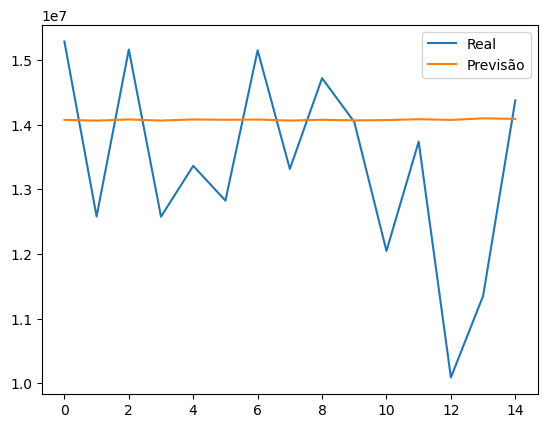

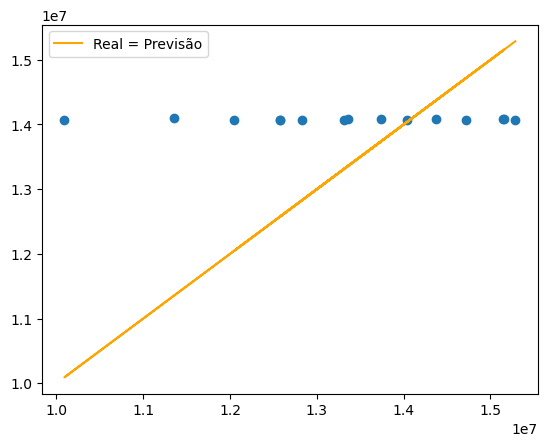

In [633]:
coeficiente = AR_fit.params #encontrar os parâmetros do modelo
passado = geotermica_s_treino[len(geotermica_s_treino)-1:]
passado = [passado[i] for i in range(len(passado))]
geotermica_s_previsao = list() #definir lista no qual se vai guardar os valores previstos
for j in range(len(geotermica_s_teste)):
    comprimento = len(passado)
    passo = [passado[i] for i in range(comprimento-1,comprimento)]
    valor = coeficiente[0]
    for k in range(1):
        valor += coeficiente[k+1] * passo[k]
    observado = geotermica_s_teste[j]
    geotermica_s_previsao.append(valor)
    passado.append(observado)
plt.plot(geotermica_s_teste, label='Real') #desenhar os resultados
plt.plot(geotermica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(geotermica_s_teste, geotermica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(geotermica_s_teste, geotermica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [634]:
MAE = metrics.mean_absolute_error(geotermica_s_teste, geotermica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(geotermica_s_teste - geotermica_s_previsao)
MSE = metrics.mean_squared_error(geotermica_s_teste, geotermica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(geotermica_s_teste, geotermica_s_previsao))
cvRMSE = RMSE / np.mean(geotermica_s_teste)
NMBE = MBE / np.mean(geotermica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
for coluna, valor in zip(colunas_nomes, valores):
    performance[coluna] = [valor]
performance.index = ['A'] #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,1.272869e+06,-700644.278739,2.594037e+12,1.610602e+06,0.120419,-0.052385


#### 4.2.4.3. Floresta Aleatória

In [635]:
FA = RandomForestRegressor(min_samples_leaf=5) #criar modelo
FA.fit(geotermica_e_treino, geotermica_s_treino) #treinar o modelo

RandomForestRegressor(min_samples_leaf=5)

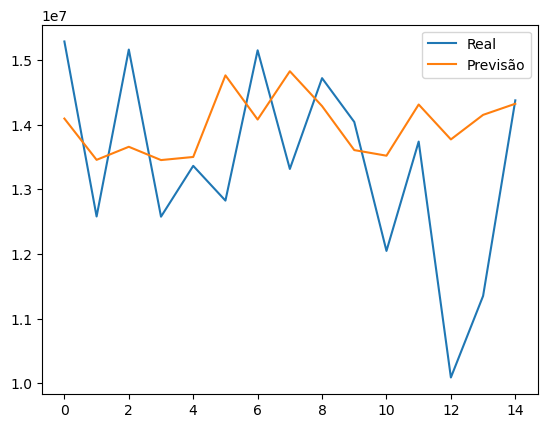

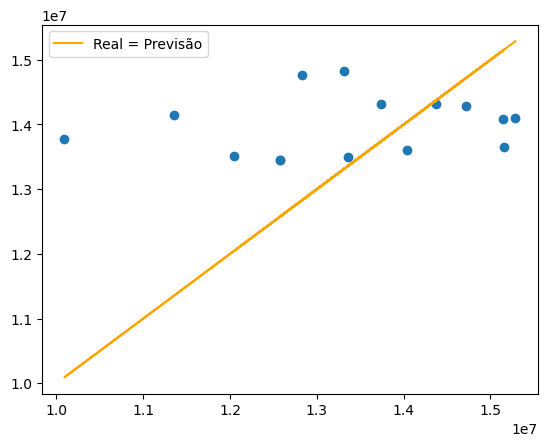

In [636]:
geotermica_s_previsao = FA.predict(geotermica_e_teste) #testar o modelo
plt.plot(geotermica_s_teste, label='Real') #desenhar os resultados
plt.plot(geotermica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(geotermica_s_teste, geotermica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(geotermica_s_teste, geotermica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [637]:
MAE = metrics.mean_absolute_error(geotermica_s_teste, geotermica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(geotermica_s_teste - geotermica_s_previsao)
MSE = metrics.mean_squared_error(geotermica_s_teste, geotermica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(geotermica_s_teste, geotermica_s_previsao))
cvRMSE = RMSE / np.mean(geotermica_s_teste)
NMBE = MBE / np.mean(geotermica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['FA'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,1.272869e+06,-700644.278739,2.594037e+12,1.610602e+06,0.120419,-0.052385
FA,1.236191e+06,-611631.512232,2.443765e+12,1.563255e+06,0.116879,-0.045729


#### 4.2.4.4. Perceptron Multicamadas

In [638]:
PM = MLPRegressor(hidden_layer_sizes=(5,5,5)) #criar modelo
PM.fit(geotermica_e_treino, geotermica_s_treino) #treinar o modelo

C:\Users\mafal\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


MLPRegressor(hidden_layer_sizes=(5, 5, 5))

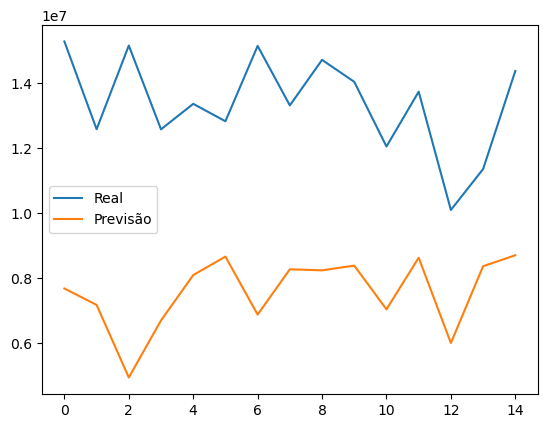

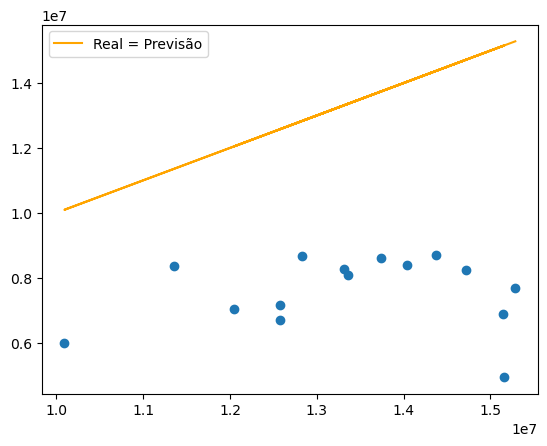

In [639]:
geotermica_s_previsao = PM.predict(geotermica_e_teste) #testar o modelo
plt.plot(geotermica_s_teste, label='Real') #desenhar os resultados
plt.plot(geotermica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(geotermica_s_teste, geotermica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(geotermica_s_teste, geotermica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [640]:
MAE = metrics.mean_absolute_error(geotermica_s_teste, geotermica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(geotermica_s_teste - geotermica_s_previsao)
MSE = metrics.mean_squared_error(geotermica_s_teste, geotermica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(geotermica_s_teste, geotermica_s_previsao))
cvRMSE = RMSE / np.mean(geotermica_s_teste)
NMBE = MBE / np.mean(geotermica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['PM'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,1.272869e+06,-7.006443e+05,2.594037e+12,1.610602e+06,0.120419,-0.052385
FA,1.236191e+06,-6.116315e+05,2.443765e+12,1.563255e+06,0.116879,-0.045729
PM,5.800933e+06,5.800933e+06,3.665703e+13,6.054505e+06,0.452673,0.433715


#### 4.2.4.5. Guardar Modelo

Com base nos valores obtidos para a performance do modelo, foi selecionado o que apresentou valores mais baixos (menores erros), correspondendo ao Regressor da Floresta Aleatória.

In [641]:
with open('sao_miguel_geotermica.pkl','wb') as file: #guardar o modelo
    pickle.dump(FA, file)

### 4.2.5. Eólica

In [642]:
colunas_nomes = ['MAE', 'MBE', 'MSE', 'RMSE', 'cvRMSE', 'NMBE'] #definir nome das colunas
performance = pd.DataFrame(columns=colunas_nomes) #criar dataframe no qual vamos guardar os parâmetros que avaliam a performance para posteriormente comparar

#### 4.2.5.1. Preparação dos Dados

In [643]:
eolica = sao_miguel.drop(['Gasóleo', 'Fuelóleo', 'Hídrica', 'Geotérmica', 'Fotovoltaica', 'Outras Renováveis', 'Total', 'Gasóleo-1', 'Fuelóleo-1', 'Hídrica-1', 'Geotérmica-1', 'Fotovoltaica-1', 'Outras Renováveis-1', 'Total-1'], axis=1)  #eliminar as colunas que não se vão usar
eolica_saida = eolica.values[:,4]
eolica_entradas = eolica.values[:,[0,1,2,3,5]]
eolica_e_treino, eolica_e_teste, eolica_s_treino, eolica_s_teste = train_test_split(eolica_entradas,eolica_saida) #definir dados para treino (75%) e para teste (25%)

#### 4.2.5.2. Autoregressão

In [645]:
AR = AutoReg(eolica_s_treino, lags=1)
AR_fit = AR.fit()

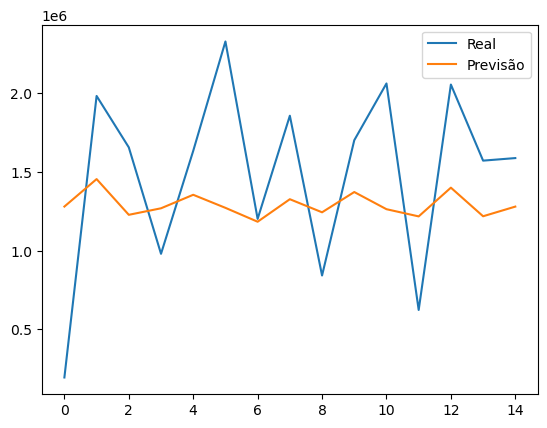

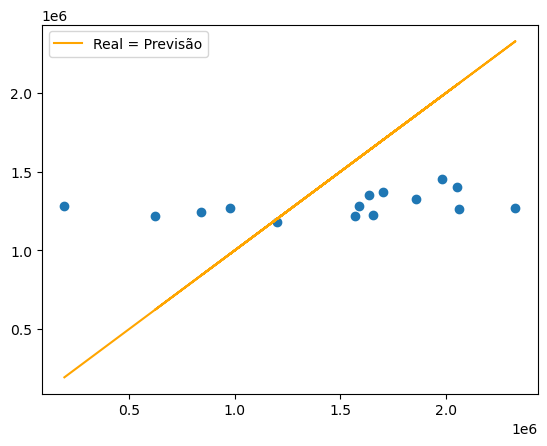

In [646]:
coeficiente = AR_fit.params #encontrar os parâmetros do modelo
passado = eolica_s_treino[len(eolica_s_treino)-1:]
passado = [passado[i] for i in range(len(passado))]
eolica_s_previsao = list() #definir lista no qual se vai guardar os valores previstos
for j in range(len(eolica_s_teste)):
    comprimento = len(passado)
    passo = [passado[i] for i in range(comprimento-1,comprimento)]
    valor = coeficiente[0]
    for k in range(1):
        valor += coeficiente[k+1] * passo[k]
    observado = eolica_s_teste[j]
    eolica_s_previsao.append(valor)
    passado.append(observado)
plt.plot(eolica_s_teste, label='Real') #desenhar os resultados
plt.plot(eolica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(eolica_s_teste, eolica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(eolica_s_teste, eolica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [647]:
MAE = metrics.mean_absolute_error(eolica_s_teste, eolica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(eolica_s_teste - eolica_s_previsao)
MSE = metrics.mean_squared_error(eolica_s_teste, eolica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(eolica_s_teste, eolica_s_previsao))
cvRMSE = RMSE / np.mean(eolica_s_teste)
NMBE = MBE / np.mean(eolica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
for coluna, valor in zip(colunas_nomes, valores):
    performance[coluna] = [valor]
performance.index = ['A'] #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,510649.389182,194389.793302,3.410706e+11,584012.509331,0.393364,0.130932


#### 4.2.5.3. Floresta Aleatória

In [648]:
FA = RandomForestRegressor(min_samples_leaf=5) #criar modelo
FA.fit(eolica_e_treino, eolica_s_treino) #treinar o modelo

RandomForestRegressor(min_samples_leaf=5)

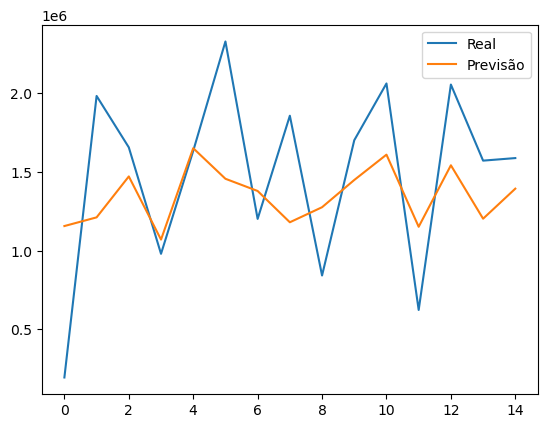

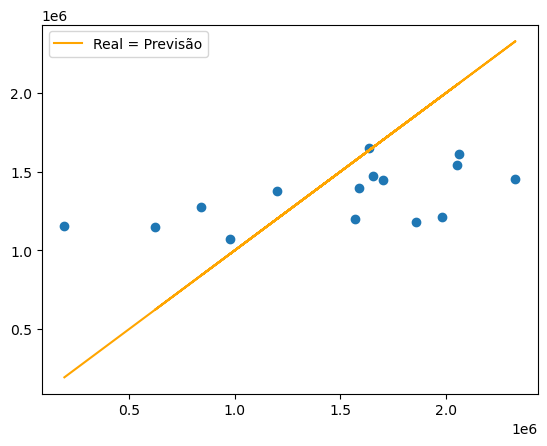

In [649]:
eolica_s_previsao = FA.predict(eolica_e_teste) #testar o modelo
plt.plot(eolica_s_teste, label='Real')
plt.plot(eolica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(eolica_s_teste, eolica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(eolica_s_teste, eolica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [650]:
MAE = metrics.mean_absolute_error(eolica_s_teste, eolica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(eolica_s_teste - eolica_s_previsao)
MSE = metrics.mean_squared_error(eolica_s_teste, eolica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(eolica_s_teste, eolica_s_previsao))
cvRMSE = RMSE / np.mean(eolica_s_teste)
NMBE = MBE / np.mean(eolica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['FA'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,510649.389182,194389.793302,3.410706e+11,584012.509331,0.393364,0.130932
FA,433164.522461,138519.400131,2.659559e+11,515709.132926,0.347358,0.093300


#### 4.2.5.4. Perceptron Multicamadas

In [651]:
PM = MLPRegressor(hidden_layer_sizes=(5,5,5)) #criar modelo
PM.fit(eolica_e_treino, eolica_s_treino) #treinar o modelo

C:\Users\mafal\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


MLPRegressor(hidden_layer_sizes=(5, 5, 5))

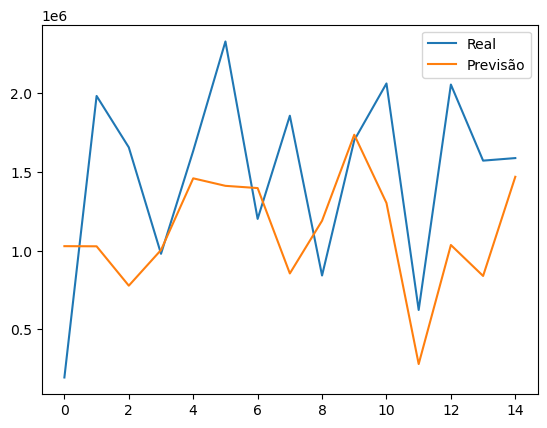

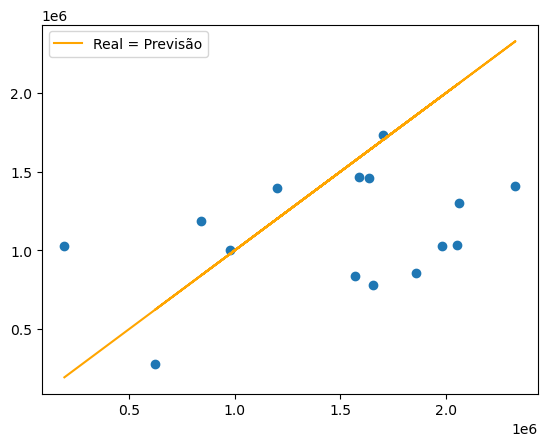

In [652]:
eolica_s_previsao = PM.predict(eolica_e_teste) #testar o modelo
plt.plot(eolica_s_teste, label='Real')
plt.plot(eolica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(eolica_s_teste, eolica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(eolica_s_teste, eolica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [653]:
MAE = metrics.mean_absolute_error(eolica_s_teste, eolica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(eolica_s_teste - eolica_s_previsao)
MSE = metrics.mean_squared_error(eolica_s_teste, eolica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(eolica_s_teste, eolica_s_previsao))
cvRMSE = RMSE / np.mean(eolica_s_teste)
NMBE = MBE / np.mean(eolica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['PM'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,510649.389182,194389.793302,3.410706e+11,584012.509331,0.393364,0.130932
FA,433164.522461,138519.400131,2.659559e+11,515709.132926,0.347358,0.093300
PM,556130.281068,364430.288735,4.471549e+11,668696.402165,0.450403,0.245463


#### 4.2.4.5. Guardar Modelo

Com base nos valores obtidos para a performance do modelo, foi selecionado o que apresentou valores mais baixos (menores erros), correspondendo ao Regressor da Floresta Aleatória.

In [654]:
with open('sao_miguel_eolica.pkl','wb') as file: #guardar o modelo
    pickle.dump(FA, file)

### 4.2.6. Fotovoltaica

In [667]:
colunas_nomes = ['MAE', 'MBE', 'MSE', 'RMSE', 'cvRMSE', 'NMBE'] #definir nome das colunas
performance = pd.DataFrame(columns=colunas_nomes) #criar dataframe no qual vamos guardar os parâmetros que avaliam a performance para posteriormente comparar

#### 4.2.6.1. Preparação dos Dados

In [668]:
fotovoltaica = sao_miguel.drop(['Gasóleo', 'Fuelóleo', 'Hídrica', 'Geotérmica', 'Eólica', 'Outras Renováveis', 'Total', 'Gasóleo-1', 'Fuelóleo-1', 'Hídrica-1', 'Geotérmica-1', 'Eólica-1', 'Outras Renováveis-1', 'Total-1'], axis=1)  #eliminar as colunas que não se vão usar
fotovoltaica_saida = fotovoltaica.values[:,4]
fotovoltaica_entradas = fotovoltaica.values[:,[0,1,2,3,5]]
fotovoltaica_e_treino, fotovoltaica_e_teste, fotovoltaica_s_treino, fotovoltaica_s_teste = train_test_split(fotovoltaica_entradas,fotovoltaica_saida) #definir dados para treino (75%) e para teste (25%)

#### 4.2.6.2. Autoregressão

In [669]:
AR = AutoReg(fotovoltaica_s_treino, lags=1)
AR_fit = AR.fit()

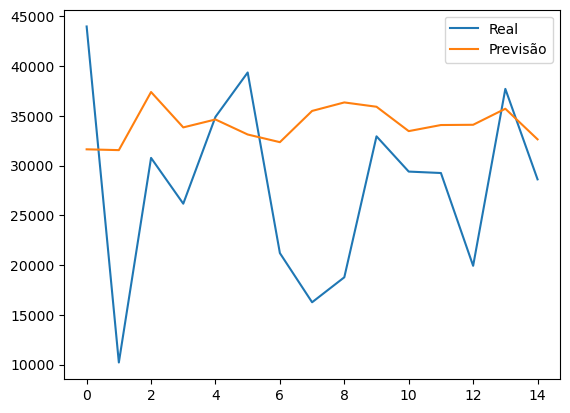

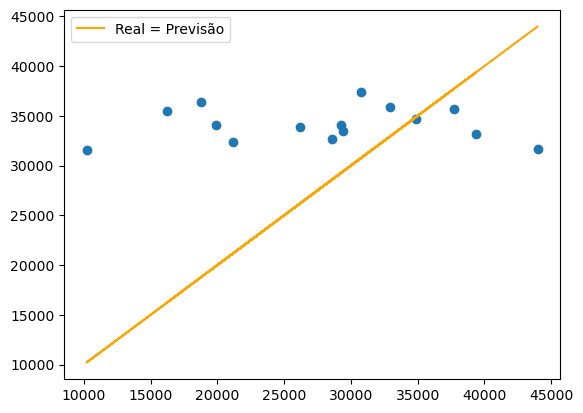

In [670]:
coeficiente = AR_fit.params #encontrar os parâmetros do modelo
passado = fotovoltaica_s_treino[len(fotovoltaica_s_treino)-1:]
passado = [passado[i] for i in range(len(passado))]
fotovoltaica_s_previsao = list() #definir lista no qual se vai guardar os valores previstos
for j in range(len(fotovoltaica_s_teste)):
    comprimento = len(passado)
    passo = [passado[i] for i in range(comprimento-1,comprimento)]
    valor = coeficiente[0]
    for k in range(1):
        valor += coeficiente[k+1] * passo[k]
    observado = fotovoltaica_s_teste[j]
    fotovoltaica_s_previsao.append(valor)
    passado.append(observado)
plt.plot(fotovoltaica_s_teste, label='Real') #desenhar os resultados
plt.plot(fotovoltaica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(fotovoltaica_s_teste, fotovoltaica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(fotovoltaica_s_teste, fotovoltaica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [671]:
MAE = metrics.mean_absolute_error(fotovoltaica_s_teste, fotovoltaica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(fotovoltaica_s_teste - fotovoltaica_s_previsao)
MSE = metrics.mean_squared_error(fotovoltaica_s_teste, fotovoltaica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(fotovoltaica_s_teste, fotovoltaica_s_previsao))
cvRMSE = RMSE / np.mean(fotovoltaica_s_teste)
NMBE = MBE / np.mean(fotovoltaica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
for coluna, valor in zip(colunas_nomes, valores):
    performance[coluna] = [valor]
performance.index = ['A'] #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,8962.201744,-6184.853147,1.213904e+08,11017.729773,0.393976,-0.22116


#### 4.2.6.3. Floresta Aleatória

In [672]:
FA = RandomForestRegressor(min_samples_leaf=5) #criar modelo
FA.fit(fotovoltaica_e_treino, fotovoltaica_s_treino) #treinar o modelo

RandomForestRegressor(min_samples_leaf=5)

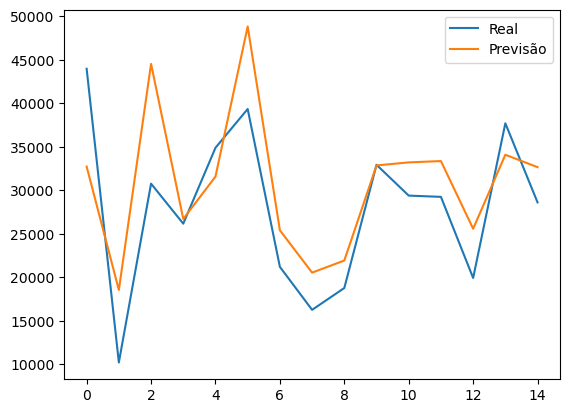

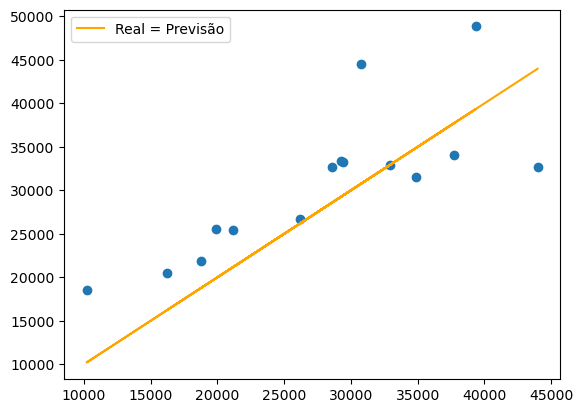

In [673]:
fotovoltaica_s_previsao = FA.predict(fotovoltaica_e_teste) #testar o modelo
plt.plot(fotovoltaica_s_teste, label='Real') #desenhar os resultados
plt.plot(fotovoltaica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(fotovoltaica_s_teste, fotovoltaica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(fotovoltaica_s_teste, fotovoltaica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [674]:
MAE = metrics.mean_absolute_error(fotovoltaica_s_teste, fotovoltaica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(fotovoltaica_s_teste - fotovoltaica_s_previsao)
MSE = metrics.mean_squared_error(fotovoltaica_s_teste, fotovoltaica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(fotovoltaica_s_teste, fotovoltaica_s_previsao))
cvRMSE = RMSE / np.mean(fotovoltaica_s_teste)
NMBE = MBE / np.mean(fotovoltaica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['FA'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,8962.201744,-6184.853147,1.213904e+08,11017.729773,0.393976,-0.221160
FA,5310.087013,-2878.178536,4.170194e+07,6457.703852,0.230917,-0.102919


#### 4.2.6.4. Perceptron Multicamadas

In [675]:
PM = MLPRegressor(hidden_layer_sizes=(5,5,5)) #criar modelo
PM.fit(fotovoltaica_e_treino, fotovoltaica_s_treino) #treinar o modelo

C:\Users\mafal\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


MLPRegressor(hidden_layer_sizes=(5, 5, 5))

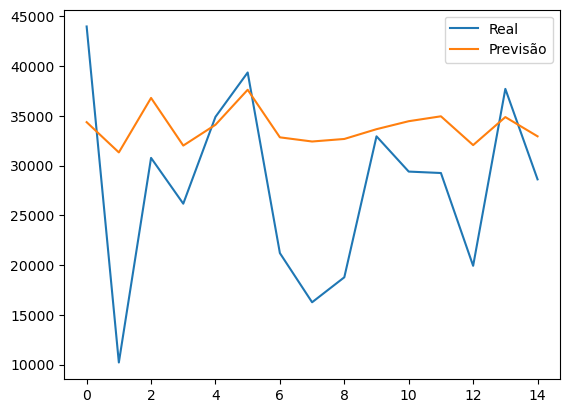

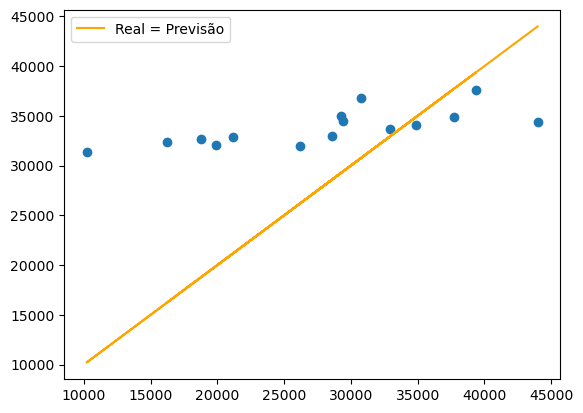

In [676]:
fotovoltaica_s_previsao = PM.predict(fotovoltaica_e_teste) #testar o modelo
plt.plot(fotovoltaica_s_teste, label='Real') #desenhar os resultados
plt.plot(fotovoltaica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(fotovoltaica_s_teste, fotovoltaica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(fotovoltaica_s_teste, fotovoltaica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [677]:
MAE = metrics.mean_absolute_error(fotovoltaica_s_teste, fotovoltaica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(fotovoltaica_s_teste - fotovoltaica_s_previsao)
MSE = metrics.mean_squared_error(fotovoltaica_s_teste, fotovoltaica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(fotovoltaica_s_teste, fotovoltaica_s_previsao))
cvRMSE = RMSE / np.mean(fotovoltaica_s_teste)
NMBE = MBE / np.mean(fotovoltaica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['PM'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,8962.201744,-6184.853147,1.213904e+08,11017.729773,0.393976,-0.221160
FA,5310.087013,-2878.178536,4.170194e+07,6457.703852,0.230917,-0.102919
PM,7837.035132,-5840.131756,9.557216e+07,9776.101625,0.349578,-0.208834


#### 4.2.6.5. Guardar Modelo

Com base nos valores obtidos para a performance do modelo, foi selecionado o que apresentou valores mais baixos (menores erros), correspondendo ao Regressor da Floresta Aleatória.

In [678]:
with open('sao_miguel_fotovoltaica.pkl','wb') as file: #guardar o modelo
    pickle.dump(FA, file)

### 4.2.7. Outras Renováveis

In [699]:
colunas_nomes = ['MAE', 'MBE', 'MSE', 'RMSE', 'cvRMSE', 'NMBE'] #definir nome das colunas
performance = pd.DataFrame(columns=colunas_nomes) #criar dataframe no qual vamos guardar os parâmetros que avaliam a performance para posteriormente comparar

#### 4.2.7.1. Preparação dos Dados

In [700]:
outras = sao_miguel.drop(['Gasóleo', 'Fuelóleo', 'Hídrica', 'Geotérmica', 'Eólica', 'Fotovoltaica', 'Total', 'Gasóleo-1', 'Fuelóleo-1', 'Hídrica-1', 'Geotérmica-1', 'Eólica-1', 'Fotovoltaica-1', 'Total-1'], axis=1)  #eliminar as colunas que não se vão usar
outras_saida = outras.values[:,4]
outras_entradas = outras.values[:,[0,1,2,3,5]]
outras_e_treino, outras_e_teste, outras_s_treino, outras_s_teste = train_test_split(outras_entradas,outras_saida) #definir dados para treino (75%) e para teste (25%)

#### 4.2.7.2. Autoregressão

In [701]:
AR = AutoReg(outras_s_treino, lags=1)
AR_fit = AR.fit()

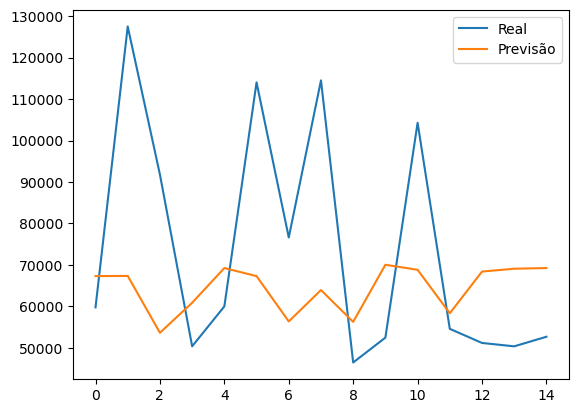

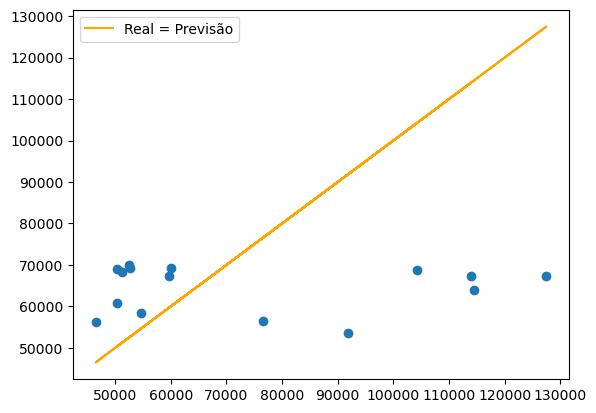

In [702]:
coeficiente = AR_fit.params #encontrar os parâmetros do modelo
passado = outras_s_treino[len(fotovoltaica_s_treino)-1:]
passado = [passado[i] for i in range(len(passado))]
outras_s_previsao = list() #definir lista no qual se vai guardar os valores previstos
for j in range(len(outras_s_teste)):
    comprimento = len(passado)
    passo = [passado[i] for i in range(comprimento-1,comprimento)]
    valor = coeficiente[0]
    for k in range(1):
        valor += coeficiente[k+1] * passo[k]
    observado = outras_s_teste[j]
    outras_s_previsao.append(valor)
    passado.append(observado)
plt.plot(outras_s_teste, label='Real') #desenhar os resultados
plt.plot(outras_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(outras_s_teste, outras_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(outras_s_teste, outras_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [703]:
MAE = metrics.mean_absolute_error(outras_s_teste, outras_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(outras_s_teste - outras_s_previsao)
MSE = metrics.mean_squared_error(outras_s_teste, outras_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(outras_s_teste, outras_s_previsao))
cvRMSE = RMSE / np.mean(outras_s_teste)
NMBE = MBE / np.mean(outras_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
for coluna, valor in zip(colunas_nomes, valores):
    performance[coluna] = [valor]
performance.index = ['A'] #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,24146.445485,9357.751594,8.714976e+08,29521.13833,0.400114,0.12683


#### 4.2.7.3. Floresta Aleatória

In [704]:
FA = RandomForestRegressor(min_samples_leaf=5) #criar modelo
FA.fit(outras_e_treino, outras_s_treino) #treinar o modelo

RandomForestRegressor(min_samples_leaf=5)

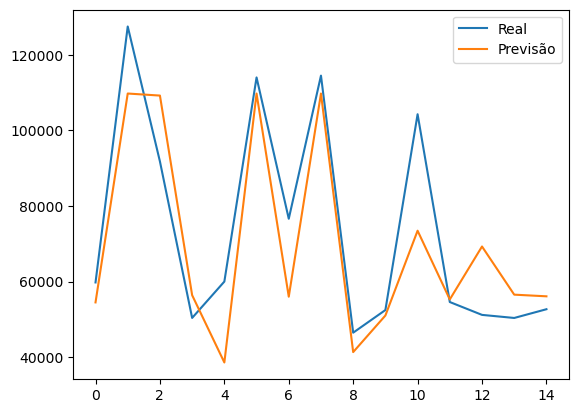

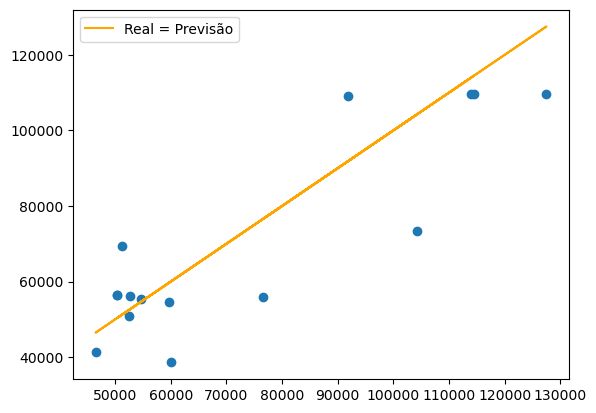

In [705]:
outras_s_previsao = FA.predict(outras_e_teste) #testar o modelo
plt.plot(outras_s_teste, label='Real') #desenhar os resultados
plt.plot(outras_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(outras_s_teste, outras_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(outras_s_teste, outras_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [706]:
MAE = metrics.mean_absolute_error(outras_s_teste, outras_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(outras_s_teste - outras_s_previsao)
MSE = metrics.mean_squared_error(outras_s_teste, outras_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(outras_s_teste, outras_s_previsao))
cvRMSE = RMSE / np.mean(outras_s_teste)
NMBE = MBE / np.mean(outras_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['FA'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,24146.445485,9357.751594,8.714976e+08,29521.138330,0.400114,0.126830
FA,10886.377908,3975.951828,1.975543e+08,14055.401963,0.190500,0.053888


#### 4.2.7.4. Perceptron Multicamadas

In [707]:
PM = MLPRegressor(hidden_layer_sizes=(5,5,5)) #criar modelo
PM.fit(outras_e_treino, outras_s_treino) #treinar o modelo

C:\Users\mafal\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


MLPRegressor(hidden_layer_sizes=(5, 5, 5))

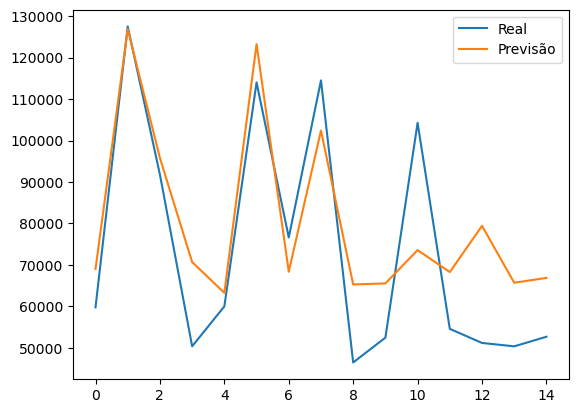

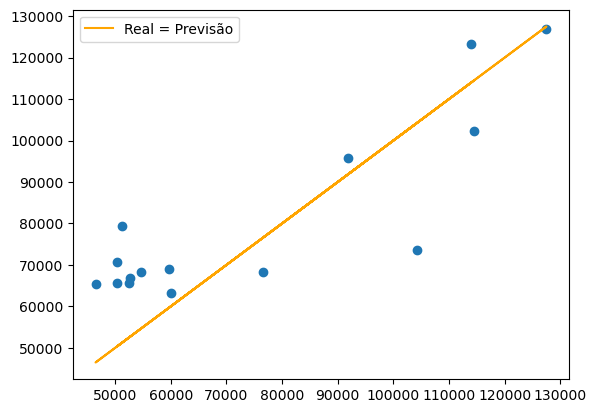

In [708]:
outras_s_previsao = PM.predict(outras_e_teste) #testar o modelo
plt.plot(outras_s_teste, label='Real') #desenhar os resultados
plt.plot(outras_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(outras_s_teste, outras_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(outras_s_teste, outras_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [709]:
MAE = metrics.mean_absolute_error(outras_s_teste, outras_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(outras_s_teste - outras_s_previsao)
MSE = metrics.mean_squared_error(outras_s_teste, outras_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(outras_s_teste, outras_s_previsao))
cvRMSE = RMSE / np.mean(outras_s_teste)
NMBE = MBE / np.mean(outras_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['PM'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,24146.445485,9357.751594,8.714976e+08,29521.138330,0.400114,0.126830
FA,10886.377908,3975.951828,1.975543e+08,14055.401963,0.190500,0.053888
PM,13408.474956,-6515.661355,2.476367e+08,15736.477916,0.213284,-0.088310


#### 4.2.7.5. Guardar Modelo

Com base nos valores obtidos para a performance do modelo, foi selecionado o que apresentou valores mais baixos (menores erros), correspondendo ao Regressor da Floresta Aleatória.

In [710]:
with open('sao_miguel_outras.pkl','wb') as file: #guardar o modelo
    pickle.dump(FA, file)

### 4.3. Terceira

### 4.3.1. Fuelóleo

In [711]:
colunas_nomes = ['MAE', 'MBE', 'MSE', 'RMSE', 'cvRMSE', 'NMBE'] #definir nome das colunas
performance = pd.DataFrame(columns=colunas_nomes) #criar dataframe no qual vamos guardar os parâmetros que avaliam a performance para posteriormente comparar

#### 4.3.1.1. Preparação dos Dados

In [712]:
fueloleo = terceira.drop(['Gasóleo', 'Hídrica', 'Geotérmica', 'Eólica', 'Fotovoltaica', 'Resíduos', 'Total', 'Gasóleo-1', 'Hídrica-1', 'Geotérmica-1', 'Eólica-1', 'Fotovoltaica-1', 'Resíduos-1', 'Total-1'], axis=1)  #eliminar as colunas que não se vão usar
fueloleo_saida = fueloleo.values[:,4]
fueloleo_entradas = fueloleo.values[:,[0,1,2,3,5]]
fueloleo_e_treino, fueloleo_e_teste, fueloleo_s_treino, fueloleo_s_teste = train_test_split(fueloleo_entradas,fueloleo_saida) #definir dados para treino (75%) e para teste (25%)

#### 4.3.1.2. Autoregressão

In [714]:
AR = AutoReg(fueloleo_s_treino, lags=1)
AR_fit = AR.fit()

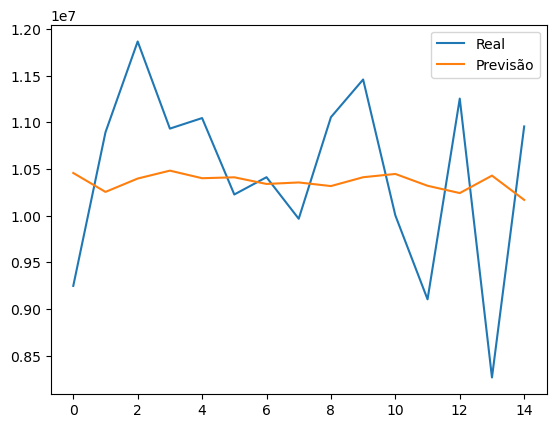

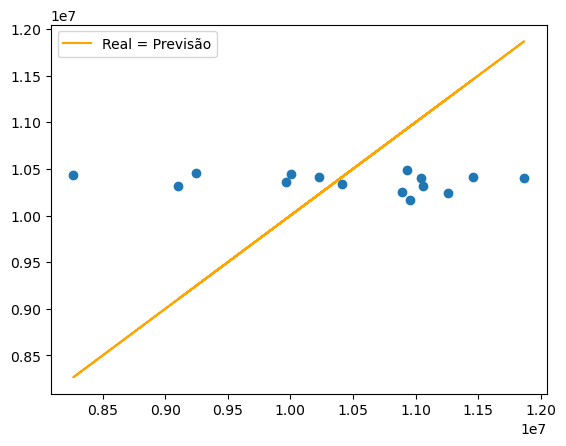

In [715]:
coeficiente = AR_fit.params #encontrar os parâmetros do modelo
passado = fueloleo_s_treino[len(fueloleo_s_treino)-1:]
passado = [passado[i] for i in range(len(passado))]
fueloleo_s_previsao = list() #definir lista no qual se vai guardar os valores previstos
for j in range(len(fueloleo_s_teste)):
    comprimento = len(passado)
    passo = [passado[i] for i in range(comprimento-1,comprimento)]
    valor = coeficiente[0]
    for k in range(1):
        valor += coeficiente[k+1] * passo[k]
    observado = fueloleo_s_teste[j]
    fueloleo_s_previsao.append(valor)
    passado.append(observado)
plt.plot(fueloleo_s_teste, label='Real') #desenhar os resultados
plt.plot(fueloleo_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(fueloleo_s_teste, fueloleo_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(fueloleo_s_teste, fueloleo_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [716]:
MAE = metrics.mean_absolute_error(fueloleo_s_teste, fueloleo_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(fueloleo_s_teste - fueloleo_s_previsao)
MSE = metrics.mean_squared_error(fueloleo_s_teste, fueloleo_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(fueloleo_s_teste, fueloleo_s_previsao))
cvRMSE = RMSE / np.mean(fueloleo_s_teste)
NMBE = MBE / np.mean(fueloleo_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
for coluna, valor in zip(colunas_nomes, valores):
    performance[coluna] = [valor]
performance.index = ['A'] #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,831381.809484,83484.681411,9.660016e+11,982853.784501,0.094087,0.007992


#### 4.3.1.3. Floresta Aleatória

In [717]:
FA = RandomForestRegressor(min_samples_leaf=5) #criar modelo
FA.fit(fueloleo_e_treino, fueloleo_s_treino) #treinar o modelo

RandomForestRegressor(min_samples_leaf=5)

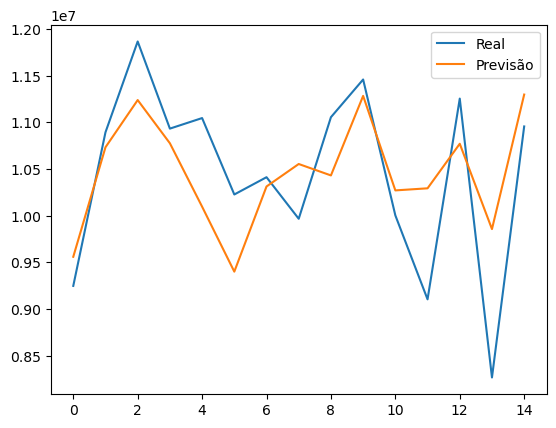

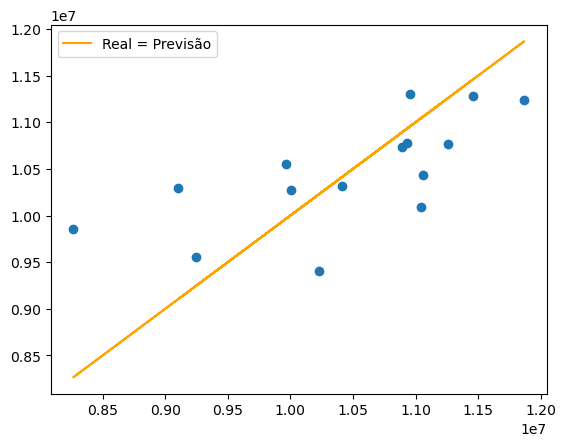

In [718]:
fueloleo_s_previsao = FA.predict(fueloleo_e_teste) #testar o modelo
plt.plot(fueloleo_s_teste, label='Real') #desenhar os resultados
plt.plot(fueloleo_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(fueloleo_s_teste, fueloleo_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(fueloleo_s_teste, fueloleo_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [719]:
MAE = metrics.mean_absolute_error(fueloleo_s_teste, fueloleo_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(fueloleo_s_teste - fueloleo_s_previsao)
MSE = metrics.mean_squared_error(fueloleo_s_teste, fueloleo_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(fueloleo_s_teste, fueloleo_s_previsao))
cvRMSE = RMSE / np.mean(fueloleo_s_teste)
NMBE = MBE / np.mean(fueloleo_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['FA'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,831381.809484,83484.681411,9.660016e+11,982853.784501,0.094087,0.007992
FA,559692.060906,-12254.282694,4.848372e+11,696302.542496,0.066656,-0.001173


#### 4.3.1.4. Perceptron Multicamadas

In [720]:
PM = MLPRegressor(hidden_layer_sizes=(5,5,5)) #criar modelo
PM.fit(fueloleo_e_treino, fueloleo_s_treino) #treinar o modelo

C:\Users\mafal\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


MLPRegressor(hidden_layer_sizes=(5, 5, 5))

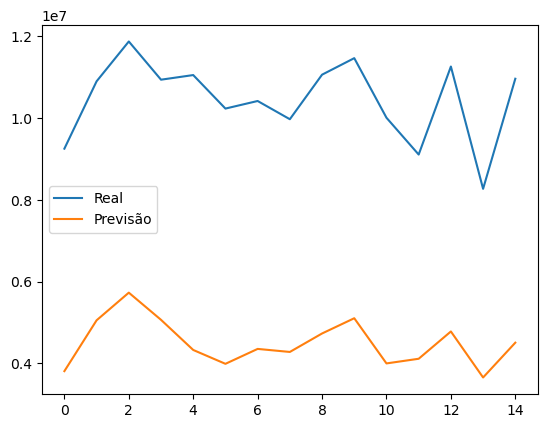

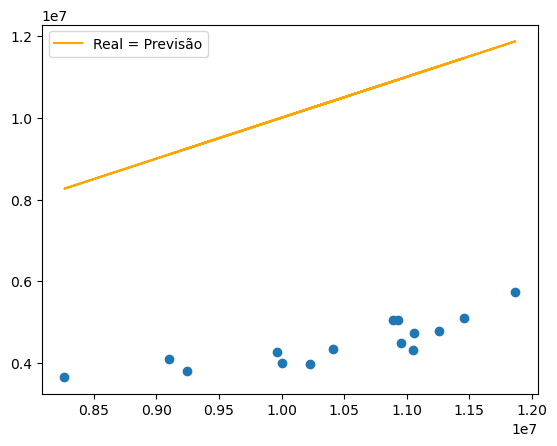

In [721]:
fueloleo_s_previsao = PM.predict(fueloleo_e_teste) #testar o modelo
plt.plot(fueloleo_s_teste, label='Real') #desenhar os resultados
plt.plot(fueloleo_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(fueloleo_s_teste, fueloleo_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(fueloleo_s_teste, fueloleo_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [722]:
MAE = metrics.mean_absolute_error(fueloleo_s_teste, fueloleo_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(fueloleo_s_teste - fueloleo_s_previsao)
MSE = metrics.mean_squared_error(fueloleo_s_teste, fueloleo_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(fueloleo_s_teste, fueloleo_s_previsao))
cvRMSE = RMSE / np.mean(fueloleo_s_teste)
NMBE = MBE / np.mean(fueloleo_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['PM'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,8.313818e+05,8.348468e+04,9.660016e+11,9.828538e+05,0.094087,0.007992
FA,5.596921e+05,-1.225428e+04,4.848372e+11,6.963025e+05,0.066656,-0.001173
PM,5.947772e+06,5.947772e+06,3.568407e+13,5.973615e+06,0.571847,0.569373


#### 4.3.1.5. Guardar Modelo

Com base nos valores obtidos para a performance do modelo, foi selecionado o que apresentou valores mais baixos (menores erros), correspondendo ao Regressor da Floresta Aleatória.

In [723]:
with open('terceira_fueloleo.pkl','wb') as file: #guardar o modelo
    pickle.dump(FA, file)

### 4.3.2. Gasóleo

In [724]:
colunas_nomes = ['MAE', 'MBE', 'MSE', 'RMSE', 'cvRMSE', 'NMBE'] #definir nome das colunas
performance = pd.DataFrame(columns=colunas_nomes) #criar dataframe no qual vamos guardar os parâmetros que avaliam a performance para posteriormente comparar

#### 4.3.2.1. Preparação dos Dados

In [726]:
gasoleo = terceira.drop(['Fuelóleo', 'Hídrica', 'Geotérmica', 'Eólica', 'Fotovoltaica', 'Resíduos', 'Total', 'Fuelóleo-1', 'Hídrica-1', 'Geotérmica-1', 'Eólica-1', 'Fotovoltaica-1', 'Resíduos-1', 'Total-1'], axis=1)  #eliminar as colunas que não se vão usar
gasoleo_saida = gasoleo.values[:,4]
gasoleo_entradas = gasoleo.values[:,[0,1,2,3,5]]
gasoleo_e_treino, gasoleo_e_teste, gasoleo_s_treino, gasoleo_s_teste = train_test_split(gasoleo_entradas,gasoleo_saida) #definir dados para treino (75%) e para teste (25%)

#### 4.3.2.2. Autoregressão

In [727]:
AR = AutoReg(gasoleo_s_treino, lags=1)
AR_fit = AR.fit()

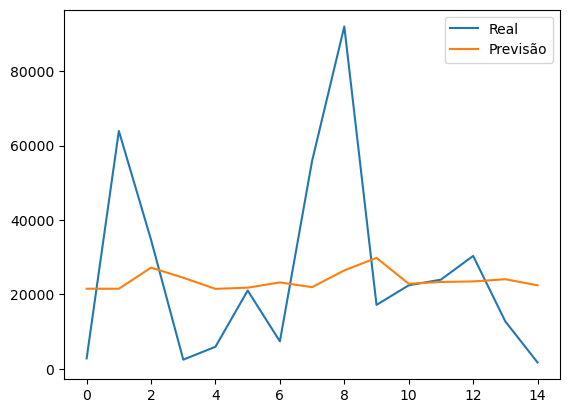

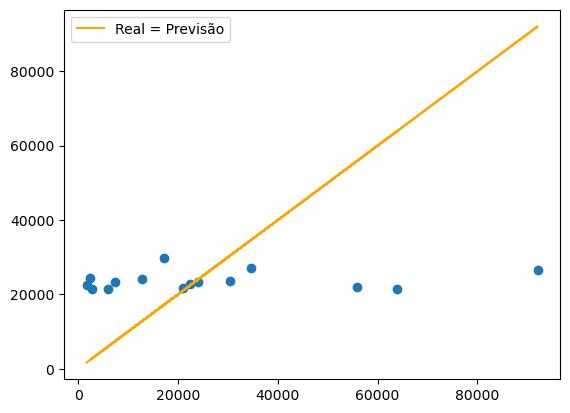

In [728]:
coeficiente = AR_fit.params #encontrar os parâmetros do modelo
passado = gasoleo_s_treino[len(gasoleo_s_treino)-1:]
passado = [passado[i] for i in range(len(passado))]
gasoleo_s_previsao = list() #definir lista no qual se vai guardar os valores previstos
for j in range(len(gasoleo_s_teste)):
    comprimento = len(passado)
    passo = [passado[i] for i in range(comprimento-1,comprimento)]
    valor = coeficiente[0]
    for k in range(1):
        valor += coeficiente[k+1] * passo[k]
    observado = gasoleo_s_teste[j]
    gasoleo_s_previsao.append(valor)
    passado.append(observado)
plt.plot(gasoleo_s_teste, label='Real') #desenhar os resultados
plt.plot(gasoleo_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(gasoleo_s_teste, gasoleo_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(gasoleo_s_teste, gasoleo_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [729]:
MAE = metrics.mean_absolute_error(gasoleo_s_teste, gasoleo_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(gasoleo_s_teste - gasoleo_s_previsao)
MSE = metrics.mean_squared_error(gasoleo_s_teste, gasoleo_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(gasoleo_s_teste, gasoleo_s_previsao))
cvRMSE = RMSE / np.mean(gasoleo_s_teste)
NMBE = MBE / np.mean(gasoleo_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
for coluna, valor in zip(colunas_nomes, valores):
    performance[coluna] = [valor]
performance.index = ['A'] #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,18335.686363,2589.264827,6.273198e+08,25046.352767,0.952639,0.098483


#### 4.3.2.3. Floresta Aleatória

In [730]:
FA = RandomForestRegressor(min_samples_leaf=5) #criar modelo
FA.fit(gasoleo_e_treino, gasoleo_s_treino) #treinar o modelo

RandomForestRegressor(min_samples_leaf=5)

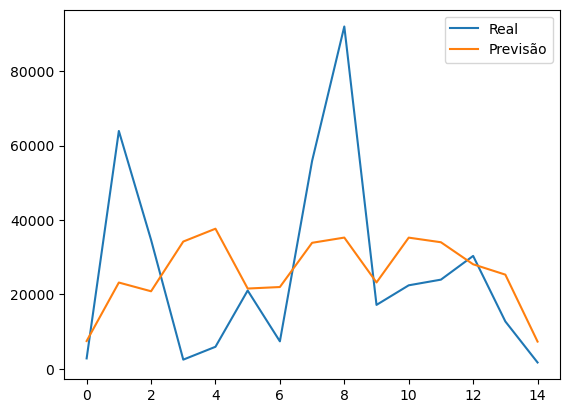

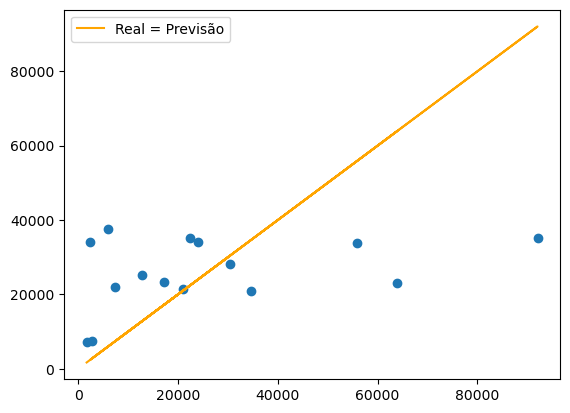

In [731]:
gasoleo_s_previsao = FA.predict(gasoleo_e_teste) #testar o modelo
plt.plot(gasoleo_s_teste, label='Real')
plt.plot(gasoleo_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(gasoleo_s_teste, gasoleo_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(gasoleo_s_teste, gasoleo_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [732]:
MAE = metrics.mean_absolute_error(gasoleo_s_teste, gasoleo_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(gasoleo_s_teste - gasoleo_s_previsao)
MSE = metrics.mean_squared_error(gasoleo_s_teste, gasoleo_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(gasoleo_s_teste, gasoleo_s_previsao))
cvRMSE = RMSE / np.mean(gasoleo_s_teste)
NMBE = MBE / np.mean(gasoleo_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['FA'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,18335.686363,2589.264827,6.273198e+08,25046.352767,0.952639,0.098483
FA,17738.171323,347.246898,5.540347e+08,23537.941656,0.895267,0.013208


#### 4.3.2.4. Perceptron Multicamadas

In [733]:
PM = MLPRegressor(hidden_layer_sizes=(5,5,5)) #criar modelo
PM.fit(gasoleo_e_treino, gasoleo_s_treino) #treinar o modelo

C:\Users\mafal\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


MLPRegressor(hidden_layer_sizes=(5, 5, 5))

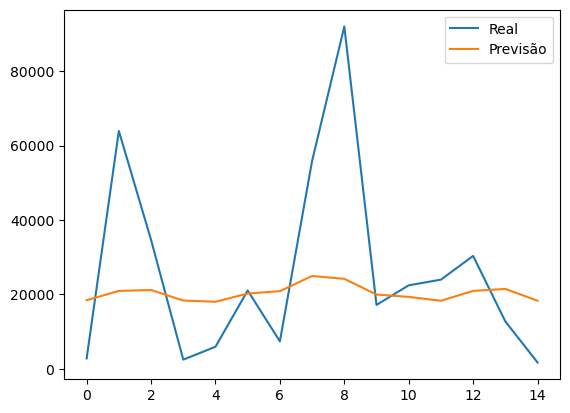

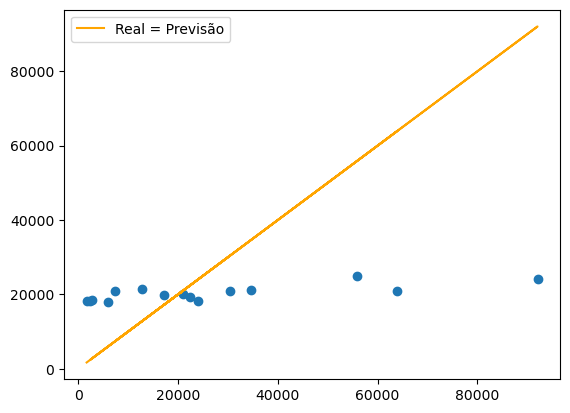

In [734]:
gasoleo_s_previsao = PM.predict(gasoleo_e_teste) #testar o modelo
plt.plot(gasoleo_s_teste, label='Real')
plt.plot(gasoleo_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(gasoleo_s_teste, gasoleo_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(gasoleo_s_teste, gasoleo_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [735]:
MAE = metrics.mean_absolute_error(gasoleo_s_teste, gasoleo_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(gasoleo_s_teste - gasoleo_s_previsao)
MSE = metrics.mean_squared_error(gasoleo_s_teste, gasoleo_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(gasoleo_s_teste, gasoleo_s_previsao))
cvRMSE = RMSE / np.mean(gasoleo_s_teste)
NMBE = MBE / np.mean(gasoleo_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['PM'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,18335.686363,2589.264827,6.273198e+08,25046.352767,0.952639,0.098483
FA,17738.171323,347.246898,5.540347e+08,23537.941656,0.895267,0.013208
PM,17309.028746,5937.220685,5.942857e+08,24377.976384,0.927218,0.225823


#### 4.3.2.5. Guardar Modelo

Com base nos valores obtidos para a performance do modelo, foi selecionado o que apresentou valores mais baixos (menores erros), correspondendo ao Regressor de Perceptron Multicamadas.

In [736]:
with open('terceira_gasoleo.pkl','wb') as file: #guardar o modelo
    pickle.dump(FA, file)

#### 4.3.3. Hídrica

In [737]:
colunas_nomes = ['MAE', 'MBE', 'MSE', 'RMSE', 'cvRMSE', 'NMBE'] #definir nome das colunas
performance = pd.DataFrame(columns=colunas_nomes) #criar dataframe no qual vamos guardar os parâmetros que avaliam a performance para posteriormente comparar

#### 4.3.3.1. Preparação dos Dados

In [739]:
hidrica = terceira.drop(['Gasóleo', 'Fuelóleo', 'Geotérmica', 'Eólica', 'Fotovoltaica', 'Resíduos', 'Total', 'Gasóleo-1', 'Fuelóleo-1', 'Geotérmica-1', 'Eólica-1', 'Fotovoltaica-1', 'Resíduos-1', 'Total-1'], axis=1)  #eliminar as colunas que não se vão usar
hidrica_saida = hidrica.values[:,4]
hidrica_entradas = hidrica.values[:,[0,1,2,3,5]]
hidrica_e_treino, hidrica_e_teste, hidrica_s_treino, hidrica_s_teste = train_test_split(hidrica_entradas,hidrica_saida) #definir dados para treino (75%) e para teste (25%)

#### 4.3.3.2. Autoregressão

In [740]:
AR = AutoReg(hidrica_s_treino, lags=1)
AR_fit = AR.fit()

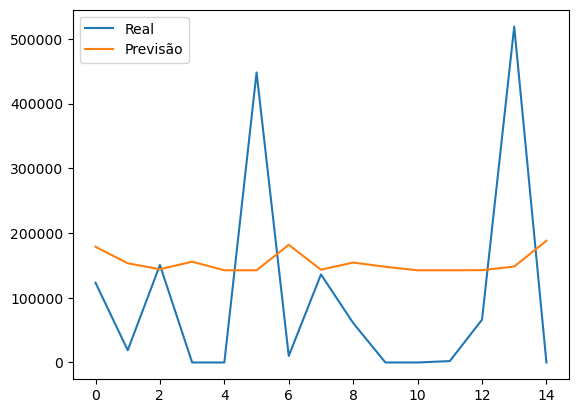

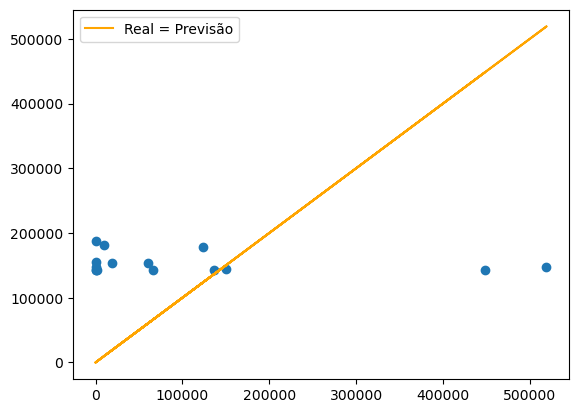

In [741]:
coeficiente = AR_fit.params #encontrar os parâmetros do modelo
passado = hidrica_s_treino[len(hidrica_s_treino)-1:]
passado = [passado[i] for i in range(len(passado))]
hidrica_s_previsao = list() #definir lista no qual se vai guardar os valores previstos
for j in range(len(hidrica_s_teste)):
    comprimento = len(passado)
    passo = [passado[i] for i in range(comprimento-1,comprimento)]
    valor = coeficiente[0]
    for k in range(1):
        valor += coeficiente[k+1] * passo[k]
    observado = hidrica_s_teste[j]
    hidrica_s_previsao.append(valor)
    passado.append(observado)
plt.plot(hidrica_s_teste, label='Real') #desenhar os resultados
plt.plot(hidrica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(hidrica_s_teste, hidrica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(hidrica_s_teste, hidrica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [742]:
MAE = metrics.mean_absolute_error(hidrica_s_teste, hidrica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(hidrica_s_teste - hidrica_s_previsao)
MSE = metrics.mean_squared_error(hidrica_s_teste, hidrica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(hidrica_s_teste, hidrica_s_previsao))
cvRMSE = RMSE / np.mean(hidrica_s_teste)
NMBE = MBE / np.mean(hidrica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
for coluna, valor in zip(colunas_nomes, valores):
    performance[coluna] = [valor]
performance.index = ['A'] #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,142599.114422,-51530.657988,2.920616e+10,170898.091917,1.669648,-0.503447


#### 4.3.3.3. Floresta Aleatória

In [743]:
FA = RandomForestRegressor(min_samples_leaf=5) #criar modelo
FA.fit(hidrica_e_treino, hidrica_s_treino) #treinar o modelo

RandomForestRegressor(min_samples_leaf=5)

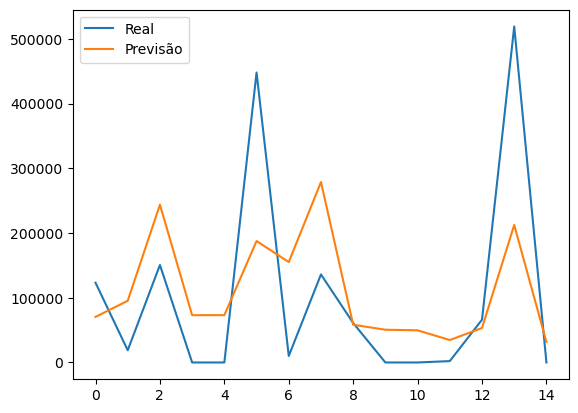

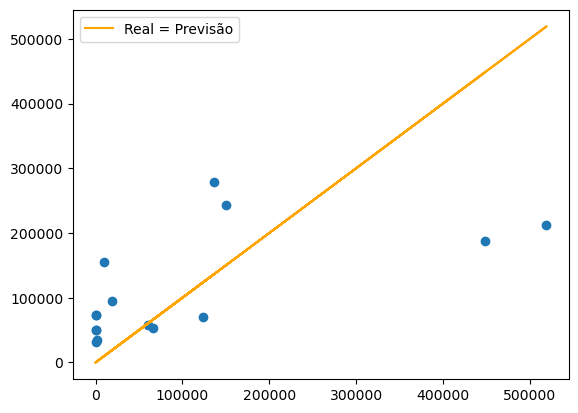

In [744]:
hidrica_s_previsao = FA.predict(hidrica_e_teste) #testar o modelo
plt.plot(hidrica_s_teste, label='Real') #desenhar os resultados
plt.plot(hidrica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(hidrica_s_teste, hidrica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(hidrica_s_teste, hidrica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [745]:
MAE = metrics.mean_absolute_error(hidrica_s_teste, hidrica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(hidrica_s_teste - hidrica_s_previsao)
MSE = metrics.mean_squared_error(hidrica_s_teste, hidrica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(hidrica_s_teste, hidrica_s_previsao))
cvRMSE = RMSE / np.mean(hidrica_s_teste)
NMBE = MBE / np.mean(hidrica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['FA'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,142599.114422,-51530.657988,2.920616e+10,170898.091917,1.669648,-0.503447
FA,93575.297809,-8852.994683,1.590447e+10,126112.916314,1.232104,-0.086492


#### 4.3.3.4. Perceptron Multicamadas

In [746]:
PM = MLPRegressor(hidden_layer_sizes=(5,5,5)) #criar modelo
PM.fit(hidrica_e_treino, hidrica_s_treino) #treinar o modelo

C:\Users\mafal\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


MLPRegressor(hidden_layer_sizes=(5, 5, 5))

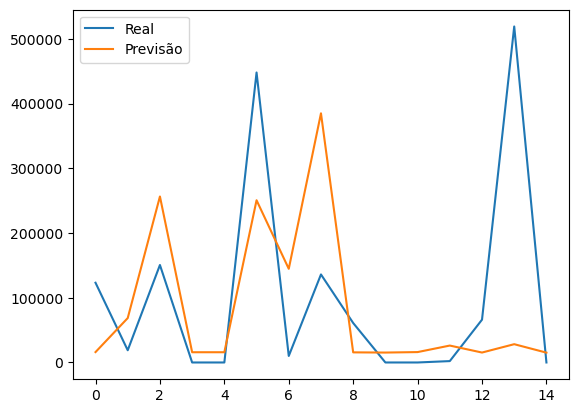

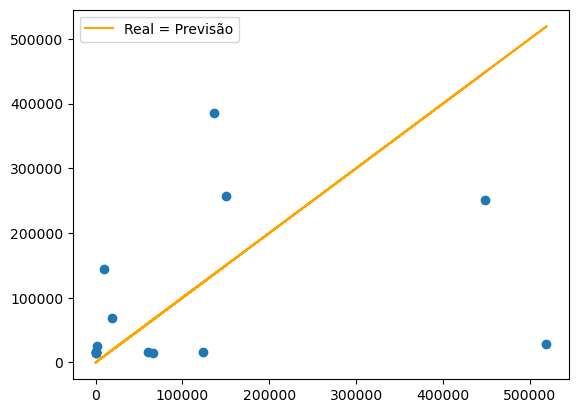

In [747]:
hidrica_s_previsao = PM.predict(hidrica_e_teste) #testar o modelo
plt.plot(hidrica_s_teste, label='Real') #desenhar os resultados
plt.plot(hidrica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(hidrica_s_teste, hidrica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(hidrica_s_teste, hidrica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [748]:
MAE = metrics.mean_absolute_error(hidrica_s_teste, hidrica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(hidrica_s_teste - hidrica_s_previsao)
MSE = metrics.mean_squared_error(hidrica_s_teste, hidrica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(hidrica_s_teste, hidrica_s_previsao))
cvRMSE = RMSE / np.mean(hidrica_s_teste)
NMBE = MBE / np.mean(hidrica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['PM'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,142599.114422,-51530.657988,2.920616e+10,170898.091917,1.669648,-0.503447
FA,93575.297809,-8852.994683,1.590447e+10,126112.916314,1.232104,-0.086492
PM,102202.035421,16676.900255,2.611176e+10,161591.344393,1.578723,0.162931


#### 4.3.3.5. Guardar Modelo

Com base nos valores obtidos para a performance do modelo, foi selecionado o que apresentou valores mais baixos (menores erros), correspondendo ao Regressor da Floresta Aleatória.

In [749]:
with open('terceira_hidrica.pkl','wb') as file: #guardar o modelo
    pickle.dump(FA, file)

### 4.3.4. Geotérmica

In [750]:
colunas_nomes = ['MAE', 'MBE', 'MSE', 'RMSE', 'cvRMSE', 'NMBE'] #definir nome das colunas
performance = pd.DataFrame(columns=colunas_nomes) #criar dataframe no qual vamos guardar os parâmetros que avaliam a performance para posteriormente comparar

#### 4.3.4.1. Preparação dos Dados

In [751]:
geotermica = terceira.drop(['Gasóleo', 'Fuelóleo', 'Hídrica', 'Eólica', 'Fotovoltaica', 'Resíduos', 'Total', 'Gasóleo-1', 'Fuelóleo-1', 'Hídrica-1', 'Eólica-1', 'Fotovoltaica-1', 'Resíduos-1', 'Total-1'], axis=1)  #eliminar as colunas que não se vão usar
geotermica_saida = geotermica.values[:,4]
geotermica_entradas = geotermica.values[:,[0,1,2,3,5]]
geotermica_e_treino, geotermica_e_teste, geotermica_s_treino, geotermica_s_teste = train_test_split(geotermica_entradas,geotermica_saida) #definir dados para treino (75%) e para teste (25%)

#### 4.3.4.2. Autoregressão

In [752]:
AR = AutoReg(geotermica_s_treino, lags=1)
AR_fit = AR.fit()

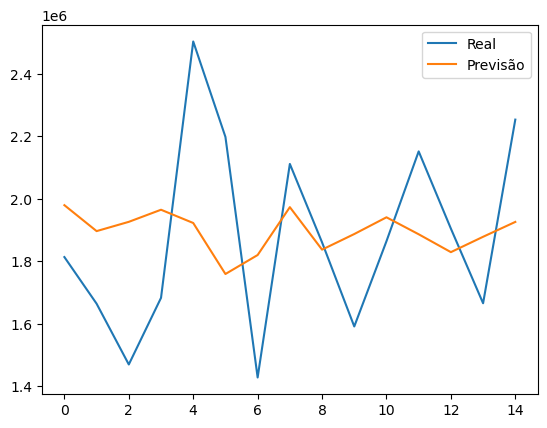

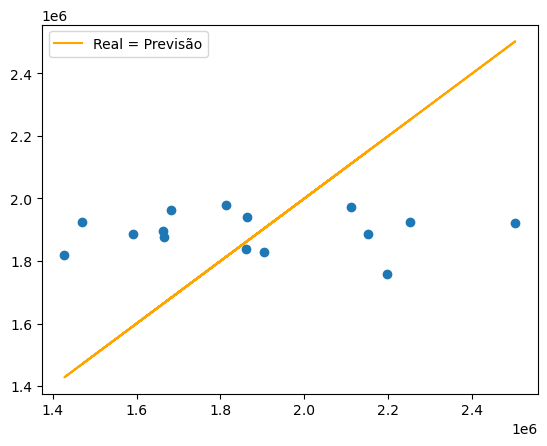

In [753]:
coeficiente = AR_fit.params #encontrar os parâmetros do modelo
passado = geotermica_s_treino[len(geotermica_s_treino)-1:]
passado = [passado[i] for i in range(len(passado))]
geotermica_s_previsao = list() #definir lista no qual se vai guardar os valores previstos
for j in range(len(geotermica_s_teste)):
    comprimento = len(passado)
    passo = [passado[i] for i in range(comprimento-1,comprimento)]
    valor = coeficiente[0]
    for k in range(1):
        valor += coeficiente[k+1] * passo[k]
    observado = geotermica_s_teste[j]
    geotermica_s_previsao.append(valor)
    passado.append(observado)
plt.plot(geotermica_s_teste, label='Real') #desenhar os resultados
plt.plot(geotermica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(geotermica_s_teste, geotermica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(geotermica_s_teste, geotermica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [754]:
MAE = metrics.mean_absolute_error(geotermica_s_teste, geotermica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(geotermica_s_teste - geotermica_s_previsao)
MSE = metrics.mean_squared_error(geotermica_s_teste, geotermica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(geotermica_s_teste, geotermica_s_previsao))
cvRMSE = RMSE / np.mean(geotermica_s_teste)
NMBE = MBE / np.mean(geotermica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
for coluna, valor in zip(colunas_nomes, valores):
    performance[coluna] = [valor]
performance.index = ['A'] #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,264074.269476,-17628.920345,9.287924e+10,304760.95536,0.162353,-0.009391


#### 4.3.4.3. Floresta Aleatória

In [755]:
FA = RandomForestRegressor(min_samples_leaf=5) #criar modelo
FA.fit(geotermica_e_treino, geotermica_s_treino) #treinar o modelo

RandomForestRegressor(min_samples_leaf=5)

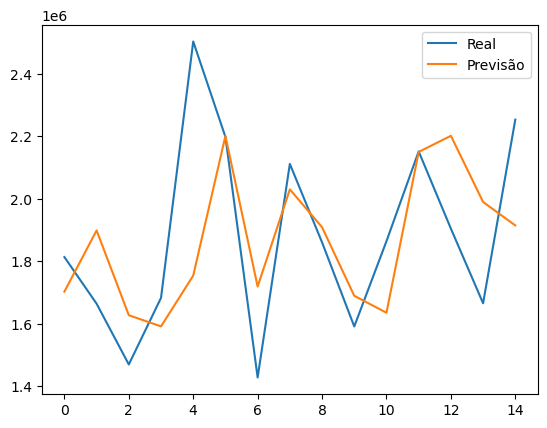

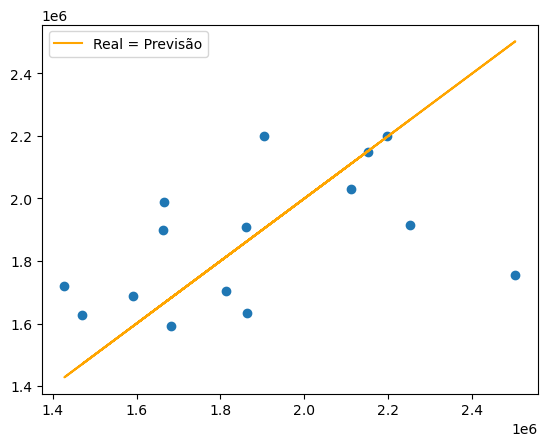

In [756]:
geotermica_s_previsao = FA.predict(geotermica_e_teste) #testar o modelo
plt.plot(geotermica_s_teste, label='Real') #desenhar os resultados
plt.plot(geotermica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(geotermica_s_teste, geotermica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(geotermica_s_teste, geotermica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [757]:
MAE = metrics.mean_absolute_error(geotermica_s_teste, geotermica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(geotermica_s_teste - geotermica_s_previsao)
MSE = metrics.mean_squared_error(geotermica_s_teste, geotermica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(geotermica_s_teste, geotermica_s_previsao))
cvRMSE = RMSE / np.mean(geotermica_s_teste)
NMBE = MBE / np.mean(geotermica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['FA'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,264074.269476,-17628.920345,9.287924e+10,304760.955360,0.162353,-0.009391
FA,203628.012806,9877.567954,7.496272e+10,273793.200453,0.145856,0.005262


#### 4.3.4.4. Perceptron Multicamadas

In [758]:
PM = MLPRegressor(hidden_layer_sizes=(5,5,5)) #criar modelo
PM.fit(geotermica_e_treino, geotermica_s_treino) #treinar o modelo

C:\Users\mafal\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


MLPRegressor(hidden_layer_sizes=(5, 5, 5))

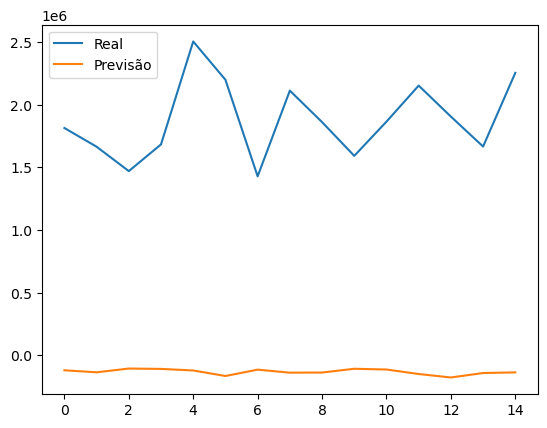

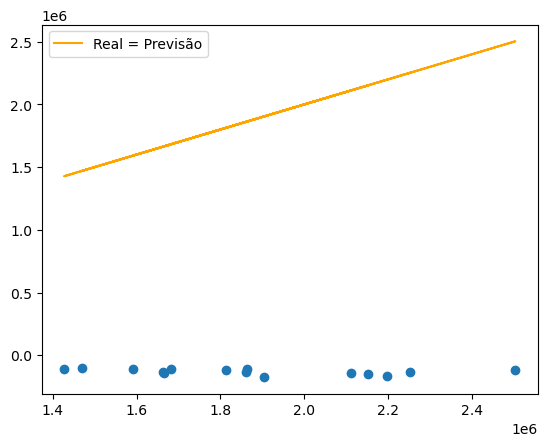

In [759]:
geotermica_s_previsao = PM.predict(geotermica_e_teste) #testar o modelo
plt.plot(geotermica_s_teste, label='Real') #desenhar os resultados
plt.plot(geotermica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(geotermica_s_teste, geotermica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(geotermica_s_teste, geotermica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [760]:
MAE = metrics.mean_absolute_error(geotermica_s_teste, geotermica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(geotermica_s_teste - geotermica_s_previsao)
MSE = metrics.mean_squared_error(geotermica_s_teste, geotermica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(geotermica_s_teste, geotermica_s_previsao))
cvRMSE = RMSE / np.mean(geotermica_s_teste)
NMBE = MBE / np.mean(geotermica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['PM'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,2.640743e+05,-1.762892e+04,9.287924e+10,3.047610e+05,0.162353,-0.009391
FA,2.036280e+05,9.877568e+03,7.496272e+10,2.737932e+05,0.145856,0.005262
PM,2.006945e+06,2.006945e+06,4.123604e+12,2.030666e+06,1.081780,1.069143


#### 4.3.4.5. Guardar Modelo

Com base nos valores obtidos para a performance do modelo, foi selecionado o que apresentou valores mais baixos (menores erros), correspondendo ao Regressor da Floresta Aleatória.

In [761]:
with open('terceira_geotermica.pkl','wb') as file: #guardar o modelo
    pickle.dump(FA, file)

### 4.3.5. Eólica

In [762]:
colunas_nomes = ['MAE', 'MBE', 'MSE', 'RMSE', 'cvRMSE', 'NMBE'] #definir nome das colunas
performance = pd.DataFrame(columns=colunas_nomes) #criar dataframe no qual vamos guardar os parâmetros que avaliam a performance para posteriormente comparar

#### 4.3.5.1. Preparação dos Dados

In [763]:
eolica = terceira.drop(['Gasóleo', 'Fuelóleo', 'Hídrica', 'Geotérmica', 'Fotovoltaica', 'Resíduos', 'Total', 'Gasóleo-1', 'Fuelóleo-1', 'Hídrica-1', 'Geotérmica-1', 'Fotovoltaica-1', 'Resíduos-1', 'Total-1'], axis=1)  #eliminar as colunas que não se vão usar
eolica_saida = eolica.values[:,4]
eolica_entradas = eolica.values[:,[0,1,2,3,5]]
eolica_e_treino, eolica_e_teste, eolica_s_treino, eolica_s_teste = train_test_split(eolica_entradas,eolica_saida) #definir dados para treino (75%) e para teste (25%)

#### 4.3.5.2. Autoregressão

In [764]:
AR = AutoReg(eolica_s_treino, lags=1)
AR_fit = AR.fit()

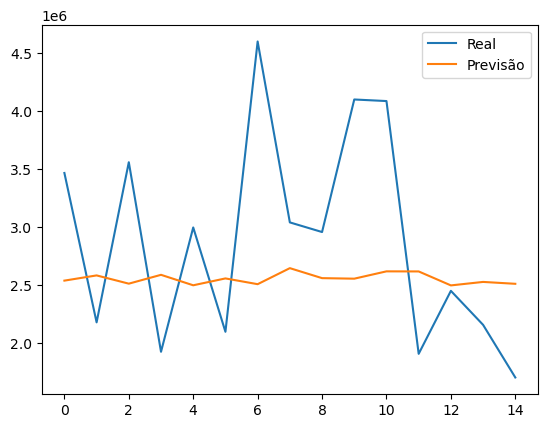

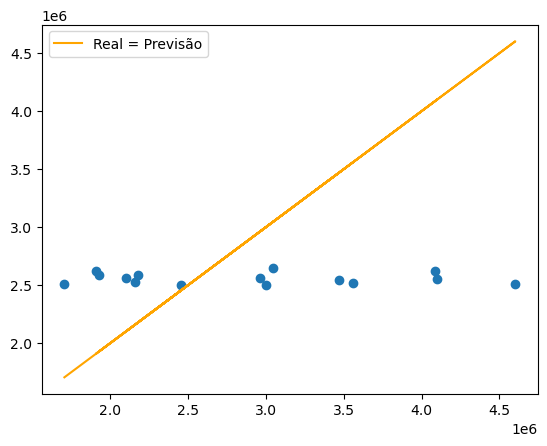

In [765]:
coeficiente = AR_fit.params #encontrar os parâmetros do modelo
passado = eolica_s_treino[len(eolica_s_treino)-1:]
passado = [passado[i] for i in range(len(passado))]
eolica_s_previsao = list() #definir lista no qual se vai guardar os valores previstos
for j in range(len(eolica_s_teste)):
    comprimento = len(passado)
    passo = [passado[i] for i in range(comprimento-1,comprimento)]
    valor = coeficiente[0]
    for k in range(1):
        valor += coeficiente[k+1] * passo[k]
    observado = eolica_s_teste[j]
    eolica_s_previsao.append(valor)
    passado.append(observado)
plt.plot(eolica_s_teste, label='Real') #desenhar os resultados
plt.plot(eolica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(eolica_s_teste, eolica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(eolica_s_teste, eolica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [766]:
MAE = metrics.mean_absolute_error(eolica_s_teste, eolica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(eolica_s_teste - eolica_s_previsao)
MSE = metrics.mean_squared_error(eolica_s_teste, eolica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(eolica_s_teste, eolica_s_previsao))
cvRMSE = RMSE / np.mean(eolica_s_teste)
NMBE = MBE / np.mean(eolica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
for coluna, valor in zip(colunas_nomes, valores):
    performance[coluna] = [valor]
performance.index = ['A'] #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,788822.459575,327107.829287,9.031254e+11,950329.095257,0.329527,0.113425


#### 4.3.5.3. Floresta Aleatória

In [767]:
FA = RandomForestRegressor(min_samples_leaf=5) #criar modelo
FA.fit(eolica_e_treino, eolica_s_treino) #treinar o modelo

RandomForestRegressor(min_samples_leaf=5)

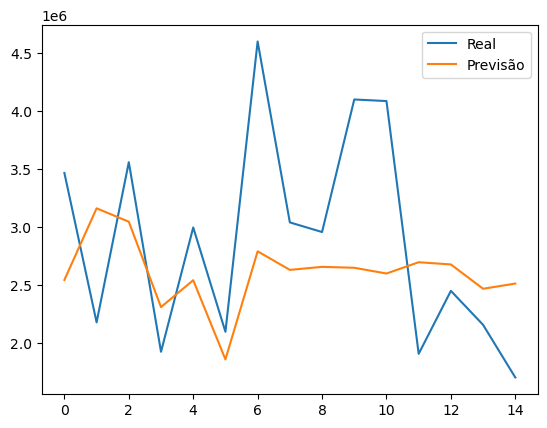

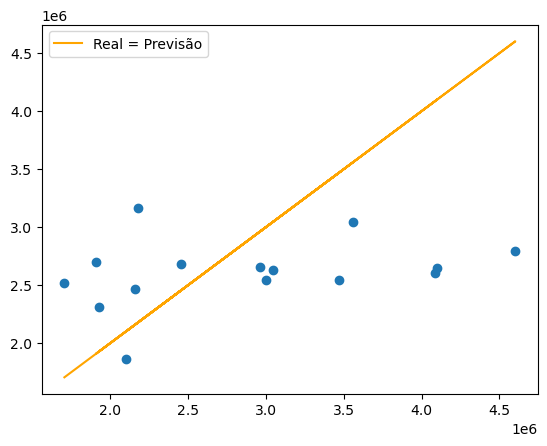

In [768]:
eolica_s_previsao = FA.predict(eolica_e_teste) #testar o modelo
plt.plot(eolica_s_teste, label='Real')
plt.plot(eolica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(eolica_s_teste, eolica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(eolica_s_teste, eolica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [769]:
MAE = metrics.mean_absolute_error(eolica_s_teste, eolica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(eolica_s_teste - eolica_s_previsao)
MSE = metrics.mean_squared_error(eolica_s_teste, eolica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(eolica_s_teste, eolica_s_previsao))
cvRMSE = RMSE / np.mean(eolica_s_teste)
NMBE = MBE / np.mean(eolica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['FA'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,788822.459575,327107.829287,9.031254e+11,950329.095257,0.329527,0.113425
FA,739303.832941,271835.586289,7.841702e+11,885533.878368,0.307059,0.094259


#### 4.3.5.4. Perceptron Multicamadas

In [770]:
PM = MLPRegressor(hidden_layer_sizes=(5,5,5)) #criar modelo
PM.fit(eolica_e_treino, eolica_s_treino) #treinar o modelo

C:\Users\mafal\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


MLPRegressor(hidden_layer_sizes=(5, 5, 5))

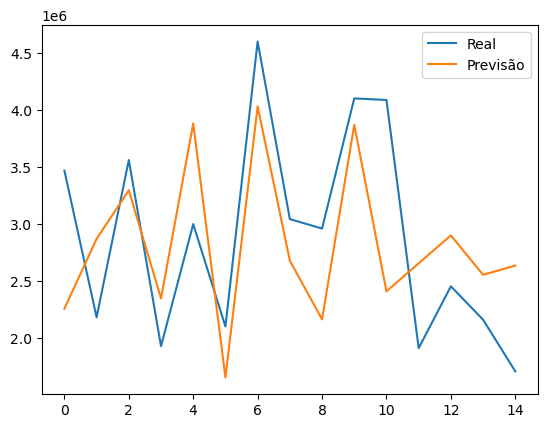

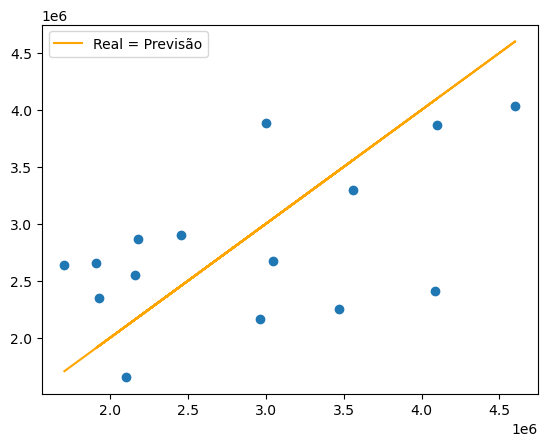

In [771]:
eolica_s_previsao = PM.predict(eolica_e_teste) #testar o modelo
plt.plot(eolica_s_teste, label='Real')
plt.plot(eolica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(eolica_s_teste, eolica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(eolica_s_teste, eolica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [772]:
MAE = metrics.mean_absolute_error(eolica_s_teste, eolica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(eolica_s_teste - eolica_s_previsao)
MSE = metrics.mean_squared_error(eolica_s_teste, eolica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(eolica_s_teste, eolica_s_previsao))
cvRMSE = RMSE / np.mean(eolica_s_teste)
NMBE = MBE / np.mean(eolica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['PM'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,788822.459575,327107.829287,9.031254e+11,950329.095257,0.329527,0.113425
FA,739303.832941,271835.586289,7.841702e+11,885533.878368,0.307059,0.094259
PM,671659.151159,70983.650983,5.942526e+11,770877.789371,0.267302,0.024614


#### 4.3.4.5. Guardar Modelo

Com base nos valores obtidos para a performance do modelo, foi selecionado o que apresentou valores mais baixos (menores erros), correspondendo ao Regressor da Perceptron Multicamadas.

In [773]:
with open('terceira_eolica.pkl','wb') as file: #guardar o modelo
    pickle.dump(PM, file)

### 4.3.6. Fotovoltaica

In [774]:
colunas_nomes = ['MAE', 'MBE', 'MSE', 'RMSE', 'cvRMSE', 'NMBE'] #definir nome das colunas
performance = pd.DataFrame(columns=colunas_nomes) #criar dataframe no qual vamos guardar os parâmetros que avaliam a performance para posteriormente comparar

#### 4.3.6.1. Preparação dos Dados

In [775]:
fotovoltaica = terceira.drop(['Gasóleo', 'Fuelóleo', 'Hídrica', 'Geotérmica', 'Eólica', 'Resíduos', 'Total', 'Gasóleo-1', 'Fuelóleo-1', 'Hídrica-1', 'Geotérmica-1', 'Eólica-1', 'Resíduos-1', 'Total-1'], axis=1)  #eliminar as colunas que não se vão usar
fotovoltaica_saida = fotovoltaica.values[:,4]
fotovoltaica_entradas = fotovoltaica.values[:,[0,1,2,3,5]]
fotovoltaica_e_treino, fotovoltaica_e_teste, fotovoltaica_s_treino, fotovoltaica_s_teste = train_test_split(fotovoltaica_entradas,fotovoltaica_saida) #definir dados para treino (75%) e para teste (25%)

#### 4.3.6.2. Autoregressão

In [776]:
AR = AutoReg(fotovoltaica_s_treino, lags=1)
AR_fit = AR.fit()

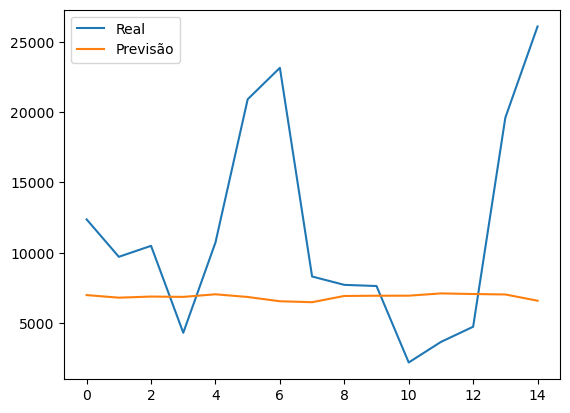

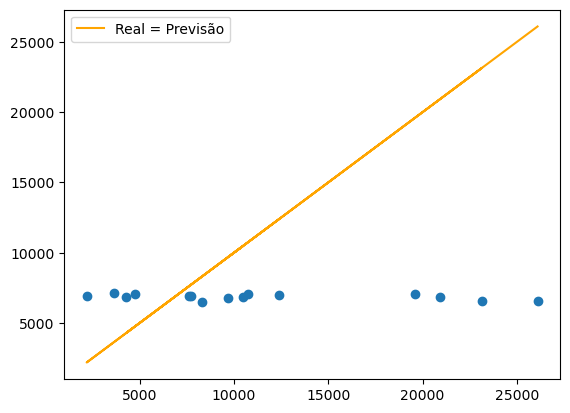

In [777]:
coeficiente = AR_fit.params #encontrar os parâmetros do modelo
passado = fotovoltaica_s_treino[len(fotovoltaica_s_treino)-1:]
passado = [passado[i] for i in range(len(passado))]
fotovoltaica_s_previsao = list() #definir lista no qual se vai guardar os valores previstos
for j in range(len(fotovoltaica_s_teste)):
    comprimento = len(passado)
    passo = [passado[i] for i in range(comprimento-1,comprimento)]
    valor = coeficiente[0]
    for k in range(1):
        valor += coeficiente[k+1] * passo[k]
    observado = fotovoltaica_s_teste[j]
    fotovoltaica_s_previsao.append(valor)
    passado.append(observado)
plt.plot(fotovoltaica_s_teste, label='Real') #desenhar os resultados
plt.plot(fotovoltaica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(fotovoltaica_s_teste, fotovoltaica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(fotovoltaica_s_teste, fotovoltaica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [778]:
MAE = metrics.mean_absolute_error(fotovoltaica_s_teste, fotovoltaica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(fotovoltaica_s_teste - fotovoltaica_s_previsao)
MSE = metrics.mean_squared_error(fotovoltaica_s_teste, fotovoltaica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(fotovoltaica_s_teste, fotovoltaica_s_previsao))
cvRMSE = RMSE / np.mean(fotovoltaica_s_teste)
NMBE = MBE / np.mean(fotovoltaica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
for coluna, valor in zip(colunas_nomes, valores):
    performance[coluna] = [valor]
performance.index = ['A'] #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,6313.828931,4569.791212,7.511072e+07,8666.644308,0.757446,0.39939


#### 4.3.6.3. Floresta Aleatória

In [779]:
FA = RandomForestRegressor(min_samples_leaf=5) #criar modelo
FA.fit(fotovoltaica_e_treino, fotovoltaica_s_treino) #treinar o modelo

RandomForestRegressor(min_samples_leaf=5)

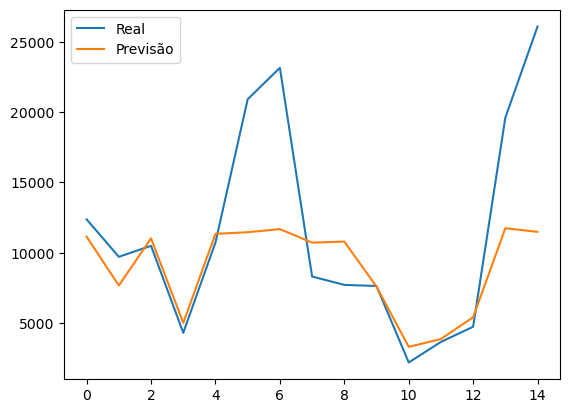

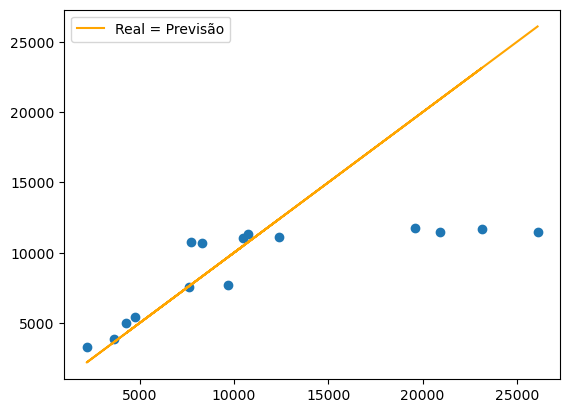

In [780]:
fotovoltaica_s_previsao = FA.predict(fotovoltaica_e_teste) #testar o modelo
plt.plot(fotovoltaica_s_teste, label='Real') #desenhar os resultados
plt.plot(fotovoltaica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(fotovoltaica_s_teste, fotovoltaica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(fotovoltaica_s_teste, fotovoltaica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [781]:
MAE = metrics.mean_absolute_error(fotovoltaica_s_teste, fotovoltaica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(fotovoltaica_s_teste - fotovoltaica_s_previsao)
MSE = metrics.mean_squared_error(fotovoltaica_s_teste, fotovoltaica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(fotovoltaica_s_teste, fotovoltaica_s_previsao))
cvRMSE = RMSE / np.mean(fotovoltaica_s_teste)
NMBE = MBE / np.mean(fotovoltaica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['FA'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,6313.828931,4569.791212,7.511072e+07,8666.644308,0.757446,0.399390
FA,3735.888951,2491.984591,3.466396e+07,5887.610654,0.514564,0.217794


#### 4.3.6.4. Perceptron Multicamadas

In [782]:
PM = MLPRegressor(hidden_layer_sizes=(5,5,5)) #criar modelo
PM.fit(fotovoltaica_e_treino, fotovoltaica_s_treino) #treinar o modelo

C:\Users\mafal\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


MLPRegressor(hidden_layer_sizes=(5, 5, 5))

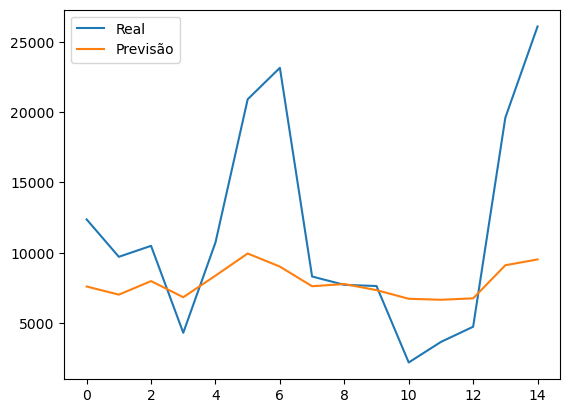

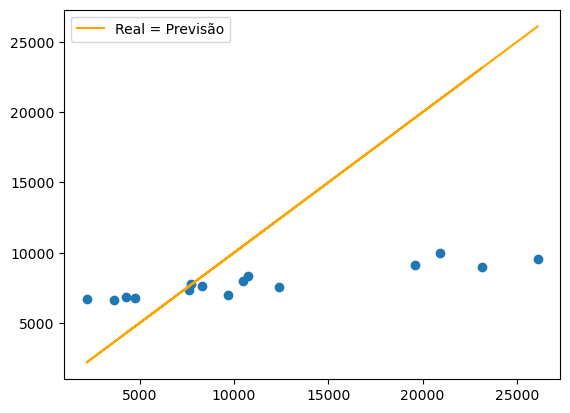

In [783]:
fotovoltaica_s_previsao = PM.predict(fotovoltaica_e_teste) #testar o modelo
plt.plot(fotovoltaica_s_teste, label='Real') #desenhar os resultados
plt.plot(fotovoltaica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(fotovoltaica_s_teste, fotovoltaica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(fotovoltaica_s_teste, fotovoltaica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [784]:
MAE = metrics.mean_absolute_error(fotovoltaica_s_teste, fotovoltaica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(fotovoltaica_s_teste - fotovoltaica_s_previsao)
MSE = metrics.mean_squared_error(fotovoltaica_s_teste, fotovoltaica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(fotovoltaica_s_teste, fotovoltaica_s_previsao))
cvRMSE = RMSE / np.mean(fotovoltaica_s_teste)
NMBE = MBE / np.mean(fotovoltaica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['PM'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,6313.828931,4569.791212,7.511072e+07,8666.644308,0.757446,0.399390
FA,3735.888951,2491.984591,3.466396e+07,5887.610654,0.514564,0.217794
PM,5174.360322,3556.612381,5.248444e+07,7244.614311,0.633163,0.310840


#### 4.3.6.5. Guardar Modelo

Com base nos valores obtidos para a performance do modelo, foi selecionado o que apresentou valores mais baixos (menores erros), correspondendo ao Regressor da Floresta Aleatória.

In [785]:
with open('terceira_fotovoltaica.pkl','wb') as file: #guardar o modelo
    pickle.dump(FA, file)

### 4.3.7. Resíduos

In [786]:
olunas_nomes = ['MAE', 'MBE', 'MSE', 'RMSE', 'cvRMSE', 'NMBE'] #definir nome das colunas
performance = pd.DataFrame(columns=colunas_nomes) #criar dataframe no qual vamos guardar os parâmetros que avaliam a performance para posteriormente comparar

#### 4.3.7.1. Preparação dos Dados

In [787]:
outras = terceira.drop(['Gasóleo', 'Fuelóleo', 'Hídrica', 'Geotérmica', 'Eólica', 'Fotovoltaica', 'Total', 'Gasóleo-1', 'Fuelóleo-1', 'Hídrica-1', 'Geotérmica-1', 'Eólica-1', 'Fotovoltaica-1', 'Total-1'], axis=1)  #eliminar as colunas que não se vão usar
outras_saida = outras.values[:,4]
outras_entradas = outras.values[:,[0,1,2,3,5]]
outras_e_treino, outras_e_teste, outras_s_treino, outras_s_teste = train_test_split(outras_entradas,outras_saida) #definir dados para treino (75%) e para teste (25%)

#### 4.3.7.2. Autoregressão

In [788]:
AR = AutoReg(outras_s_treino, lags=1)
AR_fit = AR.fit()

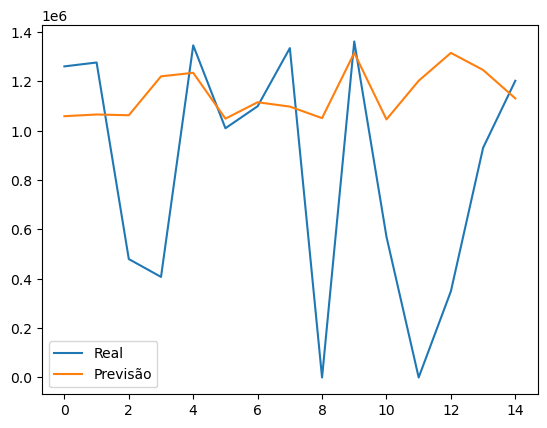

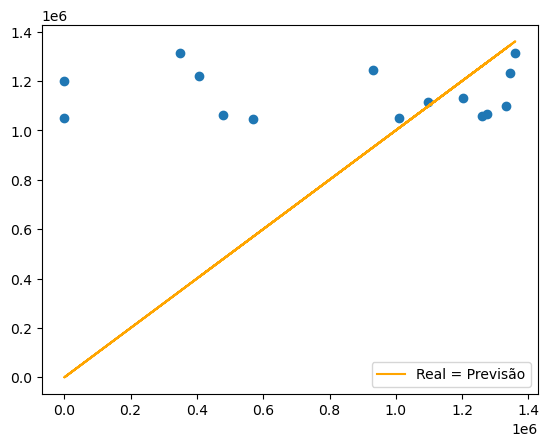

In [789]:
coeficiente = AR_fit.params #encontrar os parâmetros do modelo
passado = outras_s_treino[len(fotovoltaica_s_treino)-1:]
passado = [passado[i] for i in range(len(passado))]
outras_s_previsao = list() #definir lista no qual se vai guardar os valores previstos
for j in range(len(outras_s_teste)):
    comprimento = len(passado)
    passo = [passado[i] for i in range(comprimento-1,comprimento)]
    valor = coeficiente[0]
    for k in range(1):
        valor += coeficiente[k+1] * passo[k]
    observado = outras_s_teste[j]
    outras_s_previsao.append(valor)
    passado.append(observado)
plt.plot(outras_s_teste, label='Real') #desenhar os resultados
plt.plot(outras_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(outras_s_teste, outras_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(outras_s_teste, outras_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [790]:
MAE = metrics.mean_absolute_error(outras_s_teste, outras_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(outras_s_teste - outras_s_previsao)
MSE = metrics.mean_squared_error(outras_s_teste, outras_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(outras_s_teste, outras_s_previsao))
cvRMSE = RMSE / np.mean(outras_s_teste)
NMBE = MBE / np.mean(outras_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
for coluna, valor in zip(colunas_nomes, valores):
    performance[coluna] = [valor]
performance.index = ['A'] #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,422300.364261,-305266.138008,3.309618e+11,575292.786452,0.683857,-0.362873


#### 4.3.7.3. Floresta Aleatória

In [791]:
FA = RandomForestRegressor(min_samples_leaf=5) #criar modelo
FA.fit(outras_e_treino, outras_s_treino) #treinar o modelo

RandomForestRegressor(min_samples_leaf=5)

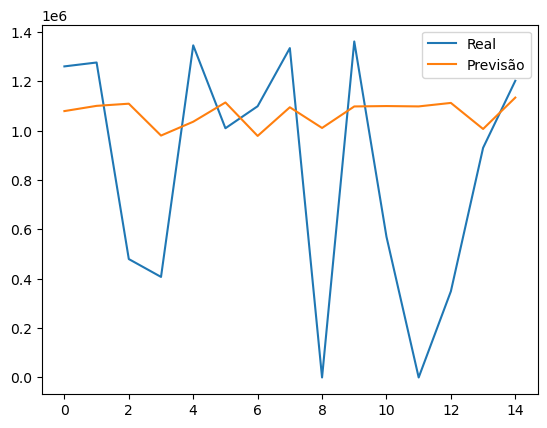

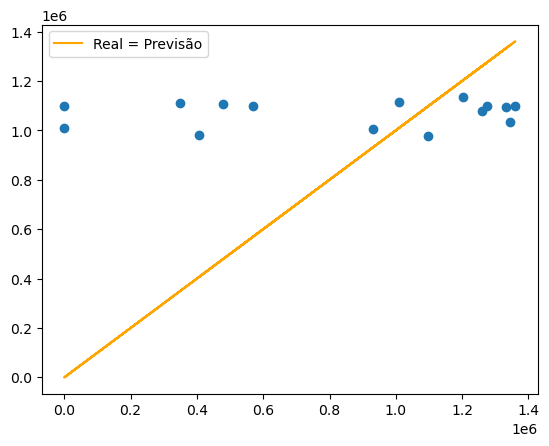

In [792]:
outras_s_previsao = FA.predict(outras_e_teste) #testar o modelo
plt.plot(outras_s_teste, label='Real') #desenhar os resultados
plt.plot(outras_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(outras_s_teste, outras_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(outras_s_teste, outras_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [793]:
MAE = metrics.mean_absolute_error(outras_s_teste, outras_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(outras_s_teste - outras_s_previsao)
MSE = metrics.mean_squared_error(outras_s_teste, outras_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(outras_s_teste, outras_s_previsao))
cvRMSE = RMSE / np.mean(outras_s_teste)
NMBE = MBE / np.mean(outras_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['FA'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,422300.364261,-305266.138008,3.309618e+11,575292.786452,0.683857,-0.362873
FA,409258.886106,-228352.026558,2.754856e+11,524867.179867,0.623916,-0.271445


#### 4.3.7.4. Perceptron Multicamadas

In [794]:
PM = MLPRegressor(hidden_layer_sizes=(5,5,5)) #criar modelo
PM.fit(outras_e_treino, outras_s_treino) #treinar o modelo

C:\Users\mafal\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


MLPRegressor(hidden_layer_sizes=(5, 5, 5))

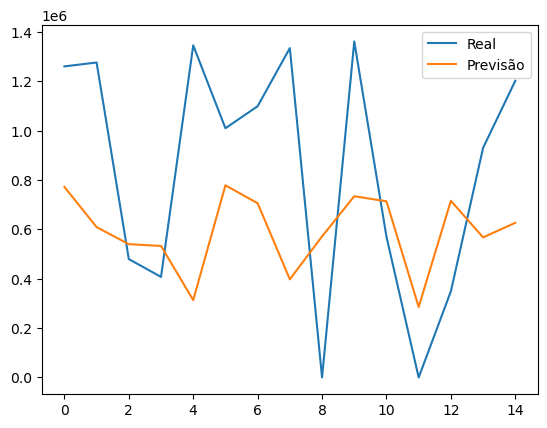

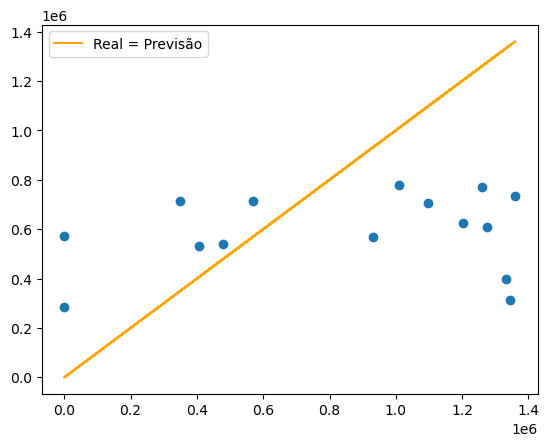

In [795]:
outras_s_previsao = PM.predict(outras_e_teste) #testar o modelo
plt.plot(outras_s_teste, label='Real') #desenhar os resultados
plt.plot(outras_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(outras_s_teste, outras_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(outras_s_teste, outras_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [796]:
MAE = metrics.mean_absolute_error(outras_s_teste, outras_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(outras_s_teste - outras_s_previsao)
MSE = metrics.mean_squared_error(outras_s_teste, outras_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(outras_s_teste, outras_s_previsao))
cvRMSE = RMSE / np.mean(outras_s_teste)
NMBE = MBE / np.mean(outras_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['PM'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,422300.364261,-305266.138008,3.309618e+11,575292.786452,0.683857,-0.362873
FA,409258.886106,-228352.026558,2.754856e+11,524867.179867,0.623916,-0.271445
PM,457496.109485,250563.425430,2.844999e+11,533385.347042,0.634041,0.297848


#### 4.3.7.5. Guardar Modelo

Com base nos valores obtidos para a performance do modelo, foi selecionado o que apresentou valores mais baixos (menores erros), correspondendo ao Regressor da Floresta Aleatória.

In [797]:
with open('terceira_residuos.pkl','wb') as file: #guardar o modelo
    pickle.dump(FA, file)

### 4.4. Graciosa

### 4.4.1. Gasóleo

In [798]:
colunas_nomes = ['MAE', 'MBE', 'MSE', 'RMSE', 'cvRMSE', 'NMBE'] #definir nome das colunas
performance = pd.DataFrame(columns=colunas_nomes) #criar dataframe no qual vamos guardar os parâmetros que avaliam a performance para posteriormente comparar

#### 4.4.1.1. Preparação dos Dados

In [799]:
gasoleo = graciosa.drop(['Eólica', 'Fotovoltaica', 'Total', 'Eólica-1', 'Fotovoltaica-1', 'Total-1'], axis=1)  #eliminar as colunas que não se vão usar
gasoleo_saida = gasoleo.values[:,4]
gasoleo_entradas = gasoleo.values[:,[0,1,2,3,5]]
gasoleo_e_treino, gasoleo_e_teste, gasoleo_s_treino, gasoleo_s_teste = train_test_split(gasoleo_entradas,gasoleo_saida) #definir dados para treino (75%) e para teste (25%)

#### 4.4.1.2. Autoregressão

In [801]:
AR = AutoReg(gasoleo_s_treino, lags=1)
AR_fit = AR.fit()

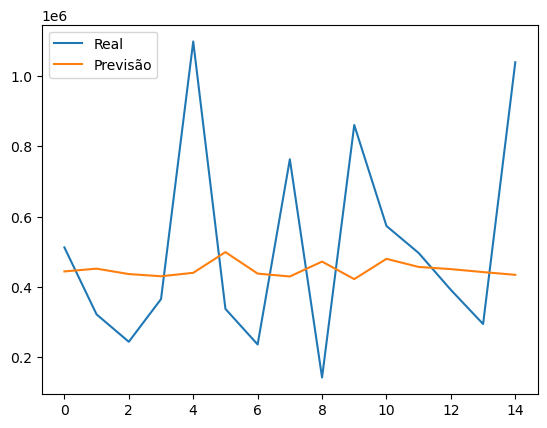

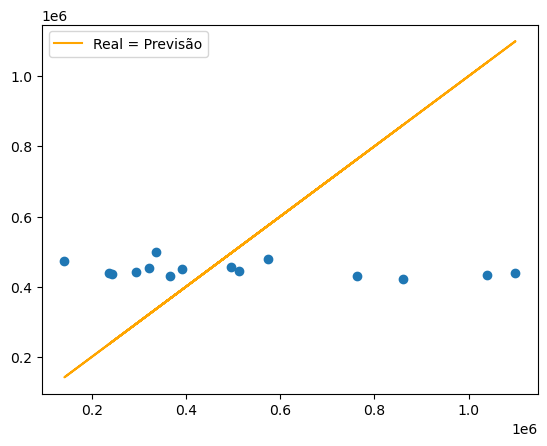

In [802]:
coeficiente = AR_fit.params #encontrar os parâmetros do modelo
passado = gasoleo_s_treino[len(gasoleo_s_treino)-1:]
passado = [passado[i] for i in range(len(passado))]
gasoleo_s_previsao = list() #definir lista no qual se vai guardar os valores previstos
for j in range(len(gasoleo_s_teste)):
    comprimento = len(passado)
    passo = [passado[i] for i in range(comprimento-1,comprimento)]
    valor = coeficiente[0]
    for k in range(1):
        valor += coeficiente[k+1] * passo[k]
    observado = gasoleo_s_teste[j]
    gasoleo_s_previsao.append(valor)
    passado.append(observado)
plt.plot(gasoleo_s_teste, label='Real') #desenhar os resultados
plt.plot(gasoleo_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(gasoleo_s_teste, gasoleo_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(gasoleo_s_teste, gasoleo_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [803]:
MAE = metrics.mean_absolute_error(gasoleo_s_teste, gasoleo_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(gasoleo_s_teste - gasoleo_s_previsao)
MSE = metrics.mean_squared_error(gasoleo_s_teste, gasoleo_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(gasoleo_s_teste, gasoleo_s_previsao))
cvRMSE = RMSE / np.mean(gasoleo_s_teste)
NMBE = MBE / np.mean(gasoleo_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
for coluna, valor in zip(colunas_nomes, valores):
    performance[coluna] = [valor]
performance.index = ['A'] #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,235176.221362,63304.300225,9.195556e+10,303241.750396,0.592441,0.123677


#### 4.4.1.3. Floresta Aleatória

In [804]:
FA = RandomForestRegressor(min_samples_leaf=5) #criar modelo
FA.fit(gasoleo_e_treino, gasoleo_s_treino) #treinar o modelo

RandomForestRegressor(min_samples_leaf=5)

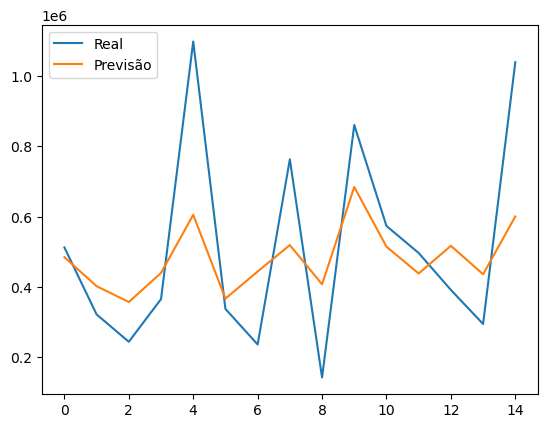

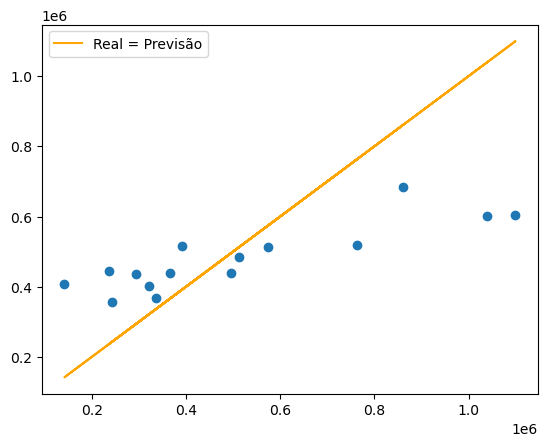

In [805]:
gasoleo_s_previsao = FA.predict(gasoleo_e_teste) #testar o modelo
plt.plot(gasoleo_s_teste, label='Real')
plt.plot(gasoleo_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(gasoleo_s_teste, gasoleo_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(gasoleo_s_teste, gasoleo_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [806]:
MAE = metrics.mean_absolute_error(gasoleo_s_teste, gasoleo_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(gasoleo_s_teste - gasoleo_s_previsao)
MSE = metrics.mean_squared_error(gasoleo_s_teste, gasoleo_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(gasoleo_s_teste, gasoleo_s_previsao))
cvRMSE = RMSE / np.mean(gasoleo_s_teste)
NMBE = MBE / np.mean(gasoleo_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['FA'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,235176.221362,63304.300225,9.195556e+10,303241.750396,0.592441,0.123677
FA,169131.889350,30727.568677,4.734319e+10,217584.896503,0.425094,0.060032


#### 4.4.1.4. Perceptron Multicamadas

In [807]:
PM = MLPRegressor(hidden_layer_sizes=(5,5,5)) #criar modelo
PM.fit(gasoleo_e_treino, gasoleo_s_treino) #treinar o modelo

C:\Users\mafal\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


MLPRegressor(hidden_layer_sizes=(5, 5, 5))

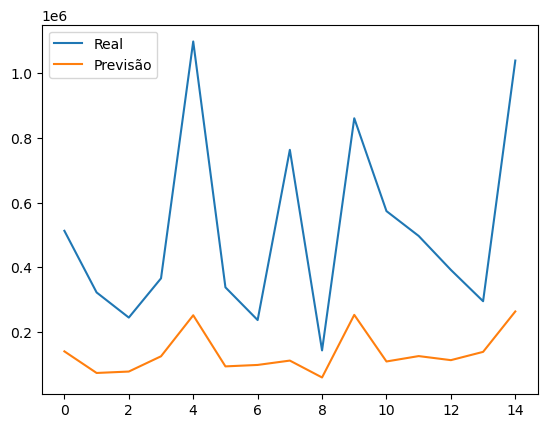

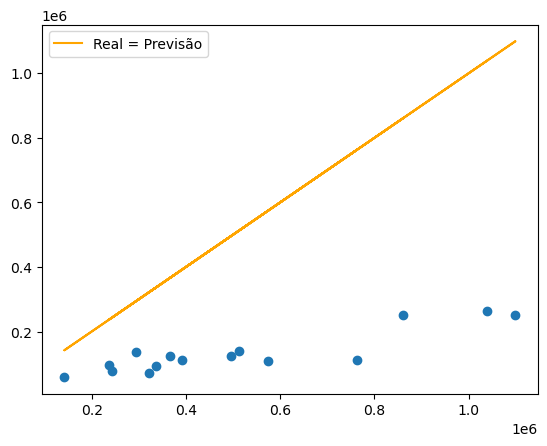

In [808]:
gasoleo_s_previsao = PM.predict(gasoleo_e_teste) #testar o modelo
plt.plot(gasoleo_s_teste, label='Real')
plt.plot(gasoleo_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(gasoleo_s_teste, gasoleo_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(gasoleo_s_teste, gasoleo_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [809]:
MAE = metrics.mean_absolute_error(gasoleo_s_teste, gasoleo_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(gasoleo_s_teste - gasoleo_s_previsao)
MSE = metrics.mean_squared_error(gasoleo_s_teste, gasoleo_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(gasoleo_s_teste, gasoleo_s_previsao))
cvRMSE = RMSE / np.mean(gasoleo_s_teste)
NMBE = MBE / np.mean(gasoleo_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['PM'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,235176.221362,63304.300225,9.195556e+10,303241.750396,0.592441,0.123677
FA,169131.889350,30727.568677,4.734319e+10,217584.896503,0.425094,0.060032
PM,377389.749340,377389.749340,1.968597e+11,443688.797463,0.866832,0.737304


#### 4.4.1.5. Guardar Modelo

Com base nos valores obtidos para a performance do modelo, foi selecionado o que apresentou valores mais baixos (menores erros), correspondendo ao Regressor da Floresta Aleatória.

In [811]:
with open('graciosa_gasoleo.pkl','wb') as file: #guardar o modelo
    pickle.dump(FA, file)

### 4.4.2. Eólica

In [812]:
colunas_nomes = ['MAE', 'MBE', 'MSE', 'RMSE', 'cvRMSE', 'NMBE'] #definir nome das colunas
performance = pd.DataFrame(columns=colunas_nomes) #criar dataframe no qual vamos guardar os parâmetros que avaliam a performance para posteriormente comparar

#### 4.4.2.1. Preparação dos Dados

In [813]:
eolica = graciosa.drop(['Gasóleo', 'Fotovoltaica', 'Total', 'Gasóleo-1', 'Fotovoltaica-1', 'Total-1'], axis=1)  #eliminar as colunas que não se vão usar
eolica_saida = eolica.values[:,4]
eolica_entradas = eolica.values[:,[0,1,2,3,5]]
eolica_e_treino, eolica_e_teste, eolica_s_treino, eolica_s_teste = train_test_split(eolica_entradas,eolica_saida) #definir dados para treino (75%) e para teste (25%)

#### 4.4.2.2. Autoregressão

In [814]:
AR = AutoReg(eolica_s_treino, lags=1)
AR_fit = AR.fit()

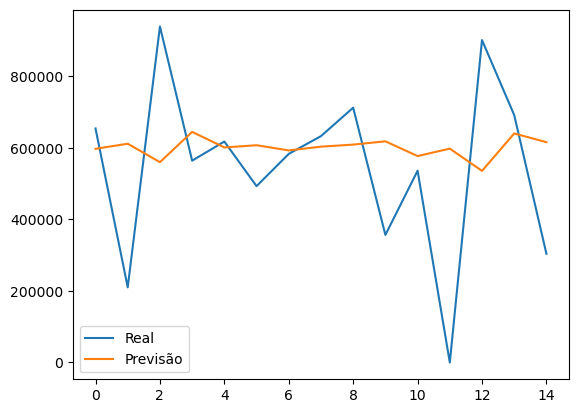

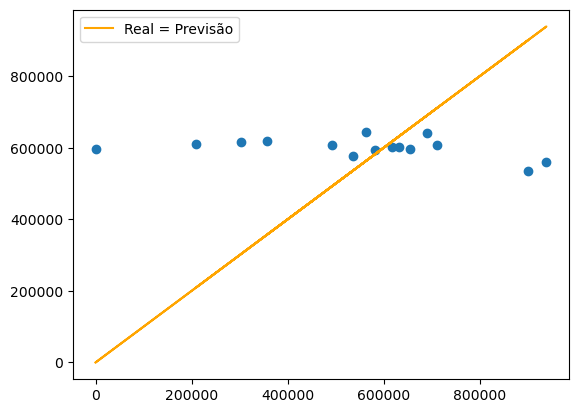

In [815]:
coeficiente = AR_fit.params #encontrar os parâmetros do modelo
passado = eolica_s_treino[len(eolica_s_treino)-1:]
passado = [passado[i] for i in range(len(passado))]
eolica_s_previsao = list() #definir lista no qual se vai guardar os valores previstos
for j in range(len(eolica_s_teste)):
    comprimento = len(passado)
    passo = [passado[i] for i in range(comprimento-1,comprimento)]
    valor = coeficiente[0]
    for k in range(1):
        valor += coeficiente[k+1] * passo[k]
    observado = eolica_s_teste[j]
    eolica_s_previsao.append(valor)
    passado.append(observado)
plt.plot(eolica_s_teste, label='Real') #desenhar os resultados
plt.plot(eolica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(eolica_s_teste, eolica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(eolica_s_teste, eolica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [816]:
MAE = metrics.mean_absolute_error(eolica_s_teste, eolica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(eolica_s_teste - eolica_s_previsao)
MSE = metrics.mean_squared_error(eolica_s_teste, eolica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(eolica_s_teste, eolica_s_previsao))
cvRMSE = RMSE / np.mean(eolica_s_teste)
NMBE = MBE / np.mean(eolica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
for coluna, valor in zip(colunas_nomes, valores):
    performance[coluna] = [valor]
performance.index = ['A'] #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,187966.940679,-54378.342541,6.667093e+10,258207.149794,0.472789,-0.099569


#### 4.4.2.3. Floresta Aleatória

In [817]:
FA = RandomForestRegressor(min_samples_leaf=5) #criar modelo
FA.fit(eolica_e_treino, eolica_s_treino) #treinar o modelo

RandomForestRegressor(min_samples_leaf=5)

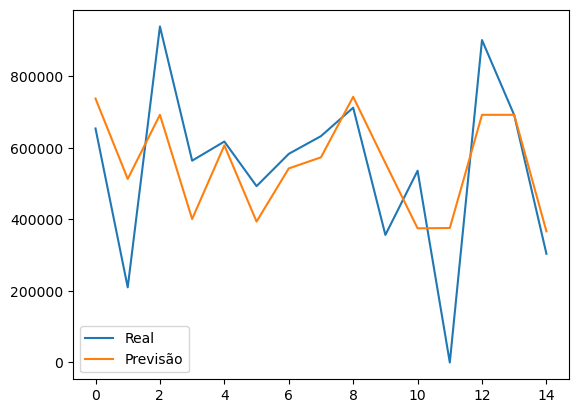

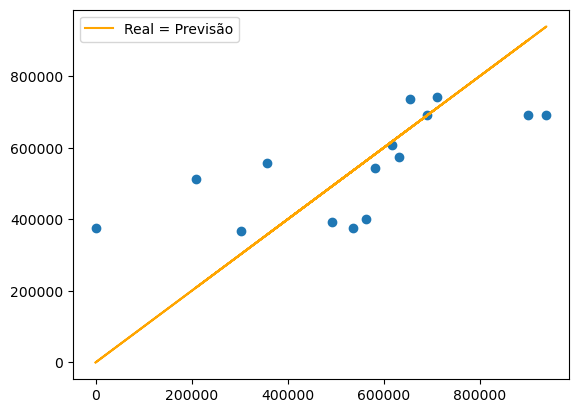

In [818]:
eolica_s_previsao = FA.predict(eolica_e_teste) #testar o modelo
plt.plot(eolica_s_teste, label='Real')
plt.plot(eolica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(eolica_s_teste, eolica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(eolica_s_teste, eolica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [819]:
MAE = metrics.mean_absolute_error(eolica_s_teste, eolica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(eolica_s_teste - eolica_s_previsao)
MSE = metrics.mean_squared_error(eolica_s_teste, eolica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(eolica_s_teste, eolica_s_previsao))
cvRMSE = RMSE / np.mean(eolica_s_teste)
NMBE = MBE / np.mean(eolica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['FA'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,187966.940679,-54378.342541,6.667093e+10,258207.149794,0.472789,-0.099569
FA,136441.729789,-4497.362251,3.048411e+10,174596.992639,0.319695,-0.008235


#### 4.4.2.3. Perceptron Multicamadas

In [820]:
PM = MLPRegressor(hidden_layer_sizes=(5,5,5)) #criar modelo
PM.fit(eolica_e_treino, eolica_s_treino) #treinar o modelo

C:\Users\mafal\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


MLPRegressor(hidden_layer_sizes=(5, 5, 5))

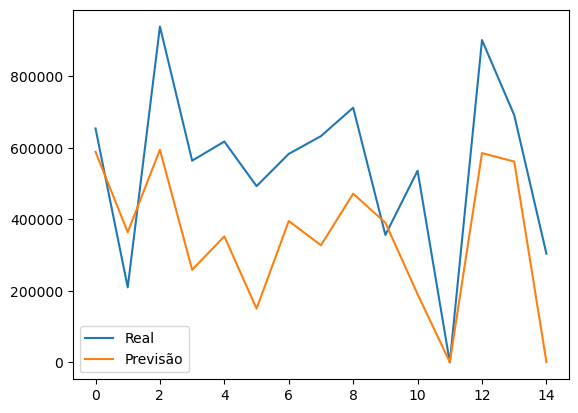

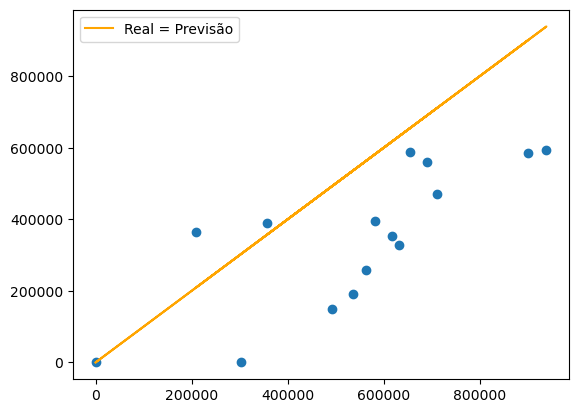

In [821]:
eolica_s_previsao = PM.predict(eolica_e_teste) #testar o modelo
plt.plot(eolica_s_teste, label='Real')
plt.plot(eolica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(eolica_s_teste, eolica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(eolica_s_teste, eolica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [822]:
MAE = metrics.mean_absolute_error(eolica_s_teste, eolica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(eolica_s_teste - eolica_s_previsao)
MSE = metrics.mean_squared_error(eolica_s_teste, eolica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(eolica_s_teste, eolica_s_previsao))
cvRMSE = RMSE / np.mean(eolica_s_teste)
NMBE = MBE / np.mean(eolica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['PM'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,187966.940679,-54378.342541,6.667093e+10,258207.149794,0.472789,-0.099569
FA,136441.729789,-4497.362251,3.048411e+10,174596.992639,0.319695,-0.008235
PM,222482.904162,197265.658328,6.276936e+10,250538.136667,0.458747,0.361202


#### 4.4.2.5. Guardar Modelo

Com base nos valores obtidos para a performance do modelo, foi selecionado o que apresentou valores mais baixos (menores erros), correspondendo ao Regressor da Floresta Aleatória.

In [823]:
with open('graciosa_eolica.pkl','wb') as file: #guardar o modelo
    pickle.dump(FA, file)

### 4.4.3. Fotovoltaica

In [1019]:
colunas_nomes = ['MAE', 'MBE', 'MSE', 'RMSE', 'cvRMSE', 'NMBE'] #definir nome das colunas
performance = pd.DataFrame(columns=colunas_nomes) #criar dataframe no qual vamos guardar os parâmetros que avaliam a performance para posteriormente comparar

#### 4.3.3.1. Preparação dos Dados

In [1020]:
fotovoltaica = graciosa.drop(['Gasóleo', 'Eólica', 'Total', 'Gasóleo-1', 'Eólica-1', 'Total-1'], axis=1)  #eliminar as colunas que não se vão usar
fotovoltaica_saida = fotovoltaica.values[:,4]
fotovoltaica_entradas = fotovoltaica.values[:,[0,1,2,3,5]]
fotovoltaica_e_treino, fotovoltaica_e_teste, fotovoltaica_s_treino, fotovoltaica_s_teste = train_test_split(fotovoltaica_entradas,fotovoltaica_saida) #definir dados para treino (75%) e para teste (25%)

#### 4.4.3.2. Autoregressão

In [1021]:
AR = AutoReg(fotovoltaica_s_treino, lags=1)
AR_fit = AR.fit()

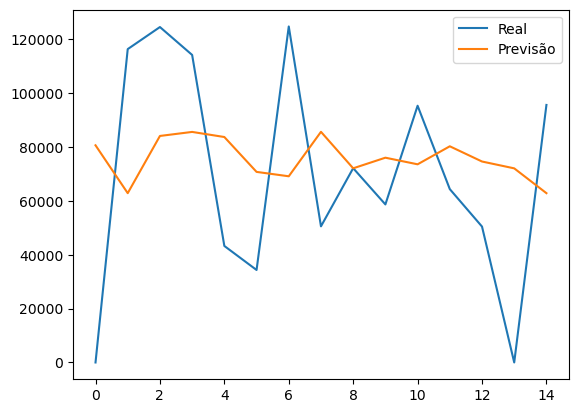

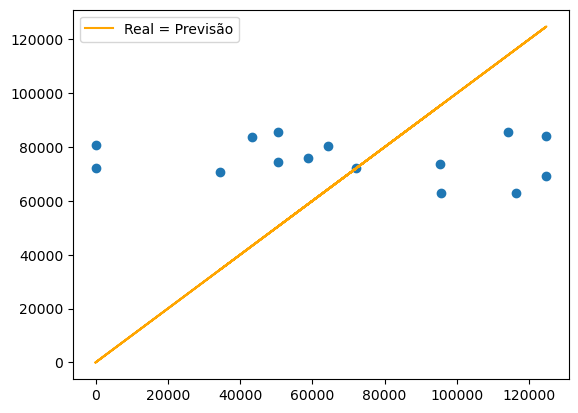

In [1022]:
coeficiente = AR_fit.params #encontrar os parâmetros do modelo
passado = fotovoltaica_s_treino[len(fotovoltaica_s_treino)-1:]
passado = [passado[i] for i in range(len(passado))]
fotovoltaica_s_previsao = list() #definir lista no qual se vai guardar os valores previstos
for j in range(len(fotovoltaica_s_teste)):
    comprimento = len(passado)
    passo = [passado[i] for i in range(comprimento-1,comprimento)]
    valor = coeficiente[0]
    for k in range(1):
        valor += coeficiente[k+1] * passo[k]
    observado = fotovoltaica_s_teste[j]
    fotovoltaica_s_previsao.append(valor)
    passado.append(observado)
plt.plot(fotovoltaica_s_teste, label='Real') #desenhar os resultados
plt.plot(fotovoltaica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(fotovoltaica_s_teste, fotovoltaica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(fotovoltaica_s_teste, fotovoltaica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [1023]:
MAE = metrics.mean_absolute_error(fotovoltaica_s_teste, fotovoltaica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(fotovoltaica_s_teste - fotovoltaica_s_previsao)
MSE = metrics.mean_squared_error(fotovoltaica_s_teste, fotovoltaica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(fotovoltaica_s_teste, fotovoltaica_s_previsao))
cvRMSE = RMSE / np.mean(fotovoltaica_s_teste)
NMBE = MBE / np.mean(fotovoltaica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
for coluna, valor in zip(colunas_nomes, valores):
    performance[coluna] = [valor]
performance.index = ['A'] #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,36991.037149,-5961.044806,1.799404e+09,42419.382152,0.609023,-0.085584


#### 4.4.3.3. Floresta Aleatória

In [1024]:
FA = RandomForestRegressor(min_samples_leaf=5) #criar modelo
FA.fit(fotovoltaica_e_treino, fotovoltaica_s_treino) #treinar o modelo

RandomForestRegressor(min_samples_leaf=5)

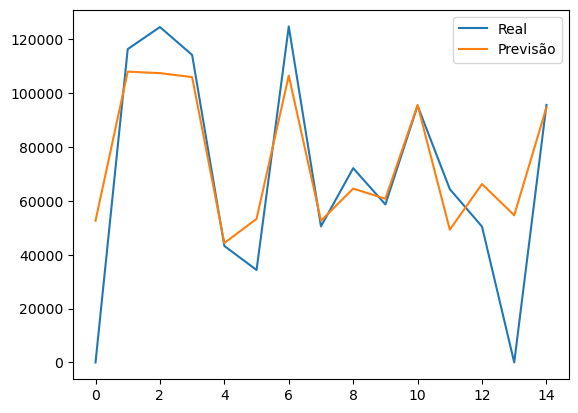

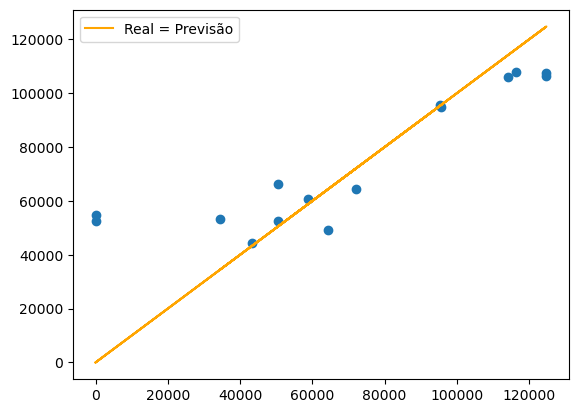

In [1025]:
fotovoltaica_s_previsao = FA.predict(fotovoltaica_e_teste) #testar o modelo
plt.plot(fotovoltaica_s_teste, label='Real') #desenhar os resultados
plt.plot(fotovoltaica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(fotovoltaica_s_teste, fotovoltaica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(fotovoltaica_s_teste, fotovoltaica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [1026]:
MAE = metrics.mean_absolute_error(fotovoltaica_s_teste, fotovoltaica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(fotovoltaica_s_teste - fotovoltaica_s_previsao)
MSE = metrics.mean_squared_error(fotovoltaica_s_teste, fotovoltaica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(fotovoltaica_s_teste, fotovoltaica_s_previsao))
cvRMSE = RMSE / np.mean(fotovoltaica_s_teste)
NMBE = MBE / np.mean(fotovoltaica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['FA'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,36991.037149,-5961.044806,1.799404e+09,42419.382152,0.609023,-0.085584
FA,14880.133333,-4808.804383,4.952203e+08,22253.545043,0.319498,-0.069041


#### 4.4.3.3. Perceptron Multicamadas

In [1027]:
PM = MLPRegressor(hidden_layer_sizes=(5,5,5)) #criar modelo
PM.fit(fotovoltaica_e_treino, fotovoltaica_s_treino) #treinar o modelo

C:\Users\mafal\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


MLPRegressor(hidden_layer_sizes=(5, 5, 5))

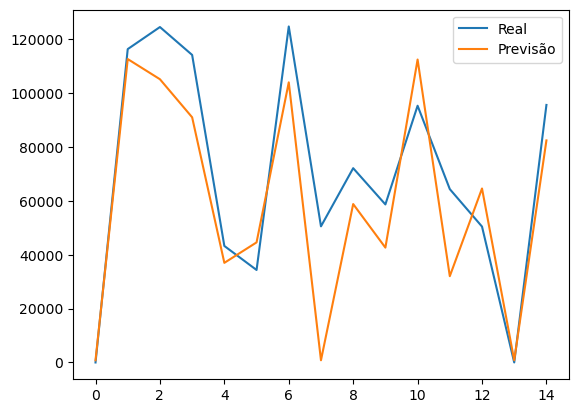

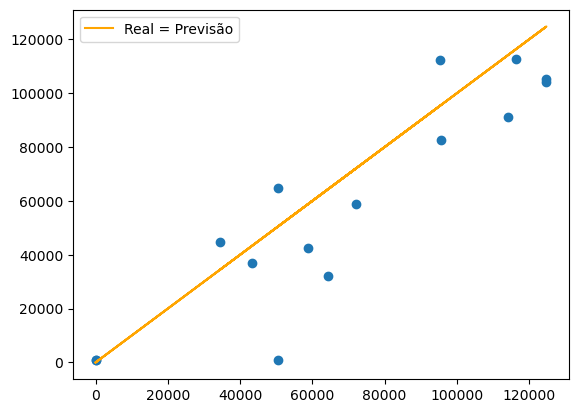

In [1028]:
fotovoltaica_s_previsao = PM.predict(fotovoltaica_e_teste) #testar o modelo
plt.plot(fotovoltaica_s_teste, label='Real') #desenhar os resultados
plt.plot(fotovoltaica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(fotovoltaica_s_teste, fotovoltaica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(fotovoltaica_s_teste, fotovoltaica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [1029]:
MAE = metrics.mean_absolute_error(fotovoltaica_s_teste, fotovoltaica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(fotovoltaica_s_teste - fotovoltaica_s_previsao)
MSE = metrics.mean_squared_error(fotovoltaica_s_teste, fotovoltaica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(fotovoltaica_s_teste, fotovoltaica_s_previsao))
cvRMSE = RMSE / np.mean(fotovoltaica_s_teste)
NMBE = MBE / np.mean(fotovoltaica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['PM'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,36991.037149,-5961.044806,1.799404e+09,42419.382152,0.609023,-0.085584
FA,14880.133333,-4808.804383,4.952203e+08,22253.545043,0.319498,-0.069041
PM,16069.577718,10311.249790,4.081843e+08,20203.570999,0.290066,0.148041


#### 4.4.3.5. Guardar Modelo

Com base nos valores obtidos para a performance do modelo, foi selecionado o que apresentou valores mais baixos (menores erros), correspondendo ao Regressor da Floresta Aleatória.

In [1030]:
with open('graciosa_fotovoltaica.pkl','wb') as file: #guardar o modelo
    pickle.dump(FA, file)

### 4.5. São Jorge

#### 4.5.1. Gasóleo

In [836]:
colunas_nomes = ['MAE', 'MBE', 'MSE', 'RMSE', 'cvRMSE', 'NMBE'] #definir nome das colunas
performance = pd.DataFrame(columns=colunas_nomes) #criar dataframe no qual vamos guardar os parâmetros que avaliam a performance para posteriormente comparar

#### 4.5.1.1. Preparação dos Dados

In [837]:
gasoleo = sao_jorge.drop(['Eólica', 'Fotovoltaica', 'Total', 'Eólica-1', 'Fotovoltaica-1', 'Total-1'], axis=1)  #eliminar as colunas que não se vão usar
gasoleo_saida = gasoleo.values[:,4]
gasoleo_entradas = gasoleo.values[:,[0,1,2,3,5]]
gasoleo_e_treino, gasoleo_e_teste, gasoleo_s_treino, gasoleo_s_teste = train_test_split(gasoleo_entradas,gasoleo_saida) #definir dados para treino (75%) e para teste (25%)

#### 4.5.1.2. Autoregressão

In [838]:
AR = AutoReg(gasoleo_s_treino, lags=1)
AR_fit = AR.fit()

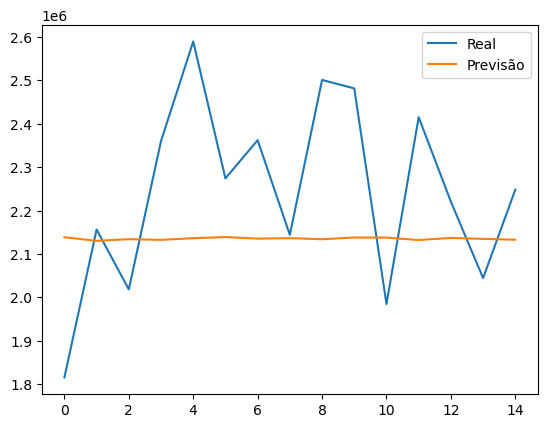

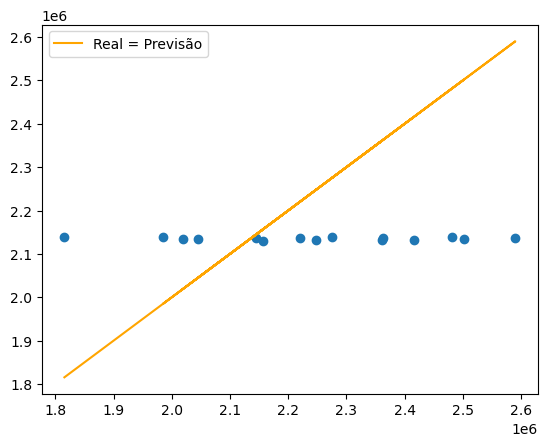

In [839]:
coeficiente = AR_fit.params #encontrar os parâmetros do modelo
passado = gasoleo_s_treino[len(gasoleo_s_treino)-1:]
passado = [passado[i] for i in range(len(passado))]
gasoleo_s_previsao = list() #definir lista no qual se vai guardar os valores previstos
for j in range(len(gasoleo_s_teste)):
    comprimento = len(passado)
    passo = [passado[i] for i in range(comprimento-1,comprimento)]
    valor = coeficiente[0]
    for k in range(1):
        valor += coeficiente[k+1] * passo[k]
    observado = gasoleo_s_teste[j]
    gasoleo_s_previsao.append(valor)
    passado.append(observado)
plt.plot(gasoleo_s_teste, label='Real') #desenhar os resultados
plt.plot(gasoleo_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(gasoleo_s_teste, gasoleo_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(gasoleo_s_teste, gasoleo_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [840]:
MAE = metrics.mean_absolute_error(gasoleo_s_teste, gasoleo_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(gasoleo_s_teste - gasoleo_s_previsao)
MSE = metrics.mean_squared_error(gasoleo_s_teste, gasoleo_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(gasoleo_s_teste, gasoleo_s_previsao))
cvRMSE = RMSE / np.mean(gasoleo_s_teste)
NMBE = MBE / np.mean(gasoleo_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
for coluna, valor in zip(colunas_nomes, valores):
    performance[coluna] = [valor]
performance.index = ['A'] #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,196731.057543,105757.761612,5.533875e+10,235241.902922,0.104959,0.047186


#### 4.5.1.3. Floresta Aleatória

In [841]:
FA = RandomForestRegressor(min_samples_leaf=5) #criar modelo
FA.fit(gasoleo_e_treino, gasoleo_s_treino) #treinar o modelo

RandomForestRegressor(min_samples_leaf=5)

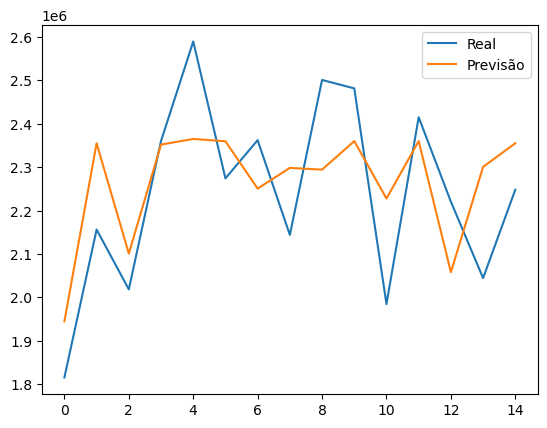

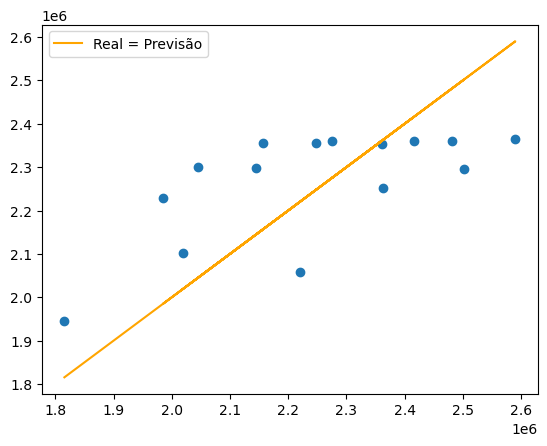

In [842]:
gasoleo_s_previsao = FA.predict(gasoleo_e_teste) #testar o modelo
plt.plot(gasoleo_s_teste, label='Real')
plt.plot(gasoleo_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(gasoleo_s_teste, gasoleo_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(gasoleo_s_teste, gasoleo_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [843]:
MAE = metrics.mean_absolute_error(gasoleo_s_teste, gasoleo_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(gasoleo_s_teste - gasoleo_s_previsao)
MSE = metrics.mean_squared_error(gasoleo_s_teste, gasoleo_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(gasoleo_s_teste, gasoleo_s_previsao))
cvRMSE = RMSE / np.mean(gasoleo_s_teste)
NMBE = MBE / np.mean(gasoleo_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['FA'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,196731.057543,105757.761612,5.533875e+10,235241.902922,0.104959,0.047186
FA,143111.694714,-24464.559024,2.534496e+10,159200.992546,0.071031,-0.010915


#### 4.5.1.4. Perceptron Multicamadas

In [844]:
PM = MLPRegressor(hidden_layer_sizes=(5,5,5)) #criar modelo
PM.fit(gasoleo_e_treino, gasoleo_s_treino) #treinar o modelo

C:\Users\mafal\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


MLPRegressor(hidden_layer_sizes=(5, 5, 5))

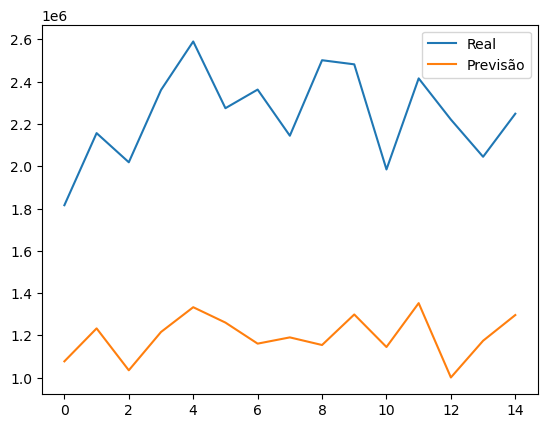

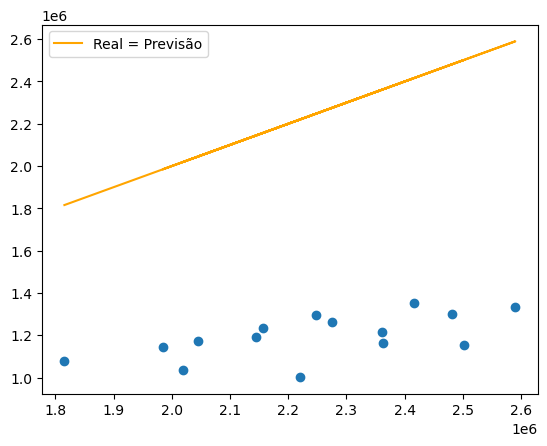

In [845]:
gasoleo_s_previsao = PM.predict(gasoleo_e_teste) #testar o modelo
plt.plot(gasoleo_s_teste, label='Real')
plt.plot(gasoleo_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(gasoleo_s_teste, gasoleo_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(gasoleo_s_teste, gasoleo_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [846]:
MAE = metrics.mean_absolute_error(gasoleo_s_teste, gasoleo_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(gasoleo_s_teste - gasoleo_s_previsao)
MSE = metrics.mean_squared_error(gasoleo_s_teste, gasoleo_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(gasoleo_s_teste, gasoleo_s_previsao))
cvRMSE = RMSE / np.mean(gasoleo_s_teste)
NMBE = MBE / np.mean(gasoleo_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['PM'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,1.967311e+05,1.057578e+05,5.533875e+10,2.352419e+05,0.104959,0.047186
FA,1.431117e+05,-2.446456e+04,2.534496e+10,1.592010e+05,0.071031,-0.010915
PM,1.045731e+06,1.045731e+06,1.121762e+12,1.059133e+06,0.472558,0.466578


#### 4.5.1.5. Guardar Modelo

Com base nos valores obtidos para a performance do modelo, foi selecionado o que apresentou valores mais baixos (menores erros), correspondendo ao Regressor da Floresta Aleatória.

In [848]:
with open('sao_jorge_gasoleo.pkl','wb') as file: #guardar o modelo
    pickle.dump(FA, file)

### 4.5.2. Eólica

In [849]:
colunas_nomes = ['MAE', 'MBE', 'MSE', 'RMSE', 'cvRMSE', 'NMBE'] #definir nome das colunas
performance = pd.DataFrame(columns=colunas_nomes) #criar dataframe no qual vamos guardar os parâmetros que avaliam a performance para posteriormente comparar

#### 4.5.2.1. Preparação dos Dados

In [850]:
eolica = sao_jorge.drop(['Gasóleo', 'Fotovoltaica', 'Total', 'Gasóleo-1', 'Fotovoltaica-1', 'Total-1'], axis=1)  #eliminar as colunas que não se vão usar
eolica_saida = eolica.values[:,4]
eolica_entradas = eolica.values[:,[0,1,2,3,5]]
eolica_e_treino, eolica_e_teste, eolica_s_treino, eolica_s_teste = train_test_split(eolica_entradas,eolica_saida) #definir dados para treino (75%) e para teste (25%)

#### 4.5.2.2. Autoregressão

In [851]:
AR = AutoReg(eolica_s_treino, lags=1)
AR_fit = AR.fit()

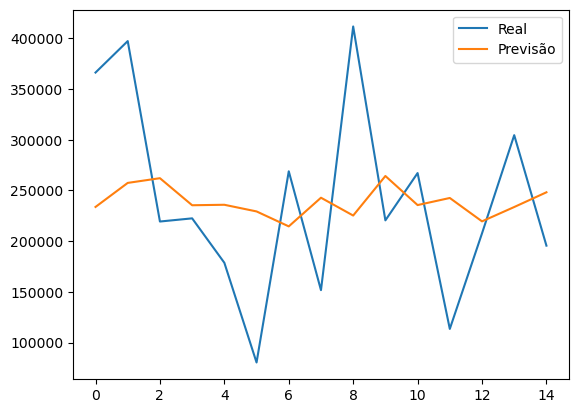

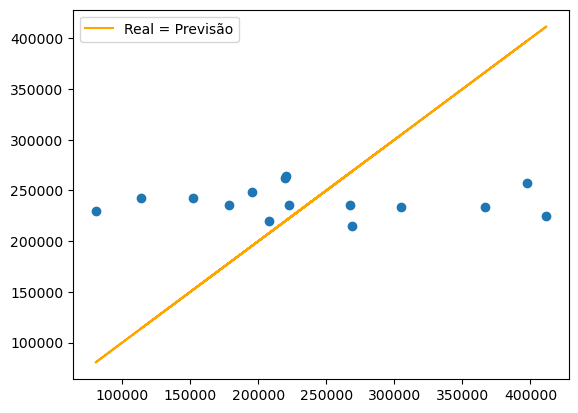

In [852]:
coeficiente = AR_fit.params #encontrar os parâmetros do modelo
passado = eolica_s_treino[len(eolica_s_treino)-1:]
passado = [passado[i] for i in range(len(passado))]
eolica_s_previsao = list() #definir lista no qual se vai guardar os valores previstos
for j in range(len(eolica_s_teste)):
    comprimento = len(passado)
    passo = [passado[i] for i in range(comprimento-1,comprimento)]
    valor = coeficiente[0]
    for k in range(1):
        valor += coeficiente[k+1] * passo[k]
    observado = eolica_s_teste[j]
    eolica_s_previsao.append(valor)
    passado.append(observado)
plt.plot(eolica_s_teste, label='Real') #desenhar os resultados
plt.plot(eolica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(eolica_s_teste, eolica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(eolica_s_teste, eolica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [853]:
MAE = metrics.mean_absolute_error(eolica_s_teste, eolica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(eolica_s_teste - eolica_s_previsao)
MSE = metrics.mean_squared_error(eolica_s_teste, eolica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(eolica_s_teste, eolica_s_previsao))
cvRMSE = RMSE / np.mean(eolica_s_teste)
NMBE = MBE / np.mean(eolica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
for coluna, valor in zip(colunas_nomes, valores):
    performance[coluna] = [valor]
performance.index = ['A'] #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,80389.387911,1687.034331,9.206935e+09,95952.777039,0.399152,0.007018


#### 4.5.2.3. Floresta Aleatória

In [854]:
FA = RandomForestRegressor(min_samples_leaf=5) #criar modelo
FA.fit(eolica_e_treino, eolica_s_treino) #treinar o modelo

RandomForestRegressor(min_samples_leaf=5)

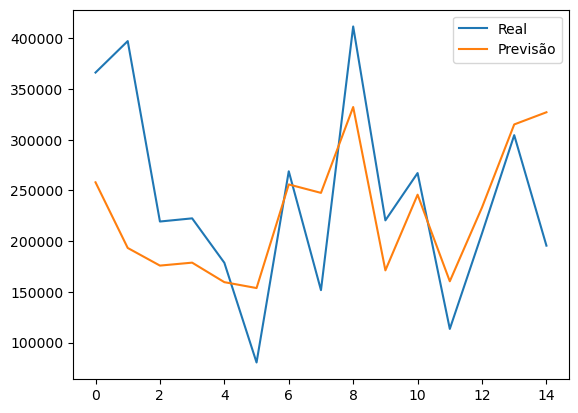

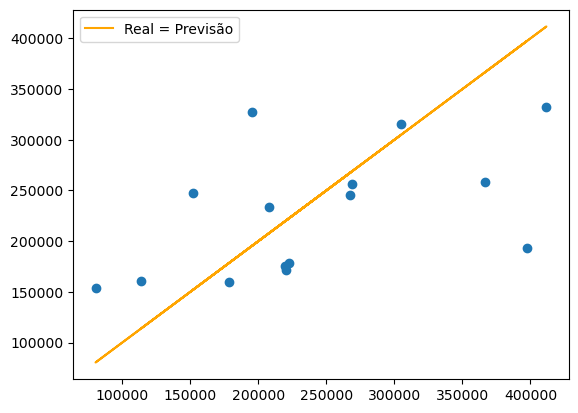

In [855]:
eolica_s_previsao = FA.predict(eolica_e_teste) #testar o modelo
plt.plot(eolica_s_teste, label='Real')
plt.plot(eolica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(eolica_s_teste, eolica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(eolica_s_teste, eolica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [856]:
MAE = metrics.mean_absolute_error(eolica_s_teste, eolica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(eolica_s_teste - eolica_s_previsao)
MSE = metrics.mean_squared_error(eolica_s_teste, eolica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(eolica_s_teste, eolica_s_previsao))
cvRMSE = RMSE / np.mean(eolica_s_teste)
NMBE = MBE / np.mean(eolica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['FA'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,80389.387911,1687.034331,9.206935e+09,95952.777039,0.399152,0.007018
FA,64366.136204,13171.152596,6.781339e+09,82348.883275,0.342562,0.054790


#### 4.5.2.3. Perceptron Multicamadas

In [857]:
PM = MLPRegressor(hidden_layer_sizes=(5,5,5)) #criar modelo
PM.fit(eolica_e_treino, eolica_s_treino) #treinar o modelo

MLPRegressor(hidden_layer_sizes=(5, 5, 5))

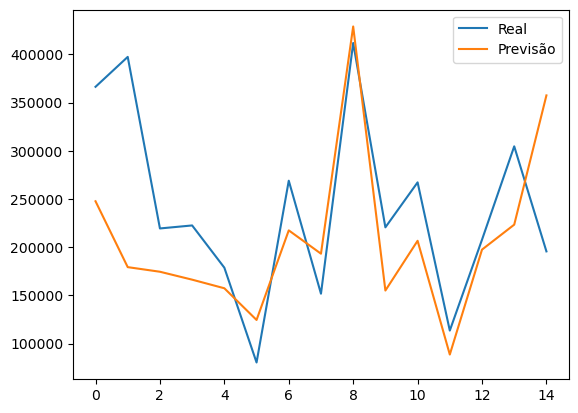

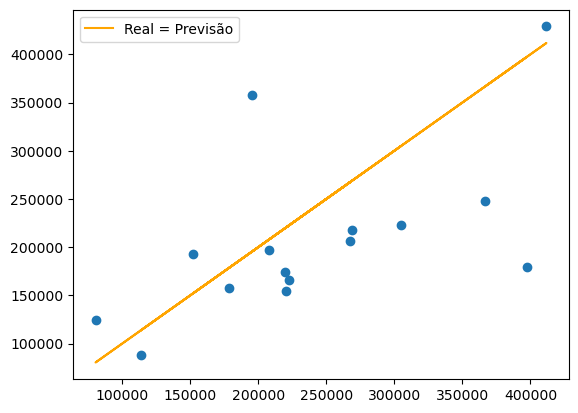

In [858]:
eolica_s_previsao = PM.predict(eolica_e_teste) #testar o modelo
plt.plot(eolica_s_teste, label='Real')
plt.plot(eolica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(eolica_s_teste, eolica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(eolica_s_teste, eolica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [859]:
MAE = metrics.mean_absolute_error(eolica_s_teste, eolica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(eolica_s_teste - eolica_s_previsao)
MSE = metrics.mean_squared_error(eolica_s_teste, eolica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(eolica_s_teste, eolica_s_previsao))
cvRMSE = RMSE / np.mean(eolica_s_teste)
NMBE = MBE / np.mean(eolica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['PM'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,80389.387911,1687.034331,9.206935e+09,95952.777039,0.399152,0.007018
FA,64366.136204,13171.152596,6.781339e+09,82348.883275,0.342562,0.054790
PM,67848.518732,32581.400393,7.689431e+09,87689.402921,0.364778,0.135535


#### 4.5.2.5. Guardar Modelo

Com base nos valores obtidos para a performance do modelo, foi selecionado o que apresentou valores mais baixos (menores erros), correspondendo ao Regressor da Floresta Aleatória.

In [860]:
with open('sao_jorge_eolica.pkl','wb') as file: #guardar o modelo
    pickle.dump(FA, file)

### 4.5.3. Fotovoltaica

In [1031]:
colunas_nomes = ['MAE', 'MBE', 'MSE', 'RMSE', 'cvRMSE', 'NMBE'] #definir nome das colunas
performance = pd.DataFrame(columns=colunas_nomes) #criar dataframe no qual vamos guardar os parâmetros que avaliam a performance para posteriormente comparar

#### 4.5.3.1. Preparação dos Dados

In [1032]:
fotovoltaica = sao_jorge.drop(['Gasóleo', 'Eólica', 'Total', 'Gasóleo-1', 'Eólica-1', 'Total-1'], axis=1)  #eliminar as colunas que não se vão usar
fotovoltaica_saida = fotovoltaica.values[:,4]
fotovoltaica_entradas = fotovoltaica.values[:,[0,1,2,3,5]]
fotovoltaica_e_treino, fotovoltaica_e_teste, fotovoltaica_s_treino, fotovoltaica_s_teste = train_test_split(fotovoltaica_entradas,fotovoltaica_saida) #definir dados para treino (75%) e para teste (25%)

#### 4.5.3.2. Autoregressão

In [1033]:
AR = AutoReg(fotovoltaica_s_treino, lags=1)
AR_fit = AR.fit()

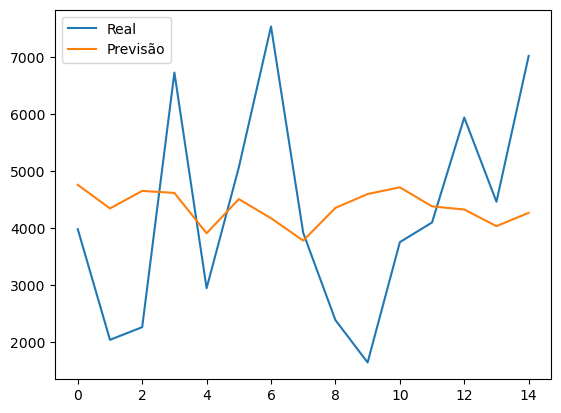

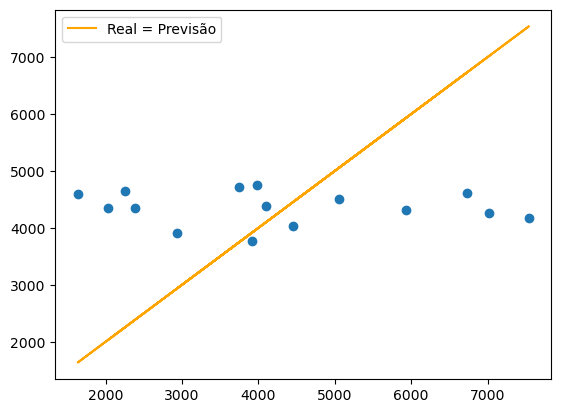

In [1034]:
coeficiente = AR_fit.params #encontrar os parâmetros do modelo
passado = fotovoltaica_s_treino[len(fotovoltaica_s_treino)-1:]
passado = [passado[i] for i in range(len(passado))]
fotovoltaica_s_previsao = list() #definir lista no qual se vai guardar os valores previstos
for j in range(len(fotovoltaica_s_teste)):
    comprimento = len(passado)
    passo = [passado[i] for i in range(comprimento-1,comprimento)]
    valor = coeficiente[0]
    for k in range(1):
        valor += coeficiente[k+1] * passo[k]
    observado = fotovoltaica_s_teste[j]
    fotovoltaica_s_previsao.append(valor)
    passado.append(observado)
plt.plot(fotovoltaica_s_teste, label='Real') #desenhar os resultados
plt.plot(fotovoltaica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(fotovoltaica_s_teste, fotovoltaica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(fotovoltaica_s_teste, fotovoltaica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [1035]:
MAE = metrics.mean_absolute_error(fotovoltaica_s_teste, fotovoltaica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(fotovoltaica_s_teste - fotovoltaica_s_previsao)
MSE = metrics.mean_squared_error(fotovoltaica_s_teste, fotovoltaica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(fotovoltaica_s_teste, fotovoltaica_s_previsao))
cvRMSE = RMSE / np.mean(fotovoltaica_s_teste)
NMBE = MBE / np.mean(fotovoltaica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
for coluna, valor in zip(colunas_nomes, valores):
    performance[coluna] = [valor]
performance.index = ['A'] #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,1572.830049,-109.720503,3.517078e+06,1875.387312,0.441455,-0.025828


#### 4.5.3.3. Floresta Aleatória

In [1036]:
FA = RandomForestRegressor(min_samples_leaf=5) #criar modelo
FA.fit(fotovoltaica_e_treino, fotovoltaica_s_treino) #treinar o modelo

RandomForestRegressor(min_samples_leaf=5)

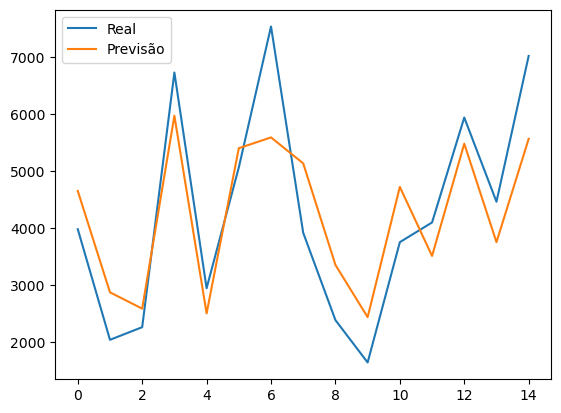

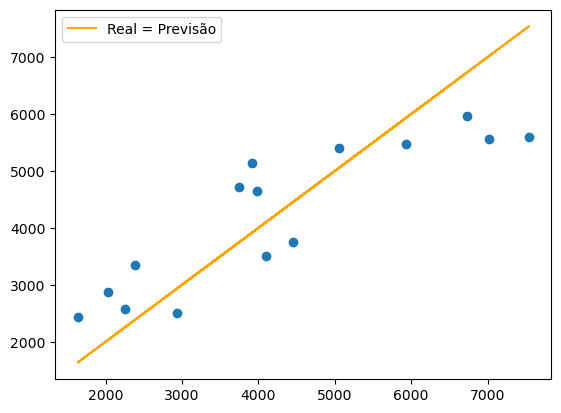

In [1037]:
fotovoltaica_s_previsao = FA.predict(fotovoltaica_e_teste) #testar o modelo
plt.plot(fotovoltaica_s_teste, label='Real') #desenhar os resultados
plt.plot(fotovoltaica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(fotovoltaica_s_teste, fotovoltaica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(fotovoltaica_s_teste, fotovoltaica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [1038]:
MAE = metrics.mean_absolute_error(fotovoltaica_s_teste, fotovoltaica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(fotovoltaica_s_teste - fotovoltaica_s_previsao)
MSE = metrics.mean_squared_error(fotovoltaica_s_teste, fotovoltaica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(fotovoltaica_s_teste, fotovoltaica_s_previsao))
cvRMSE = RMSE / np.mean(fotovoltaica_s_teste)
NMBE = MBE / np.mean(fotovoltaica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['FA'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,1572.830049,-109.720503,3.517078e+06,1875.387312,0.441455,-0.025828
FA,832.576649,15.997211,8.746717e+05,935.238824,0.220149,0.003766


#### 4.5.3.3. Perceptron Multicamadas

In [1039]:
PM = MLPRegressor(hidden_layer_sizes=(5,5,5)) #criar modelo
PM.fit(fotovoltaica_e_treino, fotovoltaica_s_treino) #treinar o modelo

C:\Users\mafal\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


MLPRegressor(hidden_layer_sizes=(5, 5, 5))

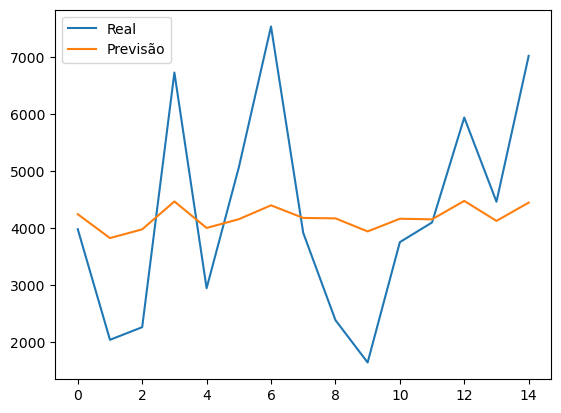

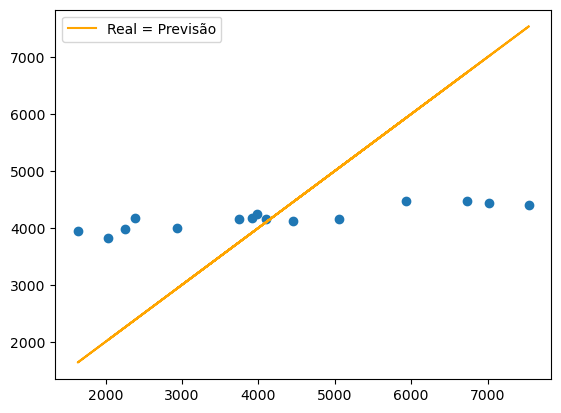

In [1040]:
fotovoltaica_s_previsao = PM.predict(fotovoltaica_e_teste) #testar o modelo
plt.plot(fotovoltaica_s_teste, label='Real') #desenhar os resultados
plt.plot(fotovoltaica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(fotovoltaica_s_teste, fotovoltaica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(fotovoltaica_s_teste, fotovoltaica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [1041]:
MAE = metrics.mean_absolute_error(fotovoltaica_s_teste, fotovoltaica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(fotovoltaica_s_teste - fotovoltaica_s_previsao)
MSE = metrics.mean_squared_error(fotovoltaica_s_teste, fotovoltaica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(fotovoltaica_s_teste, fotovoltaica_s_previsao))
cvRMSE = RMSE / np.mean(fotovoltaica_s_teste)
NMBE = MBE / np.mean(fotovoltaica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['PM'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,1572.830049,-109.720503,3.517078e+06,1875.387312,0.441455,-0.025828
FA,832.576649,15.997211,8.746717e+05,935.238824,0.220149,0.003766
PM,1355.596122,69.893379,2.718581e+06,1648.811968,0.388120,0.016452


#### 4.5.3.5. Guardar Modelo

Com base nos valores obtidos para a performance do modelo, foi selecionado o que apresentou valores mais baixos (menores erros), correspondendo ao Regressor da Floresta Aleatória.

In [1042]:
with open('sao_jorge_fotovoltaica.pkl','wb') as file: #guardar o modelo
    pickle.dump(FA, file)

### 4.6. Pico

### 4.6.1. Fuelóleo 

In [908]:
colunas_nomes = ['MAE', 'MBE', 'MSE', 'RMSE', 'cvRMSE', 'NMBE'] #definir nome das colunas
performance = pd.DataFrame(columns=colunas_nomes) #criar dataframe no qual vamos guardar os parâmetros que avaliam a performance para posteriormente comparar

#### 4.6.1.1. Preparação dos Dados

In [909]:
fueloleo = pico.drop(['Gasóleo', 'Eólica', 'Fotovoltaica', 'Total', 'Gasóleo-1', 'Eólica-1', 'Fotovoltaica-1', 'Total-1'], axis=1)  #eliminar as colunas que não se vão usar
fueloleo_saida = fueloleo.values[:,4]
fueloleo_entradas = fueloleo.values[:,[0,1,2,3,5]]
fueloleo_e_treino, fueloleo_e_teste, fueloleo_s_treino, fueloleo_s_teste = train_test_split(fueloleo_entradas,fueloleo_saida) #definir dados para treino (75%) e para teste (25%)

#### 4.6.1.2. Autoregressão

In [911]:
AR = AutoReg(fueloleo_s_treino, lags=1)
AR_fit = AR.fit()

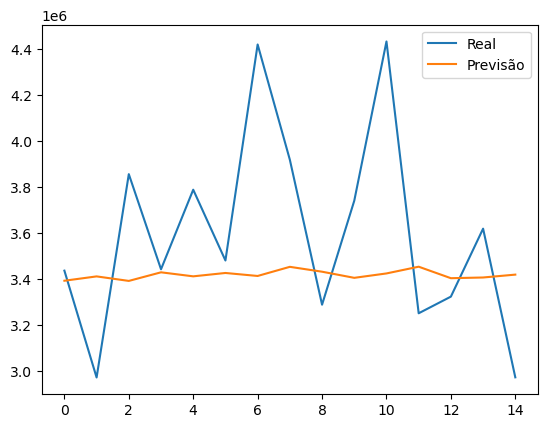

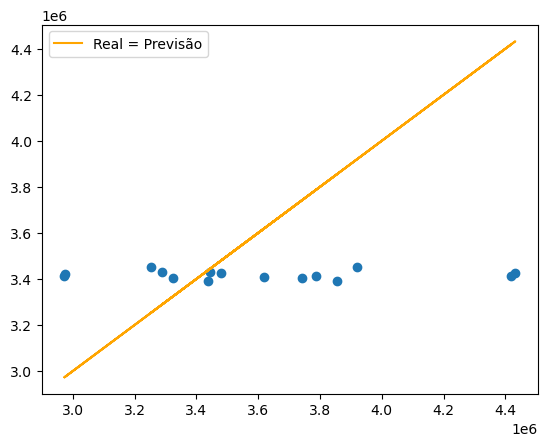

In [912]:
coeficiente = AR_fit.params #encontrar os parâmetros do modelo
passado = fueloleo_s_treino[len(fueloleo_s_treino)-1:]
passado = [passado[i] for i in range(len(passado))]
fueloleo_s_previsao = list() #definir lista no qual se vai guardar os valores previstos
for j in range(len(fueloleo_s_teste)):
    comprimento = len(passado)
    passo = [passado[i] for i in range(comprimento-1,comprimento)]
    valor = coeficiente[0]
    for k in range(1):
        valor += coeficiente[k+1] * passo[k]
    observado = fueloleo_s_teste[j]
    fueloleo_s_previsao.append(valor)
    passado.append(observado)
plt.plot(fueloleo_s_teste, label='Real') #desenhar os resultados
plt.plot(fueloleo_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(fueloleo_s_teste, fueloleo_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(fueloleo_s_teste, fueloleo_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [913]:
MAE = metrics.mean_absolute_error(fueloleo_s_teste, fueloleo_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(fueloleo_s_teste - fueloleo_s_previsao)
MSE = metrics.mean_squared_error(fueloleo_s_teste, fueloleo_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(fueloleo_s_teste, fueloleo_s_previsao))
cvRMSE = RMSE / np.mean(fueloleo_s_teste)
NMBE = MBE / np.mean(fueloleo_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
for coluna, valor in zip(colunas_nomes, valores):
    performance[coluna] = [valor]
performance.index = ['A'] #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,352539.281739,177745.820344,2.148032e+11,463468.637481,0.128882,0.049428


#### 4.6.1.3. Floresta Aleatória

In [914]:
FA = RandomForestRegressor(min_samples_leaf=5) #criar modelo
FA.fit(fueloleo_e_treino, fueloleo_s_treino) #treinar o modelo

RandomForestRegressor(min_samples_leaf=5)

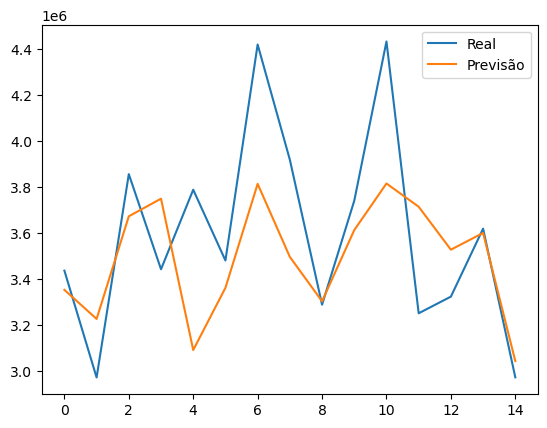

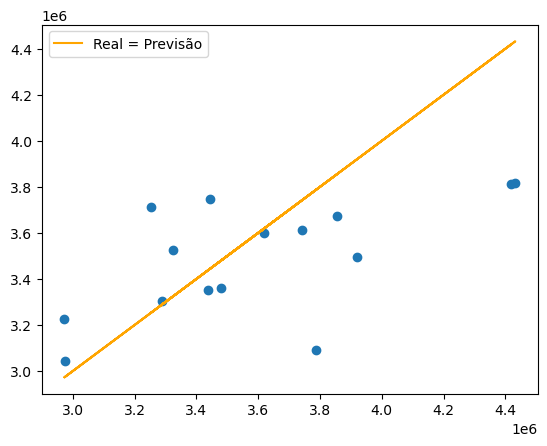

In [915]:
fueloleo_s_previsao = FA.predict(fueloleo_e_teste) #testar o modelo
plt.plot(fueloleo_s_teste, label='Real') #desenhar os resultados
plt.plot(fueloleo_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(fueloleo_s_teste, fueloleo_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(fueloleo_s_teste, fueloleo_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [916]:
MAE = metrics.mean_absolute_error(fueloleo_s_teste, fueloleo_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(fueloleo_s_teste - fueloleo_s_previsao)
MSE = metrics.mean_squared_error(fueloleo_s_teste, fueloleo_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(fueloleo_s_teste, fueloleo_s_previsao))
cvRMSE = RMSE / np.mean(fueloleo_s_teste)
NMBE = MBE / np.mean(fueloleo_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['FA'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,352539.281739,177745.820344,2.148032e+11,463468.637481,0.128882,0.049428
FA,279036.250472,103958.701252,1.267617e+11,356036.124123,0.099007,0.028909


#### 4.6.1.4. Perceptron Multicamadas

In [917]:
PM = MLPRegressor(hidden_layer_sizes=(5,5,5)) #criar modelo
PM.fit(fueloleo_e_treino, fueloleo_s_treino) #treinar o modelo

MLPRegressor(hidden_layer_sizes=(5, 5, 5))

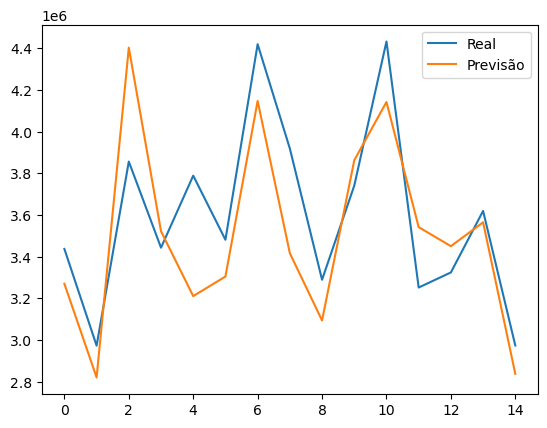

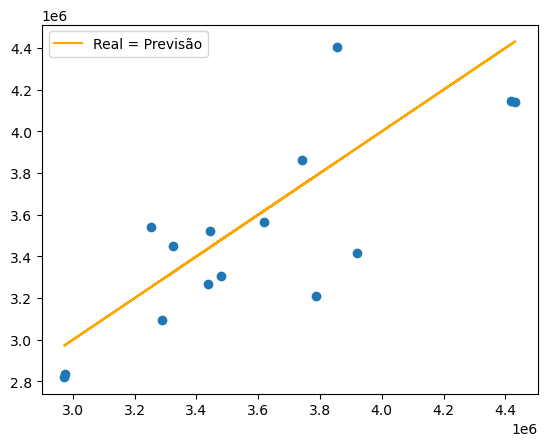

In [918]:
fueloleo_s_previsao = PM.predict(fueloleo_e_teste) #testar o modelo
plt.plot(fueloleo_s_teste, label='Real') #desenhar os resultados
plt.plot(fueloleo_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(fueloleo_s_teste, fueloleo_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(fueloleo_s_teste, fueloleo_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [919]:
MAE = metrics.mean_absolute_error(fueloleo_s_teste, fueloleo_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(fueloleo_s_teste - fueloleo_s_previsao)
MSE = metrics.mean_squared_error(fueloleo_s_teste, fueloleo_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(fueloleo_s_teste, fueloleo_s_previsao))
cvRMSE = RMSE / np.mean(fueloleo_s_teste)
NMBE = MBE / np.mean(fueloleo_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['PM'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,352539.281739,177745.820344,2.148032e+11,463468.637481,0.128882,0.049428
FA,279036.250472,103958.701252,1.267617e+11,356036.124123,0.099007,0.028909
PM,245892.358921,90839.731112,8.711744e+10,295156.631901,0.082077,0.025261


#### 4.6.1.5. Guardar Modelo

Com base nos valores obtidos para a performance do modelo, foi selecionado o que apresentou valores mais baixos (menores erros), correspondendo ao Regressor da Perceptron Multicamadas.

In [921]:
with open('pico_fueloleo.pkl','wb') as file: #guardar o modelo
    pickle.dump(PM, file)

### 4.6.2. Gasóleo

In [478]:
colunas_nomes = ['MAE', 'MBE', 'MSE', 'RMSE', 'cvRMSE', 'NMBE'] #definir nome das colunas
performance = pd.DataFrame(columns=colunas_nomes) #criar dataframe no qual vamos guardar os parâmetros que avaliam a performance para posteriormente comparar

#### 4.6.2.1. Preparação dos Dados

In [479]:
gasoleo = pico.drop(['Fuelóleo', 'Eólica', 'Fotovoltaica', 'Total', 'Fuelóleo-1', 'Eólica-1', 'Fotovoltaica-1', 'Total-1'], axis=1)  #eliminar as colunas que não se vão usar
gasoleo_saida = gasoleo.values[:,4]
gasoleo_entradas = gasoleo.values[:,[0,1,2,3,5]]
gasoleo_e_treino, gasoleo_e_teste, gasoleo_s_treino, gasoleo_s_teste = train_test_split(gasoleo_entradas,gasoleo_saida) #definir dados para treino (75%) e para teste (25%)

#### 4.6.2.2. Autoregressão

In [480]:
AR = AutoReg(gasoleo_s_treino, lags=1)
AR_fit = AR.fit()

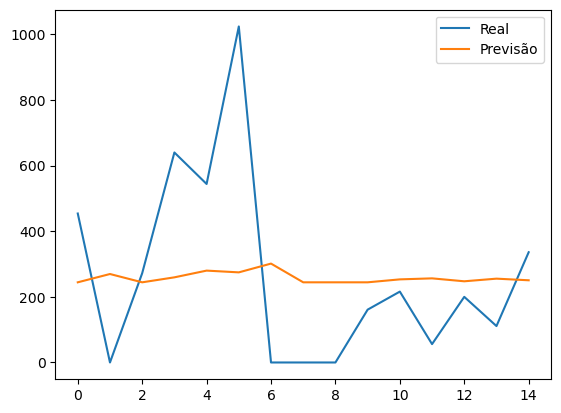

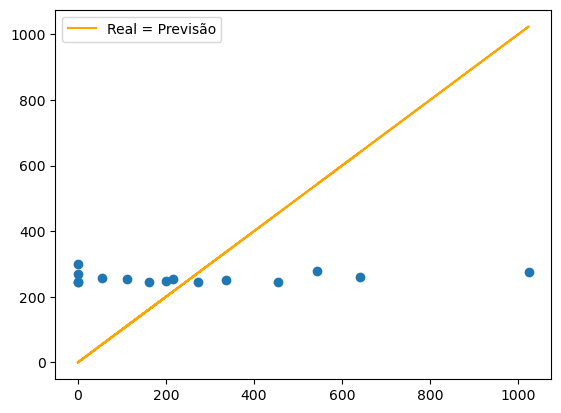

In [481]:
coeficiente = AR_fit.params #encontrar os parâmetros do modelo
passado = gasoleo_s_treino[len(gasoleo_s_treino)-1:]
passado = [passado[i] for i in range(len(passado))]
gasoleo_s_previsao = list() #definir lista no qual se vai guardar os valores previstos
for j in range(len(gasoleo_s_teste)):
    comprimento = len(passado)
    passo = [passado[i] for i in range(comprimento-1,comprimento)]
    valor = coeficiente[0]
    for k in range(1):
        valor += coeficiente[k+1] * passo[k]
    observado = gasoleo_s_teste[j]
    gasoleo_s_previsao.append(valor)
    passado.append(observado)
plt.plot(gasoleo_s_teste, label='Real') #desenhar os resultados
plt.plot(gasoleo_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(gasoleo_s_teste, gasoleo_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(gasoleo_s_teste, gasoleo_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [482]:
MAE = metrics.mean_absolute_error(gasoleo_s_teste, gasoleo_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(gasoleo_s_teste - gasoleo_s_previsao)
MSE = metrics.mean_squared_error(gasoleo_s_teste, gasoleo_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(gasoleo_s_teste, gasoleo_s_previsao))
cvRMSE = RMSE / np.mean(gasoleo_s_teste)
NMBE = MBE / np.mean(gasoleo_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
for coluna, valor in zip(colunas_nomes, valores):
    performance[coluna] = [valor]
performance.index = ['A'] #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,219.282463,9.628628,78840.133993,280.784854,1.049271,0.035981


#### 4.6.2.3. Floresta Aleatória

In [483]:
FA = RandomForestRegressor(min_samples_leaf=5) #criar modelo
FA.fit(gasoleo_e_treino, gasoleo_s_treino) #treinar o modelo

RandomForestRegressor(min_samples_leaf=5)

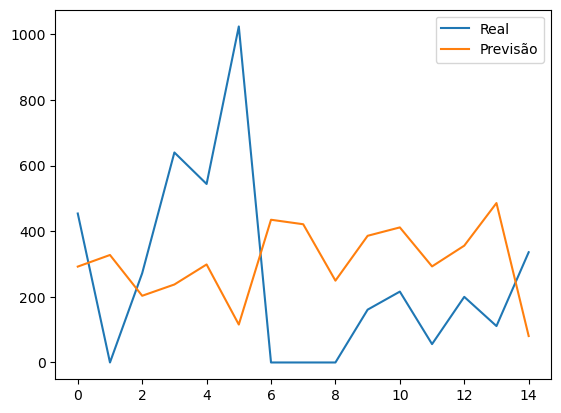

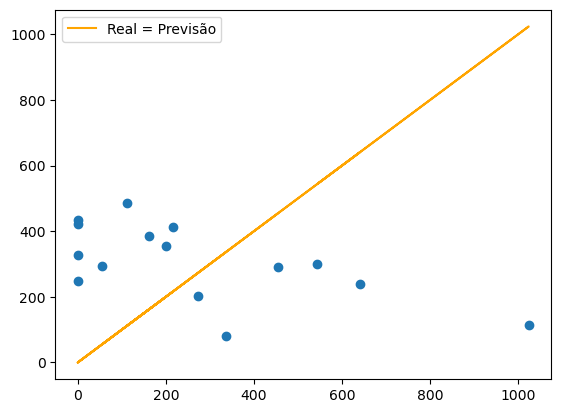

In [484]:
gasoleo_s_previsao = FA.predict(gasoleo_e_teste) #testar o modelo
plt.plot(gasoleo_s_teste, label='Real')
plt.plot(gasoleo_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(gasoleo_s_teste, gasoleo_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(gasoleo_s_teste, gasoleo_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [485]:
MAE = metrics.mean_absolute_error(gasoleo_s_teste, gasoleo_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(gasoleo_s_teste - gasoleo_s_previsao)
MSE = metrics.mean_squared_error(gasoleo_s_teste, gasoleo_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(gasoleo_s_teste, gasoleo_s_previsao))
cvRMSE = RMSE / np.mean(gasoleo_s_teste)
NMBE = MBE / np.mean(gasoleo_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['FA'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,219.282463,9.628628,78840.133993,280.784854,1.049271,0.035981
FA,310.903684,-38.643194,132627.318765,364.180338,1.360913,-0.144407


#### 4.6.2.4. Perceptron Multicamadas

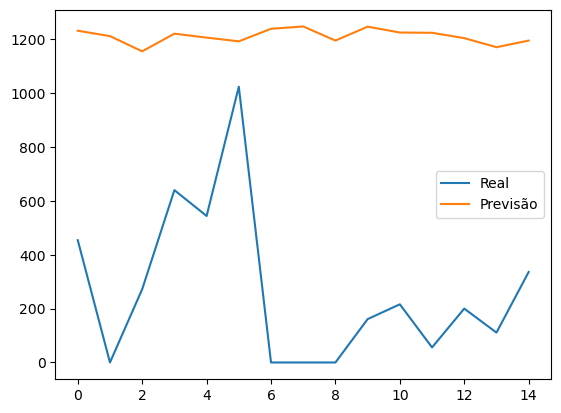

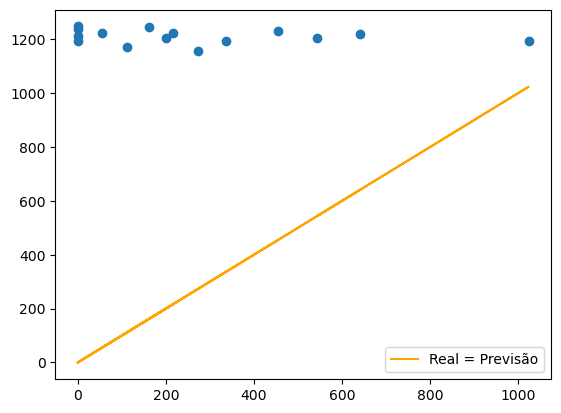

In [486]:
gasoleo_s_previsao = PM.predict(gasoleo_e_teste) #testar o modelo
plt.plot(gasoleo_s_teste, label='Real')
plt.plot(gasoleo_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(gasoleo_s_teste, gasoleo_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(gasoleo_s_teste, gasoleo_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [487]:
MAE = metrics.mean_absolute_error(gasoleo_s_teste, gasoleo_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(gasoleo_s_teste - gasoleo_s_previsao)
MSE = metrics.mean_squared_error(gasoleo_s_teste, gasoleo_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(gasoleo_s_teste, gasoleo_s_previsao))
cvRMSE = RMSE / np.mean(gasoleo_s_teste)
NMBE = MBE / np.mean(gasoleo_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['PM'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,219.282463,9.628628,78840.133993,280.784854,1.049271,0.035981
FA,310.903684,-38.643194,132627.318765,364.180338,1.360913,-0.144407
PM,943.528151,-943.528151,974036.880372,986.933068,3.688091,-3.525890


#### 4.6.2.5. Guardar Modelo

Com base nos valores obtidos para a performance do modelo, foi selecionado o que apresentou valores mais baixos (menores erros), correspondendo ao modelo Autoregressivo.

In [488]:
with open('pico_gasoleo.pkl','wb') as file: #guardar o modelo
    pickle.dump(FA, file)

### 4.6.3. Eólica

In [946]:
colunas_nomes = ['MAE', 'MBE', 'MSE', 'RMSE', 'cvRMSE', 'NMBE'] #definir nome das colunas
performance = pd.DataFrame(columns=colunas_nomes) #criar dataframe no qual vamos guardar os parâmetros que avaliam a performance para posteriormente comparar

#### 4.6.3.1. Preparação dos Dados

In [947]:
eolica = pico.drop(['Gasóleo', 'Fuelóleo', 'Fotovoltaica', 'Total', 'Gasóleo-1', 'Fuelóleo-1', 'Fotovoltaica-1', 'Total-1'], axis=1)  #eliminar as colunas que não se vão usar
eolica_saida = eolica.values[:,4]
eolica_entradas = eolica.values[:,[0,1,2,3,5]]
eolica_e_treino, eolica_e_teste, eolica_s_treino, eolica_s_teste = train_test_split(eolica_entradas,eolica_saida) #definir dados para treino (75%) e para teste (25%)

#### 4.6.3.2. Autoregressão

In [948]:
AR = AutoReg(eolica_s_treino, lags=1)
AR_fit = AR.fit()

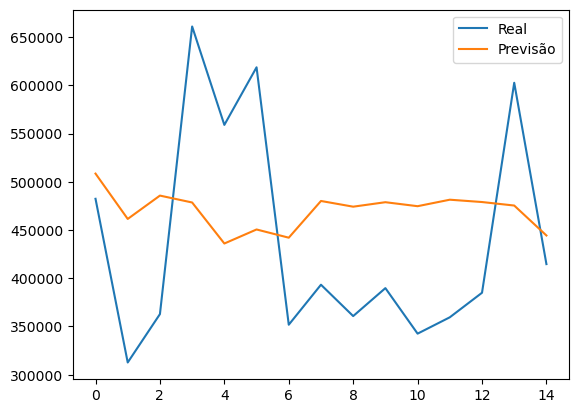

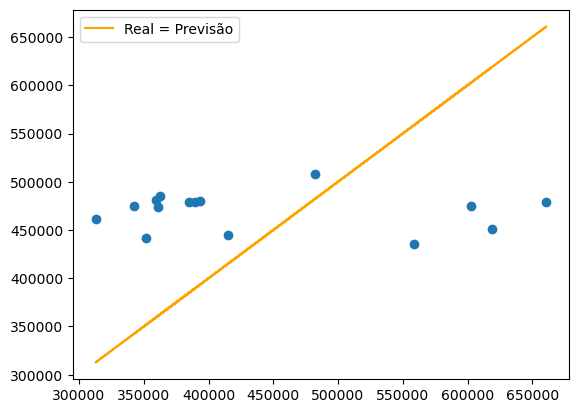

In [949]:
coeficiente = AR_fit.params #encontrar os parâmetros do modelo
passado = eolica_s_treino[len(eolica_s_treino)-1:]
passado = [passado[i] for i in range(len(passado))]
eolica_s_previsao = list() #definir lista no qual se vai guardar os valores previstos
for j in range(len(eolica_s_teste)):
    comprimento = len(passado)
    passo = [passado[i] for i in range(comprimento-1,comprimento)]
    valor = coeficiente[0]
    for k in range(1):
        valor += coeficiente[k+1] * passo[k]
    observado = eolica_s_teste[j]
    eolica_s_previsao.append(valor)
    passado.append(observado)
plt.plot(eolica_s_teste, label='Real') #desenhar os resultados
plt.plot(eolica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(eolica_s_teste, eolica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(eolica_s_teste, eolica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [950]:
MAE = metrics.mean_absolute_error(eolica_s_teste, eolica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(eolica_s_teste - eolica_s_previsao)
MSE = metrics.mean_squared_error(eolica_s_teste, eolica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(eolica_s_teste, eolica_s_previsao))
cvRMSE = RMSE / np.mean(eolica_s_teste)
NMBE = MBE / np.mean(eolica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
for coluna, valor in zip(colunas_nomes, valores):
    performance[coluna] = [valor]
performance.index = ['A'] #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,110362.129932,-30276.20283,1.394657e+10,118095.580136,0.268542,-0.068846


#### 4.6.3.3. Floresta Aleatória

In [951]:
FA = RandomForestRegressor(min_samples_leaf=5) #criar modelo
FA.fit(eolica_e_treino, eolica_s_treino) #treinar o modelo

RandomForestRegressor(min_samples_leaf=5)

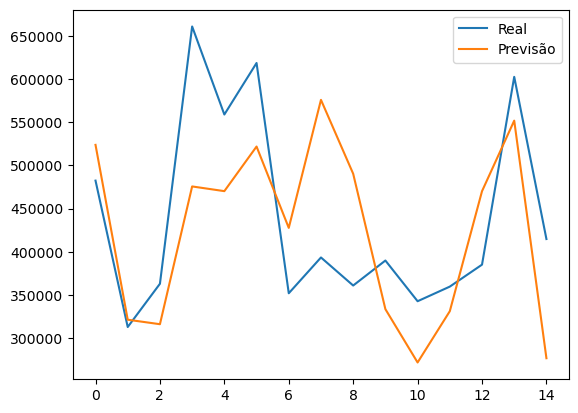

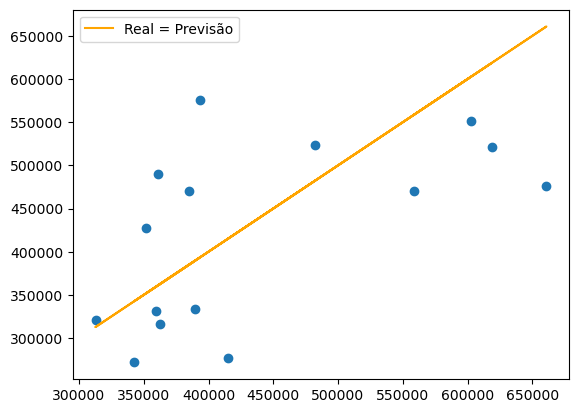

In [952]:
eolica_s_previsao = FA.predict(eolica_e_teste) #testar o modelo
plt.plot(eolica_s_teste, label='Real')
plt.plot(eolica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(eolica_s_teste, eolica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(eolica_s_teste, eolica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [953]:
MAE = metrics.mean_absolute_error(eolica_s_teste, eolica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(eolica_s_teste - eolica_s_previsao)
MSE = metrics.mean_squared_error(eolica_s_teste, eolica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(eolica_s_teste, eolica_s_previsao))
cvRMSE = RMSE / np.mean(eolica_s_teste)
NMBE = MBE / np.mean(eolica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['FA'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,110362.129932,-30276.202830,1.394657e+10,118095.580136,0.268542,-0.068846
FA,85688.023496,15971.114169,9.957353e+09,99786.539445,0.226909,0.036317


#### 4.6.3.4. Perceptron Multicamadas

In [954]:
PM = MLPRegressor(hidden_layer_sizes=(5,5,5)) #criar modelo
PM.fit(eolica_e_treino, eolica_s_treino) #treinar o modelo

C:\Users\mafal\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


MLPRegressor(hidden_layer_sizes=(5, 5, 5))

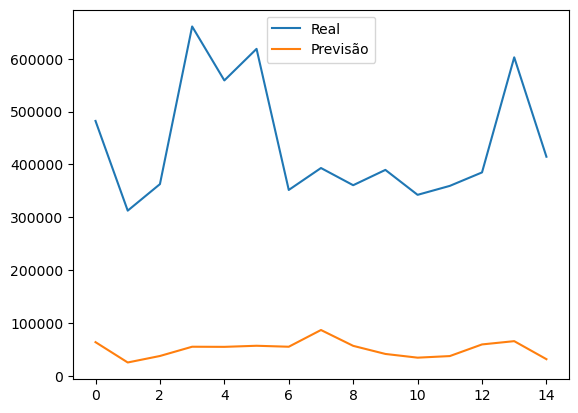

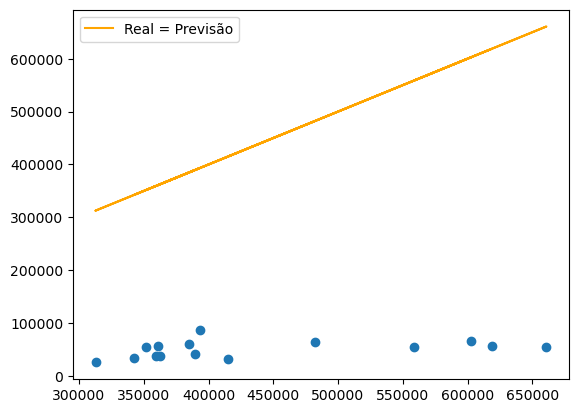

In [955]:
eolica_s_previsao = PM.predict(eolica_e_teste) #testar o modelo
plt.plot(eolica_s_teste, label='Real')
plt.plot(eolica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(eolica_s_teste, eolica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(eolica_s_teste, eolica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [956]:
MAE = metrics.mean_absolute_error(eolica_s_teste, eolica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(eolica_s_teste - eolica_s_previsao)
MSE = metrics.mean_squared_error(eolica_s_teste, eolica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(eolica_s_teste, eolica_s_previsao))
cvRMSE = RMSE / np.mean(eolica_s_teste)
NMBE = MBE / np.mean(eolica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['PM'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,110362.129932,-30276.202830,1.394657e+10,118095.580136,0.268542,-0.068846
FA,85688.023496,15971.114169,9.957353e+09,99786.539445,0.226909,0.036317
PM,388665.979264,388665.979264,1.621605e+11,402691.629125,0.915697,0.883804


#### 4.6.3.5. Guardar Modelo

Com base nos valores obtidos para a performance do modelo, foi selecionado o que apresentou valores mais baixos (menores erros), correspondendo ao Regressor da Floresta Aleatória.

In [957]:
with open('pico_eolica.pkl','wb') as file: #guardar o modelo
    pickle.dump(FA, file)

### 4.6.4. Fotovoltaica

In [970]:
colunas_nomes = ['MAE', 'MBE', 'MSE', 'RMSE', 'cvRMSE', 'NMBE'] #definir nome das colunas
performance = pd.DataFrame(columns=colunas_nomes) #criar dataframe no qual vamos guardar os parâmetros que avaliam a performance para posteriormente comparar

#### 4.6.4.1. Preparação dos Dados

In [971]:
fotovoltaica = pico.drop(['Gasóleo', 'Fuelóleo', 'Eólica', 'Total', 'Gasóleo-1', 'Fuelóleo-1', 'Eólica-1', 'Total-1'], axis=1)  #eliminar as colunas que não se vão usar
fotovoltaica_saida = fotovoltaica.values[:,4]
fotovoltaica_entradas = fotovoltaica.values[:,[0,1,2,3,5]]
fotovoltaica_e_treino, fotovoltaica_e_teste, fotovoltaica_s_treino, fotovoltaica_s_teste = train_test_split(fotovoltaica_entradas,fotovoltaica_saida) #definir dados para treino (75%) e para teste (25%)

#### 4.6.4.2. Autoregressão

In [972]:
AR = AutoReg(fotovoltaica_s_treino, lags=1)
AR_fit = AR.fit()

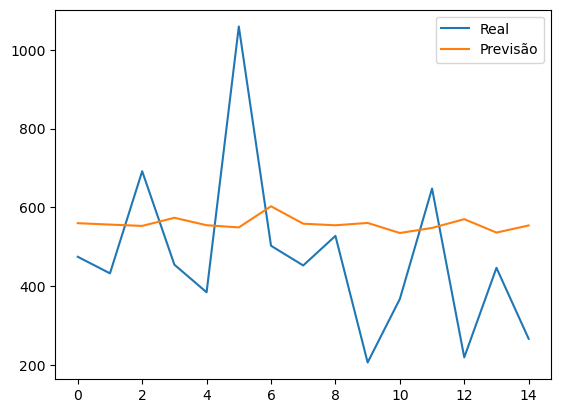

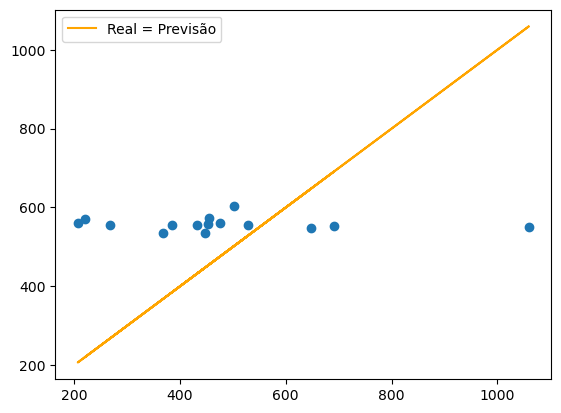

In [973]:
coeficiente = AR_fit.params #encontrar os parâmetros do modelo
passado = fotovoltaica_s_treino[len(fotovoltaica_s_treino)-1:]
passado = [passado[i] for i in range(len(passado))]
fotovoltaica_s_previsao = list() #definir lista no qual se vai guardar os valores previstos
for j in range(len(fotovoltaica_s_teste)):
    comprimento = len(passado)
    passo = [passado[i] for i in range(comprimento-1,comprimento)]
    valor = coeficiente[0]
    for k in range(1):
        valor += coeficiente[k+1] * passo[k]
    observado = fotovoltaica_s_teste[j]
    fotovoltaica_s_previsao.append(valor)
    passado.append(observado)
plt.plot(fotovoltaica_s_teste, label='Real') #desenhar os resultados
plt.plot(fotovoltaica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(fotovoltaica_s_teste, fotovoltaica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(fotovoltaica_s_teste, fotovoltaica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [974]:
MAE = metrics.mean_absolute_error(fotovoltaica_s_teste, fotovoltaica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(fotovoltaica_s_teste - fotovoltaica_s_previsao)
MSE = metrics.mean_squared_error(fotovoltaica_s_teste, fotovoltaica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(fotovoltaica_s_teste, fotovoltaica_s_previsao))
cvRMSE = RMSE / np.mean(fotovoltaica_s_teste)
NMBE = MBE / np.mean(fotovoltaica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
for coluna, valor in zip(colunas_nomes, valores):
    performance[coluna] = [valor]
performance.index = ['A'] #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,181.803873,-82.060177,49529.330495,222.55186,0.467546,-0.172395


#### 4.6.4.3. Floresta Aleatória

In [975]:
FA = RandomForestRegressor(min_samples_leaf=5) #criar modelo
FA.fit(fotovoltaica_e_treino, fotovoltaica_s_treino) #treinar o modelo

RandomForestRegressor(min_samples_leaf=5)

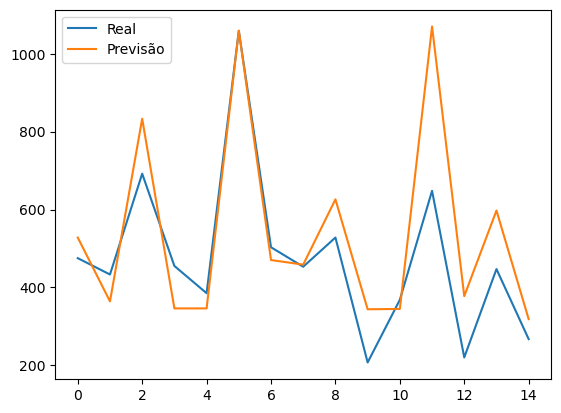

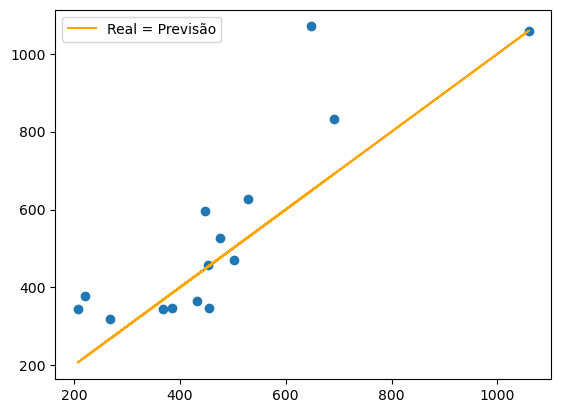

In [976]:
fotovoltaica_s_previsao = FA.predict(fotovoltaica_e_teste) #testar o modelo
plt.plot(fotovoltaica_s_teste, label='Real') #desenhar os resultados
plt.plot(fotovoltaica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(fotovoltaica_s_teste, fotovoltaica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(fotovoltaica_s_teste, fotovoltaica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [977]:
MAE = metrics.mean_absolute_error(fotovoltaica_s_teste, fotovoltaica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(fotovoltaica_s_teste - fotovoltaica_s_previsao)
MSE = metrics.mean_squared_error(fotovoltaica_s_teste, fotovoltaica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(fotovoltaica_s_teste, fotovoltaica_s_previsao))
cvRMSE = RMSE / np.mean(fotovoltaica_s_teste)
NMBE = MBE / np.mean(fotovoltaica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['FA'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,181.803873,-82.060177,49529.330495,222.551860,0.467546,-0.172395
FA,99.330289,-62.851857,19951.027695,141.248107,0.296740,-0.132042


#### 4.6.4.4. Perceptron Multicamadas

In [978]:
PM = MLPRegressor(hidden_layer_sizes=(5,5,5)) #criar modelo
PM.fit(fotovoltaica_e_treino, fotovoltaica_s_treino) #treinar o modelo

C:\Users\mafal\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


MLPRegressor(hidden_layer_sizes=(5, 5, 5))

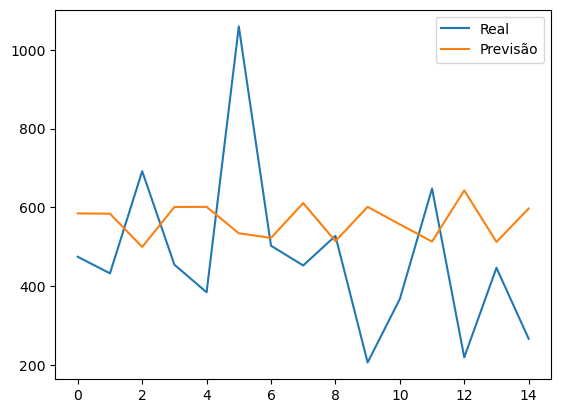

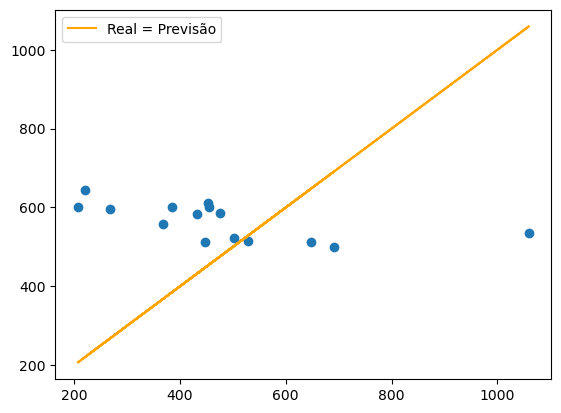

In [979]:
fotovoltaica_s_previsao = PM.predict(fotovoltaica_e_teste) #testar o modelo
plt.plot(fotovoltaica_s_teste, label='Real') #desenhar os resultados
plt.plot(fotovoltaica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(fotovoltaica_s_teste, fotovoltaica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(fotovoltaica_s_teste, fotovoltaica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [980]:
MAE = metrics.mean_absolute_error(fotovoltaica_s_teste, fotovoltaica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(fotovoltaica_s_teste - fotovoltaica_s_previsao)
MSE = metrics.mean_squared_error(fotovoltaica_s_teste, fotovoltaica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(fotovoltaica_s_teste, fotovoltaica_s_previsao))
cvRMSE = RMSE / np.mean(fotovoltaica_s_teste)
NMBE = MBE / np.mean(fotovoltaica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['PM'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,181.803873,-82.060177,49529.330495,222.551860,0.467546,-0.172395
FA,99.330289,-62.851857,19951.027695,141.248107,0.296740,-0.132042
PM,204.631659,-89.443689,62863.684006,250.726313,0.526736,-0.187907


#### 4.6.4.5. Guardar Modelo

Com base nos valores obtidos para a performance do modelo, foi selecionado o que apresentou valores mais baixos (menores erros), correspondendo ao Regressor da Floresta Aleatória.

In [981]:
with open('pico_fotovoltaica.pkl','wb') as file: #guardar o modelo
    pickle.dump(FA, file)

### 4.7. Faial

#### 4.7.1. Fuelóleo

In [219]:
colunas_nomes = ['MAE', 'MBE', 'MSE', 'RMSE', 'cvRMSE', 'NMBE'] #definir nome das colunas
performance = pd.DataFrame(columns=colunas_nomes) #criar dataframe no qual vamos guardar os parâmetros que avaliam a performance para posteriormente comparar

#### 4.7.1.1. Preparação dos Dados

In [220]:
fueloleo = faial.drop(['Gasóleo', 'Hídrica', 'Eólica', 'Fotovoltaica', 'Total', 'Gasóleo-1', 'Hídrica-1', 'Eólica-1', 'Fotovoltaica-1', 'Total-1'], axis=1)  #eliminar as colunas que não se vão usar
fueloleo_saida = fueloleo.values[:,4]
fueloleo_entradas = fueloleo.values[:,[0,1,2,3,5]]
fueloleo_e_treino, fueloleo_e_teste, fueloleo_s_treino, fueloleo_s_teste = train_test_split(fueloleo_entradas,fueloleo_saida) #definir dados para treino (75%) e para teste (25%)

#### 4.7.1.2. Autoregressão

In [221]:
AR = AutoReg(fueloleo_s_treino, lags=1)
AR_fit = AR.fit()

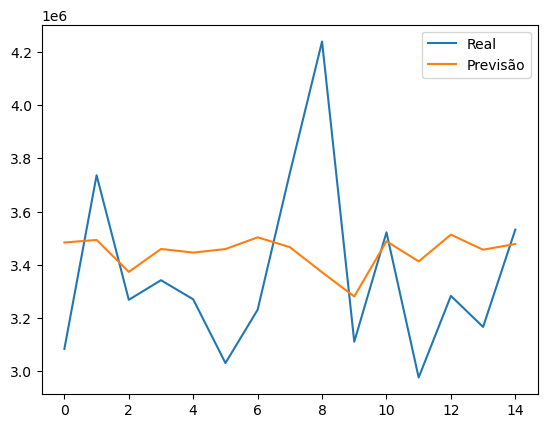

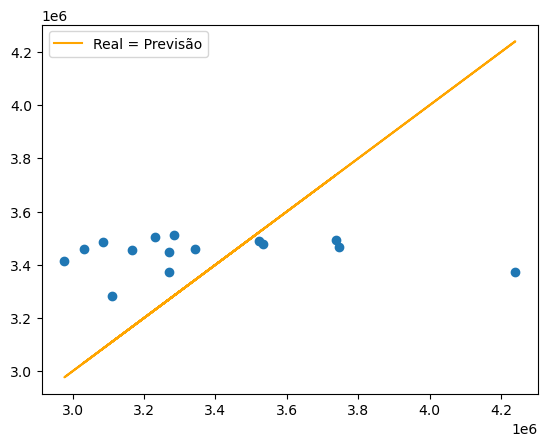

In [222]:
coeficiente = AR_fit.params #encontrar os parâmetros do modelo
passado = fueloleo_s_treino[len(fueloleo_s_treino)-1:]
passado = [passado[i] for i in range(len(passado))]
fueloleo_s_previsao = list() #definir lista no qual se vai guardar os valores previstos
for j in range(len(fueloleo_s_teste)):
    comprimento = len(passado)
    passo = [passado[i] for i in range(comprimento-1,comprimento)]
    valor = coeficiente[0]
    for k in range(1):
        valor += coeficiente[k+1] * passo[k]
    observado = fueloleo_s_teste[j]
    fueloleo_s_previsao.append(valor)
    passado.append(observado)
plt.plot(fueloleo_s_teste, label='Real') #desenhar os resultados
plt.plot(fueloleo_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(fueloleo_s_teste, fueloleo_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(fueloleo_s_teste, fueloleo_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [223]:
MAE = metrics.mean_absolute_error(fueloleo_s_teste, fueloleo_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(fueloleo_s_teste - fueloleo_s_previsao)
MSE = metrics.mean_squared_error(fueloleo_s_teste, fueloleo_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(fueloleo_s_teste, fueloleo_s_previsao))
cvRMSE = RMSE / np.mean(fueloleo_s_teste)
NMBE = MBE / np.mean(fueloleo_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
for coluna, valor in zip(colunas_nomes, valores):
    performance[coluna] = [valor]
performance.index = ['A'] #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,273529.084878,-76596.709004,1.149297e+11,339012.766297,0.100611,-0.022732


#### 4.7.1.3. Floresta Aleatória

In [224]:
FA = RandomForestRegressor(min_samples_leaf=5) #criar modelo
FA.fit(fueloleo_e_treino, fueloleo_s_treino) #treinar o modelo

RandomForestRegressor(min_samples_leaf=5)

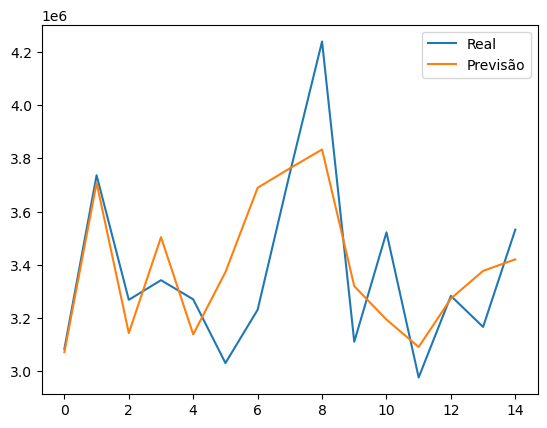

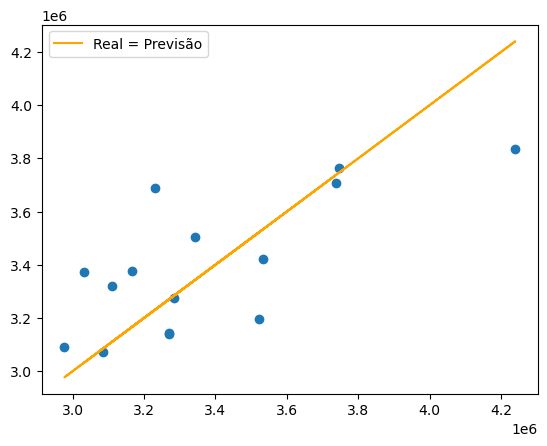

In [225]:
fueloleo_s_previsao = FA.predict(fueloleo_e_teste) #testar o modelo
plt.plot(fueloleo_s_teste, label='Real') #desenhar os resultados
plt.plot(fueloleo_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(fueloleo_s_teste, fueloleo_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(fueloleo_s_teste, fueloleo_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [226]:
MAE = metrics.mean_absolute_error(fueloleo_s_teste, fueloleo_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(fueloleo_s_teste - fueloleo_s_previsao)
MSE = metrics.mean_squared_error(fueloleo_s_teste, fueloleo_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(fueloleo_s_teste, fueloleo_s_previsao))
cvRMSE = RMSE / np.mean(fueloleo_s_teste)
NMBE = MBE / np.mean(fueloleo_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['FA'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,273529.084878,-76596.709004,1.149297e+11,339012.766297,0.100611,-0.022732
FA,177871.676381,-24012.575750,5.158325e+10,227119.462680,0.067404,-0.007126


#### 4.7.1.4. Perceptron Multicamadas

In [227]:
PM = MLPRegressor(hidden_layer_sizes=(5,5,5)) #criar modelo
PM.fit(fueloleo_e_treino, fueloleo_s_treino) #treinar o modelo

C:\Users\mafal\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


MLPRegressor(hidden_layer_sizes=(5, 5, 5))

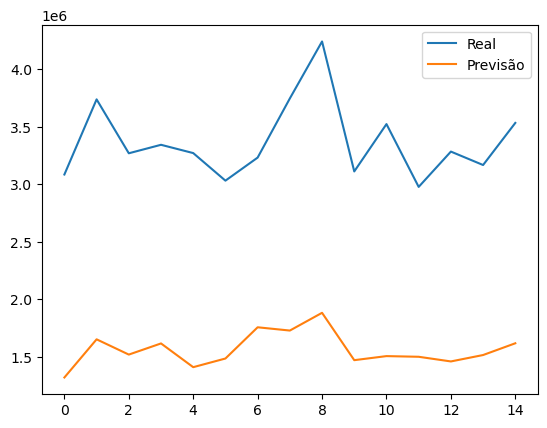

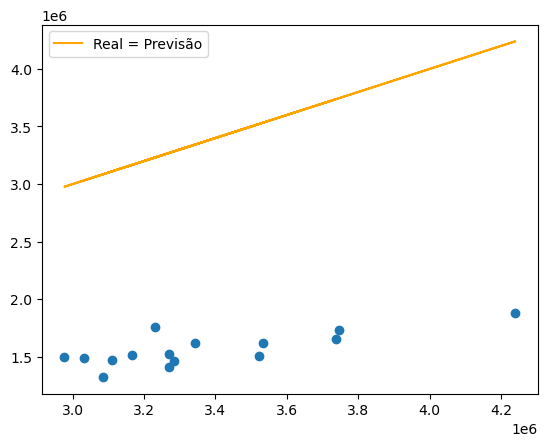

In [228]:
fueloleo_s_previsao = PM.predict(fueloleo_e_teste) #testar o modelo
plt.plot(fueloleo_s_teste, label='Real') #desenhar os resultados
plt.plot(fueloleo_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(fueloleo_s_teste, fueloleo_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(fueloleo_s_teste, fueloleo_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [229]:
MAE = metrics.mean_absolute_error(fueloleo_s_teste, fueloleo_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(fueloleo_s_teste - fueloleo_s_previsao)
MSE = metrics.mean_squared_error(fueloleo_s_teste, fueloleo_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(fueloleo_s_teste, fueloleo_s_previsao))
cvRMSE = RMSE / np.mean(fueloleo_s_teste)
NMBE = MBE / np.mean(fueloleo_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['PM'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,2.735291e+05,-7.659671e+04,1.149297e+11,3.390128e+05,0.100611,-0.022732
FA,1.778717e+05,-2.401258e+04,5.158325e+10,2.271195e+05,0.067404,-0.007126
PM,1.806215e+06,1.806215e+06,3.318087e+12,1.821562e+06,0.540597,0.536043


#### 4.7.1.5. Guardar Modelo

Com base nos valores obtidos para a performance do modelo, foi selecionado o que apresentou valores mais baixos (menores erros), correspondendo ao Regressor da Floresta Aleatória.

In [230]:
with open('faial_fueloleo.pkl','wb') as file: #guardar o modelo
    pickle.dump(FA, file)

#### 4.7.2. Gasóleo

In [235]:
colunas_nomes = ['MAE', 'MBE', 'MSE', 'RMSE', 'cvRMSE', 'NMBE'] #definir nome das colunas
performance = pd.DataFrame(columns=colunas_nomes) #criar dataframe no qual vamos guardar os parâmetros que avaliam a performance para posteriormente comparar

#### 4.7.2.1. Preparação dos Dados

In [236]:
gasoleo = faial.drop(['Fuelóleo', 'Hídrica', 'Eólica', 'Fotovoltaica', 'Total', 'Fuelóleo-1', 'Hídrica-1', 'Eólica-1', 'Fotovoltaica-1', 'Total-1'], axis=1)  #eliminar as colunas que não se vão usar
gasoleo_saida = gasoleo.values[:,4]
gasoleo_entradas = gasoleo.values[:,[0,1,2,3,5]]
gasoleo_e_treino, gasoleo_e_teste, gasoleo_s_treino, gasoleo_s_teste = train_test_split(gasoleo_entradas,gasoleo_saida) #definir dados para treino (75%) e para teste (25%)

#### 4.7.2.2. Autoregressão

In [237]:
AR = AutoReg(gasoleo_s_treino, lags=1)
AR_fit = AR.fit()

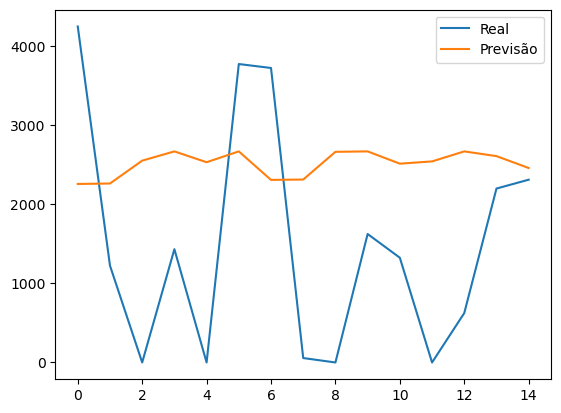

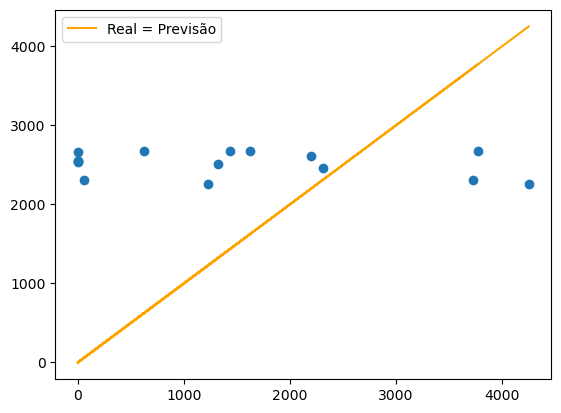

In [238]:
coeficiente = AR_fit.params #encontrar os parâmetros do modelo
passado = gasoleo_s_treino[len(gasoleo_s_treino)-1:]
passado = [passado[i] for i in range(len(passado))]
gasoleo_s_previsao = list() #definir lista no qual se vai guardar os valores previstos
for j in range(len(gasoleo_s_teste)):
    comprimento = len(passado)
    passo = [passado[i] for i in range(comprimento-1,comprimento)]
    valor = coeficiente[0]
    for k in range(1):
        valor += coeficiente[k+1] * passo[k]
    observado = gasoleo_s_teste[j]
    gasoleo_s_previsao.append(valor)
    passado.append(observado)
plt.plot(gasoleo_s_teste, label='Real') #desenhar os resultados
plt.plot(gasoleo_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(gasoleo_s_teste, gasoleo_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(gasoleo_s_teste, gasoleo_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [239]:
MAE = metrics.mean_absolute_error(gasoleo_s_teste, gasoleo_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(gasoleo_s_teste - gasoleo_s_previsao)
MSE = metrics.mean_squared_error(gasoleo_s_teste, gasoleo_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(gasoleo_s_teste, gasoleo_s_previsao))
cvRMSE = RMSE / np.mean(gasoleo_s_teste)
NMBE = MBE / np.mean(gasoleo_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
for coluna, valor in zip(colunas_nomes, valores):
    performance[coluna] = [valor]
performance.index = ['A'] #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,1611.847686,-1010.136673,3.218780e+06,1794.095938,1.193359,-0.671901


#### 4.7.2.3. Floresta Aleatória

In [240]:
FA = RandomForestRegressor(min_samples_leaf=5) #criar modelo
FA.fit(gasoleo_e_treino, gasoleo_s_treino) #treinar o modelo

RandomForestRegressor(min_samples_leaf=5)

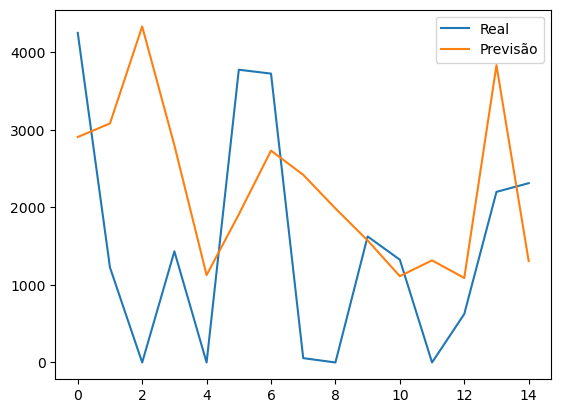

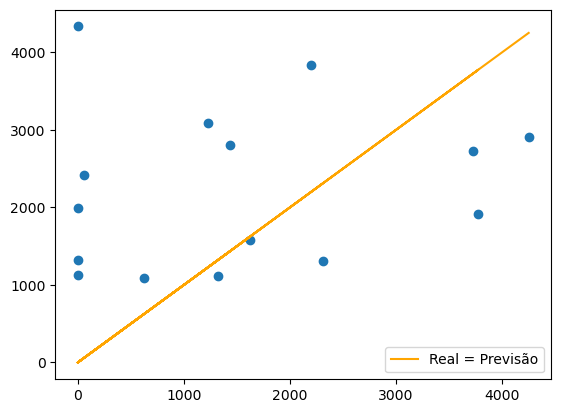

In [241]:
gasoleo_s_previsao = FA.predict(gasoleo_e_teste) #testar o modelo
plt.plot(gasoleo_s_teste, label='Real')
plt.plot(gasoleo_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(gasoleo_s_teste, gasoleo_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(gasoleo_s_teste, gasoleo_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [242]:
MAE = metrics.mean_absolute_error(gasoleo_s_teste, gasoleo_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(gasoleo_s_teste - gasoleo_s_previsao)
MSE = metrics.mean_squared_error(gasoleo_s_teste, gasoleo_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(gasoleo_s_teste, gasoleo_s_previsao))
cvRMSE = RMSE / np.mean(gasoleo_s_teste)
NMBE = MBE / np.mean(gasoleo_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['FA'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,1611.847686,-1010.136673,3.218780e+06,1794.095938,1.193359,-0.671901
FA,1461.283910,-731.985488,3.122798e+06,1767.144067,1.175432,-0.486887


#### 4.7.2.4. Perceptron Multicamadas

In [244]:
PM = MLPRegressor(hidden_layer_sizes=(5,5,5)) #criar modelo
PM.fit(gasoleo_e_treino, gasoleo_s_treino) #treinar o modelo

C:\Users\mafal\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


MLPRegressor(hidden_layer_sizes=(5, 5, 5))

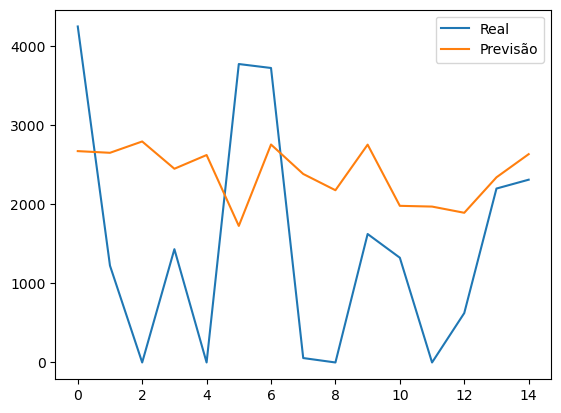

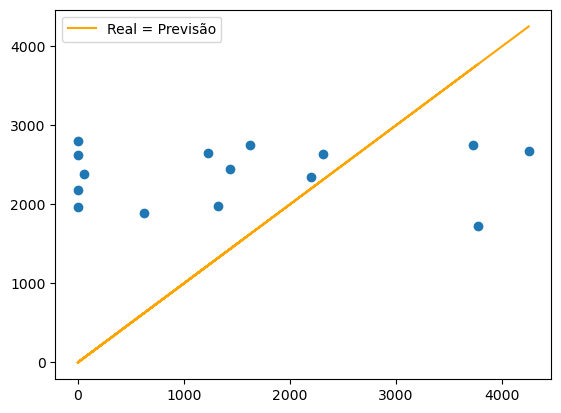

In [245]:
gasoleo_s_previsao = PM.predict(gasoleo_e_teste) #testar o modelo
plt.plot(gasoleo_s_teste, label='Real')
plt.plot(gasoleo_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(gasoleo_s_teste, gasoleo_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(gasoleo_s_teste, gasoleo_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [246]:
MAE = metrics.mean_absolute_error(gasoleo_s_teste, gasoleo_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(gasoleo_s_teste - gasoleo_s_previsao)
MSE = metrics.mean_squared_error(gasoleo_s_teste, gasoleo_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(gasoleo_s_teste, gasoleo_s_previsao))
cvRMSE = RMSE / np.mean(gasoleo_s_teste)
NMBE = MBE / np.mean(gasoleo_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['PM'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,1611.847686,-1010.136673,3.218780e+06,1794.095938,1.193359,-0.671901
FA,1461.283910,-731.985488,3.122798e+06,1767.144067,1.175432,-0.486887
PM,1497.043825,-884.754141,2.859072e+06,1690.879002,1.124703,-0.588502


#### 4.7.2.5. Guardar Modelo

Com base nos valores obtidos para a performance do modelo, foi selecionado o que apresentou valores mais baixos (menores erros), correspondendo ao Regressor de Perceptron Multicamadas.

In [247]:
with open('faial_gasoleo.pkl','wb') as file: #guardar o modelo
    pickle.dump(PM, file)

#### 4.7.3. Hídrica

In [303]:
colunas_nomes = ['MAE', 'MBE', 'MSE', 'RMSE', 'cvRMSE', 'NMBE'] #definir nome das colunas
performance = pd.DataFrame(columns=colunas_nomes) #criar dataframe no qual vamos guardar os parâmetros que avaliam a performance para posteriormente comparar

#### 4.7.3.1. Preparação dos Dados

In [304]:
hidrica = faial.drop(['Gasóleo', 'Fuelóleo', 'Eólica', 'Fotovoltaica', 'Total', 'Gasóleo-1', 'Fuelóleo-1', 'Eólica-1', 'Fotovoltaica-1', 'Total-1'], axis=1)  #eliminar as colunas que não se vão usar
hidrica_saida = hidrica.values[:,4]
hidrica_entradas = hidrica.values[:,[0,1,2,3,5]]
hidrica_e_treino, hidrica_e_teste, hidrica_s_treino, hidrica_s_teste = train_test_split(hidrica_entradas,hidrica_saida) #definir dados para treino (75%) e para teste (25%)

#### 4.7.3.2. Autoregressão

In [305]:
AR = AutoReg(hidrica_s_treino, lags=1)
AR_fit = AR.fit()

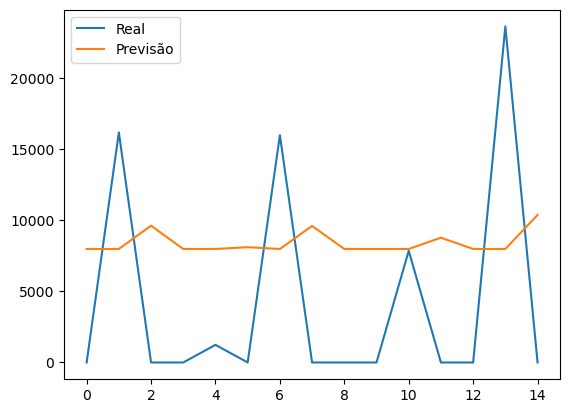

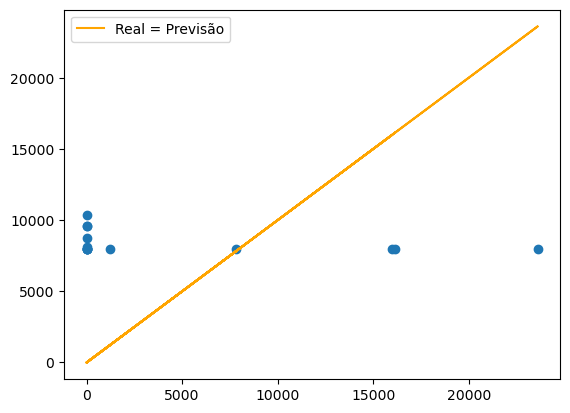

In [306]:
coeficiente = AR_fit.params #encontrar os parâmetros do modelo
passado = hidrica_s_treino[len(hidrica_s_treino)-1:]
passado = [passado[i] for i in range(len(passado))]
hidrica_s_previsao = list() #definir lista no qual se vai guardar os valores previstos
for j in range(len(hidrica_s_teste)):
    comprimento = len(passado)
    passo = [passado[i] for i in range(comprimento-1,comprimento)]
    valor = coeficiente[0]
    for k in range(1):
        valor += coeficiente[k+1] * passo[k]
    observado = hidrica_s_teste[j]
    hidrica_s_previsao.append(valor)
    passado.append(observado)
plt.plot(hidrica_s_teste, label='Real') #desenhar os resultados
plt.plot(hidrica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(hidrica_s_teste, hidrica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(hidrica_s_teste, hidrica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [307]:
MAE = metrics.mean_absolute_error(hidrica_s_teste, hidrica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(hidrica_s_teste - hidrica_s_previsao)
MSE = metrics.mean_squared_error(hidrica_s_teste, hidrica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(hidrica_s_teste, hidrica_s_previsao))
cvRMSE = RMSE / np.mean(hidrica_s_teste)
NMBE = MBE / np.mean(hidrica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
for coluna, valor in zip(colunas_nomes, valores):
    performance[coluna] = [valor]
performance.index = ['A'] #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,8330.54914,-4089.017385,7.816061e+07,8840.848937,2.046272,-0.94643


#### 4.7.3.3. Floresta Aleatória

In [308]:
FA = RandomForestRegressor(min_samples_leaf=5) #criar modelo
FA.fit(hidrica_e_treino, hidrica_s_treino) #treinar o modelo

RandomForestRegressor(min_samples_leaf=5)

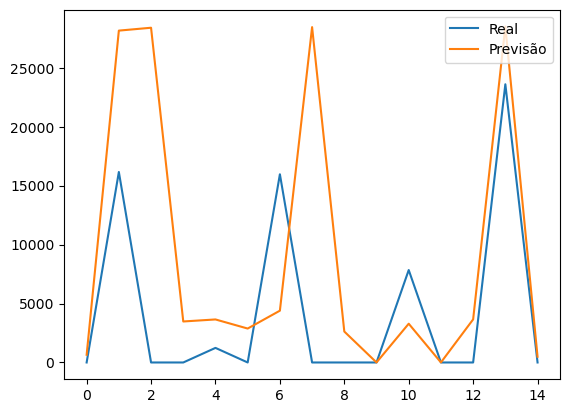

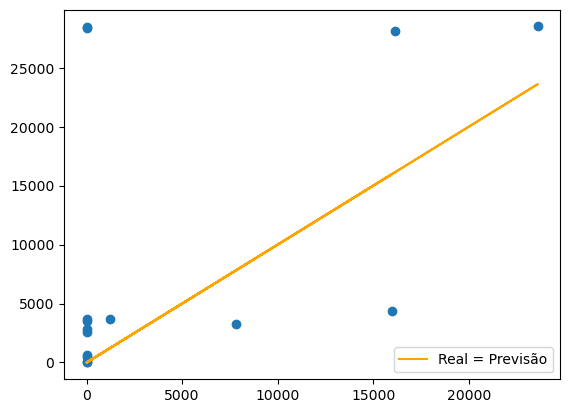

In [309]:
hidrica_s_previsao = FA.predict(hidrica_e_teste) #testar o modelo
plt.plot(hidrica_s_teste, label='Real') #desenhar os resultados
plt.plot(hidrica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(hidrica_s_teste, hidrica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(hidrica_s_teste, hidrica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [310]:
MAE = metrics.mean_absolute_error(hidrica_s_teste, hidrica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(hidrica_s_teste - hidrica_s_previsao)
MSE = metrics.mean_squared_error(hidrica_s_teste, hidrica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(hidrica_s_teste, hidrica_s_previsao))
cvRMSE = RMSE / np.mean(hidrica_s_teste)
NMBE = MBE / np.mean(hidrica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['FA'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,8330.549140,-4089.017385,7.816061e+07,8840.848937,2.046272,-0.946430
FA,7070.804798,-4920.777907,1.323592e+08,11504.748241,2.662849,-1.138946


#### 4.7.3.4. Perceptron Multicamadas

In [311]:
PM = MLPRegressor(hidden_layer_sizes=(5,5,5)) #criar modelo
PM.fit(hidrica_e_treino, hidrica_s_treino) #treinar o modelo

C:\Users\mafal\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


MLPRegressor(hidden_layer_sizes=(5, 5, 5))

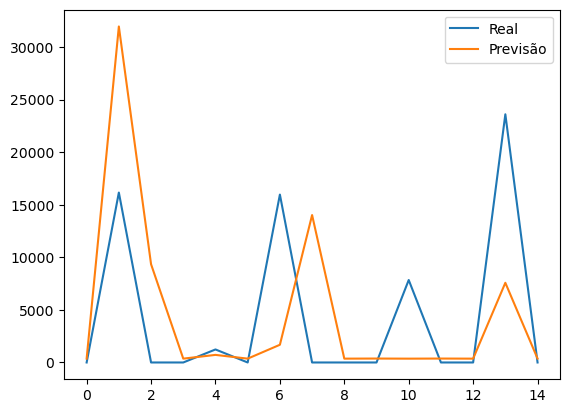

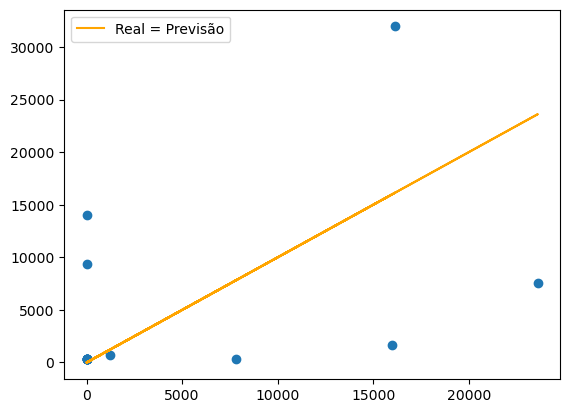

In [312]:
hidrica_s_previsao = PM.predict(hidrica_e_teste) #testar o modelo
plt.plot(hidrica_s_teste, label='Real') #desenhar os resultados
plt.plot(hidrica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(hidrica_s_teste, hidrica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(hidrica_s_teste, hidrica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [313]:
MAE = metrics.mean_absolute_error(hidrica_s_teste, hidrica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(hidrica_s_teste - hidrica_s_previsao)
MSE = metrics.mean_squared_error(hidrica_s_teste, hidrica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(hidrica_s_teste, hidrica_s_previsao))
cvRMSE = RMSE / np.mean(hidrica_s_teste)
NMBE = MBE / np.mean(hidrica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['PM'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,8330.549140,-4089.017385,7.816061e+07,8840.848937,2.046272,-0.946430
FA,7070.804798,-4920.777907,1.323592e+08,11504.748241,2.662849,-1.138946
PM,5360.183979,-253.419898,7.008745e+07,8371.824637,1.937713,-0.058656


#### 4.7.3.5. Guardar Modelo

Com base nos valores obtidos para a performance do modelo, foi selecionado o que apresentou valores mais baixos (menores erros), correspondendo ao Regressor de Perceptron Multicamadas.

In [314]:
with open('faial_hidrica.pkl','wb') as file: #guardar o modelo
    pickle.dump(PM, file)

#### 4.7.4. Eólica

In [360]:
colunas_nomes = ['MAE', 'MBE', 'MSE', 'RMSE', 'cvRMSE', 'NMBE'] #definir nome das colunas
performance = pd.DataFrame(columns=colunas_nomes) #criar dataframe no qual vamos guardar os parâmetros que avaliam a performance para posteriormente comparar

#### 4.7.4.1. Preparação dos Dados

In [361]:
eolica = faial.drop(['Gasóleo', 'Fuelóleo', 'Hídrica', 'Fotovoltaica', 'Total', 'Gasóleo-1', 'Fuelóleo-1', 'Hídrica-1', 'Fotovoltaica-1', 'Total-1'], axis=1)  #eliminar as colunas que não se vão usar
eolica_saida = eolica.values[:,4]
eolica_entradas = eolica.values[:,[0,1,2,3,5]]
eolica_e_treino, eolica_e_teste, eolica_s_treino, eolica_s_teste = train_test_split(eolica_entradas,eolica_saida) #definir dados para treino (75%) e para teste (25%)

#### 4.7.4.2. Autoregressão

In [362]:
AR = AutoReg(eolica_s_treino, lags=1)
AR_fit = AR.fit()

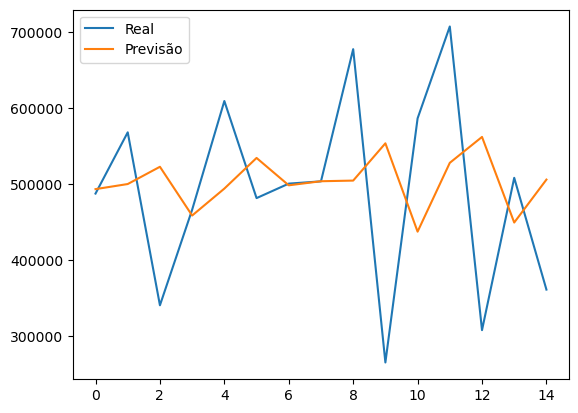

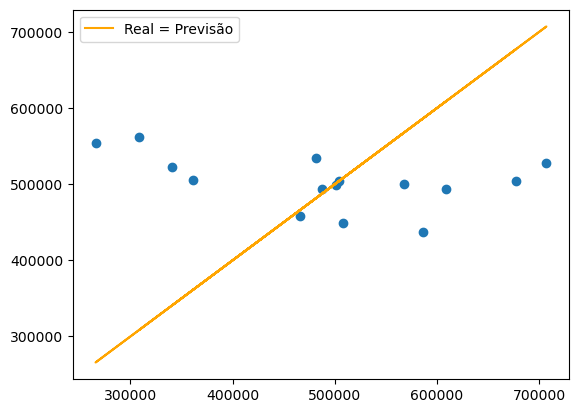

In [363]:
coeficiente = AR_fit.params #encontrar os parâmetros do modelo
passado = eolica_s_treino[len(eolica_s_treino)-1:]
passado = [passado[i] for i in range(len(passado))]
eolica_s_previsao = list() #definir lista no qual se vai guardar os valores previstos
for j in range(len(eolica_s_teste)):
    comprimento = len(passado)
    passo = [passado[i] for i in range(comprimento-1,comprimento)]
    valor = coeficiente[0]
    for k in range(1):
        valor += coeficiente[k+1] * passo[k]
    observado = eolica_s_teste[j]
    eolica_s_previsao.append(valor)
    passado.append(observado)
plt.plot(eolica_s_teste, label='Real') #desenhar os resultados
plt.plot(eolica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(eolica_s_teste, eolica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(eolica_s_teste, eolica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [364]:
MAE = metrics.mean_absolute_error(eolica_s_teste, eolica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(eolica_s_teste - eolica_s_previsao)
MSE = metrics.mean_squared_error(eolica_s_teste, eolica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(eolica_s_teste, eolica_s_previsao))
cvRMSE = RMSE / np.mean(eolica_s_teste)
NMBE = MBE / np.mean(eolica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
for coluna, valor in zip(colunas_nomes, valores):
    performance[coluna] = [valor]
performance.index = ['A'] #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,111939.451699,-11651.837883,2.063529e+10,143649.87816,0.29224,-0.023704


#### 4.7.4.3. Floresta Aleatória

In [365]:
FA = RandomForestRegressor(min_samples_leaf=5) #criar modelo
FA.fit(eolica_e_treino, eolica_s_treino) #treinar o modelo

RandomForestRegressor(min_samples_leaf=5)

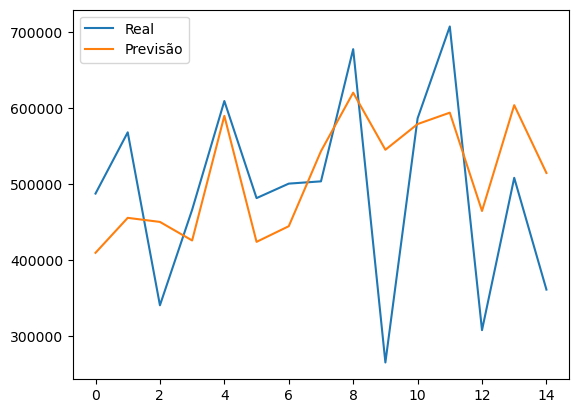

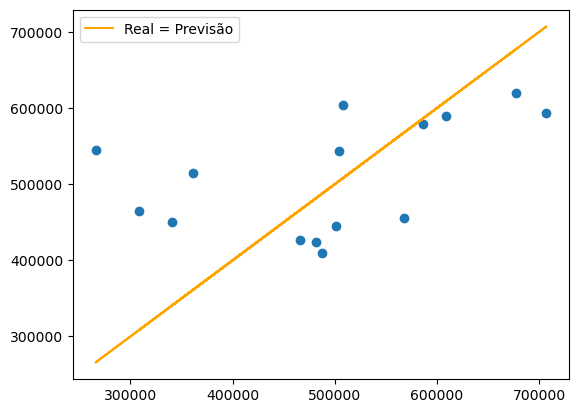

In [366]:
eolica_s_previsao = FA.predict(eolica_e_teste) #testar o modelo
plt.plot(eolica_s_teste, label='Real')
plt.plot(eolica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(eolica_s_teste, eolica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(eolica_s_teste, eolica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [367]:
MAE = metrics.mean_absolute_error(eolica_s_teste, eolica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(eolica_s_teste - eolica_s_previsao)
MSE = metrics.mean_squared_error(eolica_s_teste, eolica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(eolica_s_teste, eolica_s_previsao))
cvRMSE = RMSE / np.mean(eolica_s_teste)
NMBE = MBE / np.mean(eolica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['FA'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,111939.451699,-11651.837883,2.063529e+10,143649.878160,0.292240,-0.023704
FA,91674.286890,-19495.481787,1.279989e+10,113136.593534,0.230164,-0.039661


#### 4.7.4.4. Perceptron Multicamadas

In [368]:
PM = MLPRegressor(hidden_layer_sizes=(5,5,5)) #criar modelo
PM.fit(eolica_e_treino, eolica_s_treino) #treinar o modelo

C:\Users\mafal\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


MLPRegressor(hidden_layer_sizes=(5, 5, 5))

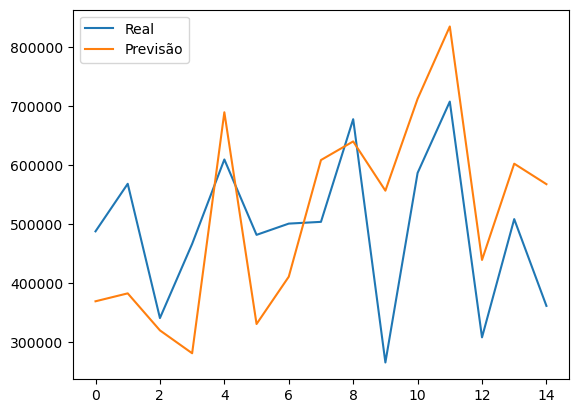

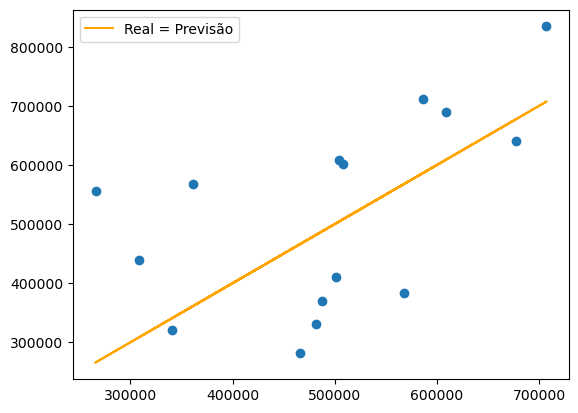

In [369]:
eolica_s_previsao = PM.predict(eolica_e_teste) #testar o modelo
plt.plot(eolica_s_teste, label='Real')
plt.plot(eolica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(eolica_s_teste, eolica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(eolica_s_teste, eolica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [370]:
MAE = metrics.mean_absolute_error(eolica_s_teste, eolica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(eolica_s_teste - eolica_s_previsao)
MSE = metrics.mean_squared_error(eolica_s_teste, eolica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(eolica_s_teste, eolica_s_previsao))
cvRMSE = RMSE / np.mean(eolica_s_teste)
NMBE = MBE / np.mean(eolica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['PM'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,111939.451699,-11651.837883,2.063529e+10,143649.878160,0.292240,-0.023704
FA,91674.286890,-19495.481787,1.279989e+10,113136.593534,0.230164,-0.039661
PM,129749.159799,-24692.570554,2.115668e+10,145453.354817,0.295909,-0.050234


#### 4.7.4.5. Guardar Modelo

Com base nos valores obtidos para a performance do modelo, foi selecionado o que apresentou valores mais baixos (menores erros), correspondendo ao Regressor da Floresta Aleatória.

In [371]:
with open('faial_eolica.pkl','wb') as file: #guardar o modelo
    pickle.dump(FA, file)

#### 4.7.5. Fotovoltaica

In [376]:
colunas_nomes = ['MAE', 'MBE', 'MSE', 'RMSE', 'cvRMSE', 'NMBE'] #definir nome das colunas
performance = pd.DataFrame(columns=colunas_nomes) #criar dataframe no qual vamos guardar os parâmetros que avaliam a performance para posteriormente comparar

#### 4.7.5.1. Preparação dos Dados

In [377]:
fotovoltaica = faial.drop(['Gasóleo', 'Fuelóleo', 'Hídrica', 'Eólica', 'Total', 'Gasóleo-1', 'Fuelóleo-1', 'Hídrica-1', 'Eólica-1', 'Total-1'], axis=1)  #eliminar as colunas que não se vão usar
fotovoltaica_saida = fotovoltaica.values[:,4]
fotovoltaica_entradas = fotovoltaica.values[:,[0,1,2,3,5]]
fotovoltaica_e_treino, fotovoltaica_e_teste, fotovoltaica_s_treino, fotovoltaica_s_teste = train_test_split(fotovoltaica_entradas,fotovoltaica_saida) #definir dados para treino (75%) e para teste (25%)

#### 4.7.5.2. Autoregressão

In [378]:
AR = AutoReg(fotovoltaica_s_treino, lags=1)
AR_fit = AR.fit()

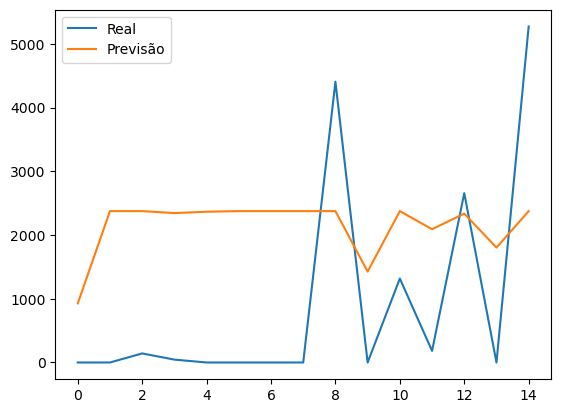

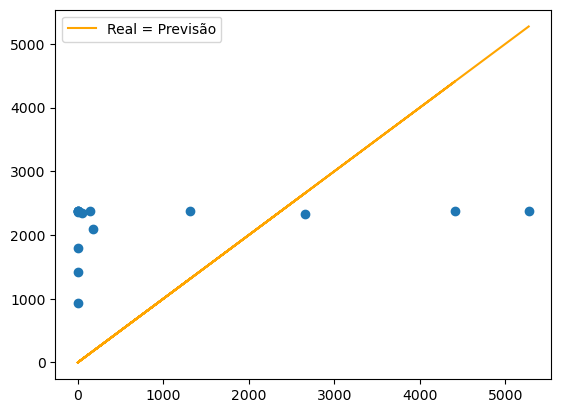

In [379]:
coeficiente = AR_fit.params #encontrar os parâmetros do modelo
passado = fotovoltaica_s_treino[len(fotovoltaica_s_treino)-1:]
passado = [passado[i] for i in range(len(passado))]
fotovoltaica_s_previsao = list() #definir lista no qual se vai guardar os valores previstos
for j in range(len(fotovoltaica_s_teste)):
    comprimento = len(passado)
    passo = [passado[i] for i in range(comprimento-1,comprimento)]
    valor = coeficiente[0]
    for k in range(1):
        valor += coeficiente[k+1] * passo[k]
    observado = fotovoltaica_s_teste[j]
    fotovoltaica_s_previsao.append(valor)
    passado.append(observado)
plt.plot(fotovoltaica_s_teste, label='Real') #desenhar os resultados
plt.plot(fotovoltaica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(fotovoltaica_s_teste, fotovoltaica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(fotovoltaica_s_teste, fotovoltaica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [380]:
MAE = metrics.mean_absolute_error(fotovoltaica_s_teste, fotovoltaica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(fotovoltaica_s_teste - fotovoltaica_s_previsao)
MSE = metrics.mean_squared_error(fotovoltaica_s_teste, fotovoltaica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(fotovoltaica_s_teste, fotovoltaica_s_previsao))
cvRMSE = RMSE / np.mean(fotovoltaica_s_teste)
NMBE = MBE / np.mean(fotovoltaica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
for coluna, valor in zip(colunas_nomes, valores):
    performance[coluna] = [valor]
performance.index = ['A'] #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,1917.834476,-1217.999156,4.129909e+06,2032.217805,2.17427,-1.303137


#### 4.7.5.3. Floresta Aleatória

In [381]:
FA = RandomForestRegressor(min_samples_leaf=5) #criar modelo
FA.fit(fotovoltaica_e_treino, fotovoltaica_s_treino) #treinar o modelo

RandomForestRegressor(min_samples_leaf=5)

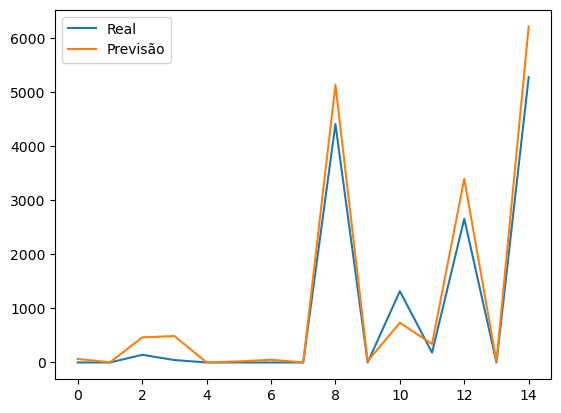

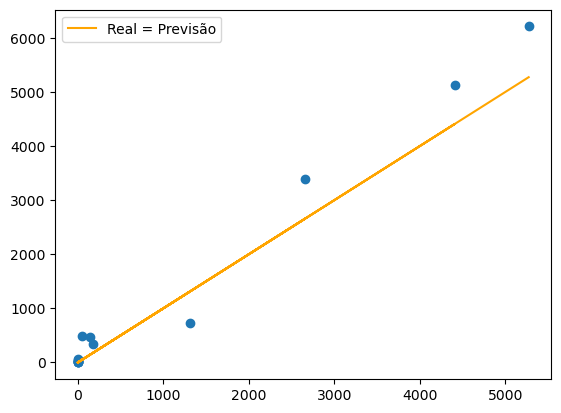

In [382]:
fotovoltaica_s_previsao = FA.predict(fotovoltaica_e_teste) #testar o modelo
plt.plot(fotovoltaica_s_teste, label='Real') #desenhar os resultados
plt.plot(fotovoltaica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(fotovoltaica_s_teste, fotovoltaica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(fotovoltaica_s_teste, fotovoltaica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [383]:
MAE = metrics.mean_absolute_error(fotovoltaica_s_teste, fotovoltaica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(fotovoltaica_s_teste - fotovoltaica_s_previsao)
MSE = metrics.mean_squared_error(fotovoltaica_s_teste, fotovoltaica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(fotovoltaica_s_teste, fotovoltaica_s_previsao))
cvRMSE = RMSE / np.mean(fotovoltaica_s_teste)
NMBE = MBE / np.mean(fotovoltaica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['FA'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,1917.834476,-1217.999156,4.129909e+06,2032.217805,2.174270,-1.303137
FA,272.529164,-194.750039,1.749633e+05,418.286161,0.447524,-0.208363


#### 4.7.5.4. Perceptron Multicamadas

In [384]:
PM = MLPRegressor(hidden_layer_sizes=(5,5,5)) #criar modelo
PM.fit(fotovoltaica_e_treino, fotovoltaica_s_treino) #treinar o modelo

C:\Users\mafal\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


MLPRegressor(hidden_layer_sizes=(5, 5, 5))

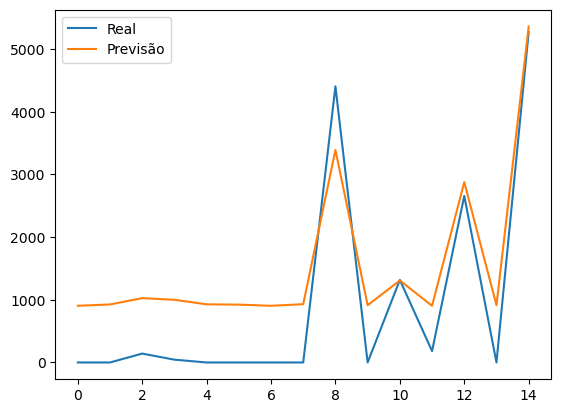

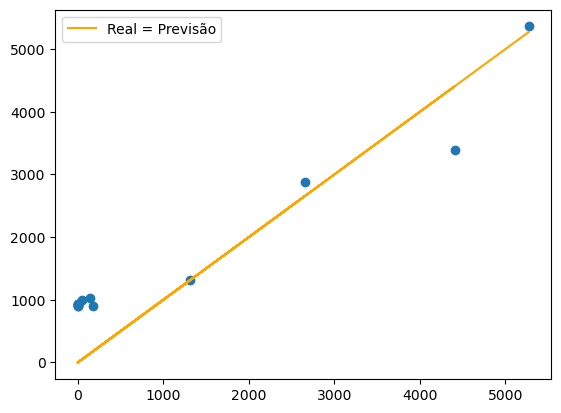

In [385]:
fotovoltaica_s_previsao = PM.predict(fotovoltaica_e_teste) #testar o modelo
plt.plot(fotovoltaica_s_teste, label='Real') #desenhar os resultados
plt.plot(fotovoltaica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(fotovoltaica_s_teste, fotovoltaica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(fotovoltaica_s_teste, fotovoltaica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [386]:
MAE = metrics.mean_absolute_error(fotovoltaica_s_teste, fotovoltaica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(fotovoltaica_s_teste - fotovoltaica_s_previsao)
MSE = metrics.mean_squared_error(fotovoltaica_s_teste, fotovoltaica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(fotovoltaica_s_teste, fotovoltaica_s_previsao))
cvRMSE = RMSE / np.mean(fotovoltaica_s_teste)
NMBE = MBE / np.mean(fotovoltaica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['PM'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,1917.834476,-1217.999156,4.129909e+06,2032.217805,2.174270,-1.303137
FA,272.529164,-194.750039,1.749633e+05,418.286161,0.447524,-0.208363
PM,749.066454,-612.648433,6.694271e+05,818.185238,0.875377,-0.655473


#### 4.7.5.5. Guardar Modelo

Com base nos valores obtidos para a performance do modelo, foi selecionado o que apresentou valores mais baixos (menores erros), correspondendo ao Regressor da Floresta Aleatória.

In [387]:
with open('faial_fotovoltaica.pkl','wb') as file: #guardar o modelo
    pickle.dump(FA, file)

### 4.8. Flores

#### 4.8.1. Gasóleo

In [388]:
colunas_nomes = ['MAE', 'MBE', 'MSE', 'RMSE', 'cvRMSE', 'NMBE'] #definir nome das colunas
performance = pd.DataFrame(columns=colunas_nomes) #criar dataframe no qual vamos guardar os parâmetros que avaliam a performance para posteriormente comparar

#### 4.8.1.1. Preparação dos Dados

In [389]:
gasoleo = flores.drop(['Hídrica', 'Eólica', 'Fotovoltaica', 'Total', 'Hídrica-1', 'Eólica-1', 'Fotovoltaica-1', 'Total-1'], axis=1)  #eliminar as colunas que não se vão usar
gasoleo_saida = gasoleo.values[:,4]
gasoleo_entradas = gasoleo.values[:,[0,1,2,3,5]]
gasoleo_e_treino, gasoleo_e_teste, gasoleo_s_treino, gasoleo_s_teste = train_test_split(gasoleo_entradas,gasoleo_saida) #definir dados para treino (75%) e para teste (25%)

#### 4.8.1.2. Autoregressão

In [390]:
AR = AutoReg(gasoleo_s_treino, lags=1)
AR_fit = AR.fit()

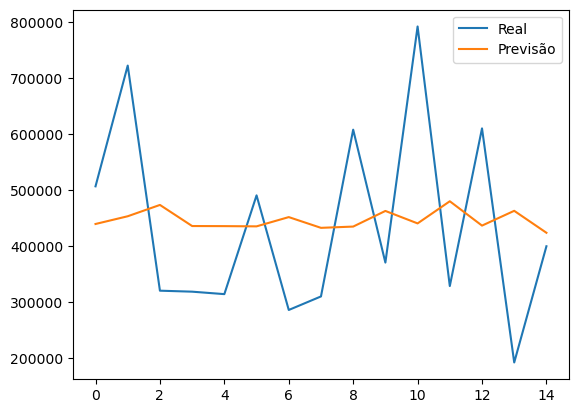

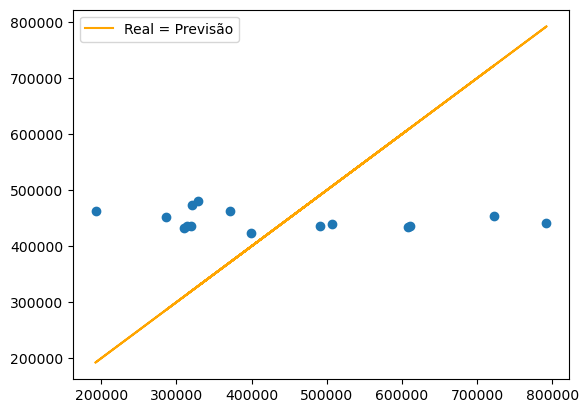

In [391]:
coeficiente = AR_fit.params #encontrar os parâmetros do modelo
passado = gasoleo_s_treino[len(gasoleo_s_treino)-1:]
passado = [passado[i] for i in range(len(passado))]
gasoleo_s_previsao = list() #definir lista no qual se vai guardar os valores previstos
for j in range(len(gasoleo_s_teste)):
    comprimento = len(passado)
    passo = [passado[i] for i in range(comprimento-1,comprimento)]
    valor = coeficiente[0]
    for k in range(1):
        valor += coeficiente[k+1] * passo[k]
    observado = gasoleo_s_teste[j]
    gasoleo_s_previsao.append(valor)
    passado.append(observado)
plt.plot(gasoleo_s_teste, label='Real') #desenhar os resultados
plt.plot(gasoleo_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(gasoleo_s_teste, gasoleo_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(gasoleo_s_teste, gasoleo_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [392]:
MAE = metrics.mean_absolute_error(gasoleo_s_teste, gasoleo_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(gasoleo_s_teste - gasoleo_s_previsao)
MSE = metrics.mean_squared_error(gasoleo_s_teste, gasoleo_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(gasoleo_s_teste, gasoleo_s_previsao))
cvRMSE = RMSE / np.mean(gasoleo_s_teste)
NMBE = MBE / np.mean(gasoleo_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
for coluna, valor in zip(colunas_nomes, valores):
    performance[coluna] = [valor]
performance.index = ['A'] #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,153823.09296,-8577.094387,3.086770e+10,175692.06016,0.401004,-0.019577


#### 4.8.1.3. Floresta Aleatória

In [393]:
FA = RandomForestRegressor(min_samples_leaf=5) #criar modelo
FA.fit(gasoleo_e_treino, gasoleo_s_treino) #treinar o modelo

RandomForestRegressor(min_samples_leaf=5)

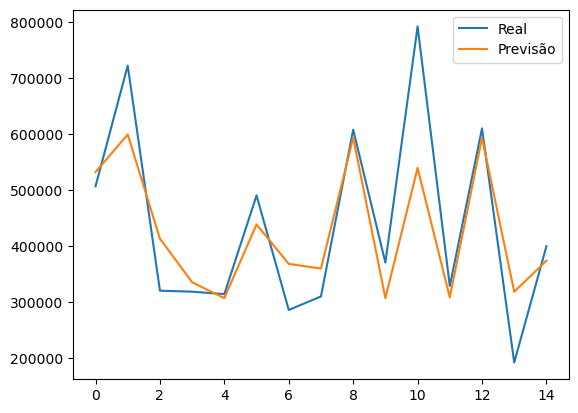

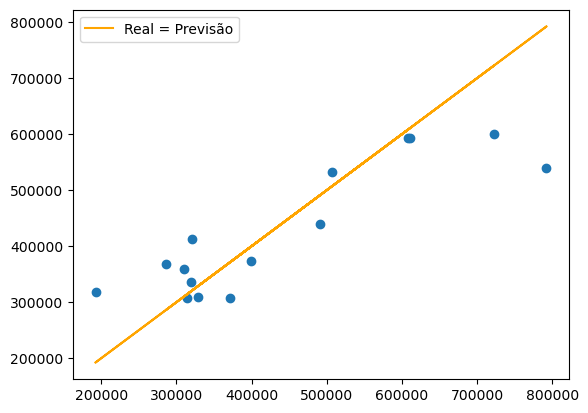

In [394]:
gasoleo_s_previsao = FA.predict(gasoleo_e_teste) #testar o modelo
plt.plot(gasoleo_s_teste, label='Real')
plt.plot(gasoleo_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(gasoleo_s_teste, gasoleo_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(gasoleo_s_teste, gasoleo_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [395]:
MAE = metrics.mean_absolute_error(gasoleo_s_teste, gasoleo_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(gasoleo_s_teste - gasoleo_s_previsao)
MSE = metrics.mean_squared_error(gasoleo_s_teste, gasoleo_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(gasoleo_s_teste, gasoleo_s_previsao))
cvRMSE = RMSE / np.mean(gasoleo_s_teste)
NMBE = MBE / np.mean(gasoleo_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['FA'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,153823.092960,-8577.094387,3.086770e+10,175692.060160,0.401004,-0.019577
FA,64536.973412,12122.493461,8.128645e+09,90158.997608,0.205781,0.027669


#### 4.8.1.4. Perceptron Multicamadas

In [396]:
PM = MLPRegressor(hidden_layer_sizes=(5,5,5)) #criar modelo
PM.fit(gasoleo_e_treino, gasoleo_s_treino) #treinar o modelo

MLPRegressor(hidden_layer_sizes=(5, 5, 5))

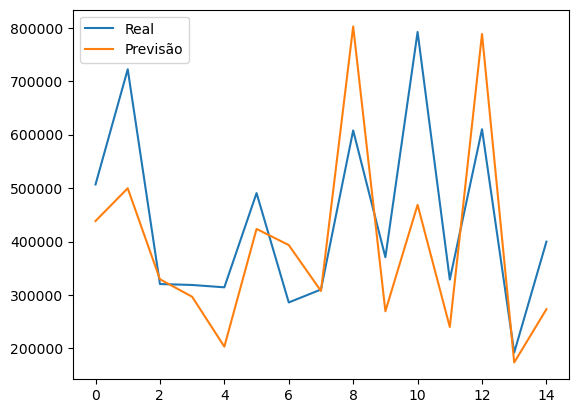

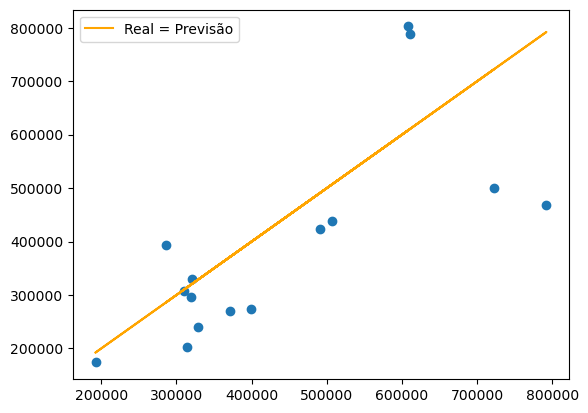

In [397]:
gasoleo_s_previsao = PM.predict(gasoleo_e_teste) #testar o modelo
plt.plot(gasoleo_s_teste, label='Real')
plt.plot(gasoleo_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(gasoleo_s_teste, gasoleo_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(gasoleo_s_teste, gasoleo_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [398]:
MAE = metrics.mean_absolute_error(gasoleo_s_teste, gasoleo_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(gasoleo_s_teste - gasoleo_s_previsao)
MSE = metrics.mean_squared_error(gasoleo_s_teste, gasoleo_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(gasoleo_s_teste, gasoleo_s_previsao))
cvRMSE = RMSE / np.mean(gasoleo_s_teste)
NMBE = MBE / np.mean(gasoleo_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['PM'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,153823.092960,-8577.094387,3.086770e+10,175692.060160,0.401004,-0.019577
FA,64536.973412,12122.493461,8.128645e+09,90158.997608,0.205781,0.027669
PM,109402.455932,44195.356614,1.944978e+10,139462.477152,0.318313,0.100873


#### 4.8.1.5. Guardar Modelo

Com base nos valores obtidos para a performance do modelo, foi selecionado o que apresentou valores mais baixos (menores erros), correspondendo ao Regressor da Floresta Aleatória.

In [399]:
with open('flores_gasoleo.pkl','wb') as file: #guardar o modelo
    pickle.dump(FA, file)

#### 4.8.2. Hídrica

In [404]:
colunas_nomes = ['MAE', 'MBE', 'MSE', 'RMSE', 'cvRMSE', 'NMBE'] #definir nome das colunas
performance = pd.DataFrame(columns=colunas_nomes) #criar dataframe no qual vamos guardar os parâmetros que avaliam a performance para posteriormente comparar

#### 4.8.2.1. Preparação dos Dados

In [405]:
hidrica = flores.drop(['Gasóleo', 'Eólica', 'Fotovoltaica', 'Total', 'Gasóleo-1', 'Eólica-1', 'Fotovoltaica-1', 'Total-1'], axis=1)  #eliminar as colunas que não se vão usar
hidrica_saida = hidrica.values[:,4]
hidrica_entradas = hidrica.values[:,[0,1,2,3,5]]
hidrica_e_treino, hidrica_e_teste, hidrica_s_treino, hidrica_s_teste = train_test_split(hidrica_entradas,hidrica_saida) #definir dados para treino (75%) e para teste (25%)

#### 4.8.2.2. Autoregressão

É usada na análise de séries temporais e pressupõe que o valor atual de uma série temporal é uma função de seus valores passados.

In [406]:
AR = AutoReg(hidrica_s_treino, lags=1)
AR_fit = AR.fit()

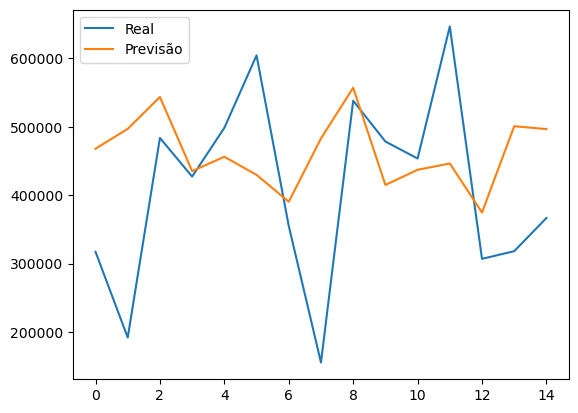

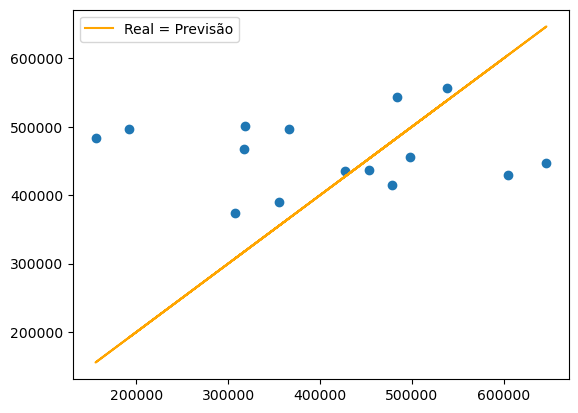

In [407]:
coeficiente = AR_fit.params #encontrar os parâmetros do modelo
passado = hidrica_s_treino[len(hidrica_s_treino)-1:]
passado = [passado[i] for i in range(len(passado))]
hidrica_s_previsao = list() #definir lista no qual se vai guardar os valores previstos
for j in range(len(hidrica_s_teste)):
    comprimento = len(passado)
    passo = [passado[i] for i in range(comprimento-1,comprimento)]
    valor = coeficiente[0]
    for k in range(1):
        valor += coeficiente[k+1] * passo[k]
    observado = hidrica_s_teste[j]
    hidrica_s_previsao.append(valor)
    passado.append(observado)
plt.plot(hidrica_s_teste, label='Real') #desenhar os resultados
plt.plot(hidrica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(hidrica_s_teste, hidrica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(hidrica_s_teste, hidrica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [408]:
MAE = metrics.mean_absolute_error(hidrica_s_teste, hidrica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(hidrica_s_teste - hidrica_s_previsao)
MSE = metrics.mean_squared_error(hidrica_s_teste, hidrica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(hidrica_s_teste, hidrica_s_previsao))
cvRMSE = RMSE / np.mean(hidrica_s_teste)
NMBE = MBE / np.mean(hidrica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
for coluna, valor in zip(colunas_nomes, valores):
    performance[coluna] = [valor]
performance.index = ['A'] #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,118931.053223,-52612.424127,2.401367e+10,154963.459842,0.378422,-0.12848


#### 4.8.2.3. Floresta Aleatória

In [409]:
FA = RandomForestRegressor(min_samples_leaf=5) #criar modelo
FA.fit(hidrica_e_treino, hidrica_s_treino) #treinar o modelo

RandomForestRegressor(min_samples_leaf=5)

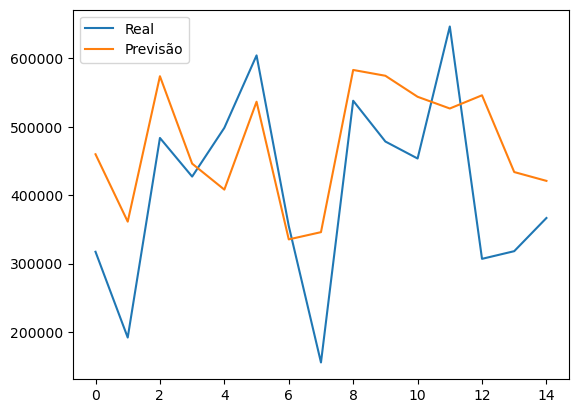

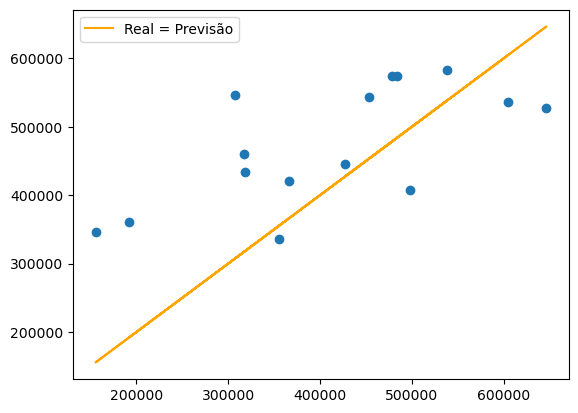

In [410]:
hidrica_s_previsao = FA.predict(hidrica_e_teste) #testar o modelo
plt.plot(hidrica_s_teste, label='Real') #desenhar os resultados
plt.plot(hidrica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(hidrica_s_teste, hidrica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(hidrica_s_teste, hidrica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [411]:
MAE = metrics.mean_absolute_error(hidrica_s_teste, hidrica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(hidrica_s_teste - hidrica_s_previsao)
MSE = metrics.mean_squared_error(hidrica_s_teste, hidrica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(hidrica_s_teste, hidrica_s_previsao))
cvRMSE = RMSE / np.mean(hidrica_s_teste)
NMBE = MBE / np.mean(hidrica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['FA'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,118931.053223,-52612.424127,2.401367e+10,154963.459842,0.378422,-0.128480
FA,103357.414209,-63663.359931,1.429478e+10,119560.785630,0.291968,-0.155466


#### 4.8.2.4. Perceptron Multicamadas

In [412]:
PM = MLPRegressor(hidden_layer_sizes=(5,5,5)) #criar modelo
PM.fit(hidrica_e_treino, hidrica_s_treino) #treinar o modelo

C:\Users\mafal\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


MLPRegressor(hidden_layer_sizes=(5, 5, 5))

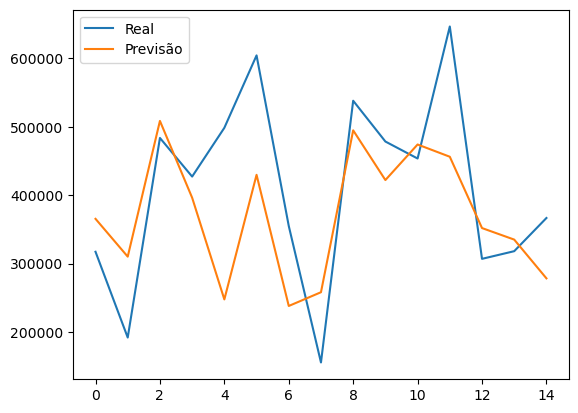

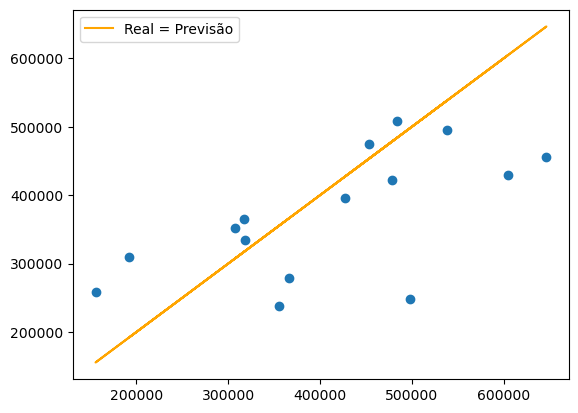

In [413]:
hidrica_s_previsao = PM.predict(hidrica_e_teste) #testar o modelo
plt.plot(hidrica_s_teste, label='Real') #desenhar os resultados
plt.plot(hidrica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(hidrica_s_teste, hidrica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(hidrica_s_teste, hidrica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [414]:
MAE = metrics.mean_absolute_error(hidrica_s_teste, hidrica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(hidrica_s_teste - hidrica_s_previsao)
MSE = metrics.mean_squared_error(hidrica_s_teste, hidrica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(hidrica_s_teste, hidrica_s_previsao))
cvRMSE = RMSE / np.mean(hidrica_s_teste)
NMBE = MBE / np.mean(hidrica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['PM'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,118931.053223,-52612.424127,2.401367e+10,154963.459842,0.378422,-0.128480
FA,103357.414209,-63663.359931,1.429478e+10,119560.785630,0.291968,-0.155466
PM,88568.637196,38357.124766,1.249953e+10,111801.316419,0.273019,0.093668


#### 4.8.2.5. Guardar Modelo

Com base nos valores obtidos para a performance do modelo, foi selecionado o que apresentou valores mais baixos (menores erros), correspondendo ao Regressor de Perceptron Multicamadas.

In [415]:
with open('flores_hidrica.pkl','wb') as file: #guardar o modelo
    pickle.dump(PM, file)

#### 4.8.3. Eólica

In [416]:
colunas_nomes = ['MAE', 'MBE', 'MSE', 'RMSE', 'cvRMSE', 'NMBE'] #definir nome das colunas
performance = pd.DataFrame(columns=colunas_nomes) #criar dataframe no qual vamos guardar os parâmetros que avaliam a performance para posteriormente comparar

#### 4.8.3.1. Preparação dos Dados

In [417]:
eolica = flores.drop(['Gasóleo', 'Hídrica', 'Fotovoltaica', 'Total', 'Gasóleo-1', 'Hídrica-1', 'Fotovoltaica-1', 'Total-1'], axis=1)  #eliminar as colunas que não se vão usar
eolica_saida = eolica.values[:,4]
eolica_entradas = eolica.values[:,[0,1,2,3,5]]
eolica_e_treino, eolica_e_teste, eolica_s_treino, eolica_s_teste = train_test_split(eolica_entradas,eolica_saida) #definir dados para treino (75%) e para teste (25%)

#### 4.8.3.2. Autoregressão

In [418]:
AR = AutoReg(eolica_s_treino, lags=1)
AR_fit = AR.fit()

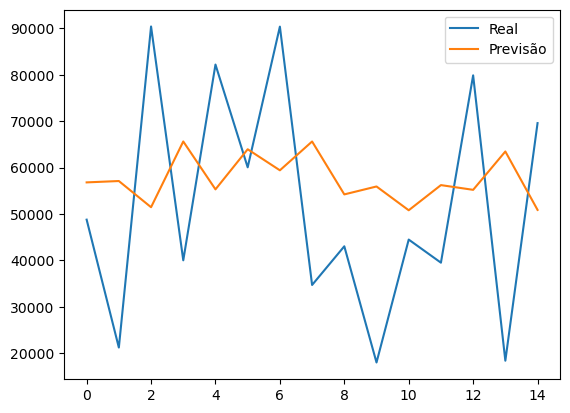

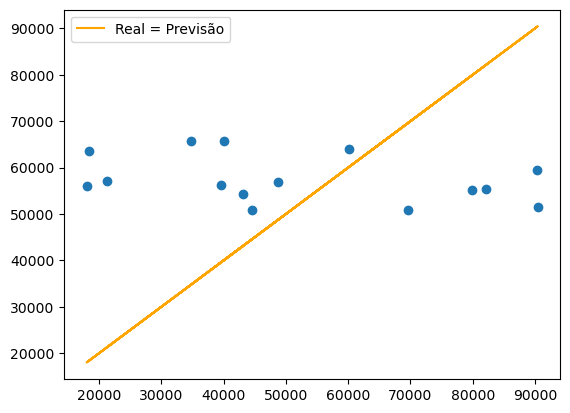

In [419]:
coeficiente = AR_fit.params #encontrar os parâmetros do modelo
passado = eolica_s_treino[len(eolica_s_treino)-1:]
passado = [passado[i] for i in range(len(passado))]
eolica_s_previsao = list() #definir lista no qual se vai guardar os valores previstos
for j in range(len(eolica_s_teste)):
    comprimento = len(passado)
    passo = [passado[i] for i in range(comprimento-1,comprimento)]
    valor = coeficiente[0]
    for k in range(1):
        valor += coeficiente[k+1] * passo[k]
    observado = eolica_s_teste[j]
    eolica_s_previsao.append(valor)
    passado.append(observado)
plt.plot(eolica_s_teste, label='Real') #desenhar os resultados
plt.plot(eolica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(eolica_s_teste, eolica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(eolica_s_teste, eolica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [420]:
MAE = metrics.mean_absolute_error(eolica_s_teste, eolica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(eolica_s_teste - eolica_s_previsao)
MSE = metrics.mean_squared_error(eolica_s_teste, eolica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(eolica_s_teste, eolica_s_previsao))
cvRMSE = RMSE / np.mean(eolica_s_teste)
NMBE = MBE / np.mean(eolica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
for coluna, valor in zip(colunas_nomes, valores):
    performance[coluna] = [valor]
performance.index = ['A'] #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,24121.420109,-5426.892122,7.371272e+08,27150.086884,0.521736,-0.104287


#### 4.8.3.3. Floresta Aleatória

In [421]:
FA = RandomForestRegressor(min_samples_leaf=5) #criar modelo
FA.fit(eolica_e_treino, eolica_s_treino) #treinar o modelo

RandomForestRegressor(min_samples_leaf=5)

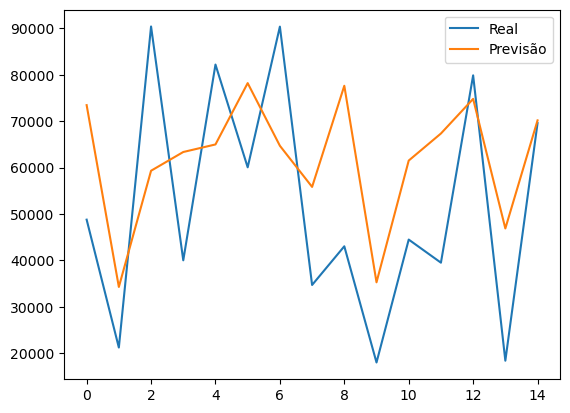

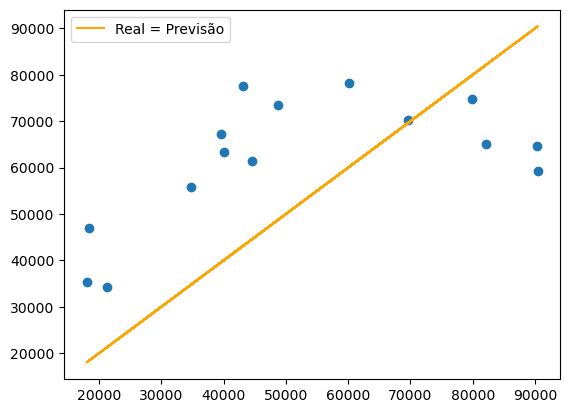

In [423]:
eolica_s_previsao = FA.predict(eolica_e_teste) #testar o modelo
plt.plot(eolica_s_teste, label='Real')
plt.plot(eolica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(eolica_s_teste, eolica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(eolica_s_teste, eolica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [424]:
MAE = metrics.mean_absolute_error(eolica_s_teste, eolica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(eolica_s_teste - eolica_s_previsao)
MSE = metrics.mean_squared_error(eolica_s_teste, eolica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(eolica_s_teste, eolica_s_previsao))
cvRMSE = RMSE / np.mean(eolica_s_teste)
NMBE = MBE / np.mean(eolica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['FA'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,24121.420109,-5426.892122,7.371272e+08,27150.086884,0.521736,-0.104287
FA,20352.863327,-9809.921310,4.949145e+08,22246.675016,0.427509,-0.188515


#### 4.8.3.4. Perceptron Multicamadas

In [425]:
PM = MLPRegressor(hidden_layer_sizes=(5,5,5)) #criar modelo
PM.fit(eolica_e_treino, eolica_s_treino) #treinar o modelo

C:\Users\mafal\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


MLPRegressor(hidden_layer_sizes=(5, 5, 5))

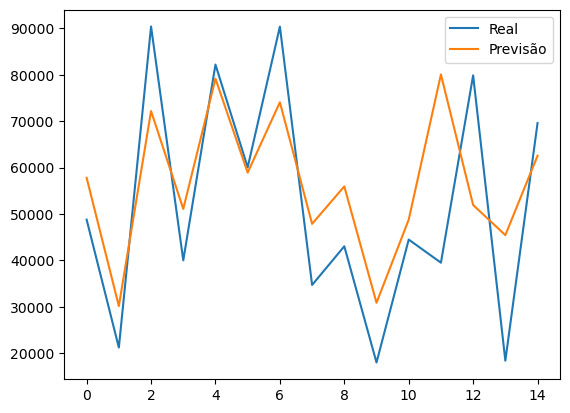

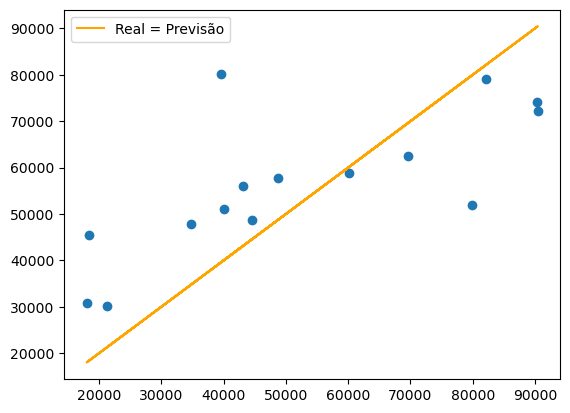

In [426]:
eolica_s_previsao = PM.predict(eolica_e_teste) #testar o modelo
plt.plot(eolica_s_teste, label='Real')
plt.plot(eolica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(eolica_s_teste, eolica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(eolica_s_teste, eolica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [427]:
MAE = metrics.mean_absolute_error(eolica_s_teste, eolica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(eolica_s_teste - eolica_s_previsao)
MSE = metrics.mean_squared_error(eolica_s_teste, eolica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(eolica_s_teste, eolica_s_previsao))
cvRMSE = RMSE / np.mean(eolica_s_teste)
NMBE = MBE / np.mean(eolica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['PM'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,24121.420109,-5426.892122,7.371272e+08,27150.086884,0.521736,-0.104287
FA,20352.863327,-9809.921310,4.949145e+08,22246.675016,0.427509,-0.188515
PM,14241.118241,-4414.296596,3.084024e+08,17561.389472,0.337473,-0.084828


#### 4.8.3.5. Guardar Modelo

Com base nos valores obtidos para a performance do modelo, foi selecionado o que apresentou valores mais baixos (menores erros), correspondendo ao Regressor de Perceptron de Multicamadas.

In [428]:
with open('flores_eolica.pkl','wb') as file: #guardar o modelo
    pickle.dump(PM, file)

#### 4.8.4. Fotovoltaica

In [444]:
colunas_nomes = ['MAE', 'MBE', 'MSE', 'RMSE', 'cvRMSE', 'NMBE'] #definir nome das colunas
performance = pd.DataFrame(columns=colunas_nomes) #criar dataframe no qual vamos guardar os parâmetros que avaliam a performance para posteriormente comparar

#### 4.8.4.1. Preparação dos Dados

In [445]:
fotovoltaica = flores.drop(['Gasóleo', 'Hídrica', 'Eólica', 'Total', 'Gasóleo-1', 'Hídrica-1', 'Eólica-1', 'Total-1'], axis=1)  #eliminar as colunas que não se vão usar
fotovoltaica_saida = fotovoltaica.values[:,4]
fotovoltaica_entradas = fotovoltaica.values[:,[0,1,2,3,5]]
fotovoltaica_e_treino, fotovoltaica_e_teste, fotovoltaica_s_treino, fotovoltaica_s_teste = train_test_split(fotovoltaica_entradas,fotovoltaica_saida) #definir dados para treino (75%) e para teste (25%)

#### 4.8.4.2. Autoregressão

In [446]:
AR = AutoReg(fotovoltaica_s_treino, lags=1)
AR_fit = AR.fit()

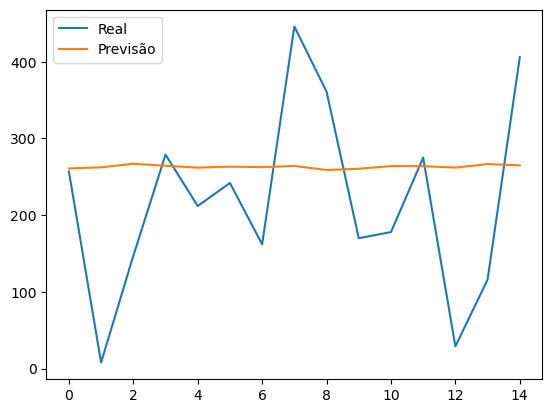

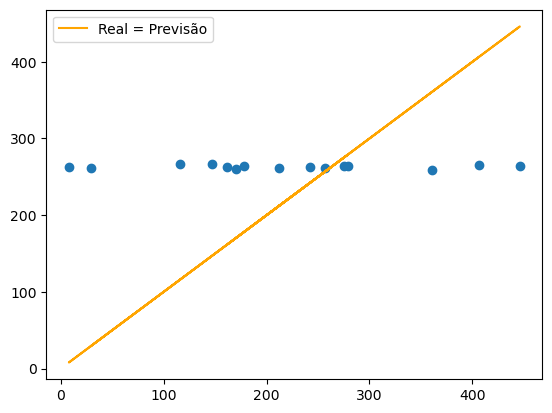

In [447]:
coeficiente = AR_fit.params #encontrar os parâmetros do modelo
passado = fotovoltaica_s_treino[len(fotovoltaica_s_treino)-1:]
passado = [passado[i] for i in range(len(passado))]
fotovoltaica_s_previsao = list() #definir lista no qual se vai guardar os valores previstos
for j in range(len(fotovoltaica_s_teste)):
    comprimento = len(passado)
    passo = [passado[i] for i in range(comprimento-1,comprimento)]
    valor = coeficiente[0]
    for k in range(1):
        valor += coeficiente[k+1] * passo[k]
    observado = fotovoltaica_s_teste[j]
    fotovoltaica_s_previsao.append(valor)
    passado.append(observado)
plt.plot(fotovoltaica_s_teste, label='Real') #desenhar os resultados
plt.plot(fotovoltaica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(fotovoltaica_s_teste, fotovoltaica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(fotovoltaica_s_teste, fotovoltaica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [448]:
MAE = metrics.mean_absolute_error(fotovoltaica_s_teste, fotovoltaica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(fotovoltaica_s_teste - fotovoltaica_s_previsao)
MSE = metrics.mean_squared_error(fotovoltaica_s_teste, fotovoltaica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(fotovoltaica_s_teste, fotovoltaica_s_previsao))
cvRMSE = RMSE / np.mean(fotovoltaica_s_teste)
NMBE = MBE / np.mean(fotovoltaica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
for coluna, valor in zip(colunas_nomes, valores):
    performance[coluna] = [valor]
performance.index = ['A'] #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,104.065506,-43.973897,16566.850675,128.712279,0.587191,-0.200611


#### 4.8.4.3. Floresta Aleatória

In [449]:
FA = RandomForestRegressor(min_samples_leaf=5) #criar modelo
FA.fit(fotovoltaica_e_treino, fotovoltaica_s_treino) #treinar o modelo

RandomForestRegressor(min_samples_leaf=5)

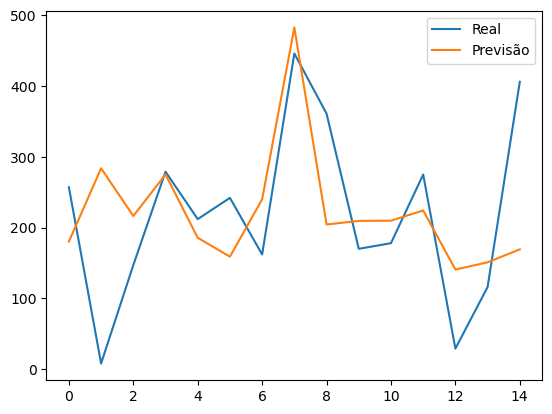

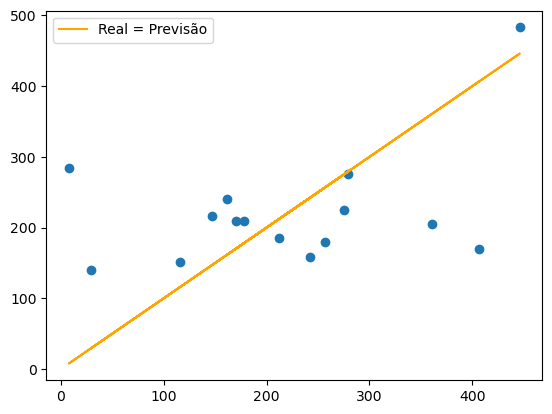

In [450]:
fotovoltaica_s_previsao = FA.predict(fotovoltaica_e_teste) #testar o modelo
plt.plot(fotovoltaica_s_teste, label='Real') #desenhar os resultados
plt.plot(fotovoltaica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(fotovoltaica_s_teste, fotovoltaica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(fotovoltaica_s_teste, fotovoltaica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [451]:
MAE = metrics.mean_absolute_error(fotovoltaica_s_teste, fotovoltaica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(fotovoltaica_s_teste - fotovoltaica_s_previsao)
MSE = metrics.mean_squared_error(fotovoltaica_s_teste, fotovoltaica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(fotovoltaica_s_teste, fotovoltaica_s_previsao))
cvRMSE = RMSE / np.mean(fotovoltaica_s_teste)
NMBE = MBE / np.mean(fotovoltaica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['FA'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,104.065506,-43.973897,16566.850675,128.712279,0.587191,-0.200611
FA,87.469669,-2.907766,13417.036491,115.831932,0.528430,-0.013265


#### 4.8.4.4. Perceptron Multicamadas

In [452]:
PM = MLPRegressor(hidden_layer_sizes=(5,5,5)) #criar modelo
PM.fit(fotovoltaica_e_treino, fotovoltaica_s_treino) #treinar o modelo

C:\Users\mafal\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


MLPRegressor(hidden_layer_sizes=(5, 5, 5))

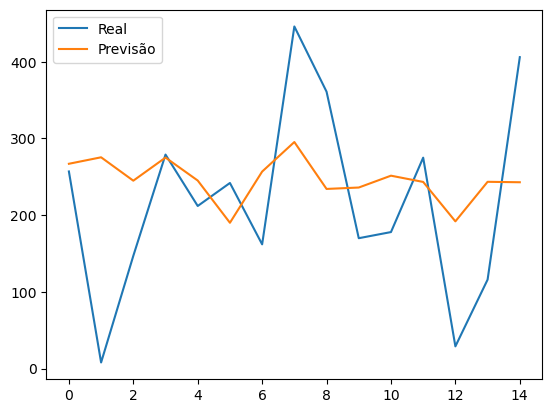

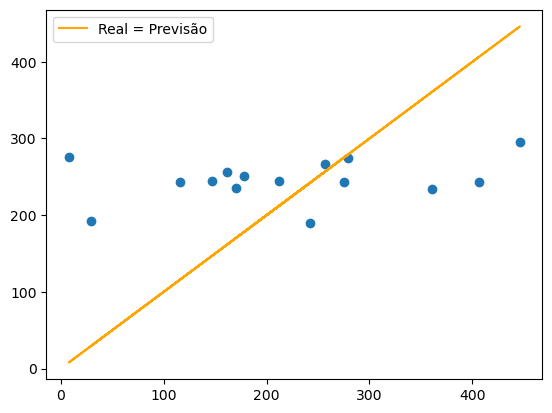

In [453]:
fotovoltaica_s_previsao = PM.predict(fotovoltaica_e_teste) #testar o modelo
plt.plot(fotovoltaica_s_teste, label='Real') #desenhar os resultados
plt.plot(fotovoltaica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(fotovoltaica_s_teste, fotovoltaica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(fotovoltaica_s_teste, fotovoltaica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [454]:
MAE = metrics.mean_absolute_error(fotovoltaica_s_teste, fotovoltaica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(fotovoltaica_s_teste - fotovoltaica_s_previsao)
MSE = metrics.mean_squared_error(fotovoltaica_s_teste, fotovoltaica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(fotovoltaica_s_teste, fotovoltaica_s_previsao))
cvRMSE = RMSE / np.mean(fotovoltaica_s_teste)
NMBE = MBE / np.mean(fotovoltaica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['PM'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,104.065506,-43.973897,16566.850675,128.712279,0.587191,-0.200611
FA,87.469669,-2.907766,13417.036491,115.831932,0.528430,-0.013265
PM,97.427417,-27.043756,14198.573763,119.157768,0.543603,-0.123375


#### 4.8.4.5. Guardar Modelo

Com base nos valores obtidos para a performance do modelo, foi selecionado o que apresentou valores mais baixos (menores erros), correspondendo ao Regressor da Floresta Aleatória.

In [455]:
with open('flores_fotovoltaica.pkl','wb') as file: #guardar o modelo
    pickle.dump(FA, file)

### 4.9. Corvo

### 4.9.1. Gasóleo

In [994]:
colunas_nomes = ['MAE', 'MBE', 'MSE', 'RMSE', 'cvRMSE', 'NMBE'] #definir nome das colunas
performance = pd.DataFrame(columns=colunas_nomes) #criar dataframe no qual vamos guardar os parâmetros que avaliam a performance para posteriormente comparar

#### 4.9.1.1. Preparação dos Dados

In [995]:
gasoleo = corvo.drop(['Fotovoltaica', 'Total', 'Fotovoltaica-1', 'Total-1'], axis=1)  #eliminar as colunas que não se vão usar
gasoleo_saida = gasoleo.values[:,4]
gasoleo_entradas = gasoleo.values[:,[0,1,2,3,5]]
gasoleo_e_treino, gasoleo_e_teste, gasoleo_s_treino, gasoleo_s_teste = train_test_split(gasoleo_entradas,gasoleo_saida) #definir dados para treino (75%) e para teste (25%)

#### 4.9.1.2. Autoregressão

É usada na análise de séries temporais e pressupõe que o valor atual de uma série temporal é uma função de seus valores passados.

In [996]:
AR = AutoReg(gasoleo_s_treino, lags=1)
AR_fit = AR.fit()

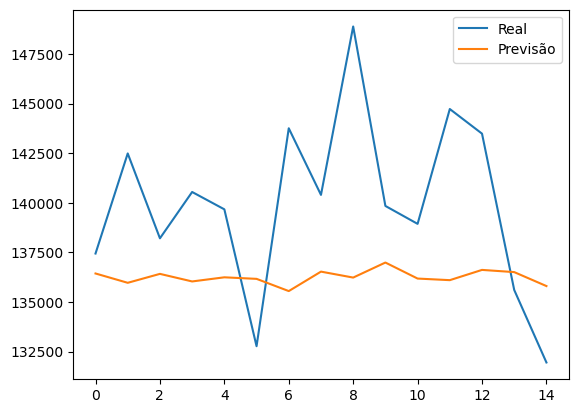

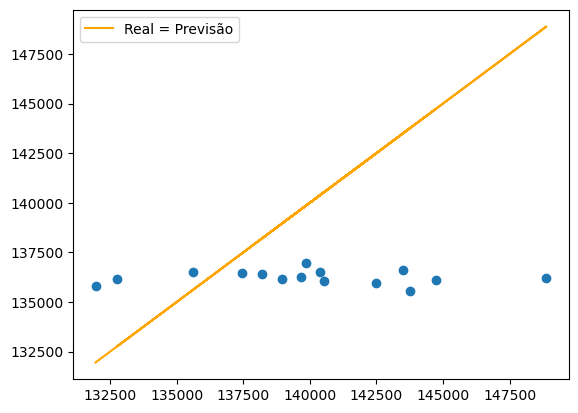

In [997]:
coeficiente = AR_fit.params #encontrar os parâmetros do modelo
passado = gasoleo_s_treino[len(gasoleo_s_treino)-1:]
passado = [passado[i] for i in range(len(passado))]
gasoleo_s_previsao = list() #definir lista no qual se vai guardar os valores previstos
for j in range(len(gasoleo_s_teste)):
    comprimento = len(passado)
    passo = [passado[i] for i in range(comprimento-1,comprimento)]
    valor = coeficiente[0]
    for k in range(1):
        valor += coeficiente[k+1] * passo[k]
    observado = gasoleo_s_teste[j]
    gasoleo_s_previsao.append(valor)
    passado.append(observado)
plt.plot(gasoleo_s_teste, label='Real') #desenhar os resultados
plt.plot(gasoleo_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(gasoleo_s_teste, gasoleo_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(gasoleo_s_teste, gasoleo_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [998]:
MAE = metrics.mean_absolute_error(gasoleo_s_teste, gasoleo_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(gasoleo_s_teste - gasoleo_s_previsao)
MSE = metrics.mean_squared_error(gasoleo_s_teste, gasoleo_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(gasoleo_s_teste, gasoleo_s_previsao))
cvRMSE = RMSE / np.mean(gasoleo_s_teste)
NMBE = MBE / np.mean(gasoleo_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
for coluna, valor in zip(colunas_nomes, valores):
    performance[coluna] = [valor]
performance.index = ['A'] #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,4747.06685,3661.271861,3.235937e+07,5688.53009,0.040658,0.026168


#### 4.9.1.3. Floresta Aleatória

Utiliza o conceito de árvores de decisão, treinando-as de forma independente com uma amostra aleatória e a previsão final corresponde à média das previsões.

In [999]:
FA = RandomForestRegressor(min_samples_leaf=5) #criar modelo
FA.fit(gasoleo_e_treino, gasoleo_s_treino) #treinar o modelo

RandomForestRegressor(min_samples_leaf=5)

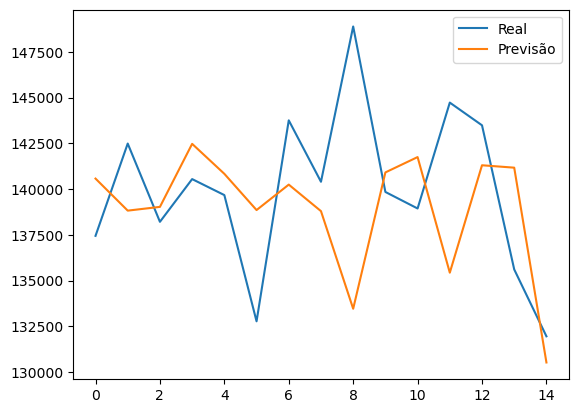

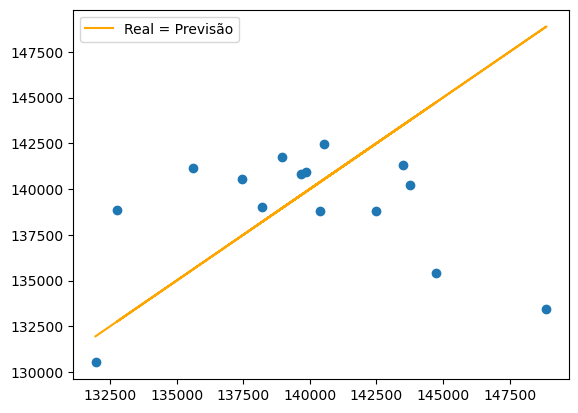

In [1000]:
gasoleo_s_previsao = FA.predict(gasoleo_e_teste) #testar o modelo
plt.plot(gasoleo_s_teste, label='Real')
plt.plot(gasoleo_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(gasoleo_s_teste, gasoleo_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(gasoleo_s_teste, gasoleo_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [1001]:
MAE = metrics.mean_absolute_error(gasoleo_s_teste, gasoleo_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(gasoleo_s_teste - gasoleo_s_previsao)
MSE = metrics.mean_squared_error(gasoleo_s_teste, gasoleo_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(gasoleo_s_teste, gasoleo_s_previsao))
cvRMSE = RMSE / np.mean(gasoleo_s_teste)
NMBE = MBE / np.mean(gasoleo_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['FA'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,4747.06685,3661.271861,3.235937e+07,5688.530090,0.040658,0.026168
FA,3977.33583,970.752059,3.011926e+07,5488.101358,0.039225,0.006938


#### 4.9.1.4. Perceptron Multicamadas

Utiliza o conceito de neural networks, isto é, entre a camada de entrada e saída existem camadas ocultas que aplicam transformações às variáveis.

In [1002]:
PM = MLPRegressor(hidden_layer_sizes=(5,5,5)) #criar modelo
PM.fit(gasoleo_e_treino, gasoleo_s_treino) #treinar o modelo

C:\Users\mafal\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


MLPRegressor(hidden_layer_sizes=(5, 5, 5))

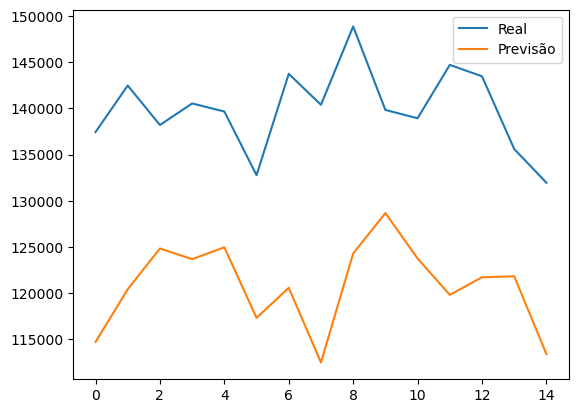

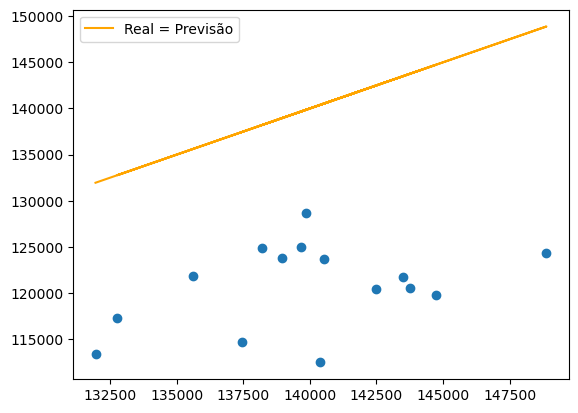

In [1003]:
gasoleo_s_previsao = PM.predict(gasoleo_e_teste) #testar o modelo
plt.plot(gasoleo_s_teste, label='Real')
plt.plot(gasoleo_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(gasoleo_s_teste, gasoleo_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(gasoleo_s_teste, gasoleo_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [1004]:
MAE = metrics.mean_absolute_error(gasoleo_s_teste, gasoleo_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(gasoleo_s_teste - gasoleo_s_previsao)
MSE = metrics.mean_squared_error(gasoleo_s_teste, gasoleo_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(gasoleo_s_teste, gasoleo_s_previsao))
cvRMSE = RMSE / np.mean(gasoleo_s_teste)
NMBE = MBE / np.mean(gasoleo_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['PM'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,4747.066850,3661.271861,3.235937e+07,5688.530090,0.040658,0.026168
FA,3977.335830,970.752059,3.011926e+07,5488.101358,0.039225,0.006938
PM,19088.265641,19088.265641,3.886710e+08,19714.741880,0.140908,0.136431


#### 4.9.1.5. Guardar Modelo

Com base nos valores obtidos para a performance do modelo, foi selecionado o que apresentou valores mais baixos (menores erros), correspondendo ao Regressor da Floresta Aleatória.

In [1005]:
with open('corvo_gasoleo.pkl','wb') as file: #guardar o modelo
    pickle.dump(FA, file)

### 4.9.2. Fotovoltaica

In [1043]:
colunas_nomes = ['MAE', 'MBE', 'MSE', 'RMSE', 'cvRMSE', 'NMBE'] #definir nome das colunas
performance = pd.DataFrame(columns=colunas_nomes) #criar dataframe no qual vamos guardar os parâmetros que avaliam a performance para posteriormente comparar

#### 4.9.2.1. Preparação dos Dados

In [1045]:
fotovoltaica = corvo.drop(['Gasóleo', 'Total', 'Gasóleo-1', 'Total-1'], axis=1)  #eliminar as colunas que não se vão usar
fotovoltaica_saida = fotovoltaica.values[:,4]
fotovoltaica_entradas = fotovoltaica.values[:,[0,1,2,3,5]]
fotovoltaica_e_treino, fotovoltaica_e_teste, fotovoltaica_s_treino, fotovoltaica_s_teste = train_test_split(fotovoltaica_entradas,fotovoltaica_saida) #definir dados para treino (75%) e para teste (25%)

#### 4.9.2.2. Autoregressão

É usada na análise de séries temporais e pressupõe que o valor atual de uma série temporal é uma função de seus valores passados.

In [1046]:
AR = AutoReg(fotovoltaica_s_treino, lags=1)
AR_fit = AR.fit()

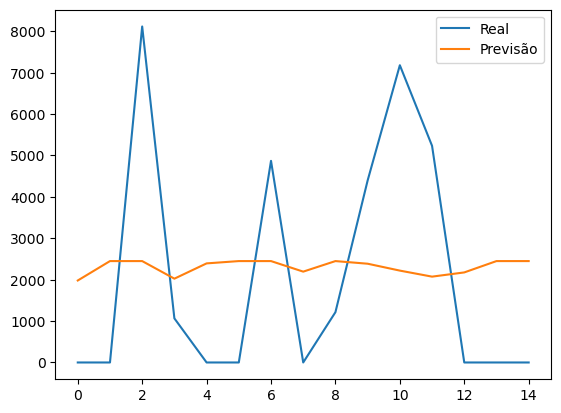

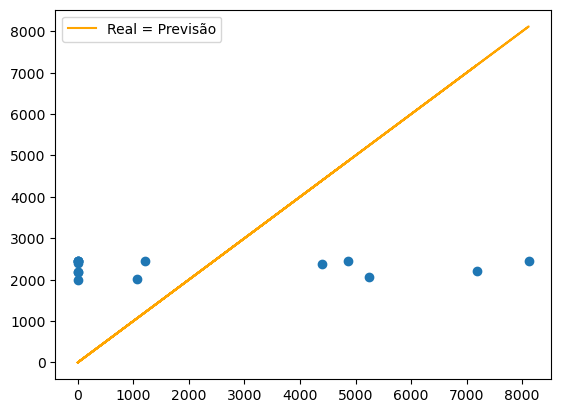

In [1047]:
coeficiente = AR_fit.params #encontrar os parâmetros do modelo
passado = fotovoltaica_s_treino[len(fotovoltaica_s_treino)-1:]
passado = [passado[i] for i in range(len(passado))]
fotovoltaica_s_previsao = list() #definir lista no qual se vai guardar os valores previstos
for j in range(len(fotovoltaica_s_teste)):
    comprimento = len(passado)
    passo = [passado[i] for i in range(comprimento-1,comprimento)]
    valor = coeficiente[0]
    for k in range(1):
        valor += coeficiente[k+1] * passo[k]
    observado = fotovoltaica_s_teste[j]
    fotovoltaica_s_previsao.append(valor)
    passado.append(observado)
plt.plot(fotovoltaica_s_teste, label='Real') #desenhar os resultados
plt.plot(fotovoltaica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(fotovoltaica_s_teste, fotovoltaica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(fotovoltaica_s_teste, fotovoltaica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [1048]:
MAE = metrics.mean_absolute_error(fotovoltaica_s_teste, fotovoltaica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(fotovoltaica_s_teste - fotovoltaica_s_previsao)
MSE = metrics.mean_squared_error(fotovoltaica_s_teste, fotovoltaica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(fotovoltaica_s_teste, fotovoltaica_s_previsao))
cvRMSE = RMSE / np.mean(fotovoltaica_s_teste)
NMBE = MBE / np.mean(fotovoltaica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
for coluna, valor in zip(colunas_nomes, valores):
    performance[coluna] = [valor]
performance.index = ['A'] #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,2596.800515,-167.636492,8.149526e+06,2854.737548,1.335029,-0.078396


#### 4.9.2.3. Floresta Aleatória

Utiliza o conceito de árvores de decisão, treinando-as de forma independente com uma amostra aleatória e a previsão final corresponde à média das previsões.

In [1049]:
FA = RandomForestRegressor(min_samples_leaf=5) #criar modelo
FA.fit(fotovoltaica_e_treino, fotovoltaica_s_treino) #treinar o modelo

RandomForestRegressor(min_samples_leaf=5)

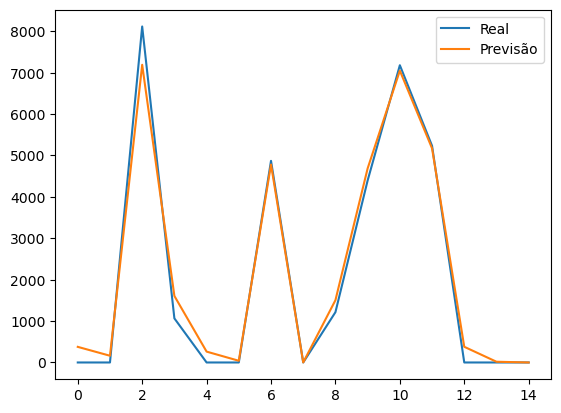

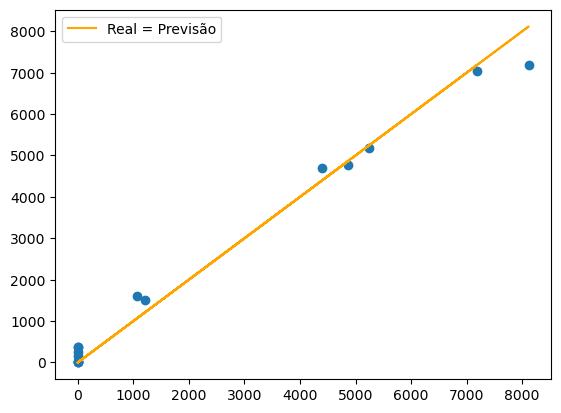

In [1050]:
fotovoltaica_s_previsao = FA.predict(fotovoltaica_e_teste) #testar o modelo
plt.plot(fotovoltaica_s_teste, label='Real') #desenhar os resultados
plt.plot(fotovoltaica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(fotovoltaica_s_teste, fotovoltaica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(fotovoltaica_s_teste, fotovoltaica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [1051]:
MAE = metrics.mean_absolute_error(fotovoltaica_s_teste, fotovoltaica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(fotovoltaica_s_teste - fotovoltaica_s_previsao)
MSE = metrics.mean_squared_error(fotovoltaica_s_teste, fotovoltaica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(fotovoltaica_s_teste, fotovoltaica_s_previsao))
cvRMSE = RMSE / np.mean(fotovoltaica_s_teste)
NMBE = MBE / np.mean(fotovoltaica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['FA'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,2596.800515,-167.636492,8.149526e+06,2854.737548,1.335029,-0.078396
FA,238.004457,-77.187014,1.153389e+05,339.615774,0.158823,-0.036097


#### 4.9.2.4. Perceptron Multicamadas

Utiliza o conceito de neural networks, isto é, entre a camada de entrada e saída existem camadas ocultas que aplicam transformações às variáveis.

In [1052]:
PM = MLPRegressor(hidden_layer_sizes=(5,5,5)) #criar modelo
PM.fit(fotovoltaica_e_treino, fotovoltaica_s_treino) #treinar o modelo

C:\Users\mafal\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


MLPRegressor(hidden_layer_sizes=(5, 5, 5))

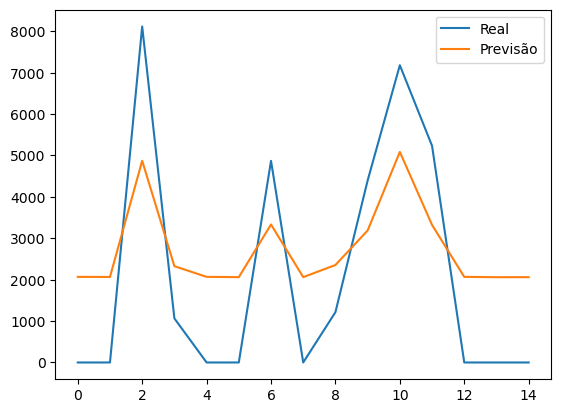

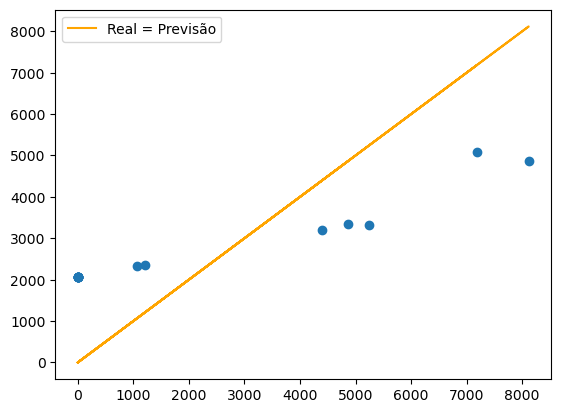

In [1053]:
fotovoltaica_s_previsao = PM.predict(fotovoltaica_e_teste) #testar o modelo
plt.plot(fotovoltaica_s_teste, label='Real') #desenhar os resultados
plt.plot(fotovoltaica_s_previsao, label='Previsão')
plt.legend()
plt.show()
plt.scatter(fotovoltaica_s_teste, fotovoltaica_s_previsao) #comparar se os resultados estão de acordo com a realidade
plt.plot(fotovoltaica_s_teste, fotovoltaica_s_teste, label='Real = Previsão', color='orange')
plt.legend()
plt.show()

In [1054]:
MAE = metrics.mean_absolute_error(fotovoltaica_s_teste, fotovoltaica_s_previsao) #calcular os diferentes parâmetros que avaliam a performance do modelo
MBE = np.mean(fotovoltaica_s_teste - fotovoltaica_s_previsao)
MSE = metrics.mean_squared_error(fotovoltaica_s_teste, fotovoltaica_s_previsao)  
RMSE = np.sqrt(metrics.mean_squared_error(fotovoltaica_s_teste, fotovoltaica_s_previsao))
cvRMSE = RMSE / np.mean(fotovoltaica_s_teste)
NMBE = MBE / np.mean(fotovoltaica_s_teste)
valores = [MAE, MBE, MSE, RMSE, cvRMSE, NMBE] #criar lista com todos os valores e adicionar ao dataframe
performance.loc['PM'] = valores #indicar o método no indíce da linha
performance

,MAE,MBE,MSE,RMSE,cvRMSE,NMBE
A,2596.800515,-167.636492,8.149526e+06,2854.737548,1.335029,-0.078396
FA,238.004457,-77.187014,1.153389e+05,339.615774,0.158823,-0.036097
PM,1927.104979,-594.613332,3.956936e+06,1989.204874,0.930259,-0.278073


#### 4.9.2.5. Guardar Modelo

Com base nos valores obtidos para a performance do modelo, foi selecionado o que apresentou valores mais baixos (menores erros), correspondendo ao Regressor da Floresta Aleatória.

In [1055]:
with open('corvo_fotovoltaica.pkl','wb') as file: #guardar o modelo
    pickle.dump(FA, file)